# Aerosol Experiment 

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import seaborn as sns
from sklearn.linear_model import (
    LinearRegression,
    Ridge,
    Lasso,
    ElasticNet,
    HuberRegressor,
    PassiveAggressiveRegressor,
    RANSACRegressor,
    BayesianRidge,
    SGDRegressor,
    PassiveAggressiveRegressor,
    ElasticNet,
)
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import (
    RandomForestRegressor,
    GradientBoostingRegressor,
    AdaBoostRegressor,
    ExtraTreesRegressor,
    HistGradientBoostingRegressor,
)
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.isotonic import IsotonicRegression
from sklearn.linear_model import OrthogonalMatchingPursuit
from statsmodels.discrete.count_model import ZeroInflatedPoisson
from sklearn.linear_model import TweedieRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.linear_model import LogisticRegression
from statsmodels.regression.quantile_regression import QuantReg
from pygam import LinearGAM
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, RobustScaler, LabelEncoder
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import regularizers
from sklearn.metrics import (
    mean_squared_error,
    r2_score,
    explained_variance_score,
    max_error,
    mean_absolute_error,
    mean_absolute_percentage_error,
)
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
# Remove duplicates from the code
pd = pd
plt = plt
np = np
sklearn = sklearn
sns = sns
LinearRegression = LinearRegression
Ridge = Ridge
Lasso = Lasso
ElasticNet = ElasticNet
HuberRegressor = HuberRegressor
PassiveAggressiveRegressor = PassiveAggressiveRegressor
RANSACRegressor = RANSACRegressor
BayesianRidge = BayesianRidge
SGDRegressor = SGDRegressor
PassiveAggressiveRegressor = PassiveAggressiveRegressor
DecisionTreeRegressor = DecisionTreeRegressor
RandomForestRegressor = RandomForestRegressor
GradientBoostingRegressor = GradientBoostingRegressor
AdaBoostRegressor = AdaBoostRegressor
ExtraTreesRegressor = ExtraTreesRegressor
HistGradientBoostingRegressor = HistGradientBoostingRegressor
XGBRegressor = XGBRegressor
SVR = SVR
KNeighborsRegressor = KNeighborsRegressor
GaussianProcessRegressor = GaussianProcessRegressor
IsotonicRegression = IsotonicRegression
OrthogonalMatchingPursuit = OrthogonalMatchingPursuit
ZeroInflatedPoisson = ZeroInflatedPoisson
TweedieRegressor = TweedieRegressor
AdaBoostRegressor = AdaBoostRegressor
LogisticRegression = LogisticRegression
QuantReg = QuantReg
LinearGAM = LinearGAM
SimpleImputer = SimpleImputer
OneHotEncoder = OneHotEncoder
RobustScaler = RobustScaler
LabelEncoder = LabelEncoder
tf = tf
EarlyStopping = EarlyStopping
LearningRateScheduler = LearningRateScheduler
Dense = Dense
Dropout = Dropout
regularizers = regularizers
mean_squared_error = mean_squared_error
r2_score = r2_score
explained_variance_score = explained_variance_score
max_error = max_error
mean_absolute_error = mean_absolute_error
mean_absolute_percentage_error = mean_absolute_percentage_error


# Data_validation  and Cleaning 

In [6]:
train_df = pd.read_csv(r'D:\csv data preprocessing\artifacts\ML_model_artifacts_06112023__160957\data_ingestion\dataset\Train.csv')
test_df= pd.read_csv(r'D:\csv data preprocessing\artifacts\ML_model_artifacts_06112023__160957\data_ingestion\dataset\Test.csv')


train_df.columns

Index(['Sheath MFC', 'Sheath Pressure', 'Pneum. Atomizer MFC',
       'Pneum. Atomizer Press.', 'Pneum. Impactor Exhaust MFC',
       'Pneum. Impactor Exhaust Press.', 'Platen Heater', 'Ink', 'Ink_temp',
       'Print_speed', 'SPC', 'Viscosity', 'Surface Tension', 'Density',
       'Line'],
      dtype='object')

In [7]:
train_df= train_df.drop(['Sheath Pressure' , 'Pneum. Atomizer Press.' , 'Pneum. Impactor Exhaust Press.' , 'Ink'], axis=1)
test_df= test_df.drop(['Sheath Pressure' , 'Pneum. Atomizer Press.' , 'Pneum. Impactor Exhaust Press.' , 'Ink'], axis=1)

#pip install python-docx

In [8]:
from pandas.plotting import table
# Assuming you have a DataFrame called 'train_df'
description = test_df.describe().T


In [9]:
description

,count,mean,std,min,25%,50%,75%,max
Sheath MFC,302.0,78.105960,14.381906,59.0,69.00,79.0,89.000,99.000
Pneum. Atomizer MFC,302.0,645.043046,304.562190,115.0,394.25,649.5,918.000,1148.000
Pneum. Impactor Exhaust MFC,302.0,604.983444,303.115248,93.0,341.00,593.0,893.000,1094.000
Platen Heater,302.0,70.217550,0.334291,69.2,70.20,70.2,70.500,71.400
Ink_temp,302.0,30.009934,0.099337,30.0,30.00,30.0,30.000,31.000
Print_speed,302.0,0.433775,0.496417,0.0,0.00,0.0,1.000,1.000
SPC,302.0,50.000000,0.000000,50.0,50.00,50.0,50.000,50.000
Viscosity,302.0,240.000000,0.000000,240.0,240.00,240.0,240.000,240.000
Surface Tension,302.0,32.000000,0.000000,32.0,32.00,32.0,32.000,32.000
Density,302.0,2.000000,0.000000,2.0,2.00,2.0,2.000,2.000


In [60]:
data = pd.concat([train_df , test_df])

In [63]:
data.corr  () 

,Sheath MFC,Sheath Pressure,Pneum. Atomizer MFC,Pneum. Atomizer Press.,Pneum. Impactor Exhaust MFC,Pneum. Impactor Exhaust Press.,Platen Heater,Ink_temp,Print_speed,SPC,Viscosity,Surface Tension,Density,Line
Sheath MFC,1.000000,0.729629,-0.041452,0.023725,-0.036225,0.474301,0.074833,0.230560,-0.013860,-0.044323,0.011486,0.059282,-0.039749,-0.173463
Sheath Pressure,0.729629,1.000000,0.048720,0.052107,0.026256,0.635281,0.100519,-0.022670,-0.005837,0.040398,0.124424,0.008622,-0.131845,-0.139325
Pneum. Atomizer MFC,-0.041452,0.048720,1.000000,0.744497,0.998579,-0.489055,-0.005252,-0.007160,0.347216,-0.032896,-0.040459,0.021247,0.031531,0.699637
Pneum. Atomizer Press.,0.023725,0.052107,0.744497,1.000000,0.743787,-0.363665,0.008267,-0.325502,0.094360,0.065763,0.293052,0.056073,-0.327395,0.459598
Pneum. Impactor Exhaust MFC,-0.036225,0.026256,0.998579,0.743787,1.000000,-0.503227,-0.006513,-0.000143,0.346103,-0.035358,-0.044167,0.022521,0.034739,0.698948
Pneum. Impactor Exhaust Press.,0.474301,0.635281,-0.489055,-0.363665,-0.503227,1.000000,0.096477,0.115922,-0.193150,0.052839,0.075666,-0.029168,-0.063952,-0.394899
Platen Heater,0.074833,0.100519,-0.005252,0.008267,-0.006513,0.096477,1.000000,-0.067353,0.031437,-0.099806,-0.170786,0.042152,0.155515,0.014263
Ink_temp,0.230560,-0.022670,-0.007160,-0.325502,-0.000143,0.115922,-0.067353,1.000000,0.110658,-0.285573,-0.507050,0.112070,0.467878,0.093840
Print_speed,-0.013860,-0.005837,0.347216,0.094360,0.346103,-0.193150,0.031437,0.110658,1.000000,0.129800,-0.215789,-0.258215,0.343366,0.424511
SPC,-0.044323,0.040398,-0.032896,0.065763,-0.035358,0.052839,-0.099806,-0.285573,0.129800,1.000000,0.616603,-0.930744,-0.194348,-0.027745


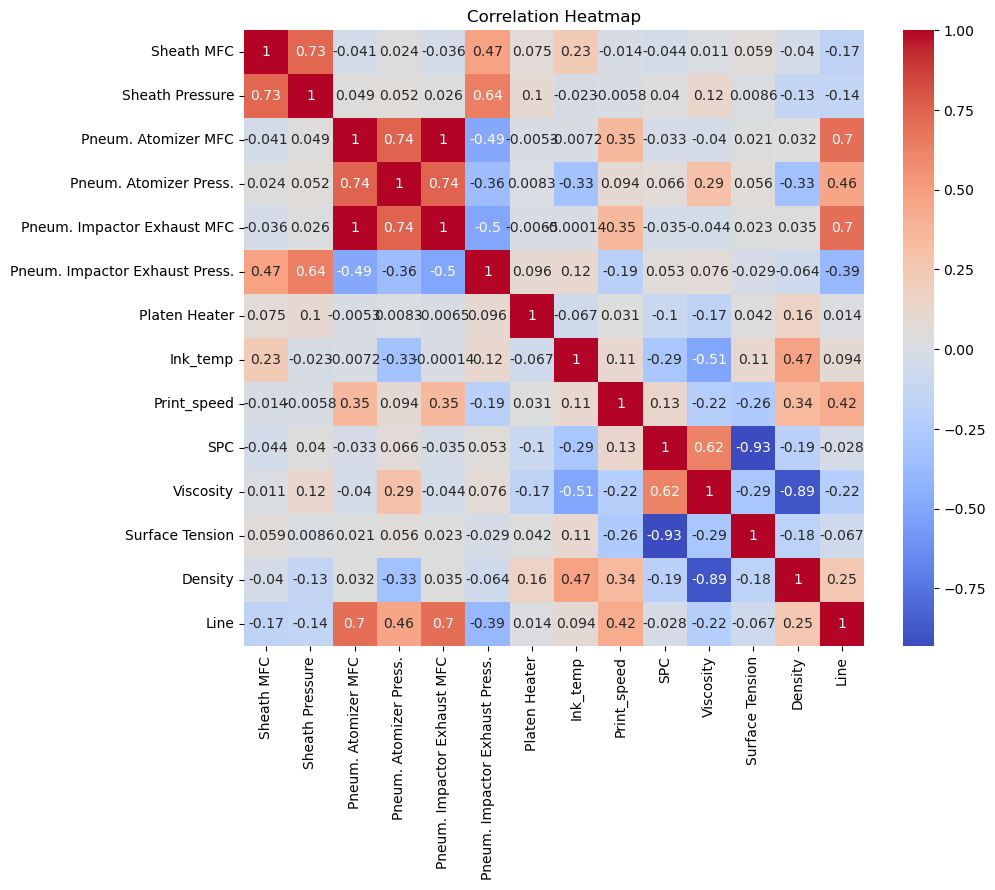

In [61]:
# Heatmap of correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [59]:
train_df.duplicated().sum()
test_df.duplicated().sum()

0

In [10]:

encoder = LabelEncoder()
train_df['Ink'] = encoder.fit_transform(train_df['Ink'])
test_df['Ink'] = encoder.transform(test_df['Ink'])

test_df


KeyError: 'Ink'

In [28]:
from sklearn.preprocessing import StandardScaler




X_train = train_df.drop('Line', axis=1)
y_train = train_df['Line']

X_test = test_df.drop('Line', axis=1)
y_test = test_df['Line']


# Split the data into training and test sets
#X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.3, stratify=X_test[['Viscosity' ,'Print_speed']])


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
#X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)




In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, max_error
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.isotonic import IsotonicRegression
from sklearn.kernel_ridge import KernelRidge
import xgboost as xgb
import lightgbm as lgb
import catboost as cb




# Create the individual regressor models with hyperparameters
models = [
    KNeighborsRegressor(),
    DecisionTreeRegressor(),
    ExtraTreesRegressor(n_estimators=100, max_depth=10, random_state=42),
    RandomForestRegressor(bootstrap=True, max_features=0.5,
                                          min_samples_leaf=20, min_samples_split=14, n_estimators=100),
    AdaBoostRegressor(n_estimators=100, random_state=42),
    GradientBoostingRegressor(n_estimators=100, max_depth=3, random_state=42),
    KernelRidge(),
    xgb.XGBRegressor(n_estimators=100, max_depth=3, random_state=42),
    lgb.LGBMRegressor(n_estimators=100, max_depth=3, random_state=42),
    cb.CatBoostRegressor(n_estimators=100, max_depth=3, silent=True, random_state=42)
]

# Fit the models and make predictions
model_names = []
train_scores = []
test_scores = []
model_predictions = []

for model in models:
    model.fit(X_train_scaled, y_train)
    model_name = type(model).__name__
    model_names.append(model_name)
    train_score = model.score(X_train_scaled, y_train)
    train_scores.append(train_score)
    model_predictions.append(model.predict(X_test_scaled))

    # Calculate the evaluation metrics on the test set
    mse = mean_squared_error(y_test, model_predictions[-1])
    r2 = r2_score(y_test, model_predictions[-1])
    evs = explained_variance_score(y_test, model_predictions[-1])
    max_err = max_error(y_test, model_predictions[-1])
    test_score = r2

    print(f"Model: {model_name}")
    print(f"Train Score: {train_score}")
    print(f"Test Score: {test_score}")
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"R-squared (R2) Score: {r2}")
    print(f"Explained Variance Score (EVS): {evs}")
    print(f"Max Error: {max_err}")
    print()

    # Append the test score
    test_scores.append(test_score)

# Plot the train and test scores
plt.figure(figsize=(10, 6))
plt.bar(model_names, train_scores, alpha=0.5, label='Train')
plt.bar(model_names, test_scores, alpha=0.5, label='Test')
plt.xlabel('Models')
plt.ylabel('R-squared (R2) Score')
plt.title('Train and Test Scores')
plt.xticks(rotation=90)
plt.legend()
plt.show()

# Plot the predicted values against the actual values for each model
for model_name, y_pred in zip(model_names, model_predictions):
    plt.scatter(y_test, y_pred, alpha=0.5, label=model_name)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()


NameError: name 'X_train_scaled' is not defined

In [ ]:
import numpy as np
from sklearn.preprocessing import MaxAbsScaler, PolynomialFeatures
from sklearn.kernel_approximation import RBFSampler
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.pipeline import make_pipeline

# Create the pipeline
model = make_pipeline(
    MaxAbsScaler(),
    PolynomialFeatures(degree=2, include_bias=False, interaction_only=False),
    RBFSampler(gamma=0.2),
    ExtraTreesRegressor(
        bootstrap=False,
        max_features=0.6500000000000001,
        min_samples_leaf=1,
        min_samples_split=2,
        n_estimators=100
    )
)

# Print the pipeline
print(model)


In [ ]:
model.fit(X_train_scaled, y_train)
model_name = type(model).__name__
model_names.append(model_name)
train_score = model.score(X_train_scaled, y_train)
train_scores.append(train_score)
model_predictions.append(model.predict(X_test_scaled))

# Calculate the evaluation metrics on the test set
mse = mean_squared_error(y_test, model_predictions[-1])
r2 = r2_score(y_test, model_predictions[-1])
evs = explained_variance_score(y_test, model_predictions[-1])
max_err = max_error(y_test, model_predictions[-1])
test_score = r2

print(f"Model: {model_name}")
print(f"Train Score: {train_score}")
print(f"Test Score: {test_score}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R2) Score: {r2}")
print(f"Explained Variance Score (EVS): {evs}")
print(f"Max Error: {max_err}")
print()

# Append the test score
test_scores.append(test_score)

# Plot the train and test scores
plt.figure(figsize=(10, 6))
plt.bar(model_names, train_scores, alpha=0.5, label='Train')
plt.bar(model_names, test_scores, alpha=0.5, label='Test')
plt.xlabel('Models')
plt.ylabel('R-squared (R2) Score')
plt.title('Train and Test Scores')
plt.xticks(rotation=90)
plt.legend()
plt.show()


In [9]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import regularizers
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

X_train = train_df.drop('Line', axis=1)
y_train = train_df['Line']

X_test = test_df.drop('Line', axis=1)
y_test = test_df['Line']


# Split the data into training and test sets
#X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.3, stratify=X_test[['Viscosity' ,'Print_speed']])


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)



model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(64, activation='relu', 
                          kernel_regularizer=regularizers.orthogonal_regularizer(0.01), input_shape=(10,)),
    
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(128, activation='relu', 
                          kernel_regularizer=regularizers.orthogonal_regularizer(0.01)),
    
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(128, activation='relu',
                          kernel_regularizer=regularizers.orthogonal_regularizer(0.01)),
    tf.keras.layers.Dropout(0.3),
    


    tf.keras.layers.Dense(64, activation='relu', 
                          kernel_regularizer=regularizers.orthogonal_regularizer(0.01)),
    
    tf.keras.layers.Dense(1)
])

# Compile the model
optimizer = tf.keras.optimizers.RMSprop()
model.compile(optimizer=optimizer, loss='mean_squared_error')


early_stop = EarlyStopping(monitor='val_loss',patience=10 , restore_best_weights=True)

#lr_scheduler = LearningRateScheduler(lr_scheduler)

# Train the model
history = model.fit(
    X_train_scaled, y_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val_scaled, y_val),
    callbacks=[early_stop]
)

# Predict on the test set
mse = model.evaluate(X_test_scaled, y_test)
y_pred = model.predict(X_test_scaled)

# Calculate R2 score for training set
r2_train = r2_score(y_train, model.predict(X_train_scaled))

# Calculate R2 score for test set
r2_test = r2_score(y_test, y_pred)

# Adjusted R2 score for test set
n = len(X_test1)
p = X_test.shape[1]
adj_r2_test = 1 - ((1 - r2_test) * (n - 1)) / (n - p - 1)
mae = mean_absolute_error(y_test, y_pred)

# Calculate MAPE
mape = mean_absolute_percentage_error(y_test, y_pred)

# Print the evaluation metrics
print('Mean Squared Error (MSE):', mse)
print('R2 Score - Training Set:', r2_train)
print('R2 Score - Test Set:', r2_test)
print('Adjusted R2 Score - Test Set:', adj_r2_test)
print('Mean Absolute Error (MAE):', mae)


# Calculate feature importance
weights = model.layers[0].get_weights()[0]
importance_scores = np.abs(weights).mean(axis=1)

# Plot the feature importance
plt.bar(range(len(importance_scores)), importance_scores)
plt.xlabel('Feature Index')
plt.ylabel('Importance Score')
plt.title('Feature Importance')
plt.show()

# Plot the true vs predicted graph
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred)
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs Predicted Values')
plt.show()

# Plot the training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Save the model
#model.save('model_aerosol_neural_rms_prop.h5')





NameError: name 'X_val' is not defined

In [5]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import regularizers
from sklearn.metrics import r2_score, mean_absolute_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
import numpy as np
import os 
from sklearn.preprocessing import StandardScaler

X_train = train_df.drop('Line', axis=1)
y_train = train_df['Line']

X_test = test_df.drop('Line', axis=1)
y_test = test_df['Line']


# Split the data into training and test sets
#X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.2, stratify=X_test[['Viscosity' ,'Print_speed']])


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
#X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

experiment_df = pd.DataFrame() 
def run_experiment(experiment_name, X_train_scaled, y_train, X_val_scaled, y_val, X_test_scaled, y_test,
                    batch_size=None, dropout_rate=None,
                   optimizer=None, learning_rate=None, lr_scheduler=None,
                   best_model_weights=None):

    tf.random.set_seed(42)

    model = tf.keras.models.Sequential([
        tf.keras.layers.Dense(256, activation='relu',input_shape=(10,)),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(1)
    ])

    if optimizer == 'Nadam':
        opt = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    elif optimizer == 'Adam':
        opt = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer == 'SGD':
        opt = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimizer == 'rms':
        opt = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        raise ValueError('Invalid optimizer')

    model.compile(optimizer=opt, loss='mean_squared_error')

    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    callbacks = [early_stop]
    if lr_scheduler is not None:
        callbacks.append(LearningRateScheduler(lr_scheduler))

    if best_model_weights is not None:
        model.load_weights(best_model_weights)

    history = model.fit(
        X_train_scaled, y_train,
        epochs=200,
        batch_size=batch_size,
        validation_data=(X_val_scaled, y_val),
        callbacks=callbacks
    )

   
    mse_train = model.evaluate(X_train_scaled , y_train)
    print('MSE_Train :', mse_train)
    mse = model.evaluate(X_test_scaled, y_test)
    print('MSE_Test :', mse)
    y_pred = model.predict(X_test_scaled)

    r2_train = r2_score(y_train, model.predict(X_train_scaled))
    r2_test = r2_score(y_test, y_pred)
    n = len(X_test_scaled)
    p = X_test_scaled.shape[1]
    adj_r2_test = 1 - ((1 - r2_test) * (n - 1)) / (n - p - 1)
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    

    #input_layer = model.layers[0]
    #input_feature_names = list(input_layer.get_config()['batch_input_shape'][1:])
    
    weights = model.layers[0].get_weights()[0]
    importance_scores = np.abs(weights).mean(axis=1)

    # Plot the feature importance scores
    plt.bar(range(len(importance_scores)), importance_scores)
    plt.xlabel('Feature Index')
    plt.ylabel('Importance Score')
    plt.title('Feature Importance')
    


    plt.show()

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred)
    plt.xlabel('True Values')
    plt.ylabel('Predicted Values')
    plt.title('True vs Predicted Values')
    plt.show()
    
    
    a = plt.axes(aspect='equal')
    plt.scatter(y_test , y_pred)
    plt.xlabel('True Values ')
    plt.ylabel('Predictions')
    lims = [0, 0.150]
    plt.xlim(lims)
    plt.ylim(lims)
    _ = plt.plot(lims, lims)


    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()
     #Specify the directory to save the model
    save_dir = "models"

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Save the model
    model.save(os.path.join(save_dir, f'{experiment_name}_{optimizer}_{mse}.h5'))
    model.save(f'{experiment_name}_{optimizer}_{mse}.h5')

    experiment_results = {
        'Experiment Name': experiment_name,
        'Optimizer': optimizer,
        'Learning Rate': learning_rate,
        'Batch Size': batch_size,
        'Dropout Rate': dropout_rate,
        'MSE': mse,
        'RMSE':rmse,
        'R2 Score (Training Set)': r2_train,
        'R2 Score (Test Set)': r2_test,
        'Adjusted R2 Score (Test Set)': adj_r2_test,
        'MAE': mae,
  
    }
    global experiment_df
    if experiment_df is None:
        experiment_df = pd.DataFrame([experiment_results])
    else:
        experiment_df = experiment_df.append(experiment_results, ignore_index=True)
        experiment_df = experiment_df.sort_values(by=['MSE', 'R2 Score (Test Set)'], ascending=[True, False])
        # Save updated experiment DataFrame to CSV file
        experiment_df.to_csv('experiment_results_.csv', index=False)
        
    return experiment_df

# Example usage with learning rate scheduler
def lr_scheduler(epoch, lr):
    if epoch < 50:
        return lr
    else:
        return lr * tf.math.exp(-0.1)





Epoch 1/200
59/59 [==============================] - 2s 19ms/step - loss: 3.8546e-04 - val_loss: 7.0304e-05 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 1s 15ms/step - loss: 4.0490e-04 - val_loss: 8.8161e-05 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 1s 15ms/step - loss: 3.5817e-04 - val_loss: 1.9283e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 1s 16ms/step - loss: 3.2088e-04 - val_loss: 5.8132e-05 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 1s 15ms/step - loss: 3.1735e-04 - val_loss: 1.3859e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 1s 15ms/step - loss: 3.1906e-04 - val_loss: 9.2857e-05 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 1s 15ms/step - loss: 3.4592e-04 - val_loss: 5.1812e-05 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 1s 15ms/step - loss: 3.7888e-04 - val_loss: 7.8031e-05 - lr: 0.0100
Epoch 9/200
59/59 [=============

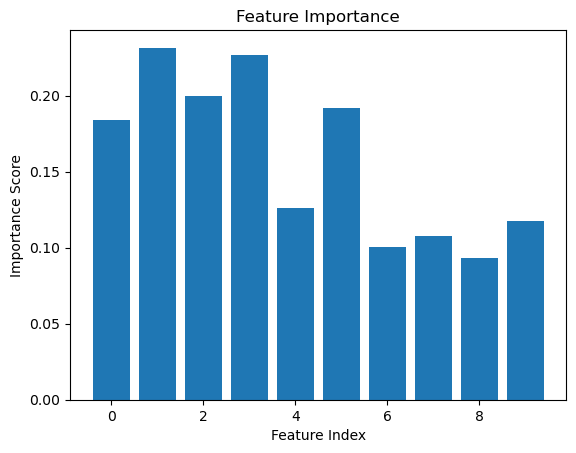

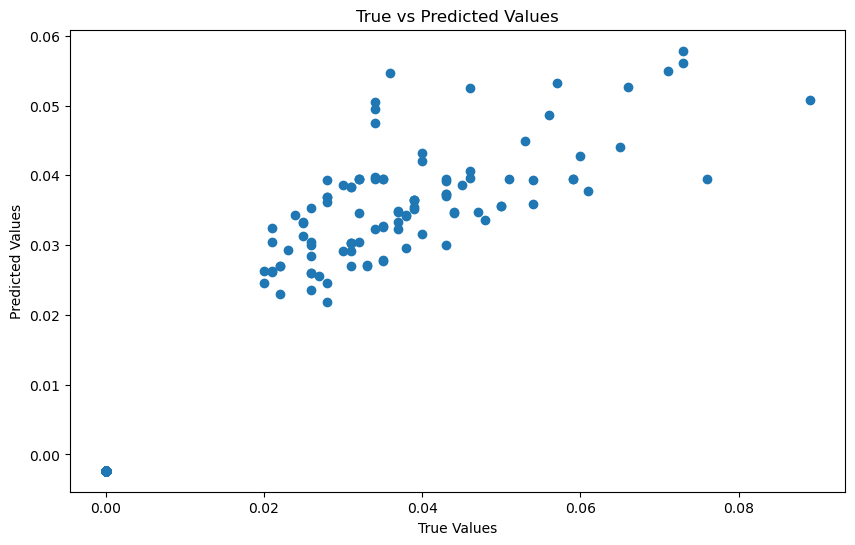

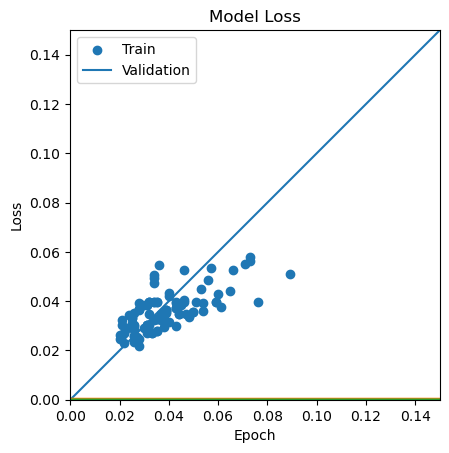

In [147]:
best_model = r'model_Final_1_Adam_4.171014006715268e-05.h5'
experiments = run_experiment('model_Final_6_a', X_train_scaled, y_train, X_val_scaled, y_val, X_test_scaled, y_test,
               batch_size=32, dropout_rate=0.1,
                   optimizer='Adam', learning_rate=0.01, lr_scheduler=lr_scheduler,
                   best_model_weights=best_model)

In [148]:
experiments

,Experiment Name,Optimizer,Learning Rate,Batch Size,Dropout Rate,MSE,RMSE,R2 Score (Training Set),R2 Score (Test Set),Adjusted R2 Score (Test Set),MAE
0,model_Final_6_a,Adam,0.01,32,0.1,0.00005,0.007046,0.709871,0.887616,0.88273,0.004776


experiments

Epoch 1/200
118/118 [==============================] - 6s 31ms/step - loss: 9.3183e-04 - val_loss: 3.7363e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 3s 29ms/step - loss: 3.2277e-04 - val_loss: 4.7712e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 4s 32ms/step - loss: 2.8821e-04 - val_loss: 8.7194e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 4s 32ms/step - loss: 2.6324e-04 - val_loss: 7.1327e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 4s 31ms/step - loss: 2.5599e-04 - val_loss: 0.0011 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 3s 29ms/step - loss: 2.5427e-04 - val_loss: 9.4804e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 3s 29ms/step - loss: 2.4002e-04 - val_loss: 0.0011 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 3s 28ms/step - loss: 2.2588e-04 - val_loss: 0.0012 - lr: 1.0000e

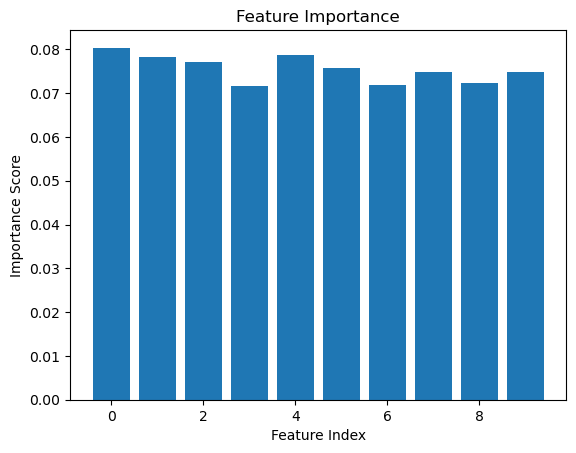

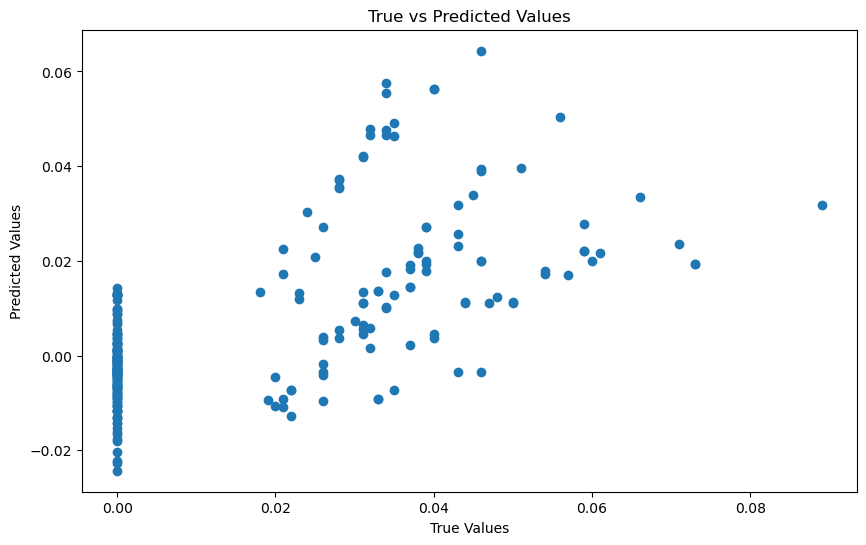

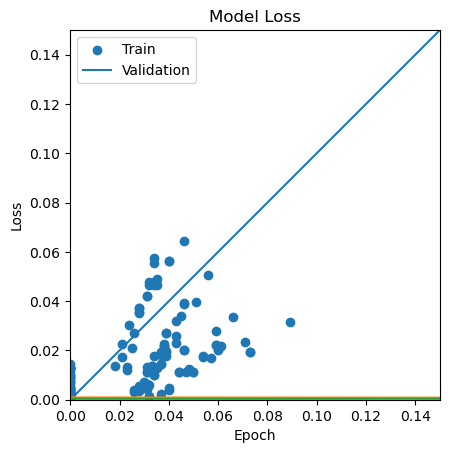

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 7s 37ms/step - loss: 0.0034 - val_loss: 5.1031e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 4s 31ms/step - loss: 0.0013 - val_loss: 1.8925e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 4s 30ms/step - loss: 9.6859e-04 - val_loss: 2.2588e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 4s 31ms/step - loss: 7.5779e-04 - val_loss: 3.1336e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 4s 30ms/step - loss: 6.3437e-04 - val_loss: 2.7580e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 4s 30ms/step - loss: 6.2902e-04 - val_loss: 1.9879e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 4s 30ms/step - loss: 6.0578e-04 - val_loss: 2.2768e-04 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 4s 30ms/step - loss: 5.6708e-04 - val_loss: 1.9478e-04 - lr: 1.0

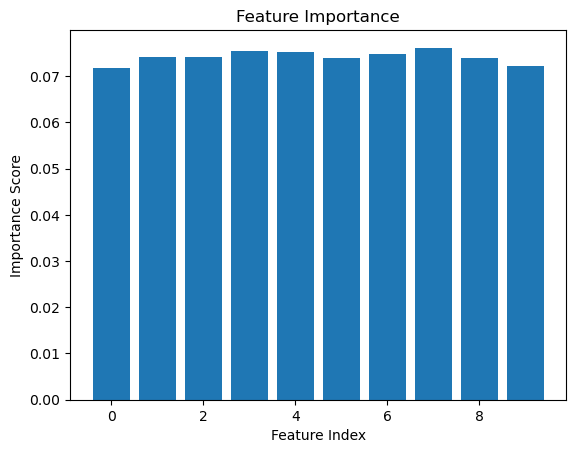

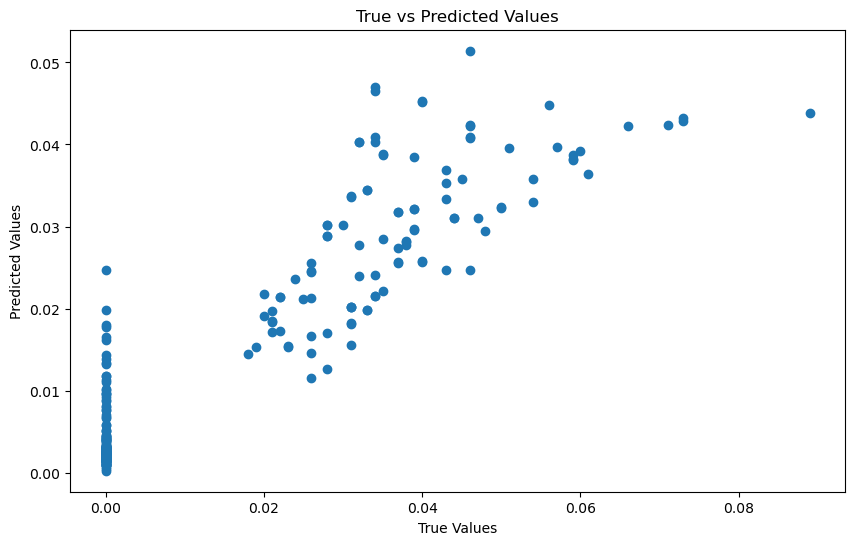

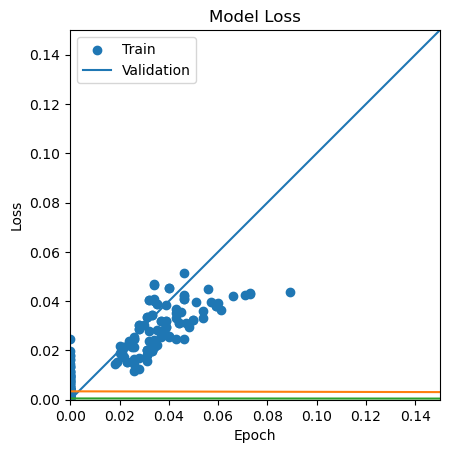

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 34ms/step - loss: 0.0047 - val_loss: 2.3024e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 4s 34ms/step - loss: 0.0018 - val_loss: 2.0728e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 4s 34ms/step - loss: 0.0014 - val_loss: 2.4346e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 4s 32ms/step - loss: 0.0010 - val_loss: 2.5588e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 4s 31ms/step - loss: 8.9254e-04 - val_loss: 2.1291e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 4s 33ms/step - loss: 8.0532e-04 - val_loss: 1.8139e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 4s 33ms/step - loss: 7.2923e-04 - val_loss: 1.8497e-04 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 4s 31ms/step - loss: 6.5159e-04 - val_loss: 2.3663e-04 - lr: 1.0000e-04


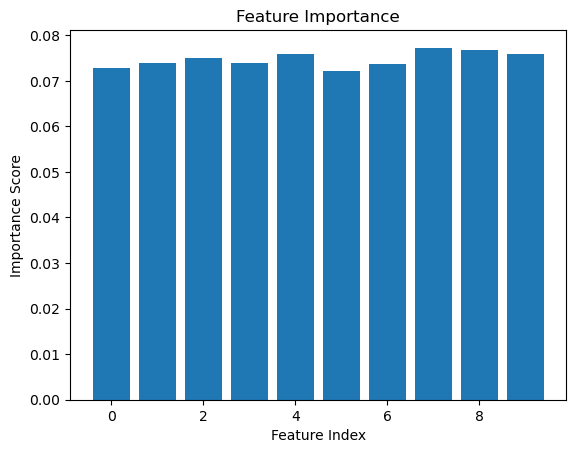

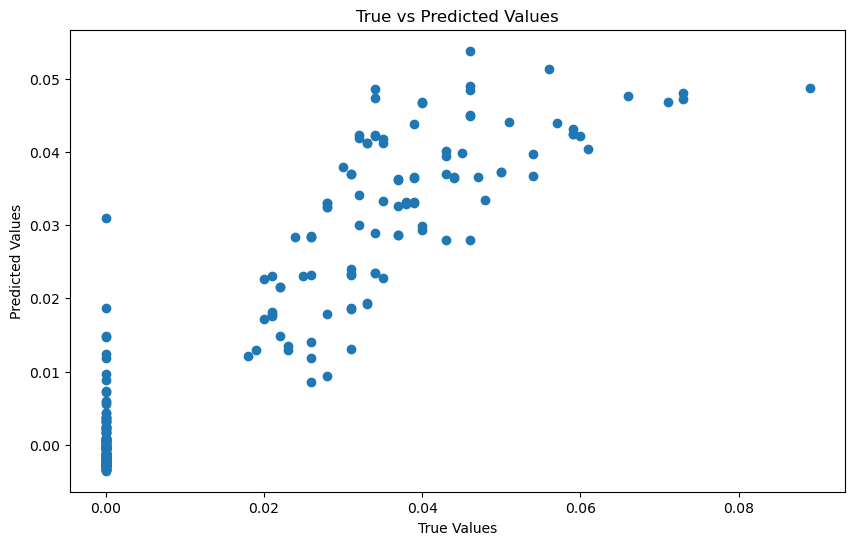

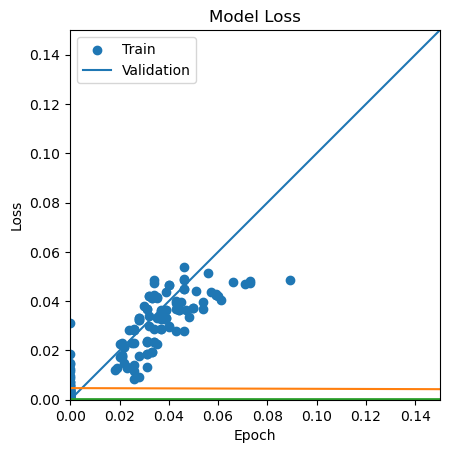

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 10s 43ms/step - loss: 0.0060 - val_loss: 3.2425e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 5s 40ms/step - loss: 0.0027 - val_loss: 2.8010e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 5s 39ms/step - loss: 0.0018 - val_loss: 2.5163e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 5s 40ms/step - loss: 0.0014 - val_loss: 1.8280e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 4s 37ms/step - loss: 0.0011 - val_loss: 1.8323e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 5s 40ms/step - loss: 0.0011 - val_loss: 1.2396e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 4s 38ms/step - loss: 9.2458e-04 - val_loss: 1.3686e-04 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 5s 39ms/step - loss: 8.4538e-04 - val_loss: 1.2573e-04 - lr: 1.0000e-04
Epoch 9

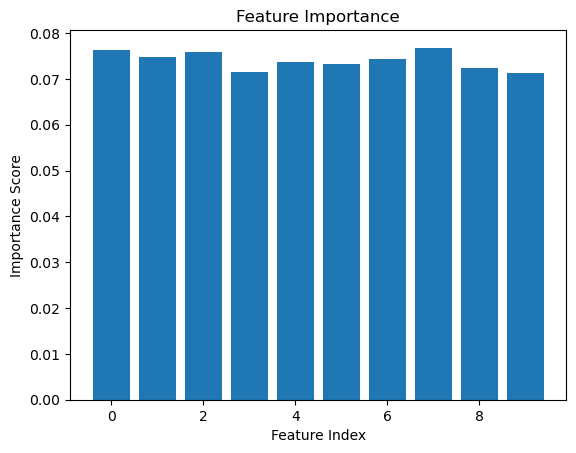

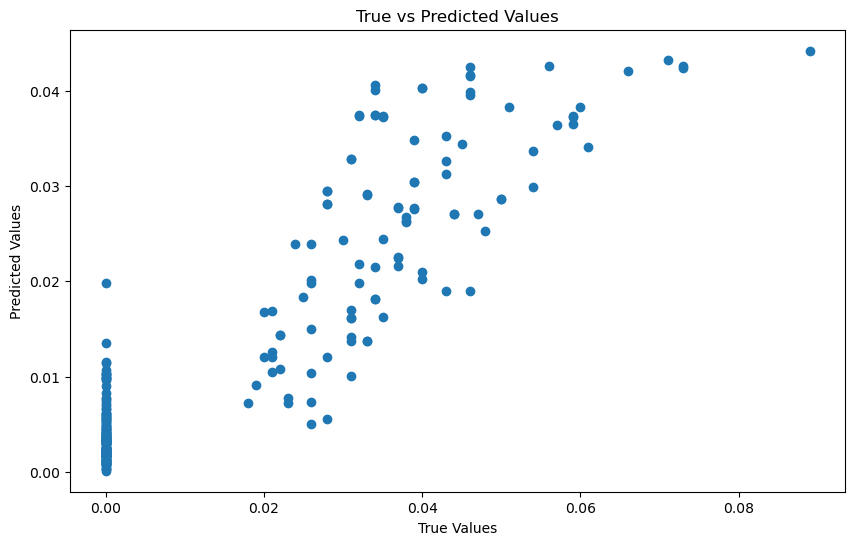

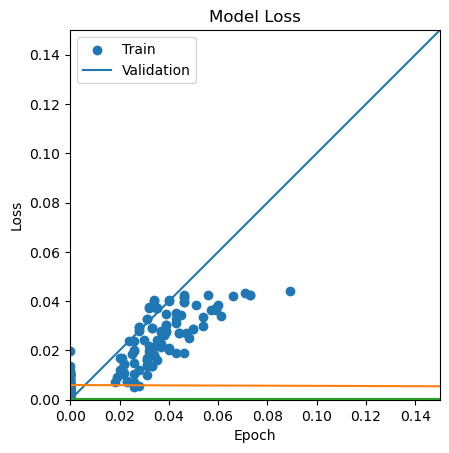

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 7s 45ms/step - loss: 5.4240e-04 - val_loss: 6.0052e-04 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 2s 37ms/step - loss: 3.1633e-04 - val_loss: 5.0956e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 2s 35ms/step - loss: 2.8261e-04 - val_loss: 5.9012e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 2s 39ms/step - loss: 2.5740e-04 - val_loss: 6.1646e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 2s 39ms/step - loss: 2.5195e-04 - val_loss: 3.9777e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 2s 37ms/step - loss: 2.4012e-04 - val_loss: 5.8039e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 2s 38ms/step - loss: 2.3248e-04 - val_loss: 4.9145e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 2s 38ms/step - loss: 2.1346e-04 - val_loss: 7.5842e-04 - lr: 1.0000e-04


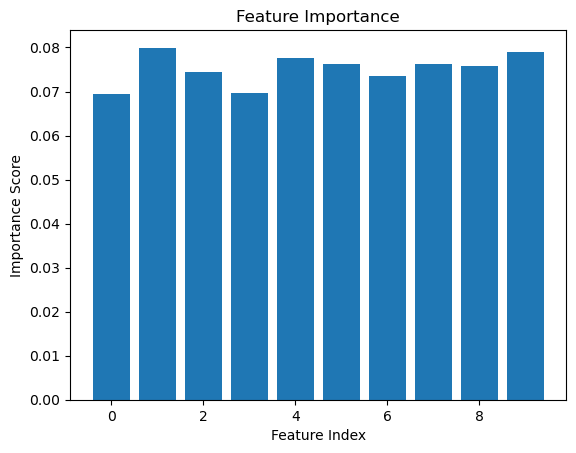

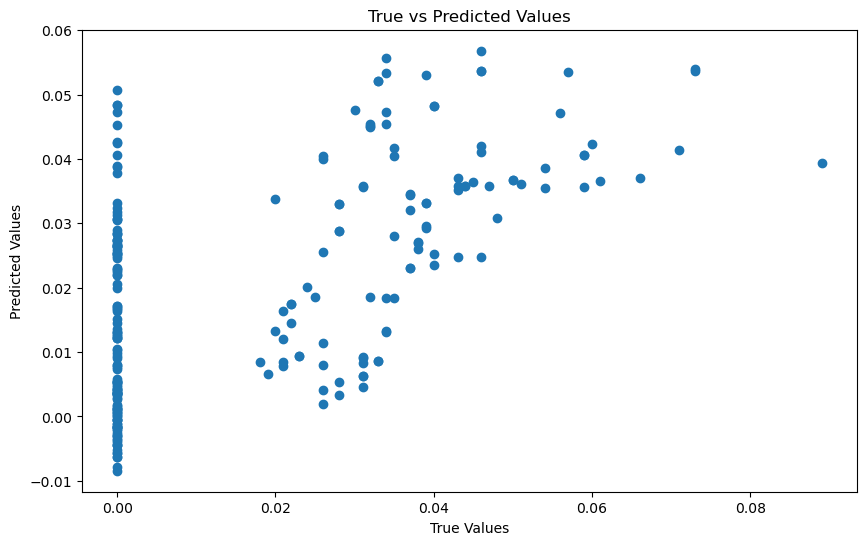

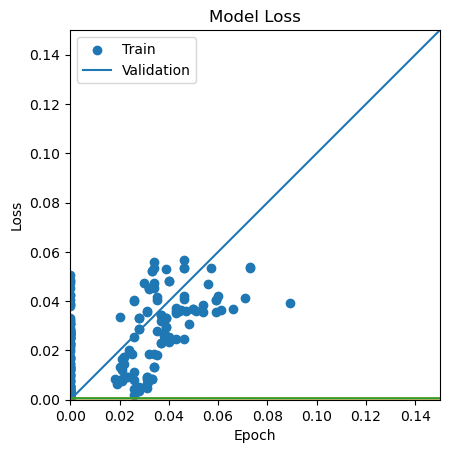

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 7s 50ms/step - loss: 0.0033 - val_loss: 6.1433e-04 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 3s 47ms/step - loss: 0.0016 - val_loss: 5.4818e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 2s 40ms/step - loss: 0.0012 - val_loss: 1.9860e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 2s 39ms/step - loss: 9.0887e-04 - val_loss: 1.5069e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 2s 40ms/step - loss: 7.6605e-04 - val_loss: 1.1848e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 3s 43ms/step - loss: 7.6659e-04 - val_loss: 1.0468e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 2s 36ms/step - loss: 7.2410e-04 - val_loss: 1.0115e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 2s 35ms/step - loss: 6.3223e-04 - val_loss: 1.0275e-04 - lr: 1.0000e-04
Epoch 9/200


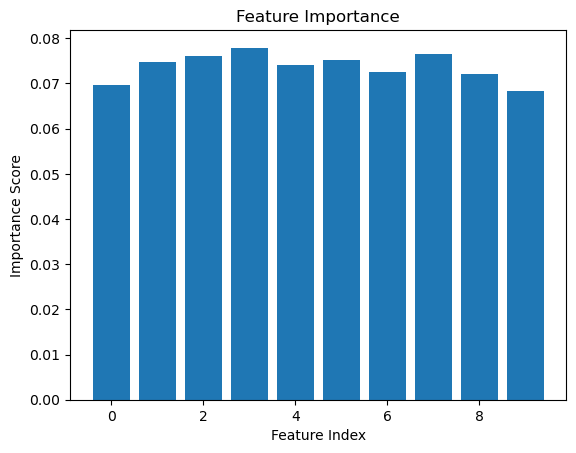

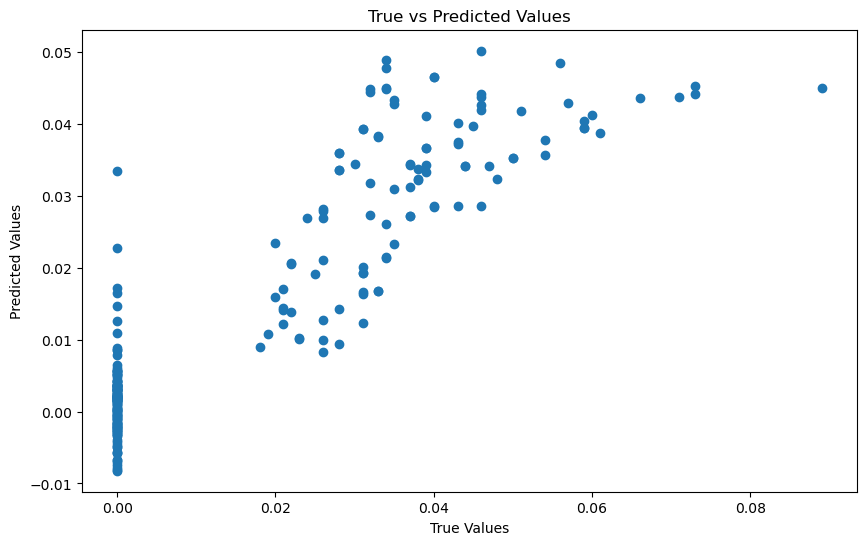

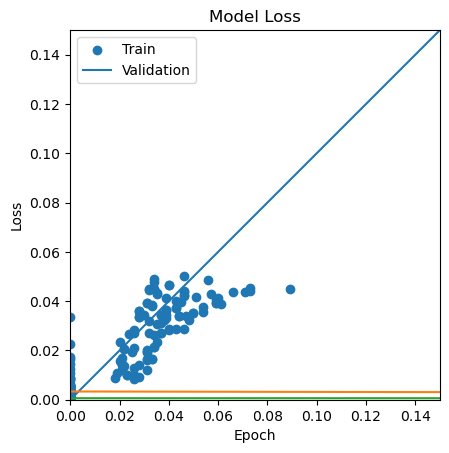

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 35ms/step - loss: 0.0068 - val_loss: 0.0021 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 2s 31ms/step - loss: 0.0023 - val_loss: 8.4003e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 2s 32ms/step - loss: 0.0016 - val_loss: 5.2936e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 2s 31ms/step - loss: 0.0013 - val_loss: 3.5622e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 2s 31ms/step - loss: 0.0011 - val_loss: 2.3348e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 2s 31ms/step - loss: 0.0011 - val_loss: 1.7862e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 2s 31ms/step - loss: 9.5078e-04 - val_loss: 1.9947e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 2s 30ms/step - loss: 8.9427e-04 - val_loss: 1.8172e-04 - lr: 1.0000e-04
Epoch 9/200
59/59 [=========

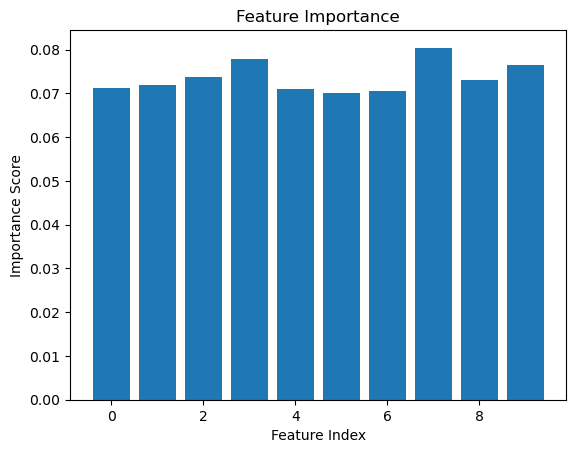

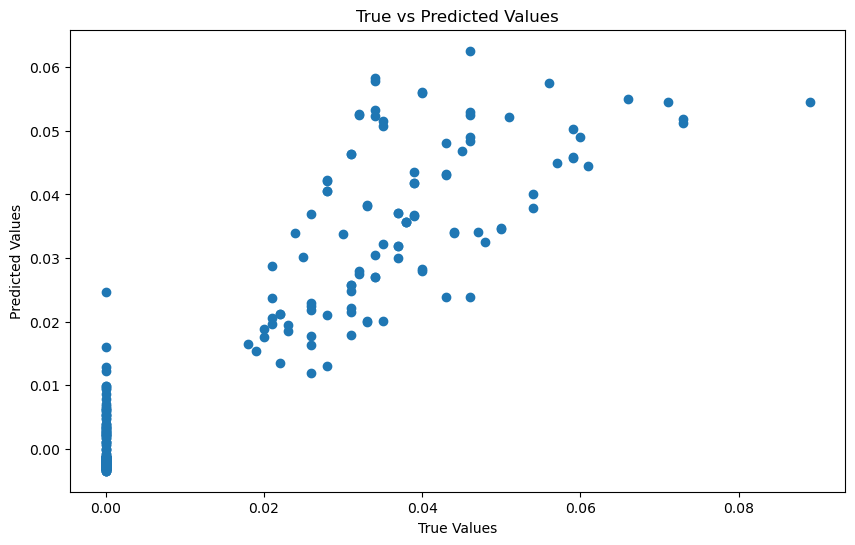

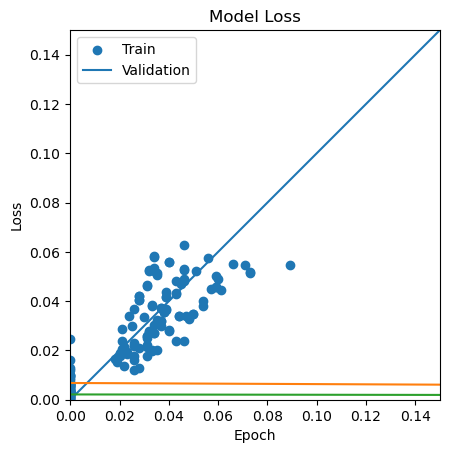

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 5s 38ms/step - loss: 0.0066 - val_loss: 0.0013 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 2s 33ms/step - loss: 0.0038 - val_loss: 5.0280e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 2s 35ms/step - loss: 0.0023 - val_loss: 3.9592e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 2s 33ms/step - loss: 0.0020 - val_loss: 4.6284e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 2s 35ms/step - loss: 0.0016 - val_loss: 4.3554e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 2s 33ms/step - loss: 0.0014 - val_loss: 3.7583e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 2s 32ms/step - loss: 0.0013 - val_loss: 3.5639e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 2s 35ms/step - loss: 0.0012 - val_loss: 3.8037e-04 - lr: 1.0000e-04
Epoch 9/200
59/59 [=================

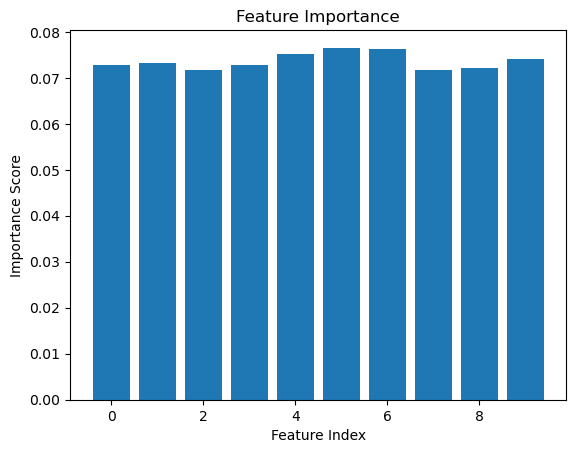

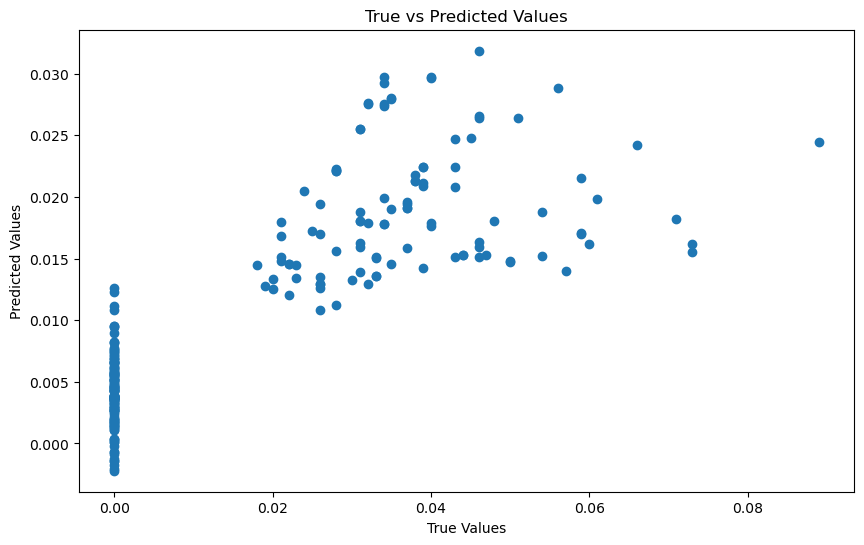

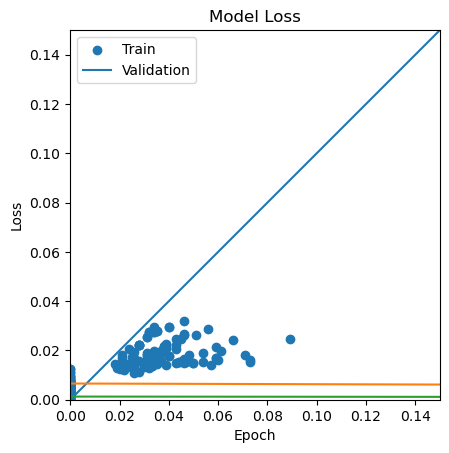

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 41ms/step - loss: 5.4417e-04 - val_loss: 1.8102e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 31ms/step - loss: 3.2021e-04 - val_loss: 2.8009e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 31ms/step - loss: 2.8225e-04 - val_loss: 2.3597e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 30ms/step - loss: 2.7190e-04 - val_loss: 2.5476e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 30ms/step - loss: 2.5588e-04 - val_loss: 2.0719e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 29ms/step - loss: 2.4946e-04 - val_loss: 2.7070e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 31ms/step - loss: 2.4015e-04 - val_loss: 2.7207e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 30ms/step - loss: 2.1995e-04 - val_loss: 2.4957e-04 - lr: 1.0000e-04


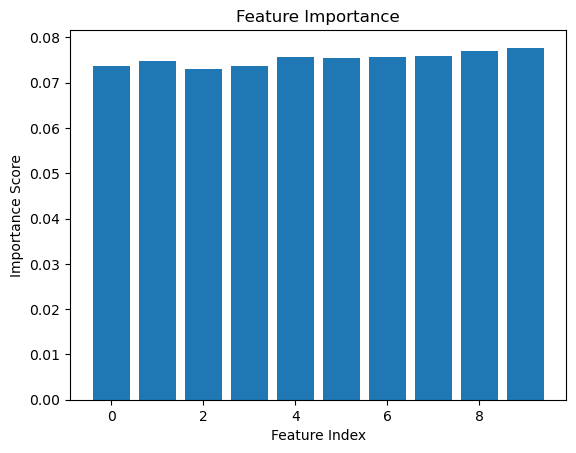

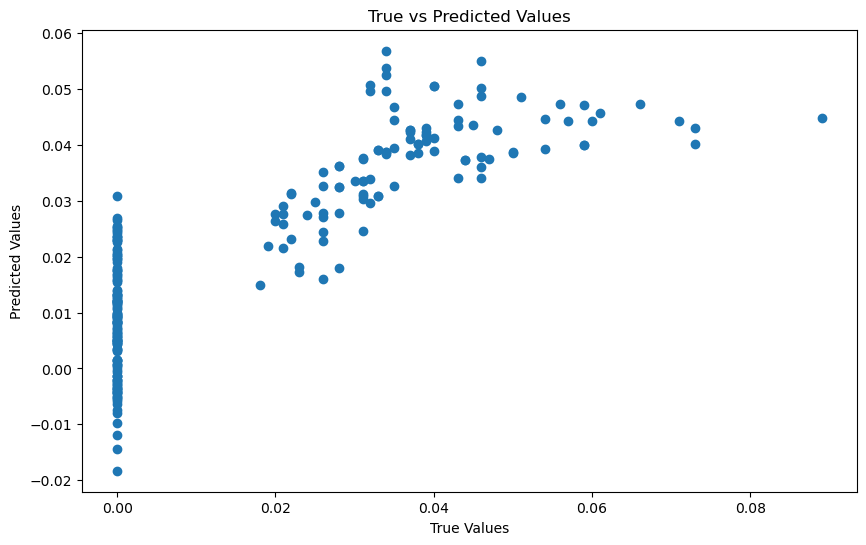

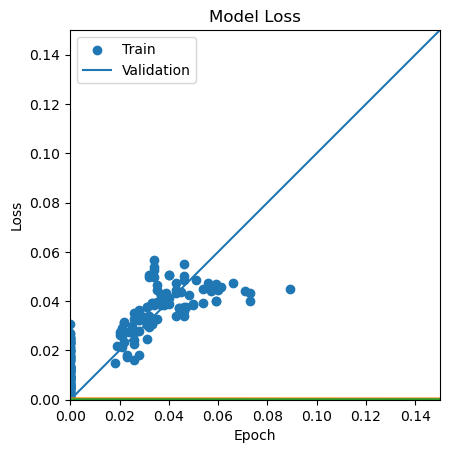

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 40ms/step - loss: 0.0024 - val_loss: 7.0074e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 35ms/step - loss: 0.0015 - val_loss: 3.5319e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0011 - val_loss: 3.7342e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 32ms/step - loss: 9.4534e-04 - val_loss: 2.9806e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 32ms/step - loss: 8.1364e-04 - val_loss: 2.2910e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 34ms/step - loss: 7.3156e-04 - val_loss: 2.2252e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 31ms/step - loss: 7.1869e-04 - val_loss: 1.5918e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 33ms/step - loss: 6.5046e-04 - val_loss: 1.4111e-04 - lr: 1.0000e-04
Epoch 9/200


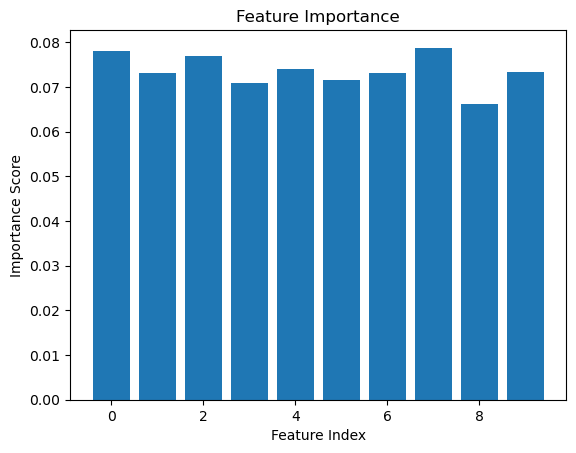

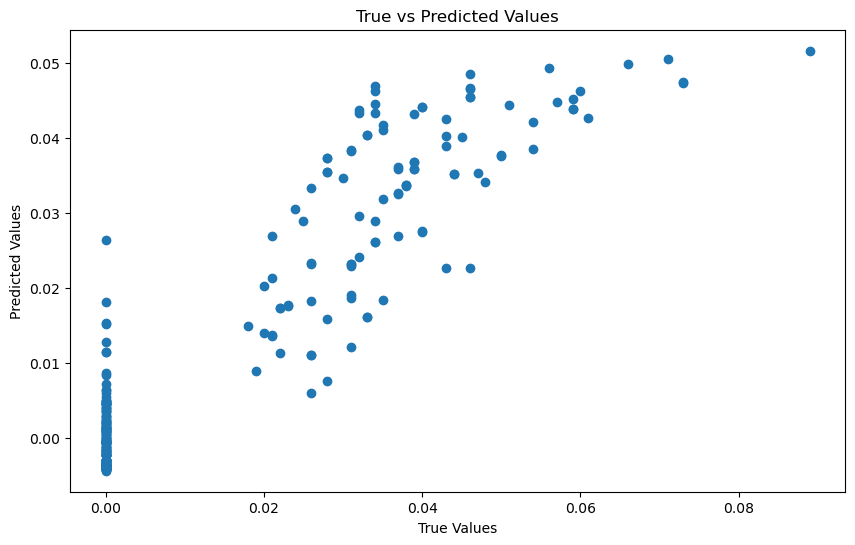

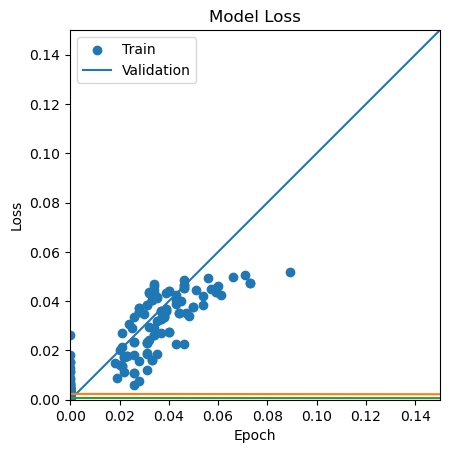

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 38ms/step - loss: 0.0058 - val_loss: 0.0011 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0029 - val_loss: 8.1067e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0020 - val_loss: 3.3939e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0017 - val_loss: 1.6582e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0014 - val_loss: 1.5791e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0012 - val_loss: 1.5100e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0011 - val_loss: 1.3561e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0010 - val_loss: 1.3090e-04 - lr: 1.0000e-04
Epoch 9/200
30/30 [=================

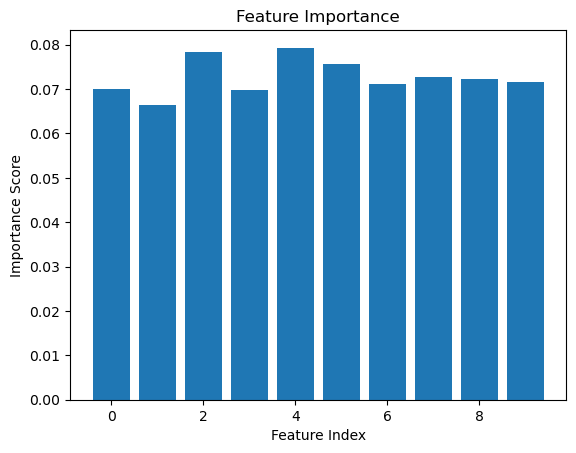

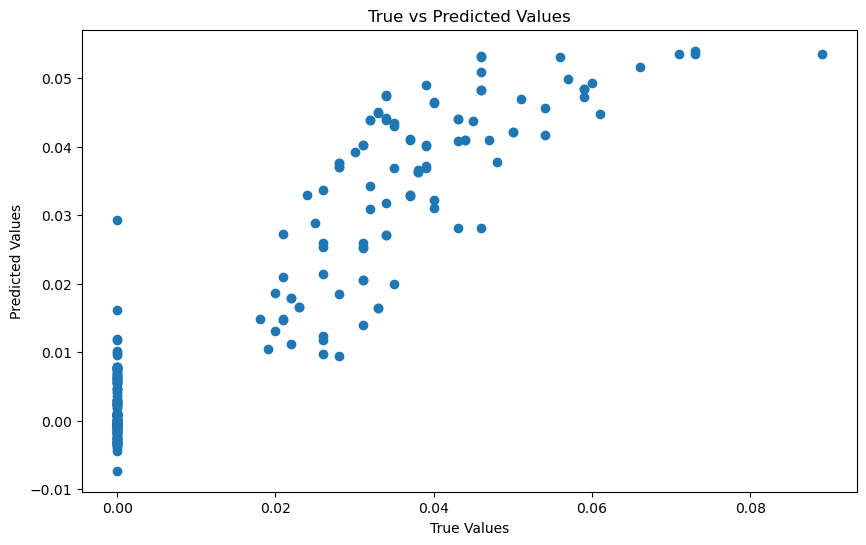

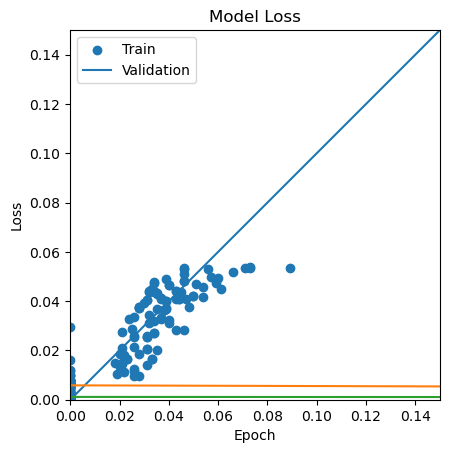

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 40ms/step - loss: 0.0113 - val_loss: 1.6110e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 31ms/step - loss: 0.0052 - val_loss: 1.4799e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0034 - val_loss: 1.4905e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0029 - val_loss: 1.7613e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 35ms/step - loss: 0.0022 - val_loss: 1.9107e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 35ms/step - loss: 0.0018 - val_loss: 2.0935e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0017 - val_loss: 2.0311e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0016 - val_loss: 2.1798e-04 - lr: 1.0000e-04
Epoch 9/200
30/30 [=============

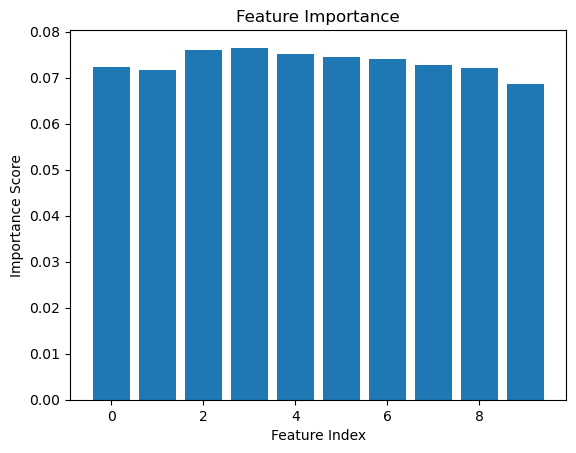

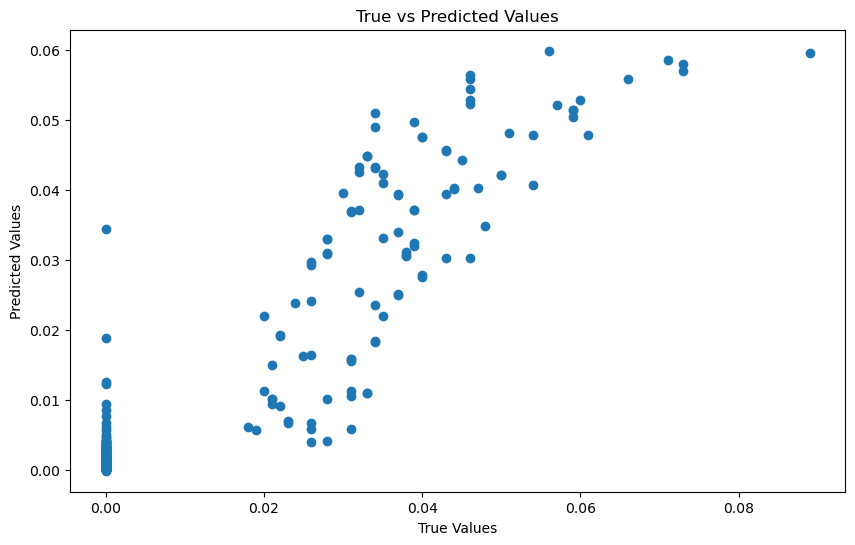

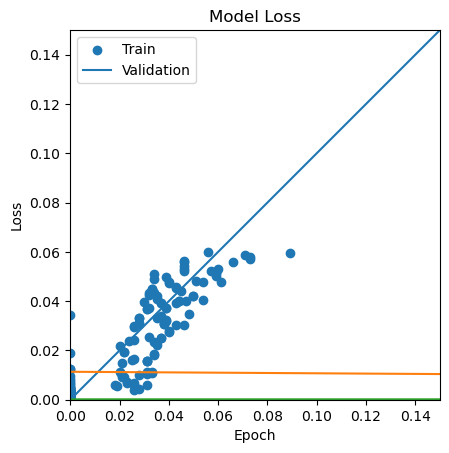

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 32ms/step - loss: 5.7475e-04 - val_loss: 6.2749e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 4s 31ms/step - loss: 4.0088e-04 - val_loss: 3.5049e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 4s 32ms/step - loss: 3.5921e-04 - val_loss: 3.1706e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 4s 31ms/step - loss: 3.1446e-04 - val_loss: 8.0197e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 4s 30ms/step - loss: 3.2985e-04 - val_loss: 2.6274e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 4s 32ms/step - loss: 2.9046e-04 - val_loss: 3.5329e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 4s 30ms/step - loss: 2.8503e-04 - val_loss: 1.1807e-04 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 4s 32ms/step - loss: 2.7602e-04 - val_loss: 9.4488e-05 - lr: 0.0010
Epoch 9/200
118/

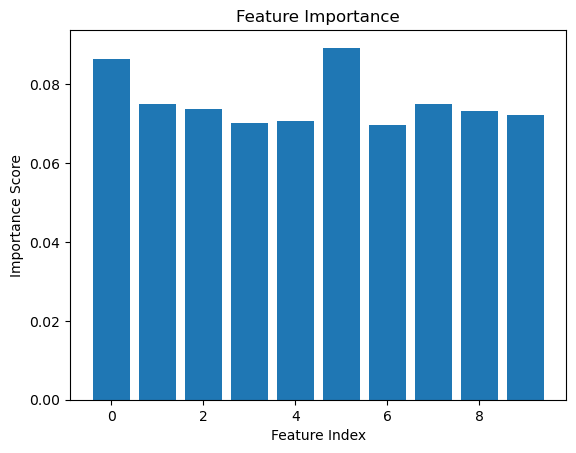

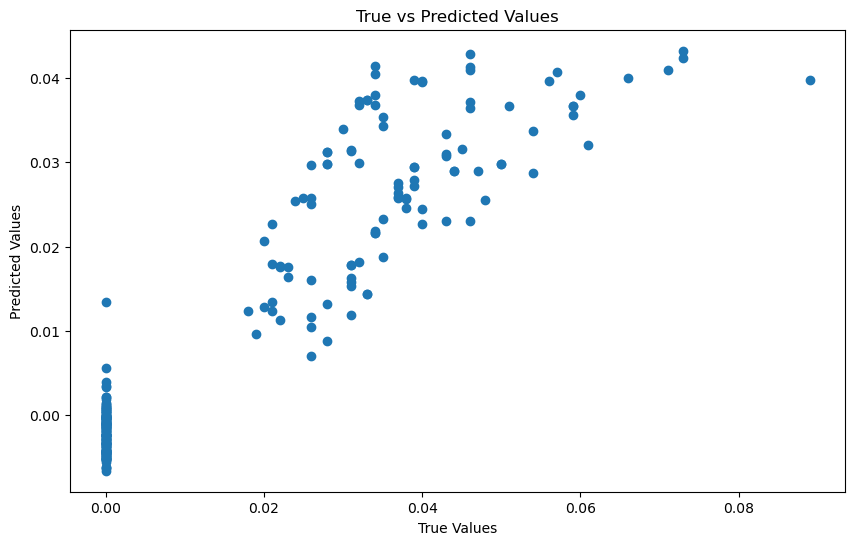

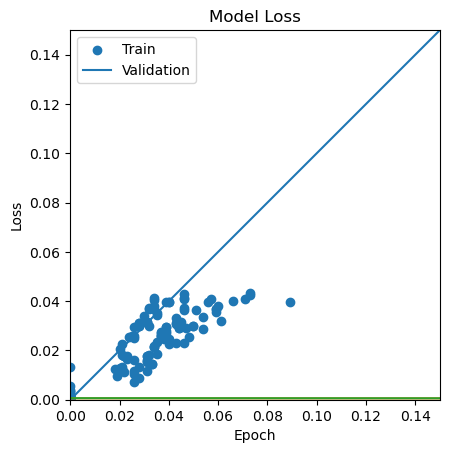

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 33ms/step - loss: 0.0016 - val_loss: 1.7764e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 4s 32ms/step - loss: 5.3576e-04 - val_loss: 1.5828e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 4s 31ms/step - loss: 4.8465e-04 - val_loss: 1.2842e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 4s 31ms/step - loss: 4.4758e-04 - val_loss: 1.7696e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 4s 31ms/step - loss: 3.9385e-04 - val_loss: 1.6055e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 4s 30ms/step - loss: 3.9684e-04 - val_loss: 1.4732e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 4s 31ms/step - loss: 3.7712e-04 - val_loss: 1.2892e-04 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 4s 31ms/step - loss: 3.5780e-04 - val_loss: 1.8286e-04 - lr: 0.0010
Epoch 9/200
118/118 

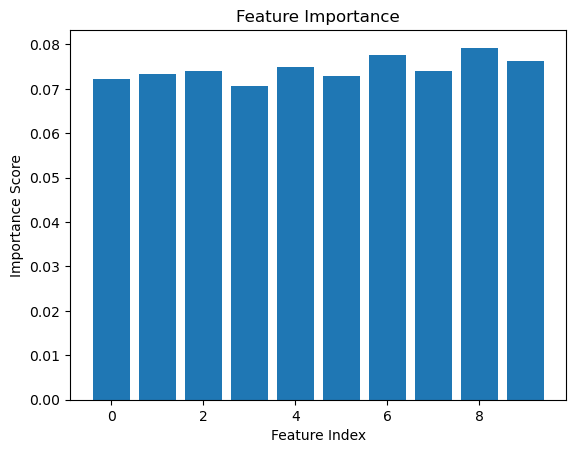

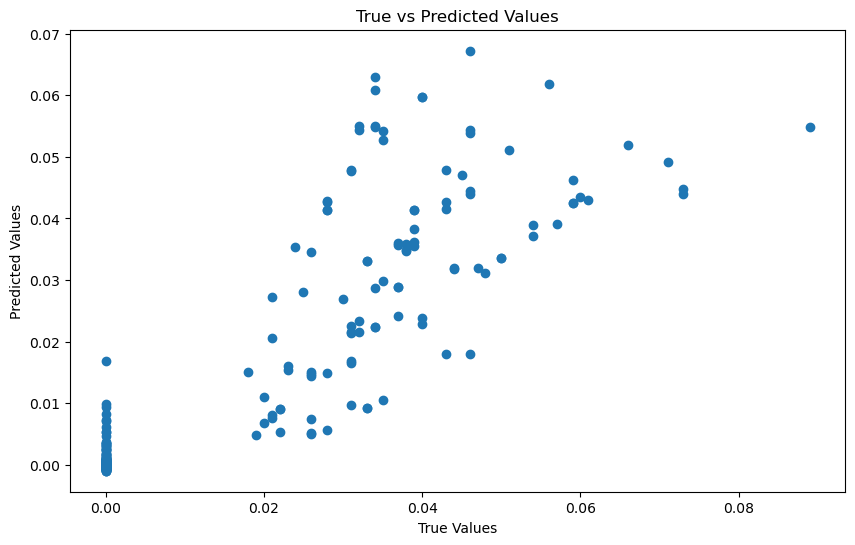

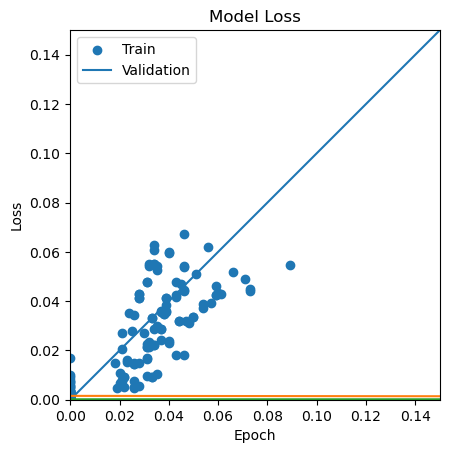

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 11s 68ms/step - loss: 0.0014 - val_loss: 7.6053e-05 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 4s 31ms/step - loss: 6.0467e-04 - val_loss: 9.5314e-05 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 4s 35ms/step - loss: 5.0226e-04 - val_loss: 8.8633e-05 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 4s 32ms/step - loss: 4.4062e-04 - val_loss: 1.0740e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 4s 31ms/step - loss: 4.0709e-04 - val_loss: 9.8617e-05 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 4s 30ms/step - loss: 4.2829e-04 - val_loss: 9.3928e-05 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 4s 30ms/step - loss: 3.8070e-04 - val_loss: 7.1106e-05 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 4s 30ms/step - loss: 3.8095e-04 - val_loss: 9.8298e-05 - lr: 0.0010
Epoch 9/200
118/118

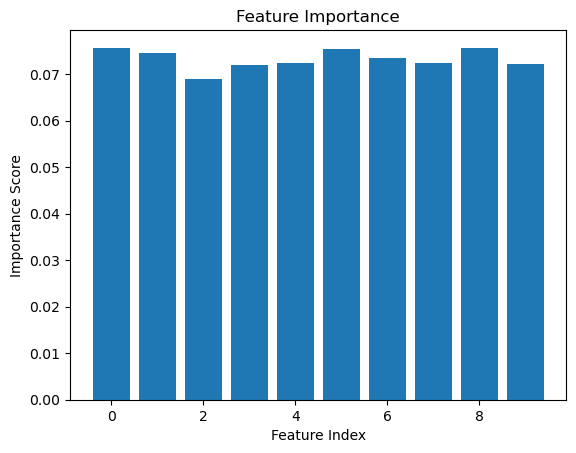

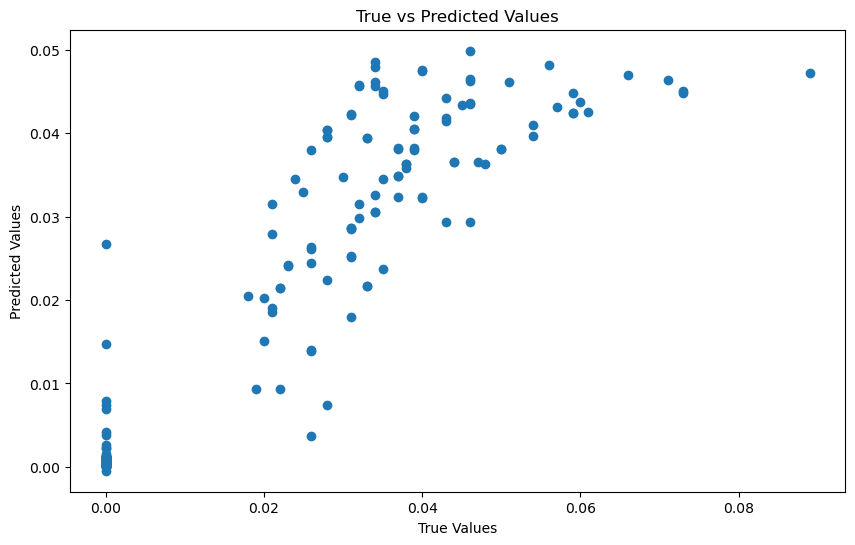

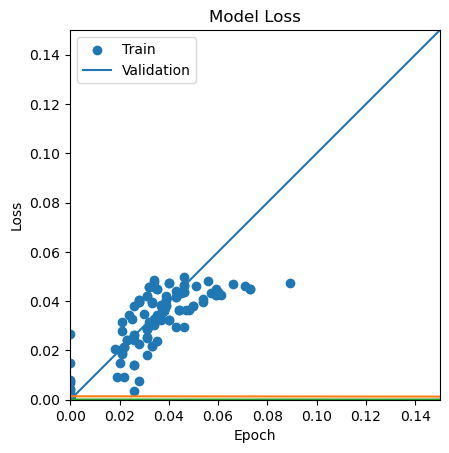

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 33ms/step - loss: 0.0019 - val_loss: 1.9685e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 4s 31ms/step - loss: 7.7474e-04 - val_loss: 1.8020e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 4s 31ms/step - loss: 6.8516e-04 - val_loss: 1.0037e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 4s 31ms/step - loss: 5.4276e-04 - val_loss: 1.0755e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 4s 32ms/step - loss: 5.0200e-04 - val_loss: 9.5336e-05 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 4s 33ms/step - loss: 4.9167e-04 - val_loss: 1.0017e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 4s 34ms/step - loss: 4.3670e-04 - val_loss: 8.0382e-05 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 4s 33ms/step - loss: 4.0528e-04 - val_loss: 9.2045e-05 - lr: 0.0010
Epoch 9/200
118/118 

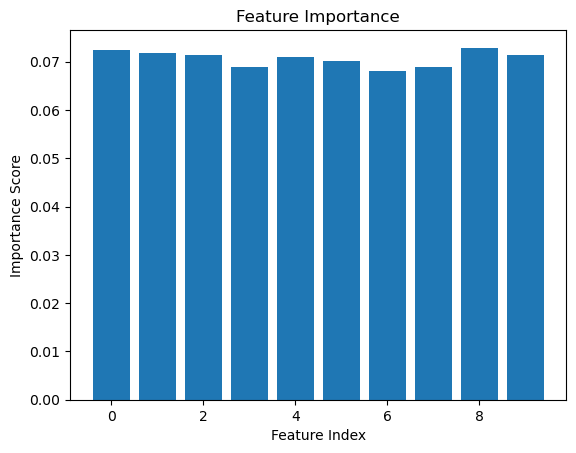

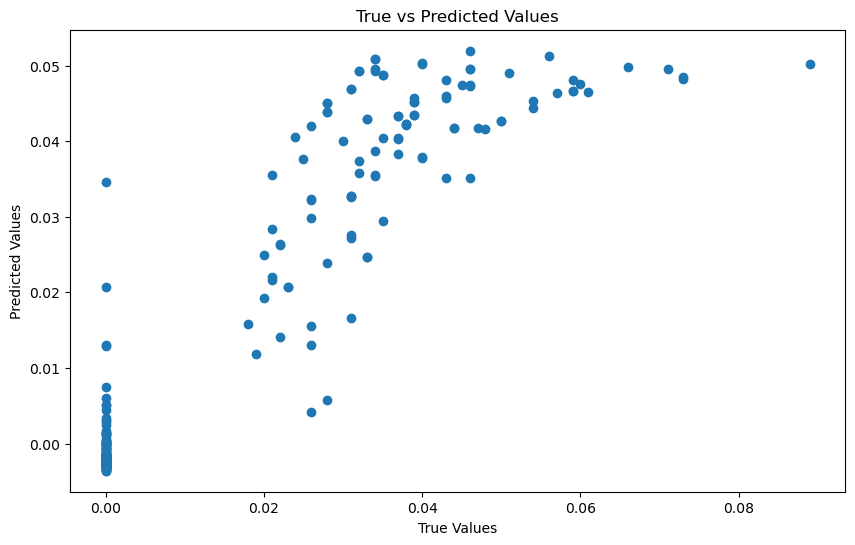

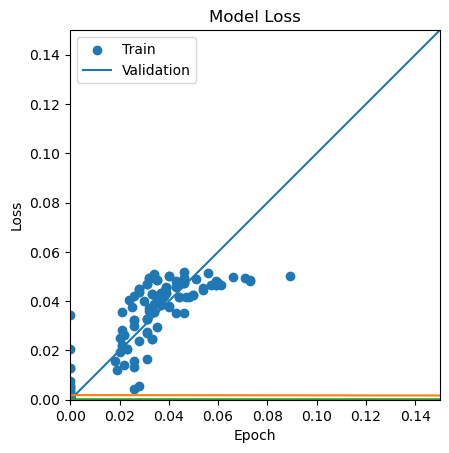

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 34ms/step - loss: 6.7727e-04 - val_loss: 4.4948e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 2s 29ms/step - loss: 3.9868e-04 - val_loss: 1.8027e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 2s 29ms/step - loss: 3.8327e-04 - val_loss: 3.9784e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 2s 29ms/step - loss: 3.3487e-04 - val_loss: 3.5920e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 2s 29ms/step - loss: 3.2538e-04 - val_loss: 5.8625e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 2s 29ms/step - loss: 3.0075e-04 - val_loss: 5.9534e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 2s 30ms/step - loss: 2.9677e-04 - val_loss: 3.6462e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 2s 29ms/step - loss: 2.7328e-04 - val_loss: 5.5648e-04 - lr: 0.0010
Epoch 9/200
59/59 [=============

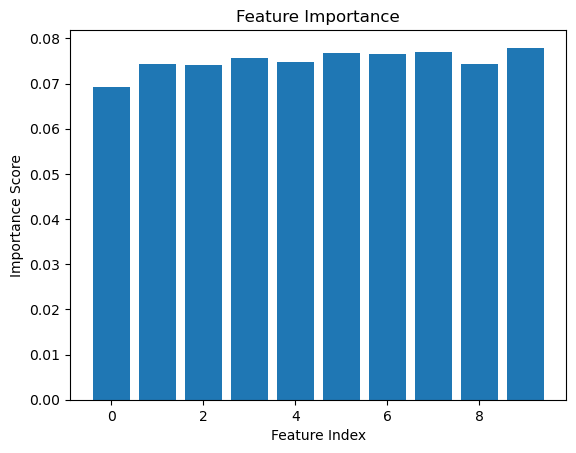

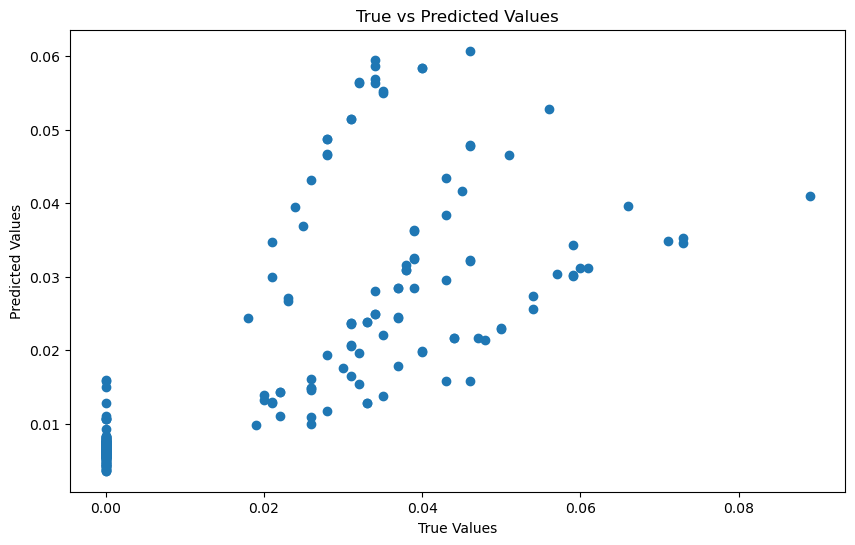

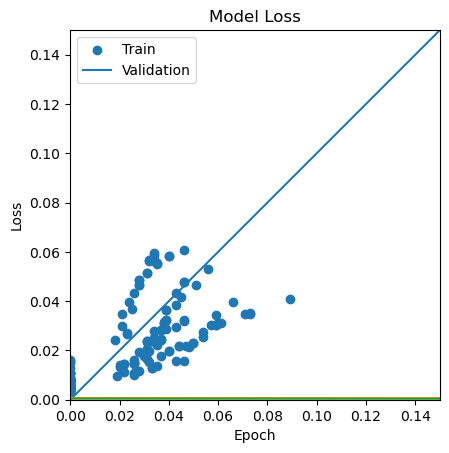

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 5s 39ms/step - loss: 0.0011 - val_loss: 2.1996e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 2s 33ms/step - loss: 5.3986e-04 - val_loss: 9.5628e-05 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 2s 33ms/step - loss: 4.6701e-04 - val_loss: 1.2787e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 2s 33ms/step - loss: 4.4304e-04 - val_loss: 2.6802e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 2s 32ms/step - loss: 4.1871e-04 - val_loss: 1.9680e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 2s 34ms/step - loss: 3.9473e-04 - val_loss: 2.9480e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 2s 34ms/step - loss: 3.6066e-04 - val_loss: 2.0655e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 2s 33ms/step - loss: 3.2458e-04 - val_loss: 2.9059e-04 - lr: 0.0010
Epoch 9/200
59/59 [=================

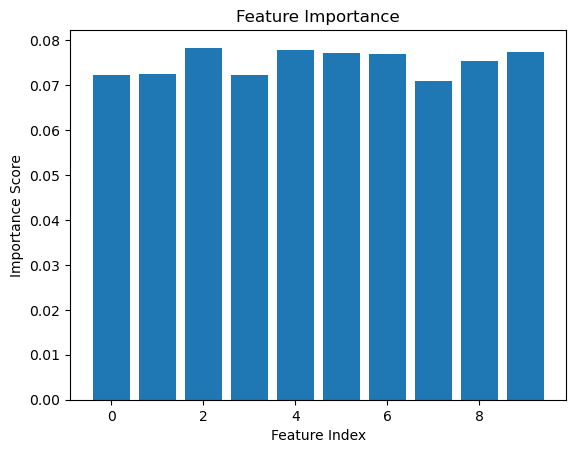

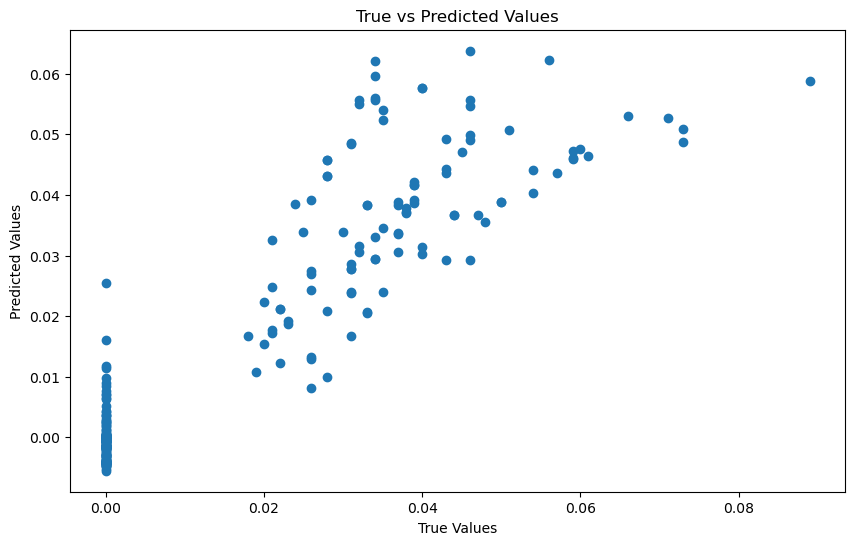

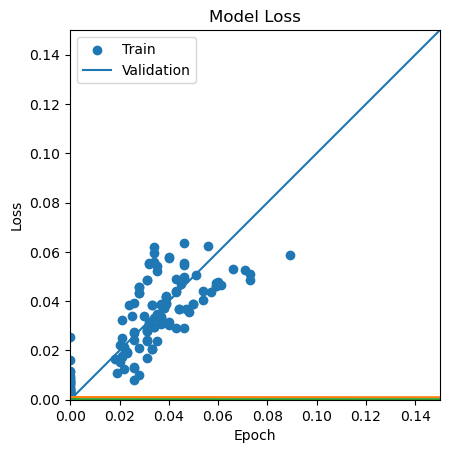

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 37ms/step - loss: 0.0014 - val_loss: 1.2191e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 2s 32ms/step - loss: 6.4951e-04 - val_loss: 1.0364e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 2s 31ms/step - loss: 5.3277e-04 - val_loss: 1.3243e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 2s 31ms/step - loss: 4.7491e-04 - val_loss: 9.6863e-05 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 2s 30ms/step - loss: 4.0488e-04 - val_loss: 1.0068e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 2s 31ms/step - loss: 4.2025e-04 - val_loss: 1.5201e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 2s 31ms/step - loss: 4.2525e-04 - val_loss: 1.3668e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 2s 31ms/step - loss: 3.9233e-04 - val_loss: 2.5138e-04 - lr: 0.0010
Epoch 9/200
59/59 [=================

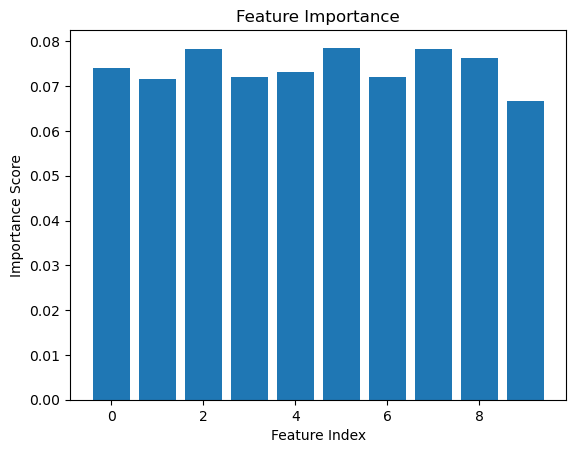

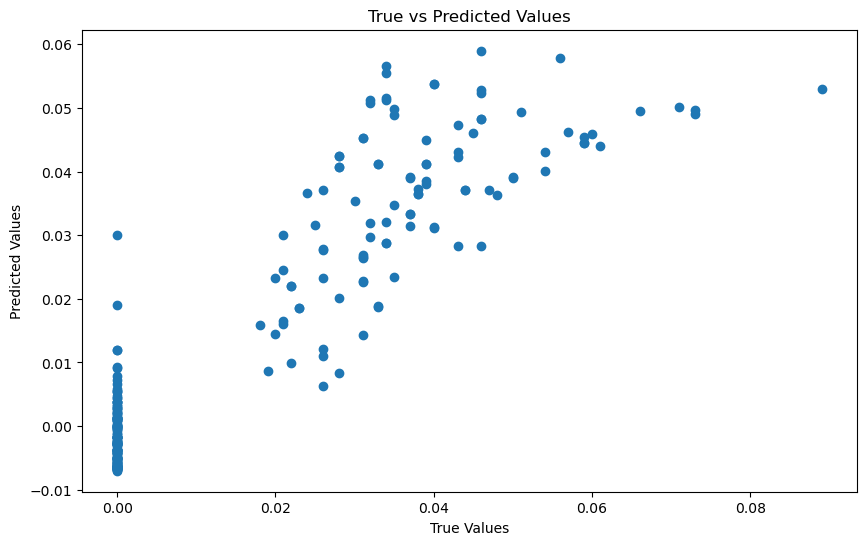

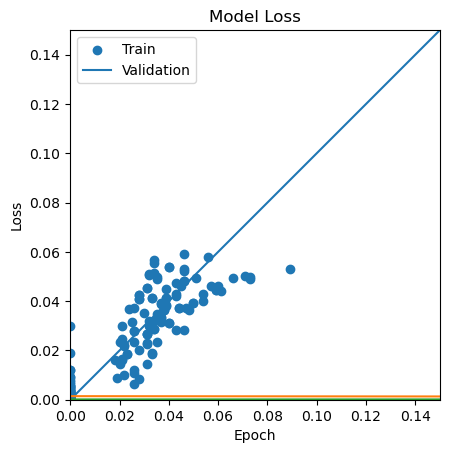

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 37ms/step - loss: 0.0022 - val_loss: 1.0346e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 2s 34ms/step - loss: 8.6926e-04 - val_loss: 1.6057e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 2s 31ms/step - loss: 6.8887e-04 - val_loss: 9.2656e-05 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 2s 31ms/step - loss: 5.4047e-04 - val_loss: 1.0647e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 2s 32ms/step - loss: 5.1070e-04 - val_loss: 1.1317e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 2s 32ms/step - loss: 5.0464e-04 - val_loss: 1.1097e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 2s 33ms/step - loss: 4.5417e-04 - val_loss: 1.5821e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 2s 35ms/step - loss: 4.0449e-04 - val_loss: 9.3572e-05 - lr: 0.0010
Epoch 9/200
59/59 [=================

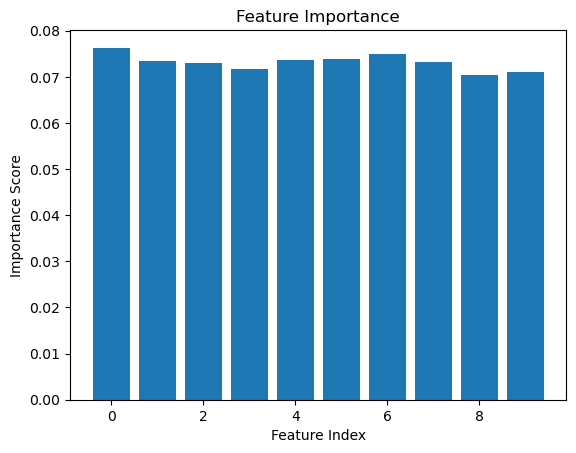

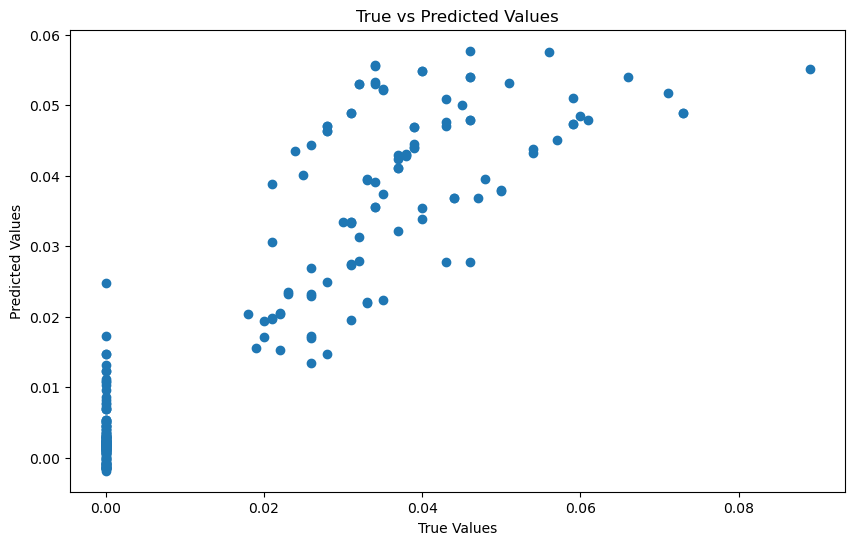

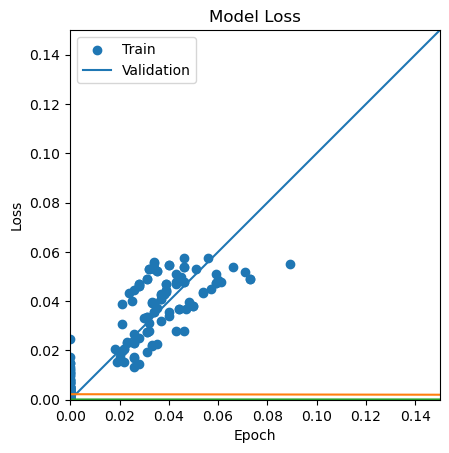

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 37ms/step - loss: 6.3974e-04 - val_loss: 4.0789e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 31ms/step - loss: 3.7397e-04 - val_loss: 2.3366e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 32ms/step - loss: 3.4610e-04 - val_loss: 2.4522e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 30ms/step - loss: 3.4469e-04 - val_loss: 2.6007e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 30ms/step - loss: 3.0727e-04 - val_loss: 4.0880e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 29ms/step - loss: 3.2712e-04 - val_loss: 4.9769e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 30ms/step - loss: 3.0223e-04 - val_loss: 5.6296e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 31ms/step - loss: 2.4749e-04 - val_loss: 8.0793e-05 - lr: 0.0010
Epoch 9/200
30/30 [=============

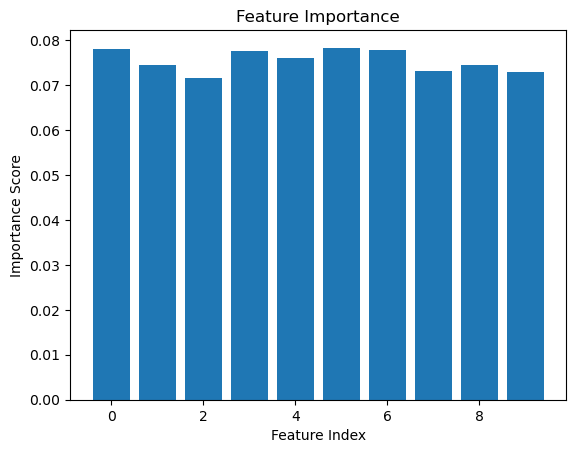

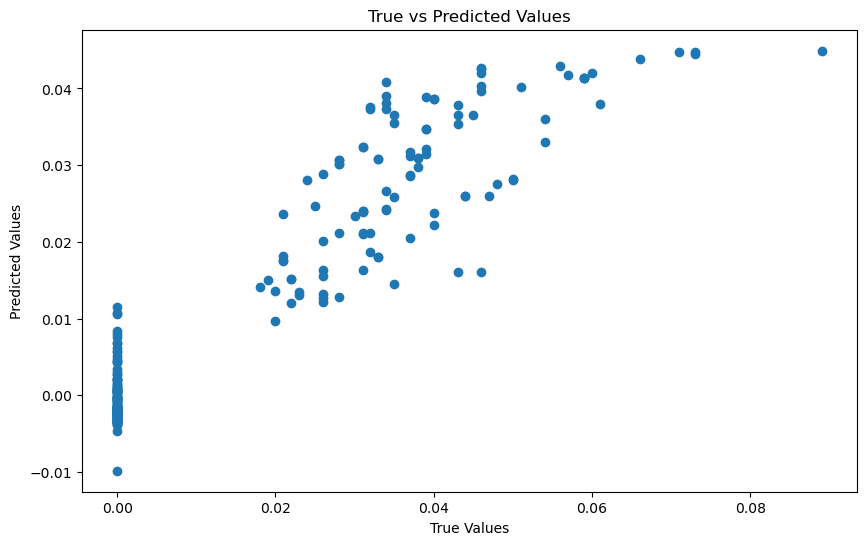

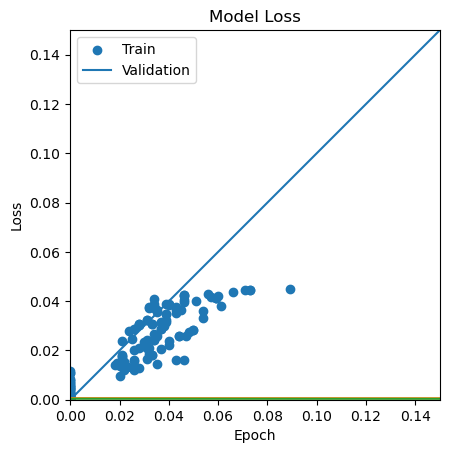

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 41ms/step - loss: 0.0014 - val_loss: 1.7486e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 31ms/step - loss: 6.0714e-04 - val_loss: 1.6378e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 32ms/step - loss: 5.4178e-04 - val_loss: 1.8754e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 33ms/step - loss: 4.7477e-04 - val_loss: 1.1964e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 31ms/step - loss: 4.5435e-04 - val_loss: 2.3303e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 32ms/step - loss: 4.1345e-04 - val_loss: 3.3654e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 31ms/step - loss: 3.7986e-04 - val_loss: 1.9922e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 32ms/step - loss: 3.7893e-04 - val_loss: 1.5410e-04 - lr: 0.0010
Epoch 9/200
30/30 [=================

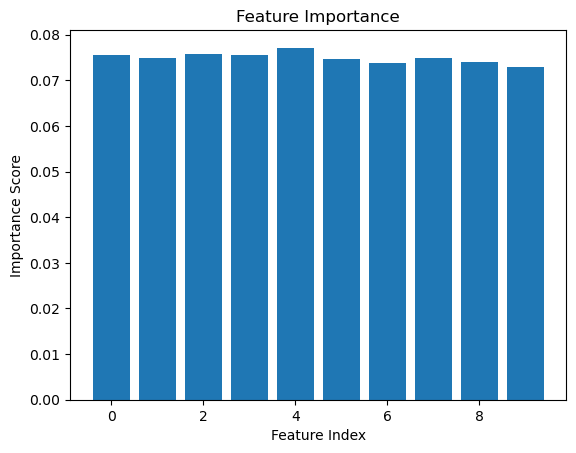

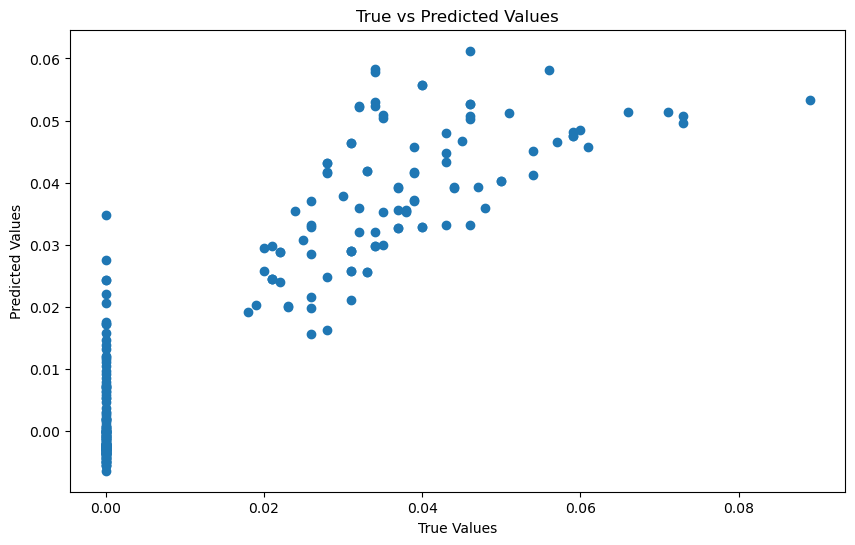

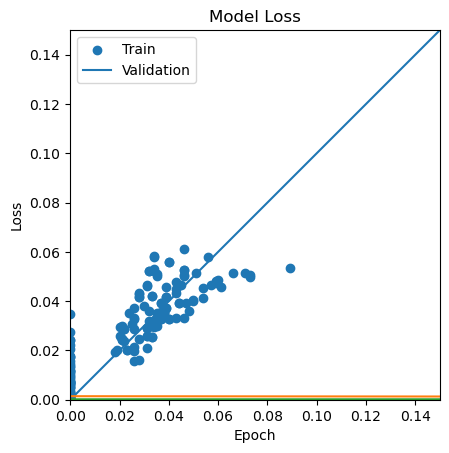

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 42ms/step - loss: 0.0018 - val_loss: 2.3692e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 33ms/step - loss: 7.0253e-04 - val_loss: 1.2571e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 33ms/step - loss: 5.4955e-04 - val_loss: 2.9416e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 33ms/step - loss: 5.3391e-04 - val_loss: 8.3012e-05 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 32ms/step - loss: 4.8275e-04 - val_loss: 1.0100e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 31ms/step - loss: 4.8209e-04 - val_loss: 9.0881e-05 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 32ms/step - loss: 4.3966e-04 - val_loss: 1.5315e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 32ms/step - loss: 4.1871e-04 - val_loss: 1.7132e-04 - lr: 0.0010
Epoch 9/200
30/30 [=================

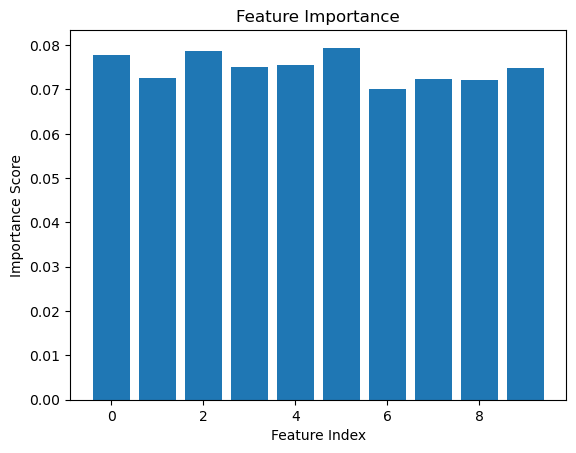

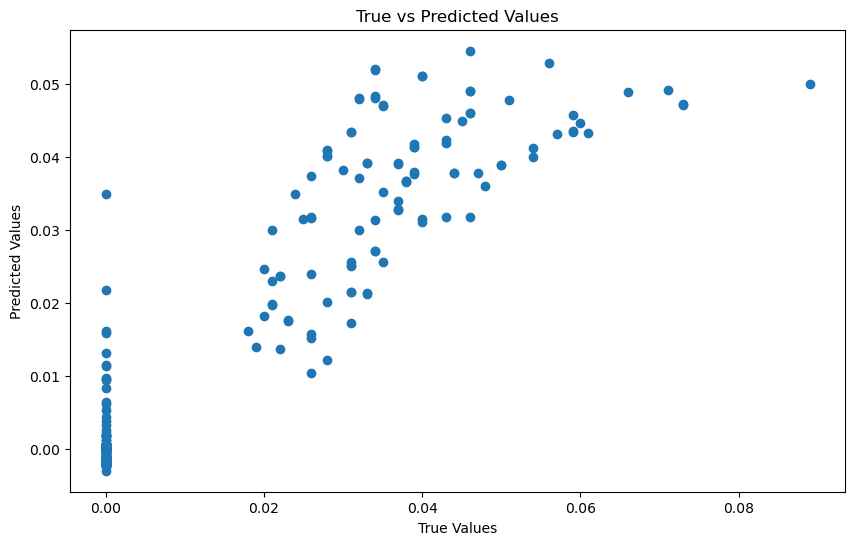

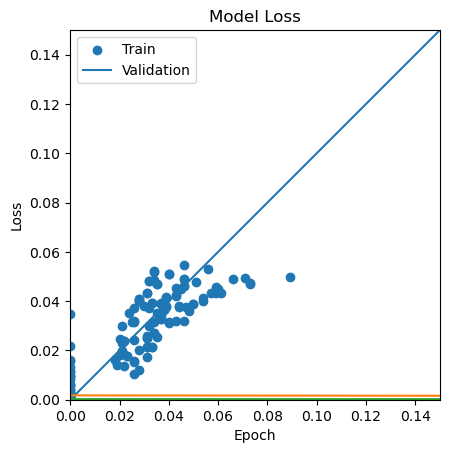

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 45ms/step - loss: 0.0030 - val_loss: 1.7106e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 34ms/step - loss: 9.7782e-04 - val_loss: 1.2181e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 34ms/step - loss: 7.7679e-04 - val_loss: 1.2356e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 37ms/step - loss: 6.6810e-04 - val_loss: 1.1533e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 37ms/step - loss: 6.1024e-04 - val_loss: 1.0465e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 37ms/step - loss: 6.1096e-04 - val_loss: 1.3431e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 36ms/step - loss: 5.4818e-04 - val_loss: 1.1691e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 39ms/step - loss: 4.9630e-04 - val_loss: 1.1134e-04 - lr: 0.0010
Epoch 9/200
30/30 [=================

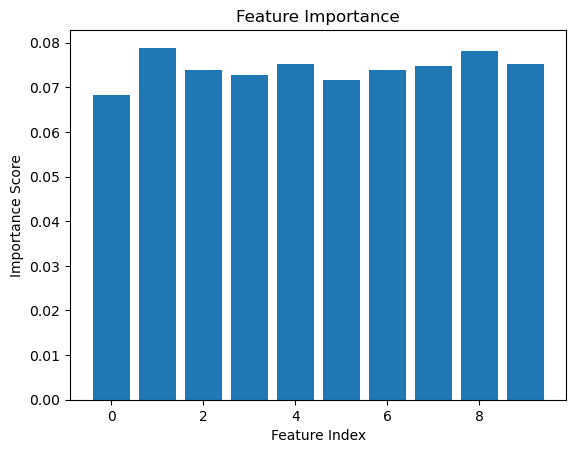

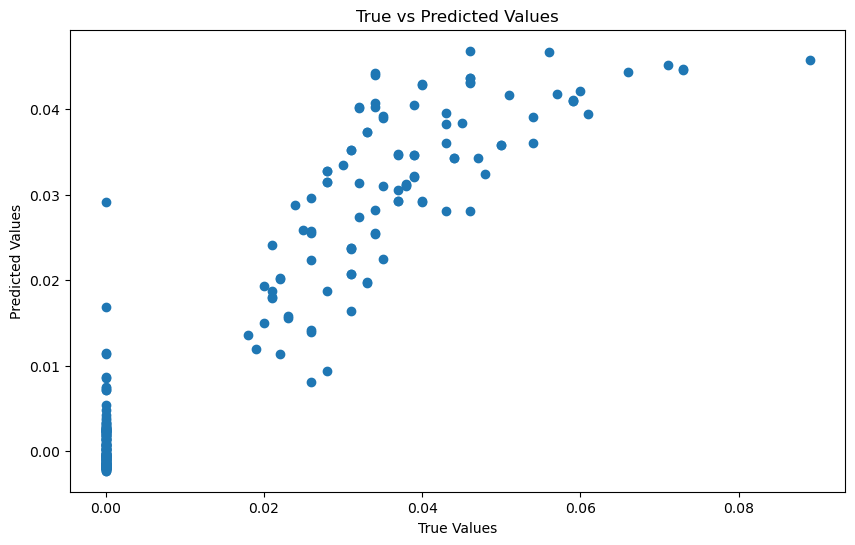

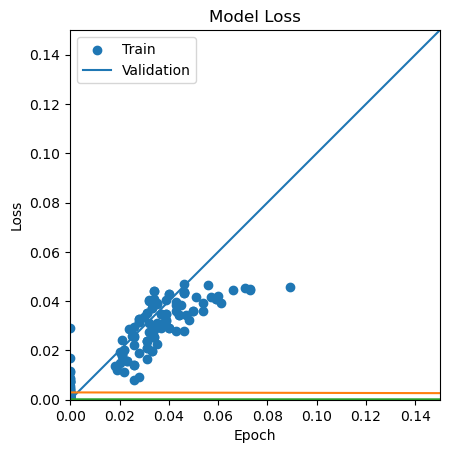

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 8s 35ms/step - loss: 0.0050 - val_loss: 1.4066e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 4s 33ms/step - loss: 5.1538e-04 - val_loss: 3.7658e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 4s 36ms/step - loss: 3.8273e-04 - val_loss: 1.3073e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 5s 40ms/step - loss: 3.4531e-04 - val_loss: 2.9410e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 5s 40ms/step - loss: 0.0023 - val_loss: 6.6476e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 5s 39ms/step - loss: 5.4424e-04 - val_loss: 2.1760e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 5s 40ms/step - loss: 4.1285e-04 - val_loss: 9.3263e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 5s 39ms/step - loss: 4.1762e-04 - val_loss: 4.7419e-04 - lr: 0.0100
Epoch 9/200
118/118 [===

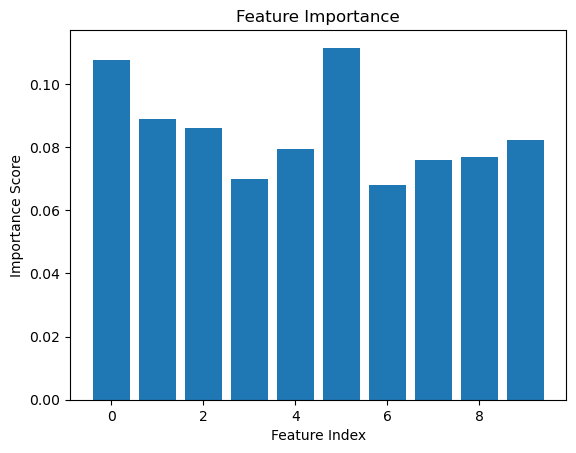

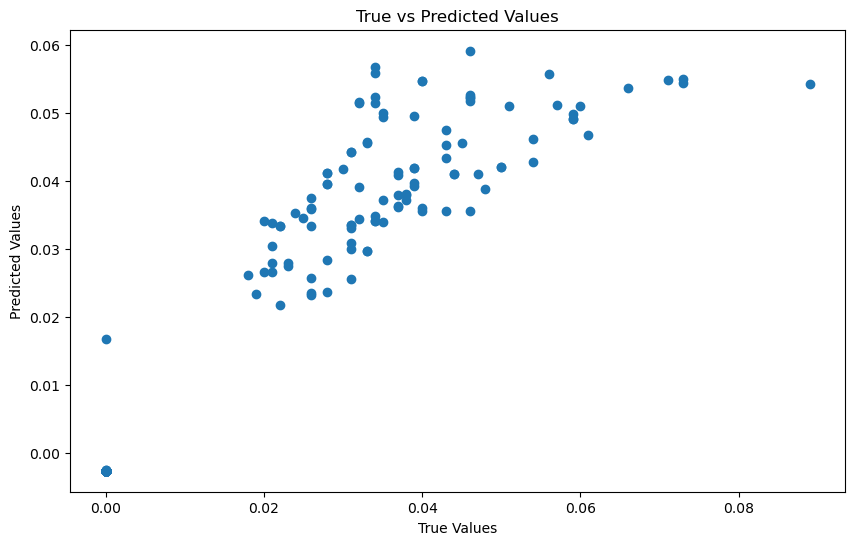

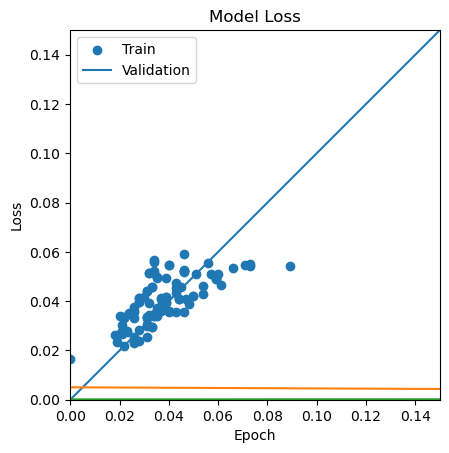

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 10s 47ms/step - loss: 0.0054 - val_loss: 3.7197e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 5s 42ms/step - loss: 4.9942e-04 - val_loss: 1.0334e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 5s 42ms/step - loss: 4.4484e-04 - val_loss: 2.2461e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 5s 42ms/step - loss: 4.2866e-04 - val_loss: 1.7817e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 5s 42ms/step - loss: 4.1823e-04 - val_loss: 1.1327e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 5s 43ms/step - loss: 4.4267e-04 - val_loss: 1.4007e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 5s 43ms/step - loss: 3.7867e-04 - val_loss: 2.3817e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 5s 42ms/step - loss: 3.5258e-04 - val_loss: 1.0651e-04 - lr: 0.0100
Epoch 9/200
118/118

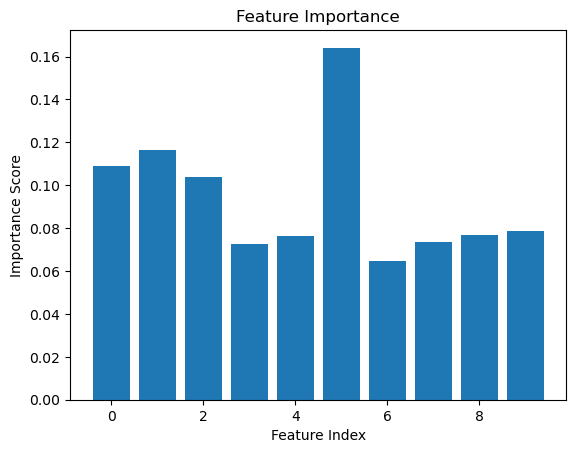

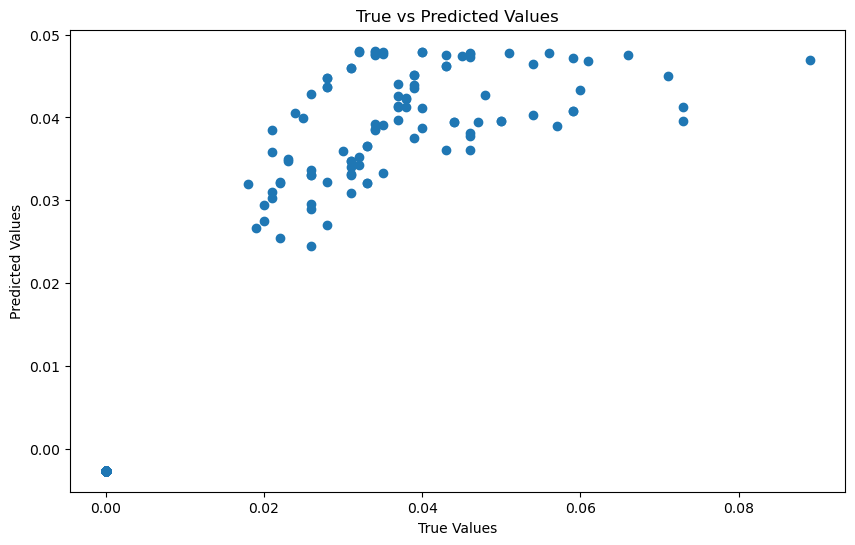

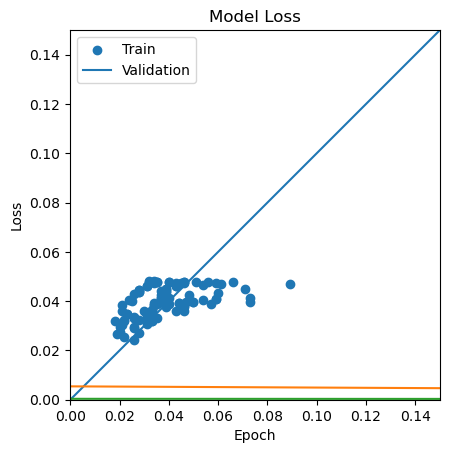

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 7s 38ms/step - loss: 0.0048 - val_loss: 1.0609e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 4s 31ms/step - loss: 5.8543e-04 - val_loss: 3.2253e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 4s 30ms/step - loss: 4.7364e-04 - val_loss: 1.5127e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 4s 31ms/step - loss: 4.7932e-04 - val_loss: 3.6003e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 4s 30ms/step - loss: 4.1554e-04 - val_loss: 2.0726e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 4s 30ms/step - loss: 3.9558e-04 - val_loss: 1.1787e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 4s 30ms/step - loss: 3.7534e-04 - val_loss: 1.2160e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 4s 30ms/step - loss: 3.8060e-04 - val_loss: 5.0853e-04 - lr: 0.0100
Epoch 9/200
118/118 

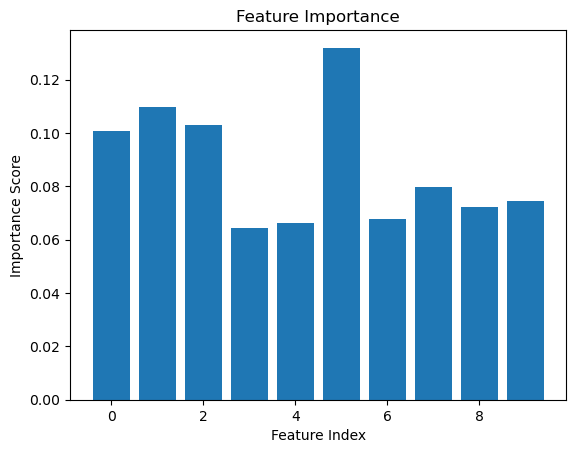

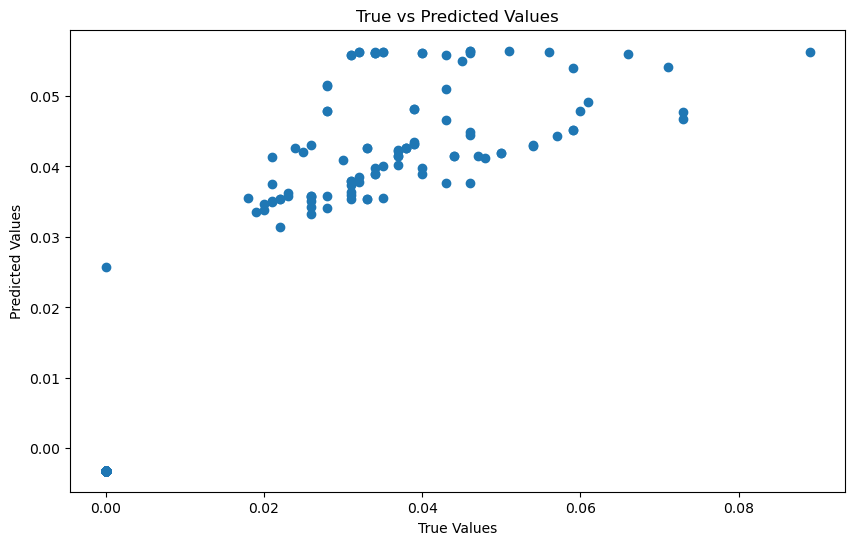

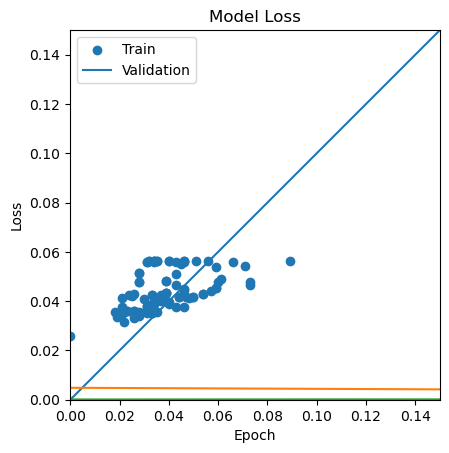

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 31ms/step - loss: 0.0031 - val_loss: 4.7734e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 4s 32ms/step - loss: 6.4556e-04 - val_loss: 1.6658e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 3s 30ms/step - loss: 4.7227e-04 - val_loss: 4.9404e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 3s 28ms/step - loss: 4.8458e-04 - val_loss: 2.1751e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 3s 29ms/step - loss: 4.7517e-04 - val_loss: 2.6377e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 3s 29ms/step - loss: 4.2018e-04 - val_loss: 1.7987e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 3s 29ms/step - loss: 4.3198e-04 - val_loss: 4.4151e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 3s 29ms/step - loss: 4.2276e-04 - val_loss: 1.6057e-04 - lr: 0.0100
Epoch 9/200
118/118 

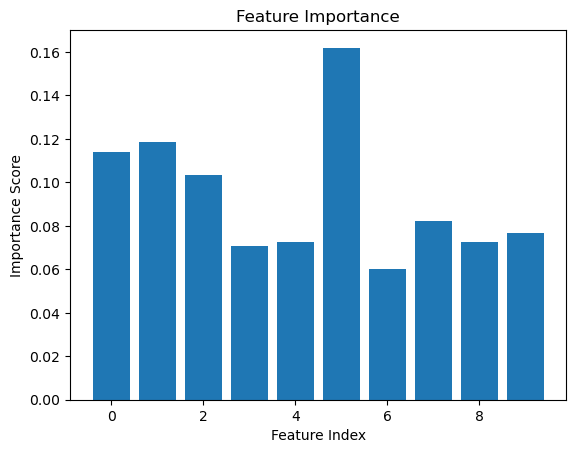

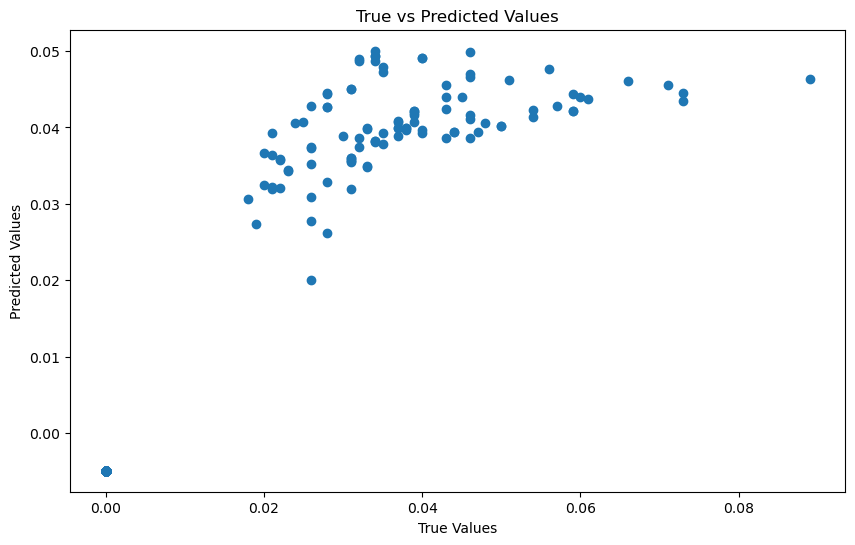

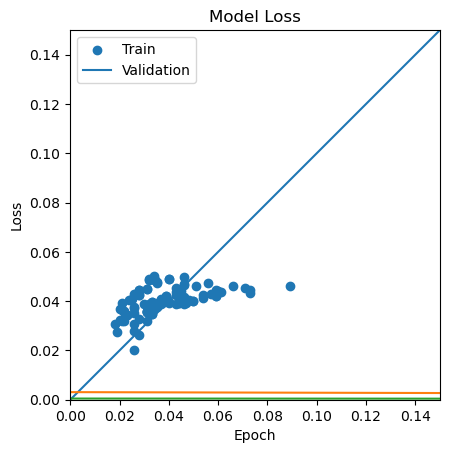

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 32ms/step - loss: 0.0272 - val_loss: 1.3165e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 2s 27ms/step - loss: 4.4344e-04 - val_loss: 1.4932e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 2s 26ms/step - loss: 3.8630e-04 - val_loss: 1.7619e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 2s 28ms/step - loss: 4.0058e-04 - val_loss: 2.6518e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 2s 27ms/step - loss: 3.6673e-04 - val_loss: 2.0678e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 2s 27ms/step - loss: 3.2478e-04 - val_loss: 3.0463e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 2s 27ms/step - loss: 3.2412e-04 - val_loss: 1.9928e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 2s 27ms/step - loss: 2.8382e-04 - val_loss: 2.2812e-04 - lr: 0.0100
Epoch 9/200
59/59 [=================

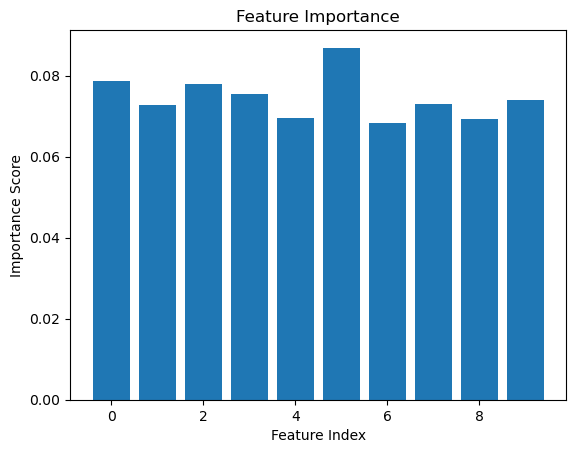

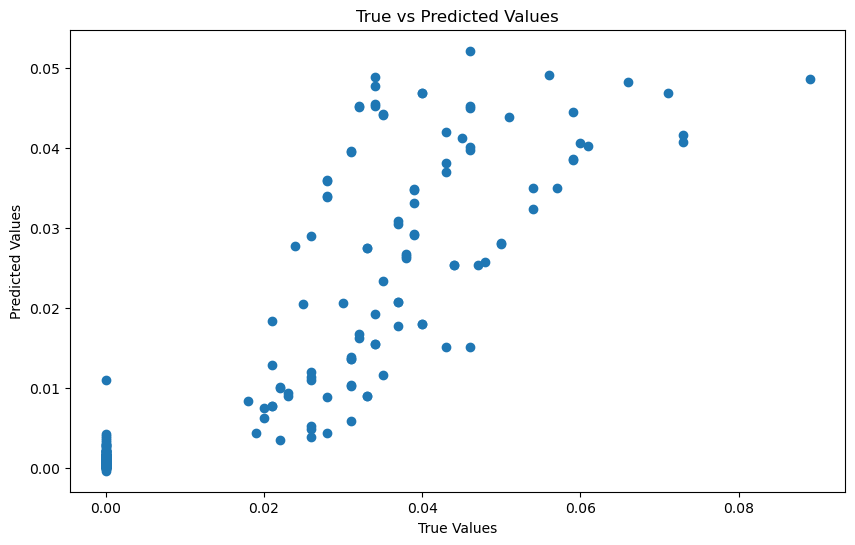

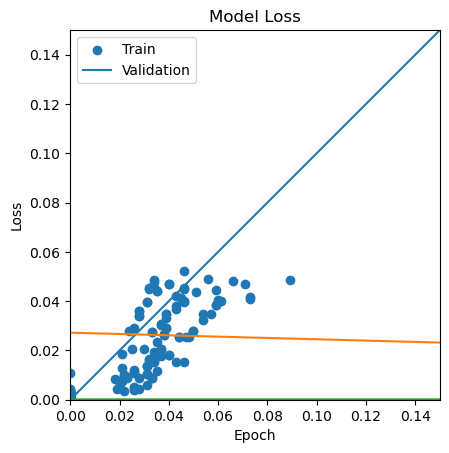

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 34ms/step - loss: 0.0063 - val_loss: 1.8915e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 2s 30ms/step - loss: 6.3579e-04 - val_loss: 1.0383e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 2s 30ms/step - loss: 4.9690e-04 - val_loss: 2.8747e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 2s 30ms/step - loss: 4.4141e-04 - val_loss: 4.9941e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 2s 30ms/step - loss: 4.0914e-04 - val_loss: 1.1584e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 2s 29ms/step - loss: 4.1789e-04 - val_loss: 1.3965e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 2s 30ms/step - loss: 3.6937e-04 - val_loss: 1.0914e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 2s 29ms/step - loss: 3.5240e-04 - val_loss: 1.2332e-04 - lr: 0.0100
Epoch 9/200
59/59 [=================

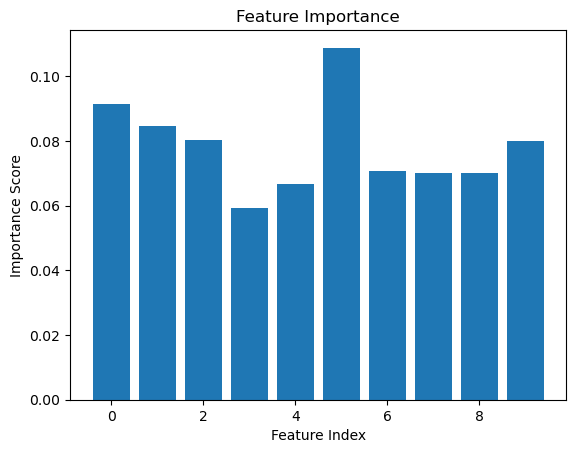

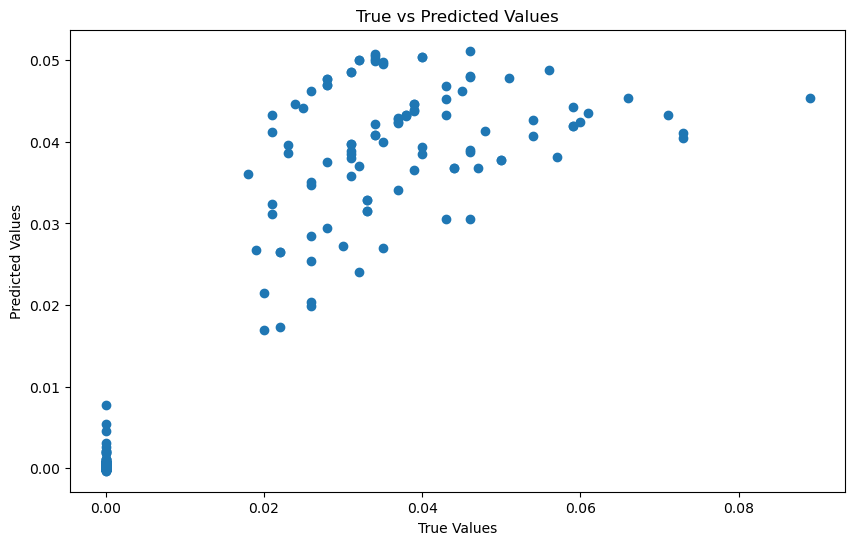

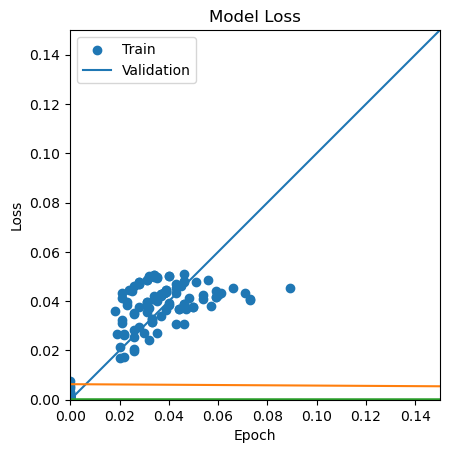

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 6s 47ms/step - loss: 0.0076 - val_loss: 1.1011e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 2s 36ms/step - loss: 5.8994e-04 - val_loss: 8.1297e-05 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 2s 39ms/step - loss: 5.0670e-04 - val_loss: 2.1833e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 2s 37ms/step - loss: 4.6645e-04 - val_loss: 1.3428e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 2s 38ms/step - loss: 4.1602e-04 - val_loss: 1.1569e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 2s 32ms/step - loss: 4.1703e-04 - val_loss: 1.0453e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 2s 31ms/step - loss: 4.0847e-04 - val_loss: 8.9117e-05 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 2s 29ms/step - loss: 4.0396e-04 - val_loss: 8.6539e-05 - lr: 0.0100
Epoch 9/200
59/59 [=================

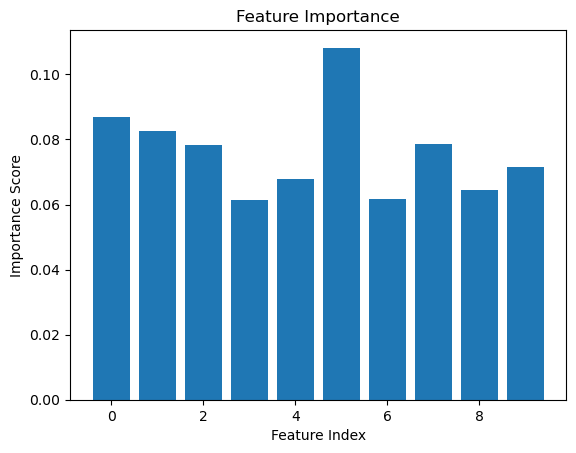

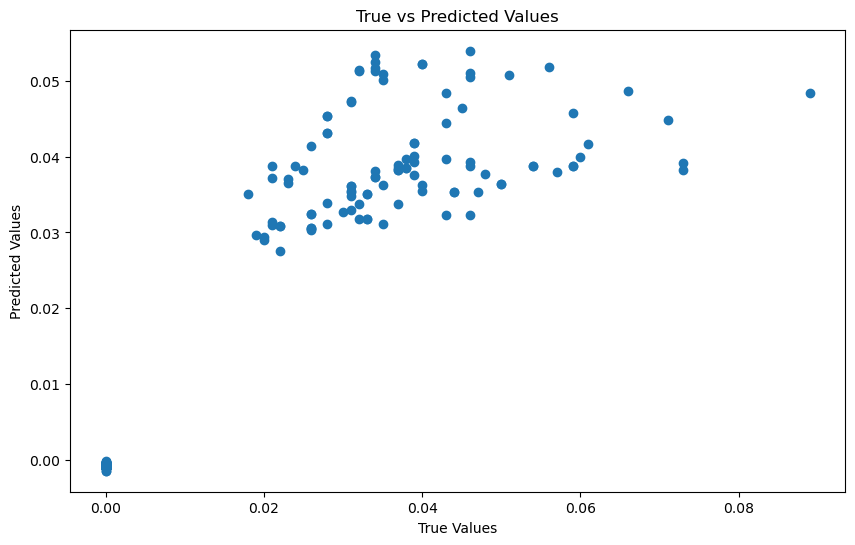

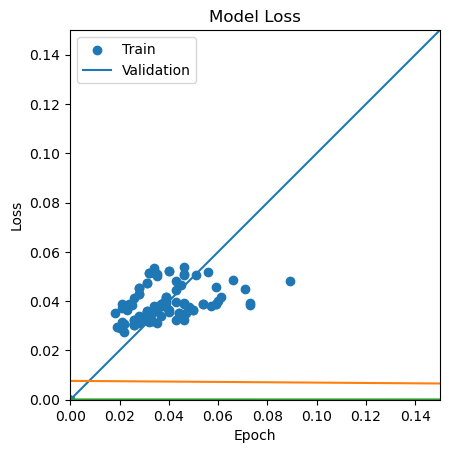

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 34ms/step - loss: 0.0083 - val_loss: 1.6909e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 2s 31ms/step - loss: 7.3535e-04 - val_loss: 1.0361e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 2s 30ms/step - loss: 6.3086e-04 - val_loss: 1.5699e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 2s 30ms/step - loss: 5.5197e-04 - val_loss: 3.2674e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 2s 29ms/step - loss: 4.8280e-04 - val_loss: 1.2417e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 2s 29ms/step - loss: 5.0932e-04 - val_loss: 9.2759e-05 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 2s 30ms/step - loss: 4.4353e-04 - val_loss: 7.9786e-05 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 2s 29ms/step - loss: 4.1617e-04 - val_loss: 8.4735e-05 - lr: 0.0100
Epoch 9/200
59/59 [=================

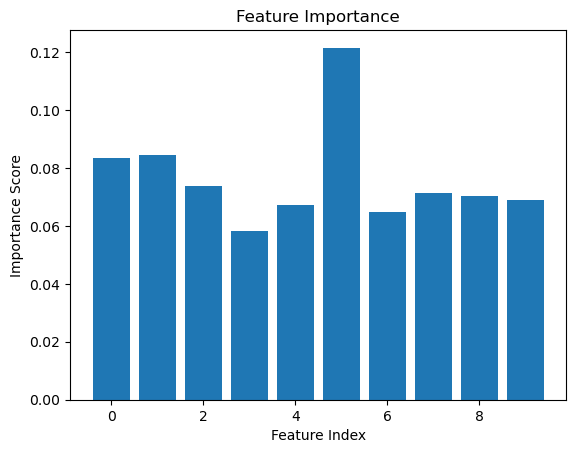

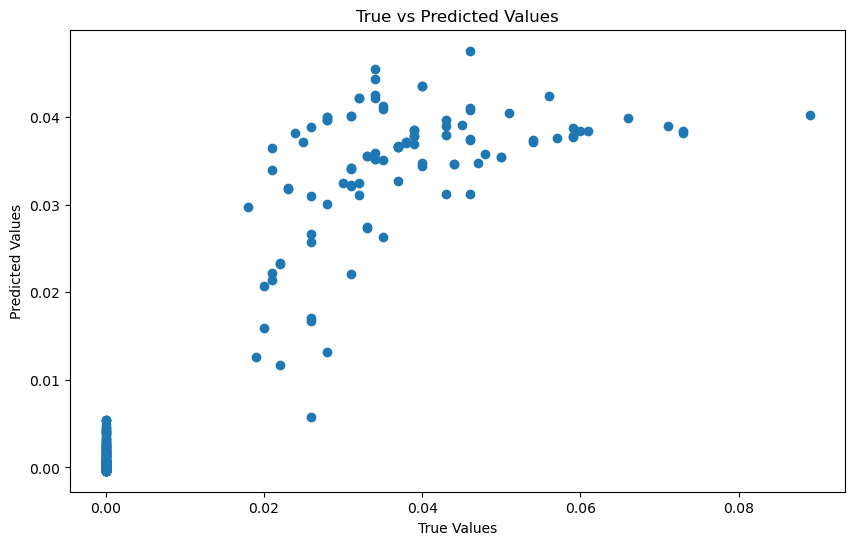

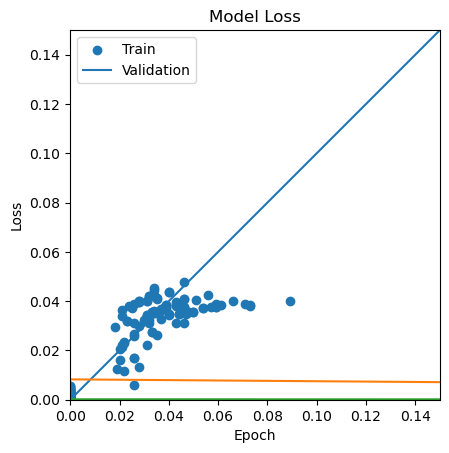

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 36ms/step - loss: 0.0371 - val_loss: 9.8449e-05 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 27ms/step - loss: 4.2891e-04 - val_loss: 1.3711e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 28ms/step - loss: 4.1805e-04 - val_loss: 1.4667e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 27ms/step - loss: 3.8511e-04 - val_loss: 3.4224e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 28ms/step - loss: 3.4209e-04 - val_loss: 1.2727e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 28ms/step - loss: 3.5703e-04 - val_loss: 1.0843e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 28ms/step - loss: 3.4719e-04 - val_loss: 1.5373e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 28ms/step - loss: 2.9149e-04 - val_loss: 1.8504e-04 - lr: 0.0100
Epoch 9/200
30/30 [=================

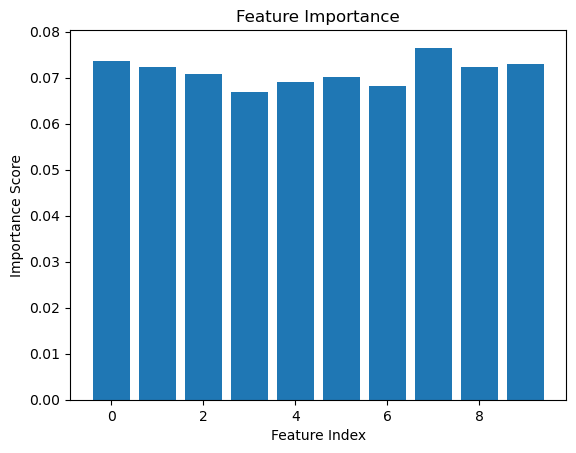

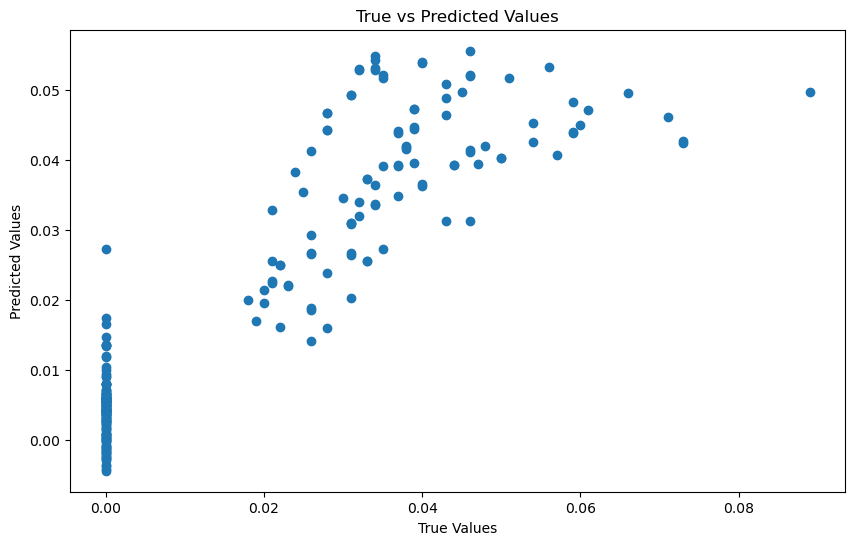

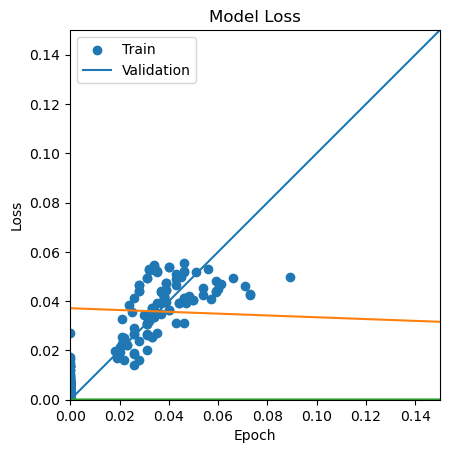

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 39ms/step - loss: 0.0061 - val_loss: 8.9223e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 31ms/step - loss: 5.8403e-04 - val_loss: 9.0480e-05 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 29ms/step - loss: 4.6852e-04 - val_loss: 1.1582e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 30ms/step - loss: 4.4655e-04 - val_loss: 2.3617e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 29ms/step - loss: 4.0786e-04 - val_loss: 9.8260e-05 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 30ms/step - loss: 4.1628e-04 - val_loss: 8.2170e-05 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 30ms/step - loss: 3.9670e-04 - val_loss: 1.0427e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 30ms/step - loss: 3.6293e-04 - val_loss: 1.1318e-04 - lr: 0.0100
Epoch 9/200
30/30 [=================

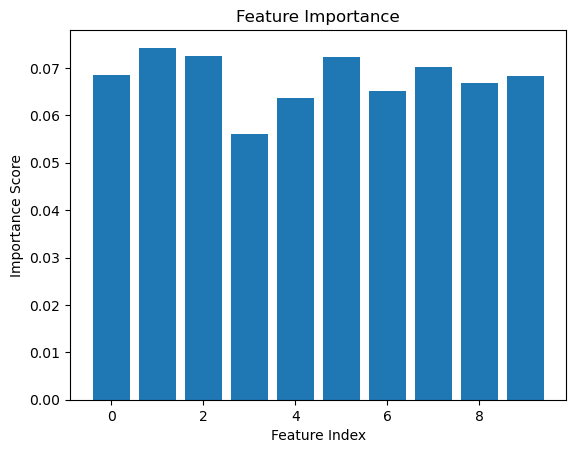

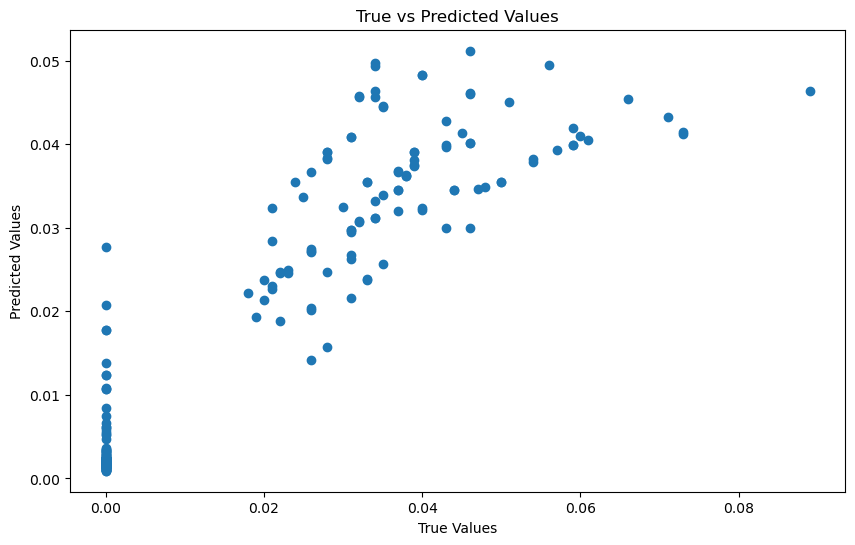

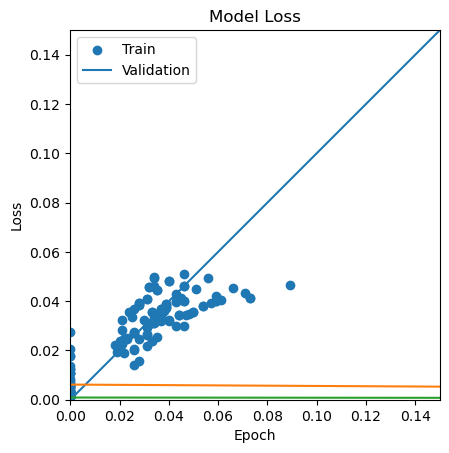

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 54ms/step - loss: 0.0178 - val_loss: 1.6762e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 39ms/step - loss: 6.3892e-04 - val_loss: 1.0132e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 35ms/step - loss: 7.0386e-04 - val_loss: 1.0829e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 29ms/step - loss: 5.5733e-04 - val_loss: 1.6368e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 29ms/step - loss: 4.6613e-04 - val_loss: 1.2697e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 29ms/step - loss: 4.8764e-04 - val_loss: 1.0487e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 30ms/step - loss: 4.2696e-04 - val_loss: 1.8154e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 31ms/step - loss: 4.1612e-04 - val_loss: 1.1806e-04 - lr: 0.0100
Epoch 9/200
30/30 [=================

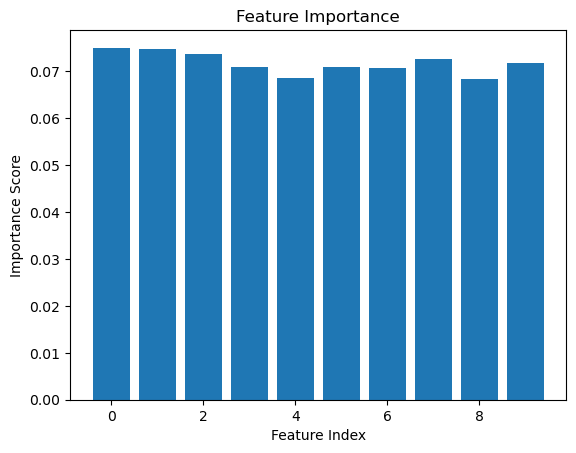

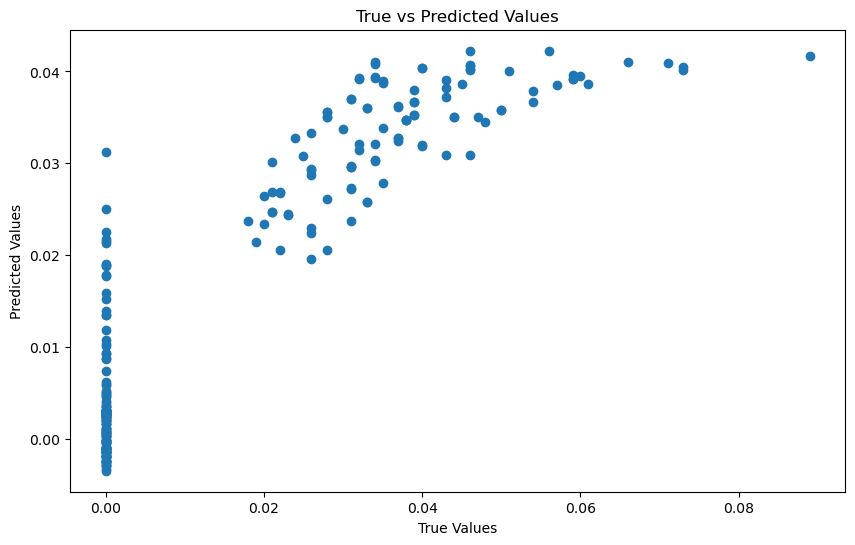

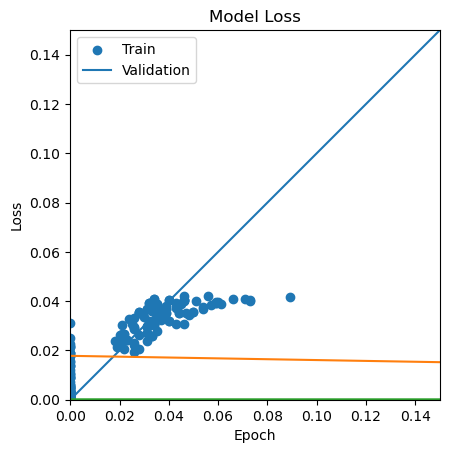

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 41ms/step - loss: 0.0088 - val_loss: 5.7348e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 31ms/step - loss: 8.5393e-04 - val_loss: 1.7259e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 30ms/step - loss: 6.8547e-04 - val_loss: 8.3954e-05 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 32ms/step - loss: 5.9082e-04 - val_loss: 3.9020e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 30ms/step - loss: 5.6328e-04 - val_loss: 8.3210e-05 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 31ms/step - loss: 5.2760e-04 - val_loss: 1.0345e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 30ms/step - loss: 4.8203e-04 - val_loss: 1.4758e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 30ms/step - loss: 4.4532e-04 - val_loss: 1.0201e-04 - lr: 0.0100
Epoch 9/200
30/30 [=================

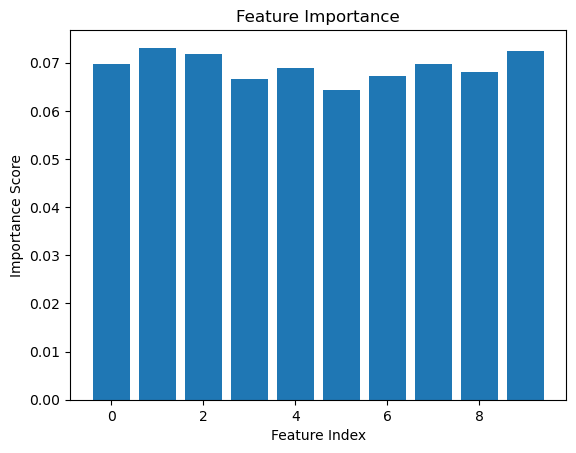

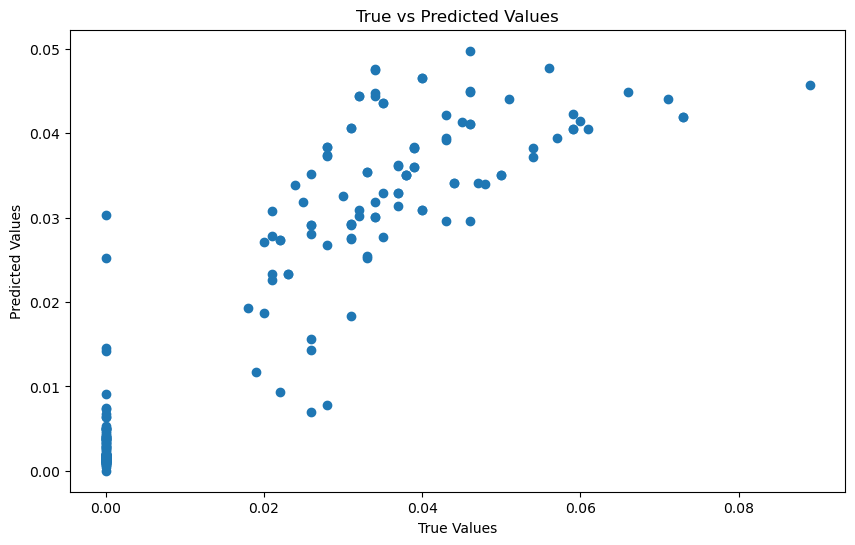

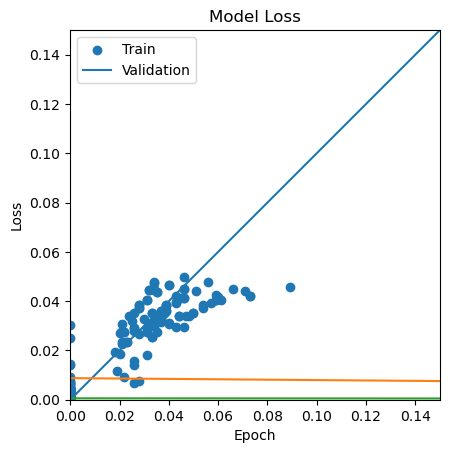

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 30ms/step - loss: 175908.7344 - val_loss: 4.6323e-04 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0014 - val_loss: 4.3266e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0012 - val_loss: 4.1871e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0013 - val_loss: 4.1386e-04 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0013 - val_loss: 5.5412e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0013 - val_loss: 0.0011 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0012 - val_loss: 0.0014 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0013 - val_loss: 7.5936e-04 - lr: 0.1000
Epoch 9/200
118/118 [==============================

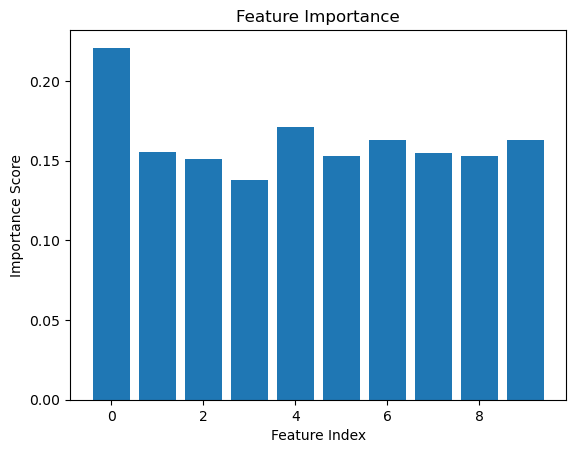

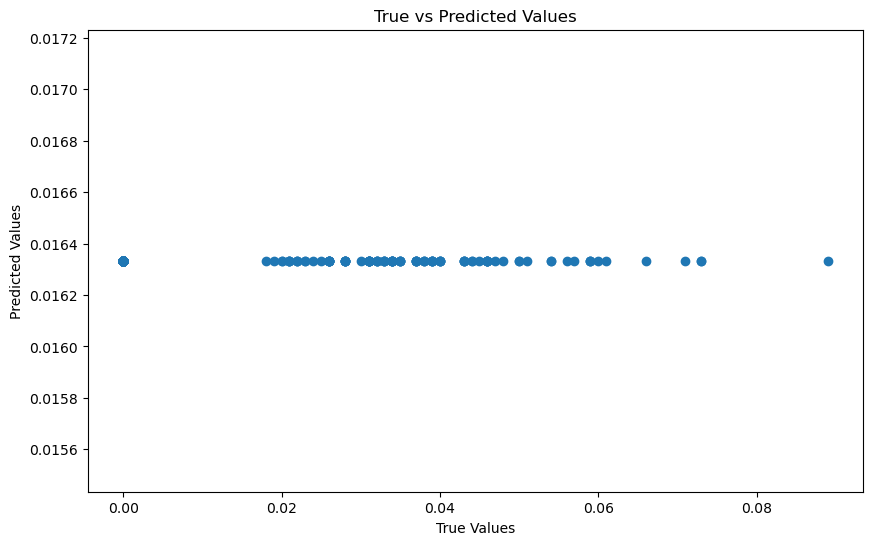

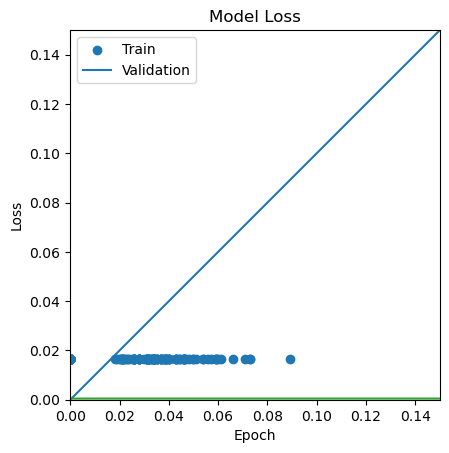

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 7s 35ms/step - loss: 269.0830 - val_loss: 0.0027 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 4s 37ms/step - loss: 0.0093 - val_loss: 5.6943e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 4s 31ms/step - loss: 0.0079 - val_loss: 0.0020 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0023 - val_loss: 4.2229e-04 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 3s 29ms/step - loss: 0.0022 - val_loss: 4.3618e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0019 - val_loss: 4.5342e-04 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 3s 29ms/step - loss: 0.0016 - val_loss: 4.5059e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0013 - val_loss: 4.5829e-04 - lr: 0.1000
Epoch 9/200
118/118 [==============================] -

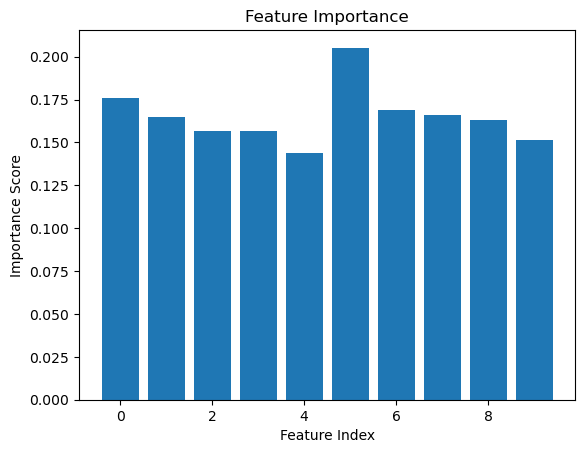

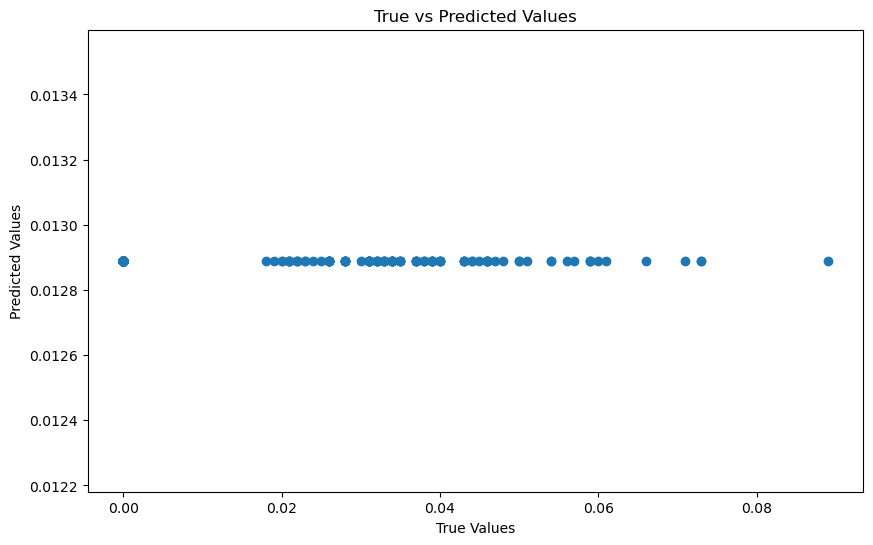

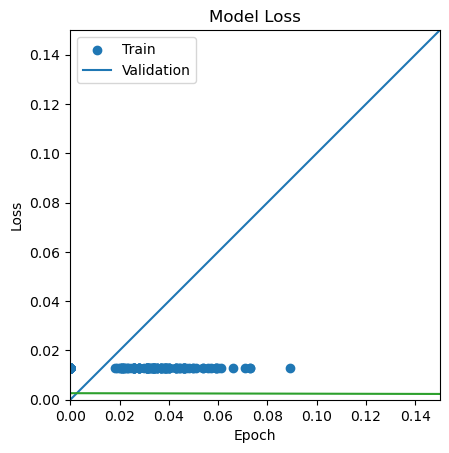

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 31ms/step - loss: 1810.8715 - val_loss: 8.6715e-04 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 3s 29ms/step - loss: 0.0110 - val_loss: 6.9036e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0262 - val_loss: 6.0242e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0319 - val_loss: 4.4608e-04 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0013 - val_loss: 4.4848e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0013 - val_loss: 4.5405e-04 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0012 - val_loss: 4.5602e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0271 - val_loss: 4.8905e-04 - lr: 0.1000
Epoch 9/200
118/118 [========================

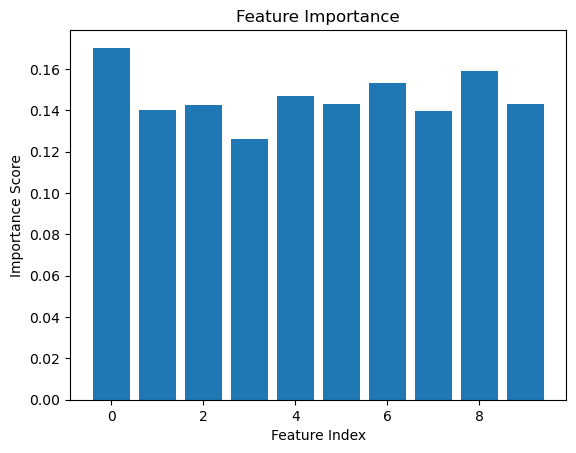

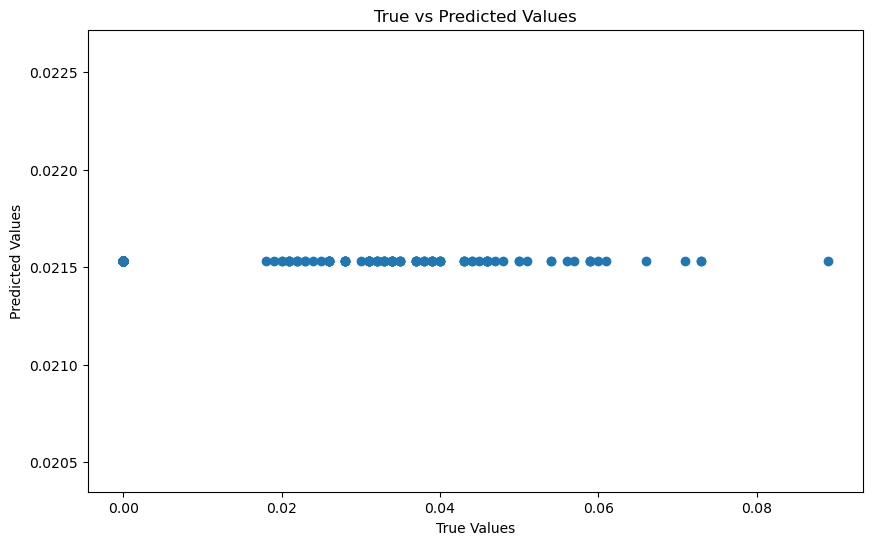

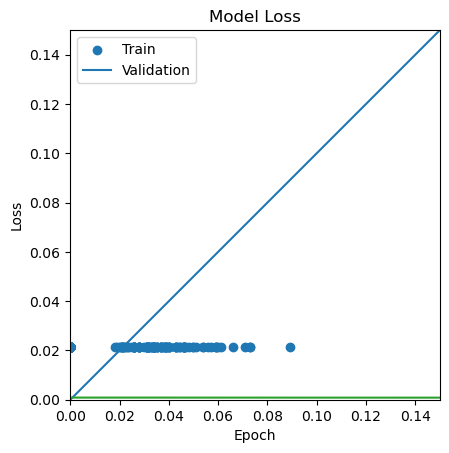

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 7s 37ms/step - loss: 72392.6484 - val_loss: 0.0014 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 4s 34ms/step - loss: 0.0033 - val_loss: 0.0044 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 4s 37ms/step - loss: 0.0032 - val_loss: 0.0051 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0035 - val_loss: 0.0063 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0040 - val_loss: 0.0031 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0031 - val_loss: 0.0011 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0023 - val_loss: 7.7982e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0055 - val_loss: 0.0031 - lr: 0.1000
Epoch 9/200
118/118 [==============================] - 3s 28ms/step - lo

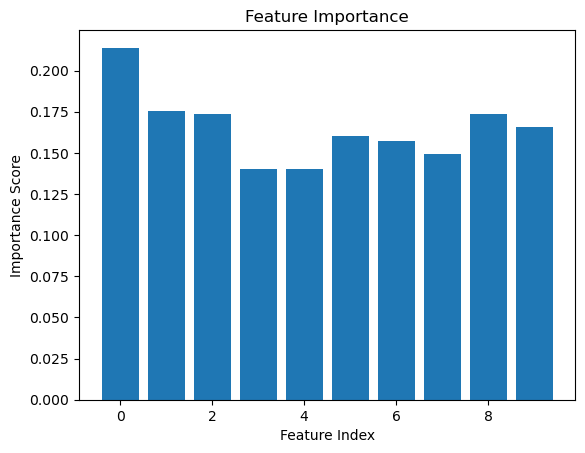

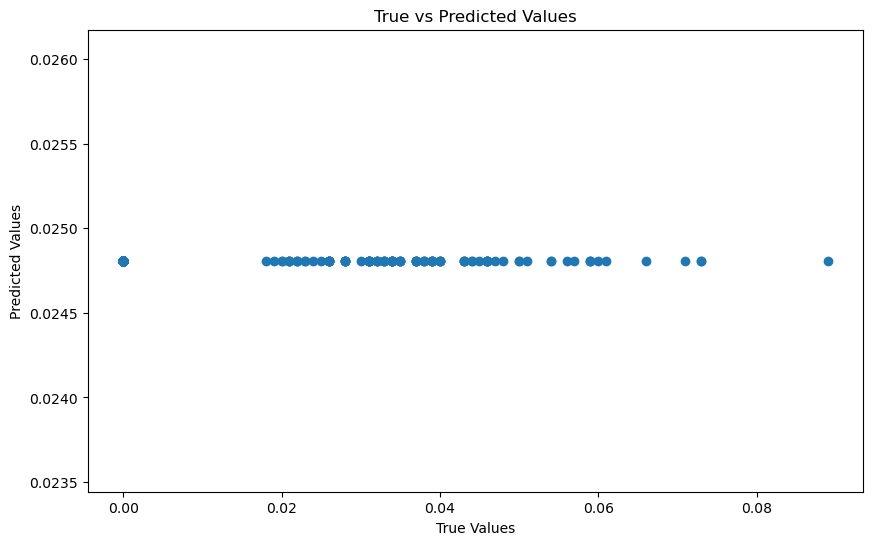

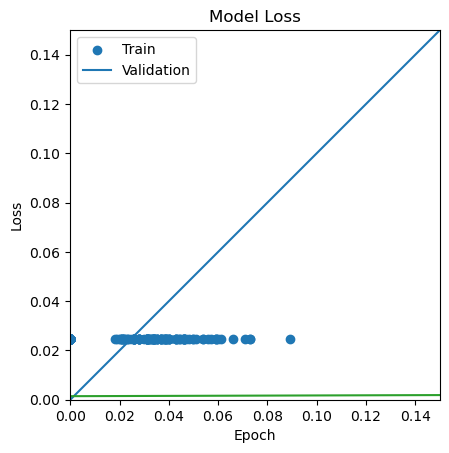

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 5s 39ms/step - loss: 2307.1675 - val_loss: 4.4394e-04 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 2s 32ms/step - loss: 0.0012 - val_loss: 4.3169e-04 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 2s 33ms/step - loss: 0.0012 - val_loss: 4.4925e-04 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 2s 31ms/step - loss: 0.0012 - val_loss: 4.6928e-04 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 2s 31ms/step - loss: 0.0012 - val_loss: 4.2367e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 2s 32ms/step - loss: 0.0012 - val_loss: 5.2699e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 2s 32ms/step - loss: 0.0012 - val_loss: 4.5739e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 2s 32ms/step - loss: 0.0012 - val_loss: 4.3772e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 2s 33ms/

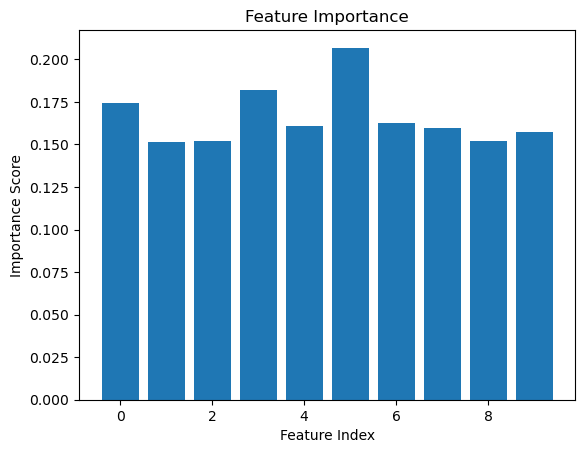

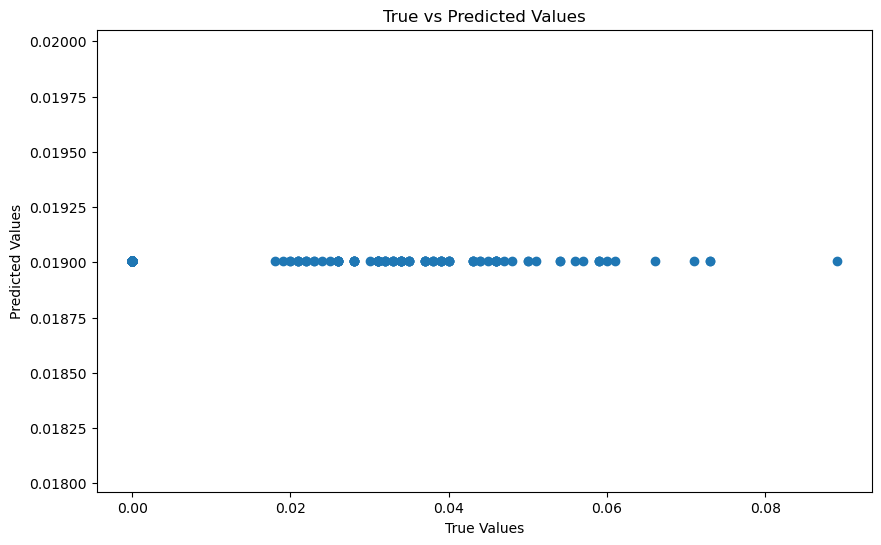

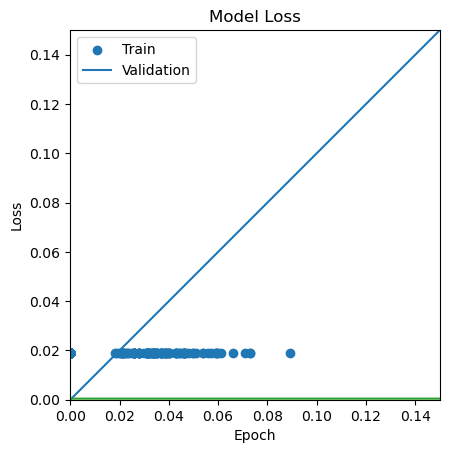

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 7s 45ms/step - loss: 22233.2031 - val_loss: 0.0135 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 2s 39ms/step - loss: 0.0176 - val_loss: 0.0124 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 2s 40ms/step - loss: 0.0112 - val_loss: 0.0110 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 2s 38ms/step - loss: 0.0098 - val_loss: 0.0095 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 2s 37ms/step - loss: 0.0084 - val_loss: 0.0080 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 2s 39ms/step - loss: 0.0071 - val_loss: 0.0067 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 3s 45ms/step - loss: 0.0060 - val_loss: 0.0055 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 2s 40ms/step - loss: 0.4325 - val_loss: 0.0048 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 2s 37ms/step - loss: 54.9121 - val_loss

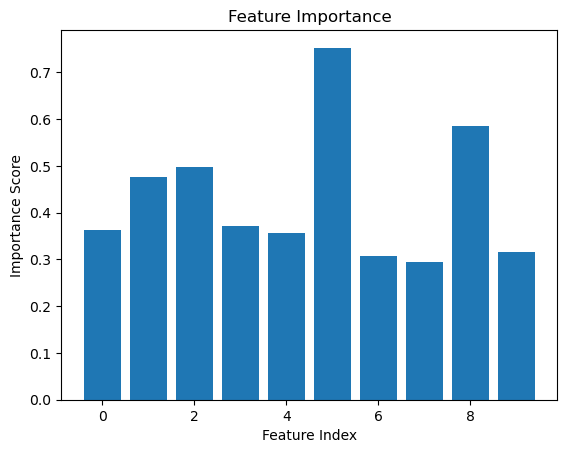

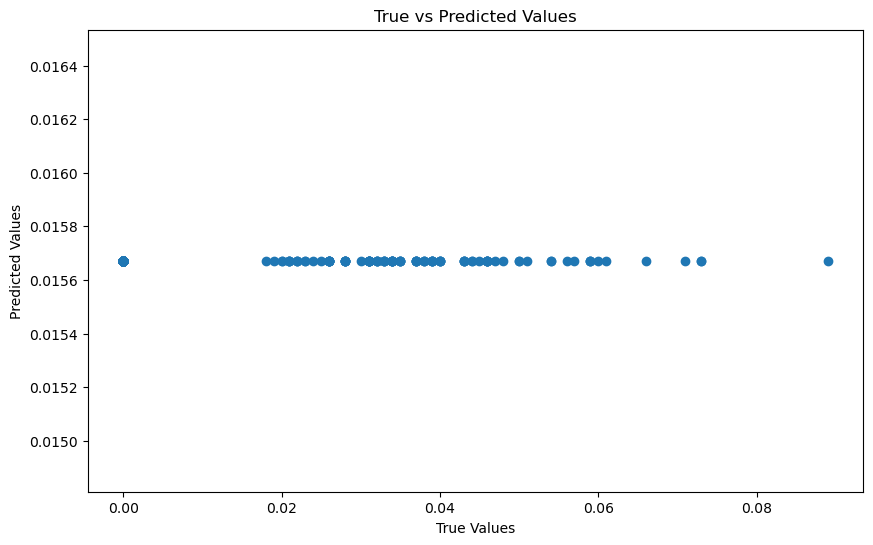

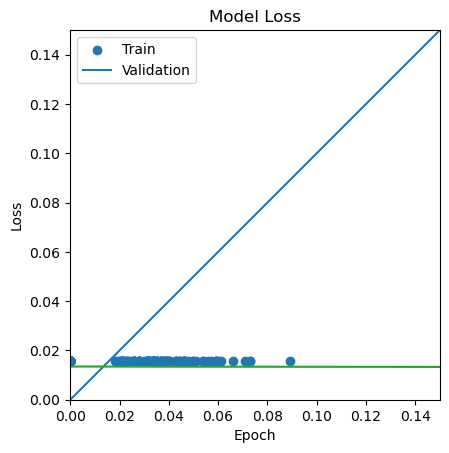

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 34ms/step - loss: 1799.9904 - val_loss: 0.0071 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 2s 30ms/step - loss: 0.0062 - val_loss: 0.0051 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 2s 30ms/step - loss: 0.0043 - val_loss: 0.0033 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0138 - val_loss: 0.0022 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 2s 30ms/step - loss: 0.0021 - val_loss: 0.0013 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0017 - val_loss: 8.9922e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0021 - val_loss: 6.6368e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0013 - val_loss: 5.4980e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0012 

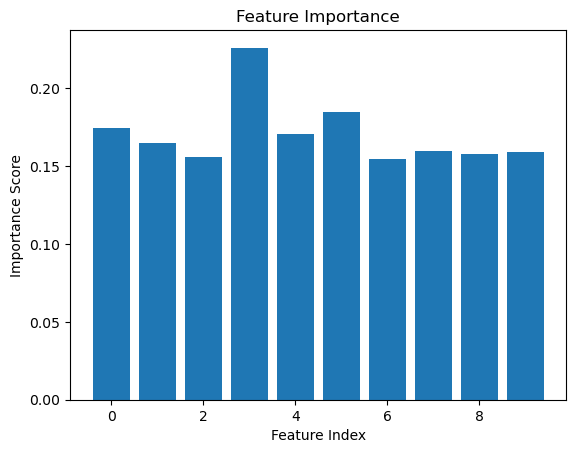

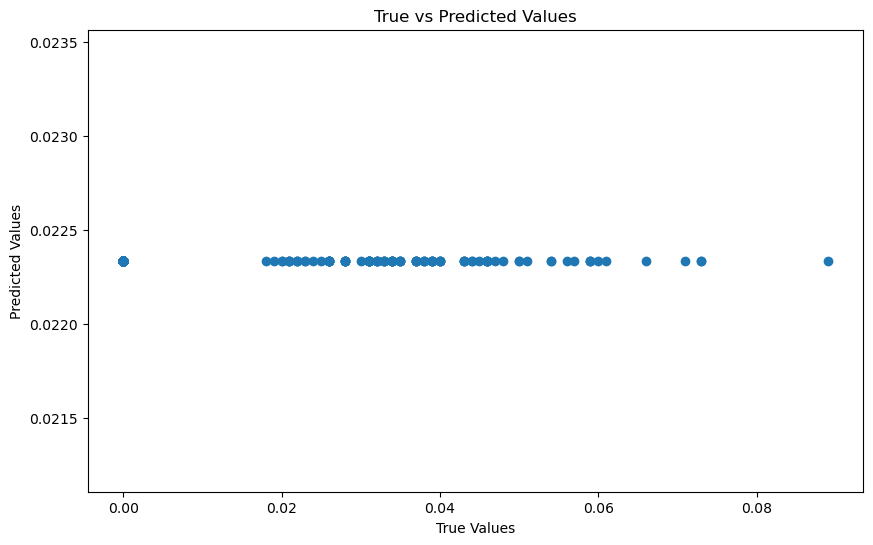

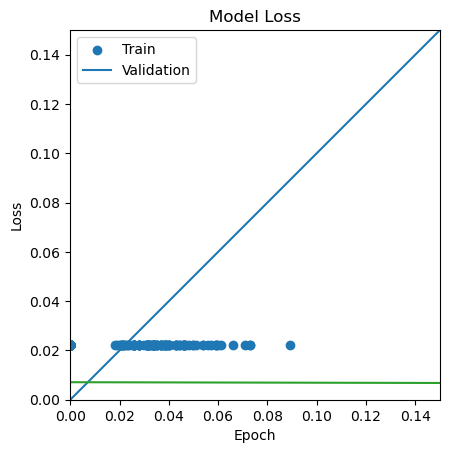

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 35ms/step - loss: 2045.9490 - val_loss: 0.0095 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0107 - val_loss: 0.0071 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 2s 30ms/step - loss: 0.0058 - val_loss: 0.0048 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0045 - val_loss: 0.0031 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 2s 29ms/step - loss: 2.9369 - val_loss: 0.0044 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 2s 30ms/step - loss: 0.0036 - val_loss: 0.0026 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 2s 30ms/step - loss: 0.0023 - val_loss: 0.0015 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0018 - val_loss: 9.6792e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0014 - val_lo

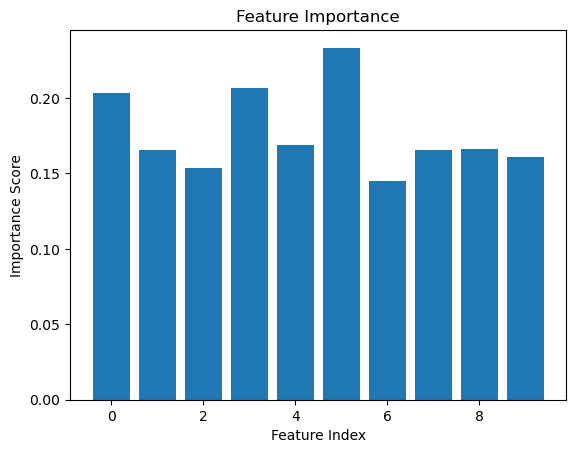

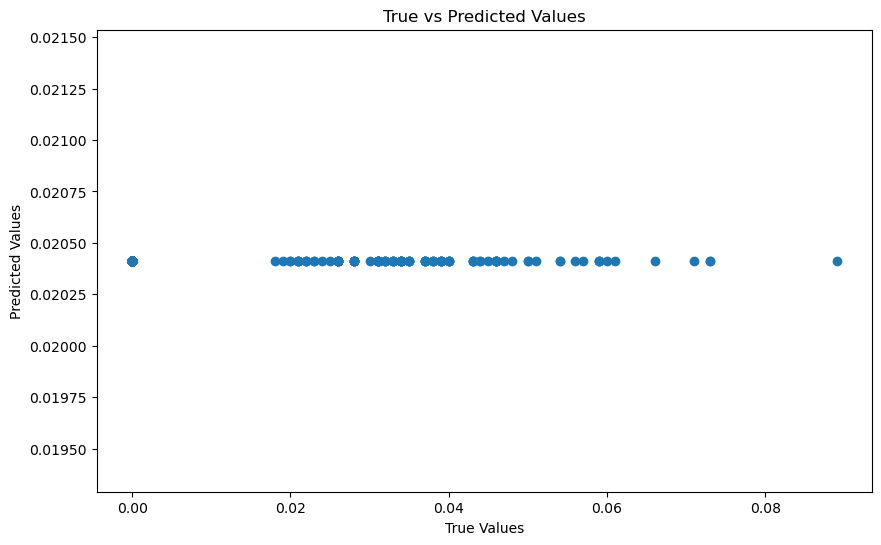

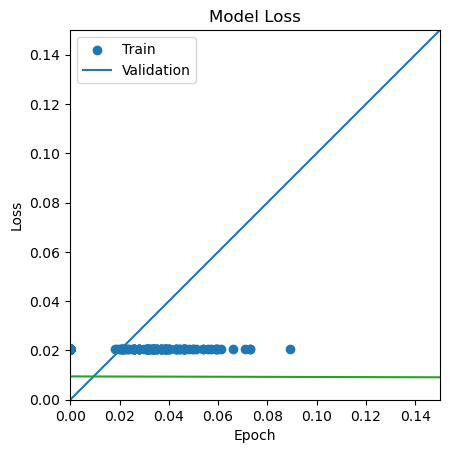

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 36ms/step - loss: 882732.8125 - val_loss: 0.0029 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0028 - val_loss: 0.0032 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0027 - val_loss: 0.0018 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0016 - val_loss: 0.0010 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0015 - val_loss: 0.0015 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0020 - val_loss: 5.7996e-04 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0231 - val_loss: 7.4104e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0016 - val_loss: 0.0013 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0016 - 

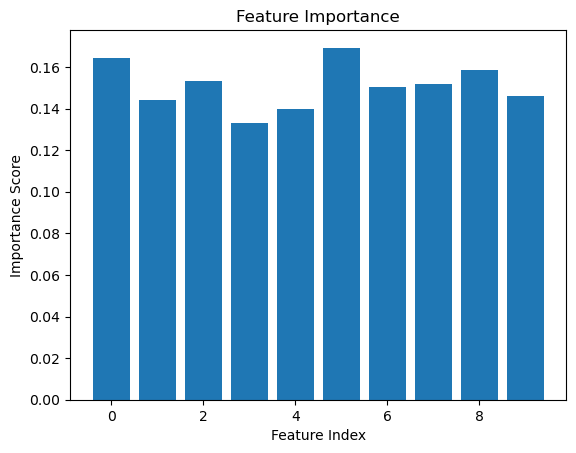

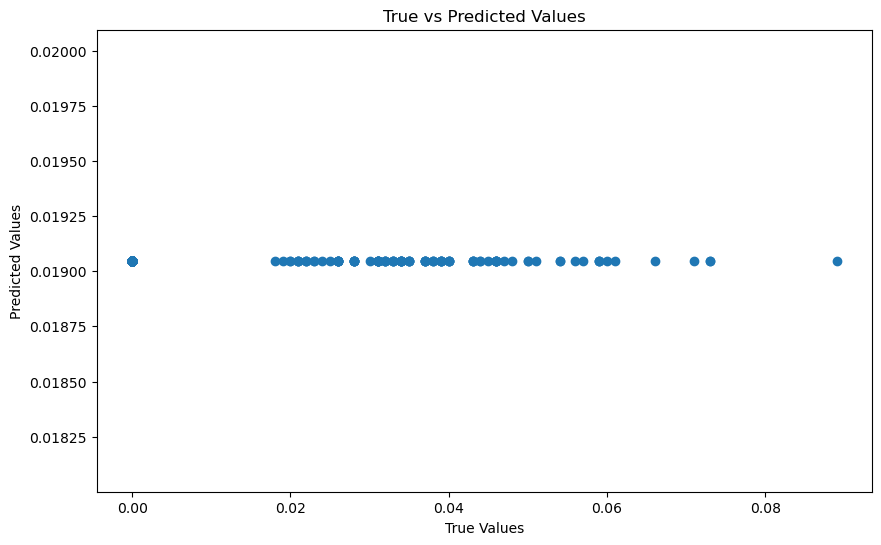

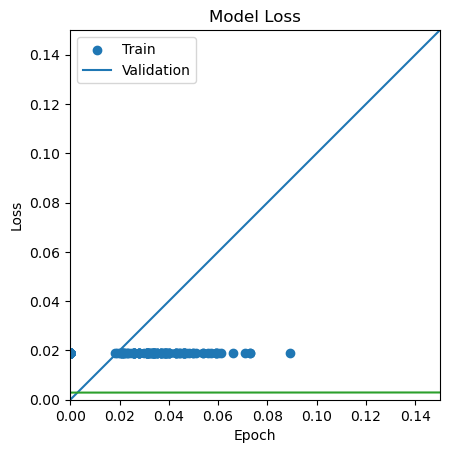

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 41ms/step - loss: 16922.5430 - val_loss: 0.0191 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 30ms/step - loss: 4.3565 - val_loss: 0.0138 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 31ms/step - loss: 0.4160 - val_loss: 0.0107 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 31ms/step - loss: 0.0324 - val_loss: 0.0102 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 37ms/step - loss: 0.0410 - val_loss: 0.0413 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 31ms/step - loss: 0.0458 - val_loss: 0.0363 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0276 - val_loss: 0.0060 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0173 - val_loss: 0.0058 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 31ms/step - loss: 0.0153 - val_loss:

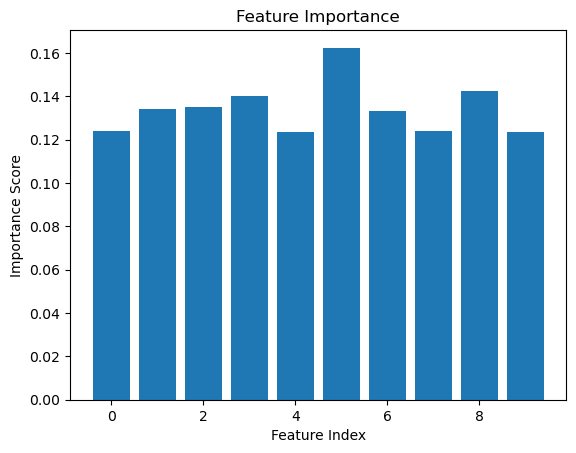

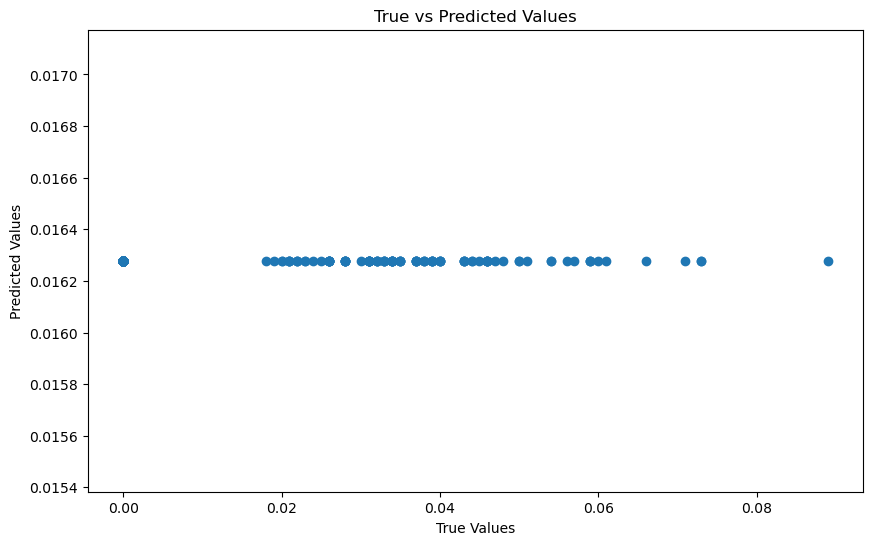

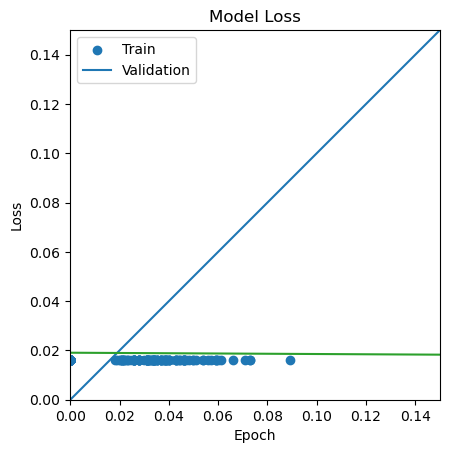

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 38ms/step - loss: 402.9694 - val_loss: 0.1541 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0183 - val_loss: 5.1780e-04 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0045 - val_loss: 0.0014 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0032 - val_loss: 0.0011 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0031 - val_loss: 0.0015 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0027 - val_loss: 0.0019 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 33ms/step - loss: 0.0027 - val_loss: 9.1708e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0022 - val_loss: 0.0013 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0020 - val

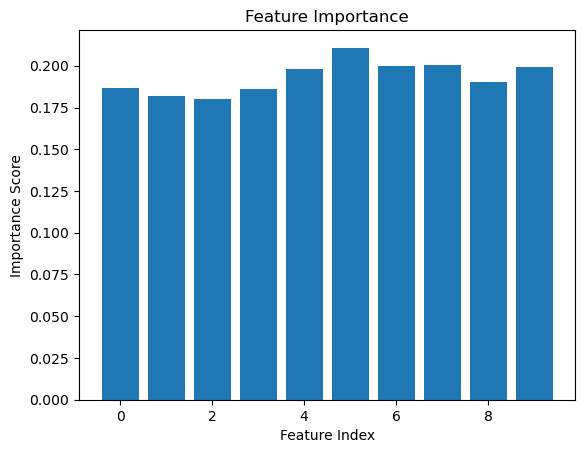

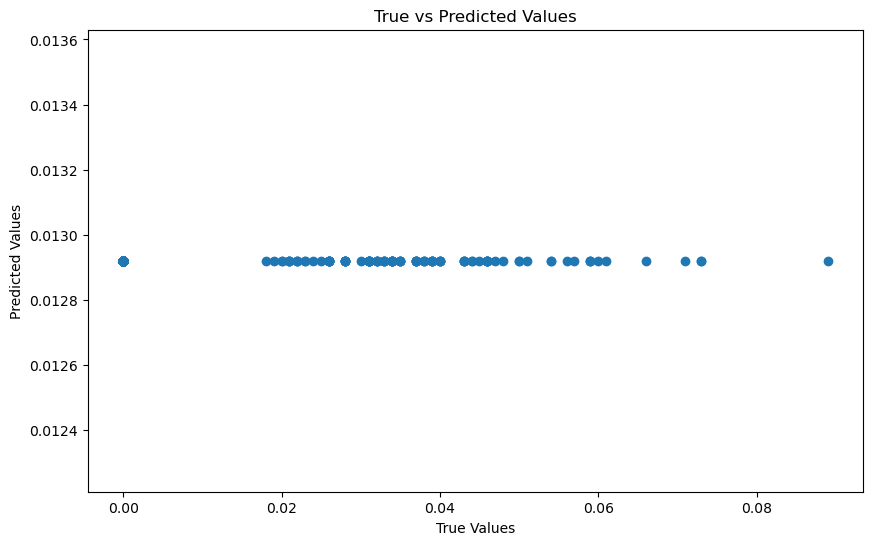

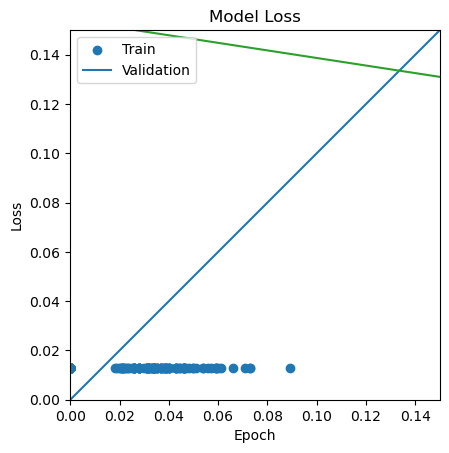

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 41ms/step - loss: 455996.9062 - val_loss: 4.2581e-04 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0624 - val_loss: 0.0217 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 29ms/step - loss: 0.1616 - val_loss: 0.0216 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0242 - val_loss: 0.0212 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0236 - val_loss: 0.0207 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0231 - val_loss: 0.0202 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0226 - val_loss: 0.0197 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0220 - val_loss: 0.0191 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0214 - val_

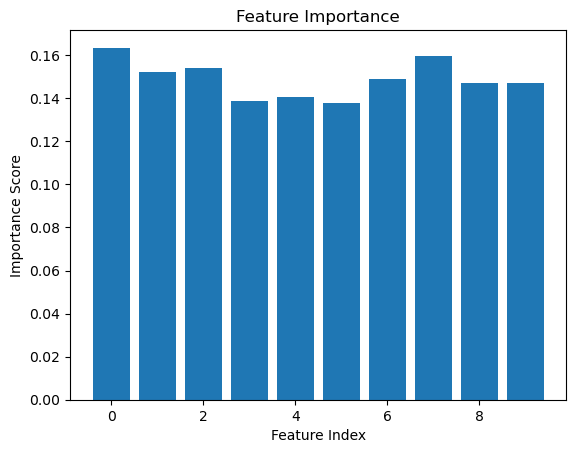

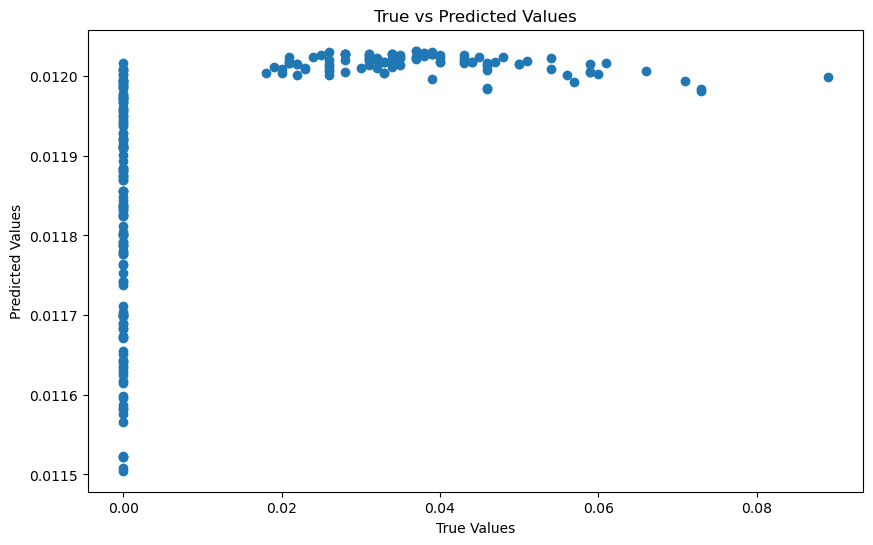

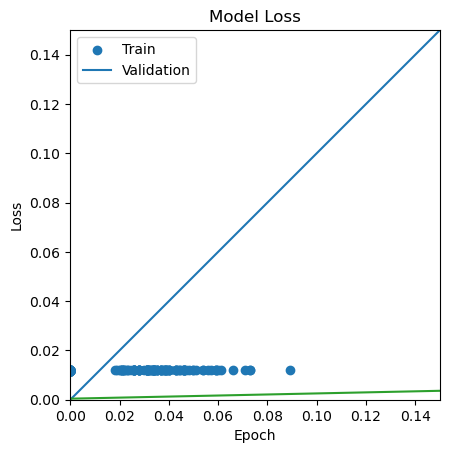

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 4s 20ms/step - loss: 4.8930e-04 - val_loss: 1.5555e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 2s 17ms/step - loss: 3.0535e-04 - val_loss: 4.3484e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 2s 17ms/step - loss: 2.7235e-04 - val_loss: 3.5265e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 1s 12ms/step - loss: 2.5494e-04 - val_loss: 4.2123e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 1s 12ms/step - loss: 2.5724e-04 - val_loss: 4.9451e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 1s 12ms/step - loss: 2.4616e-04 - val_loss: 0.0013 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 1s 12ms/step - loss: 2.4154e-04 - val_loss: 0.0014 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 1s 12ms/step - loss: 2.1060e-04 - val_loss: 0.0023 - lr: 1.0000e

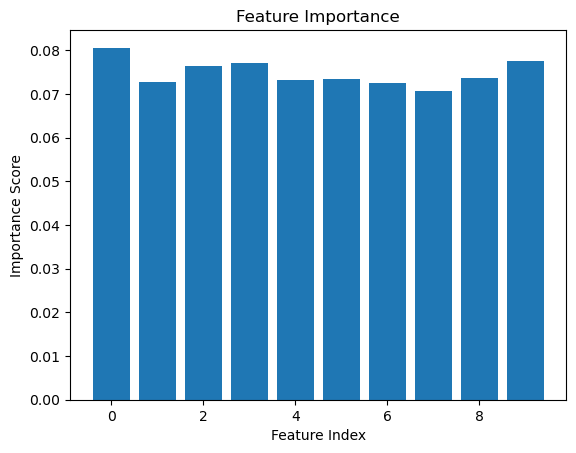

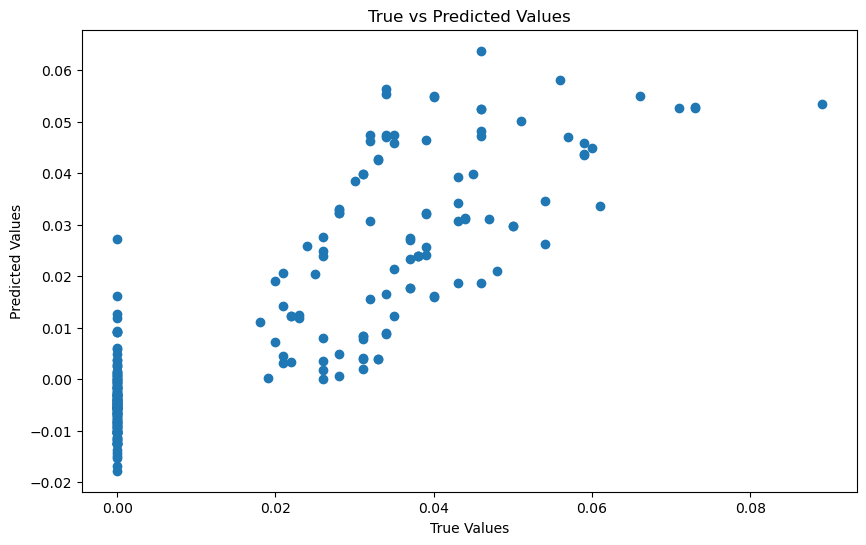

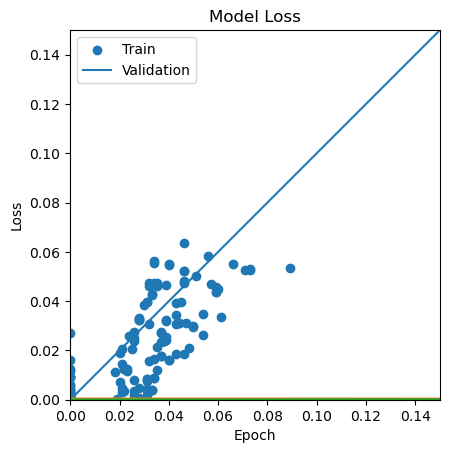

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 15ms/step - loss: 0.0019 - val_loss: 4.9665e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 2s 13ms/step - loss: 0.0010 - val_loss: 3.7704e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 2s 13ms/step - loss: 7.8718e-04 - val_loss: 3.1944e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 2s 13ms/step - loss: 6.7770e-04 - val_loss: 2.4750e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 2s 13ms/step - loss: 6.1072e-04 - val_loss: 2.4554e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 2s 13ms/step - loss: 5.7356e-04 - val_loss: 1.5495e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 2s 13ms/step - loss: 5.2145e-04 - val_loss: 1.7597e-04 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 2s 13ms/step - loss: 4.7872e-04 - val_loss: 1.1562e-04 - lr: 1.0

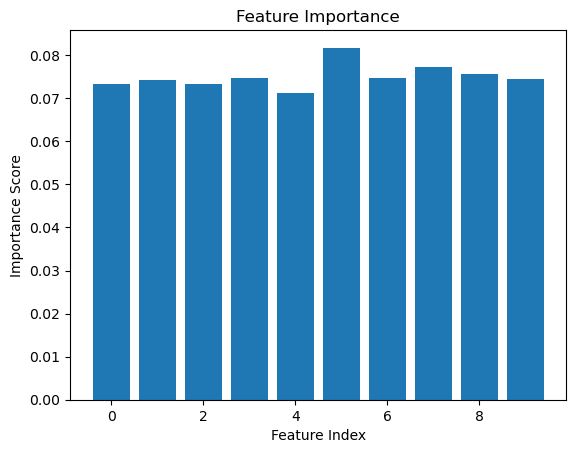

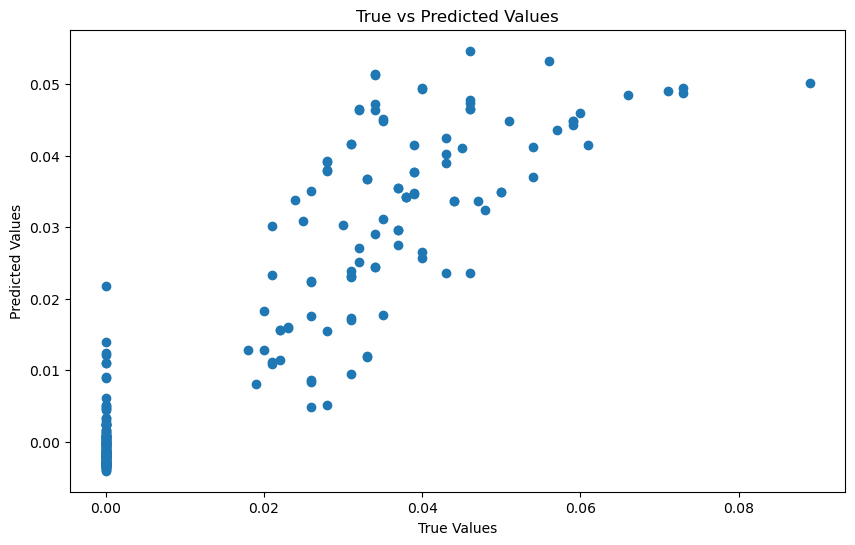

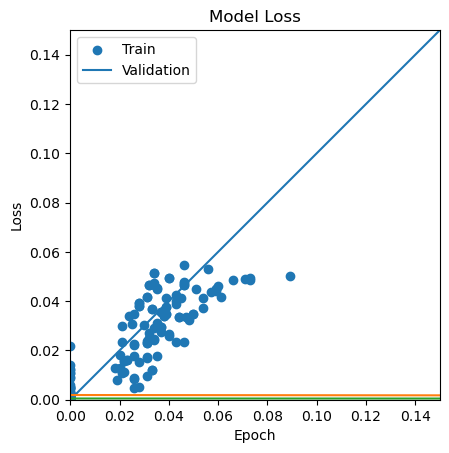

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 19ms/step - loss: 0.0032 - val_loss: 3.7789e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0015 - val_loss: 1.9764e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 2s 17ms/step - loss: 0.0011 - val_loss: 2.1550e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 2s 19ms/step - loss: 8.6691e-04 - val_loss: 1.8849e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 2s 17ms/step - loss: 7.8136e-04 - val_loss: 2.1961e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 2s 14ms/step - loss: 6.8342e-04 - val_loss: 1.7304e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 2s 13ms/step - loss: 6.0207e-04 - val_loss: 1.5107e-04 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 2s 16ms/step - loss: 6.4619e-04 - val_loss: 1.7248e-04 - lr: 1.0000e

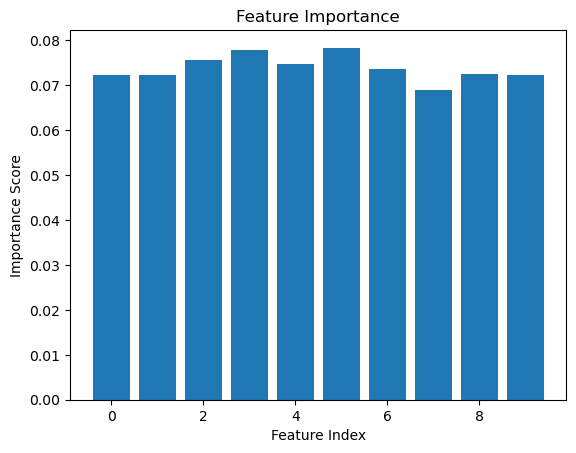

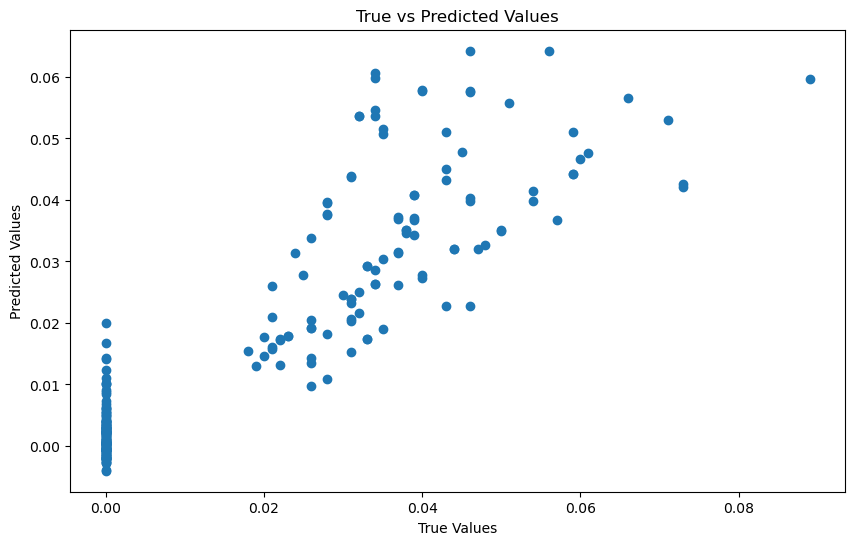

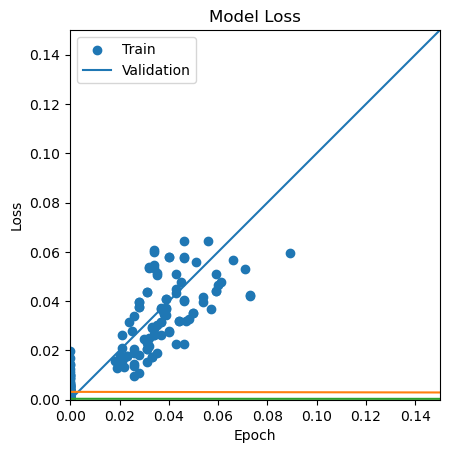

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 18ms/step - loss: 0.0079 - val_loss: 5.5088e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0028 - val_loss: 1.4191e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0020 - val_loss: 1.9135e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0015 - val_loss: 1.5203e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0012 - val_loss: 1.2552e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0011 - val_loss: 1.0698e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 2s 18ms/step - loss: 9.1862e-04 - val_loss: 9.7698e-05 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 2s 15ms/step - loss: 9.2733e-04 - val_loss: 1.0120e-04 - lr: 1.0000e-04
Epoch 9/

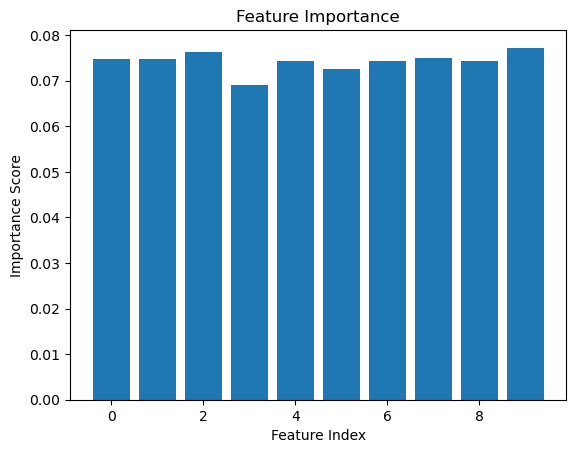

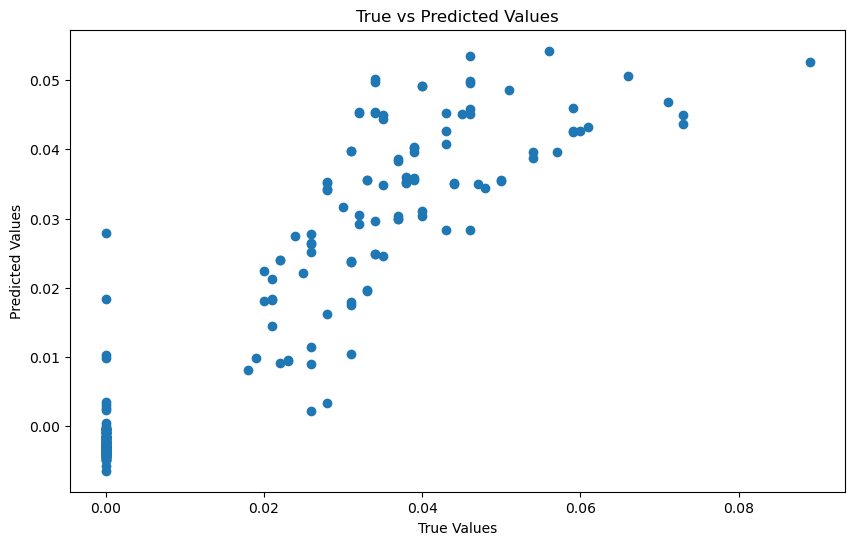

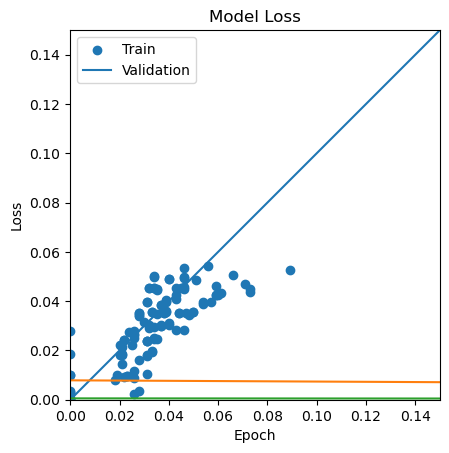

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 17ms/step - loss: 8.7772e-04 - val_loss: 2.3307e-04 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 1s 12ms/step - loss: 3.1683e-04 - val_loss: 1.8407e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 1s 12ms/step - loss: 2.8786e-04 - val_loss: 2.0840e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 1s 12ms/step - loss: 2.7270e-04 - val_loss: 1.9640e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 1s 12ms/step - loss: 2.6668e-04 - val_loss: 1.4703e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 1s 12ms/step - loss: 2.5067e-04 - val_loss: 1.4732e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 1s 12ms/step - loss: 2.4696e-04 - val_loss: 1.4539e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 1s 12ms/step - loss: 2.3182e-04 - val_loss: 1.5958e-04 - lr: 1.0000e-04


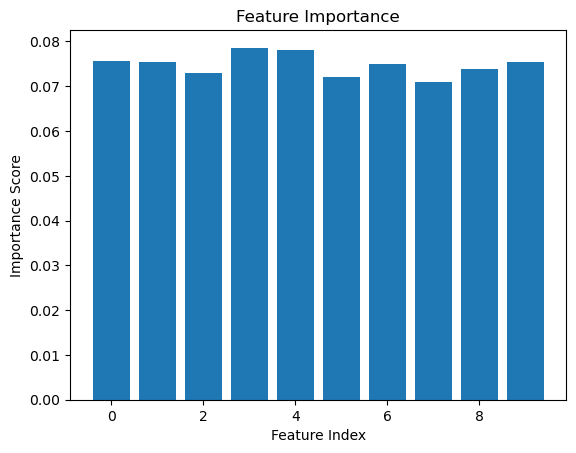

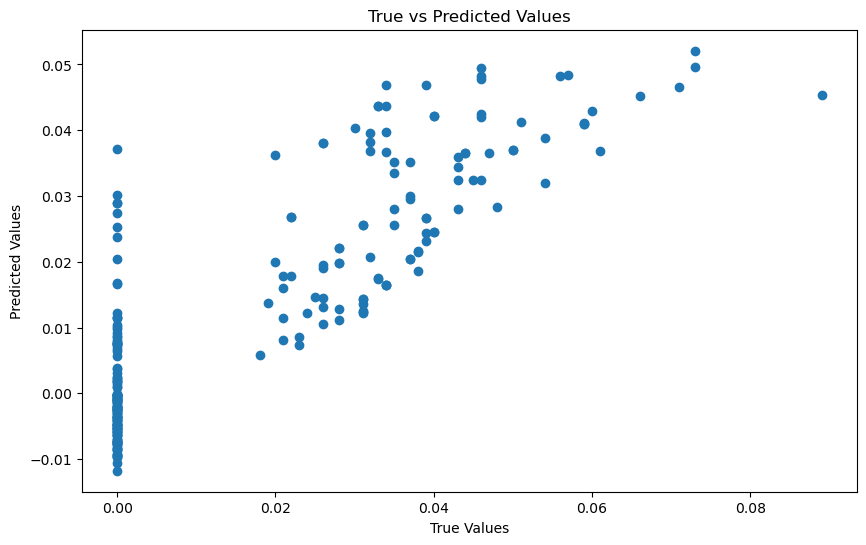

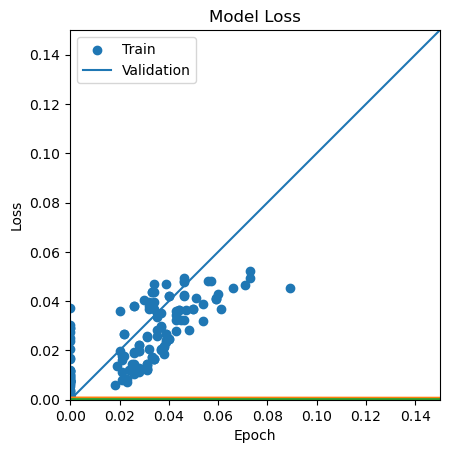

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 17ms/step - loss: 0.0033 - val_loss: 0.0023 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 1s 13ms/step - loss: 0.0014 - val_loss: 6.0866e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 1s 13ms/step - loss: 0.0011 - val_loss: 2.7251e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 1s 13ms/step - loss: 8.4832e-04 - val_loss: 3.4049e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 1s 13ms/step - loss: 6.5533e-04 - val_loss: 1.7931e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 1s 14ms/step - loss: 6.9182e-04 - val_loss: 1.4224e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 1s 14ms/step - loss: 6.0513e-04 - val_loss: 1.8900e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 1s 13ms/step - loss: 5.9604e-04 - val_loss: 2.0505e-04 - lr: 1.0000e-04
Epoch 9/200
59/5

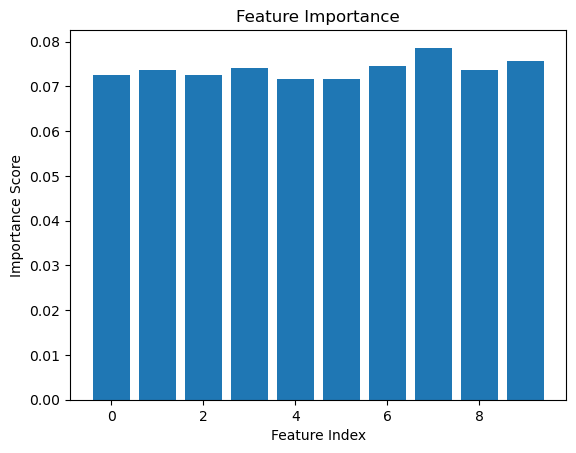

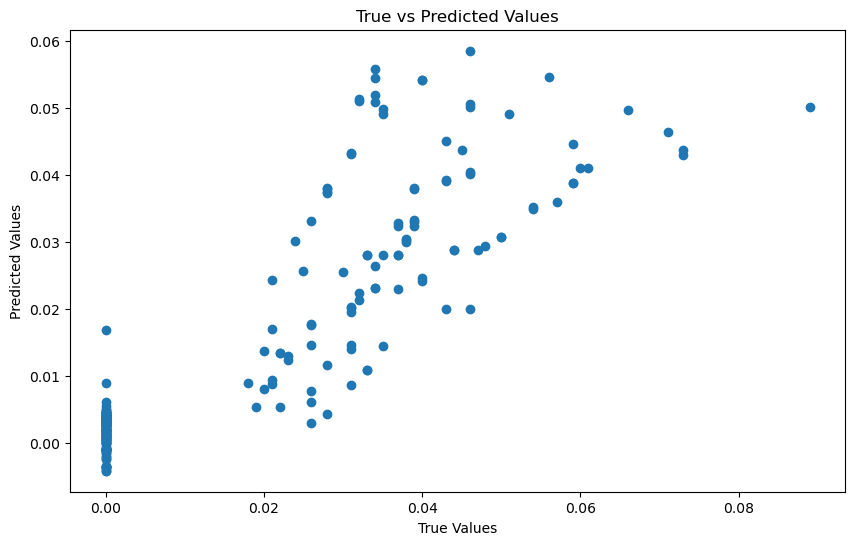

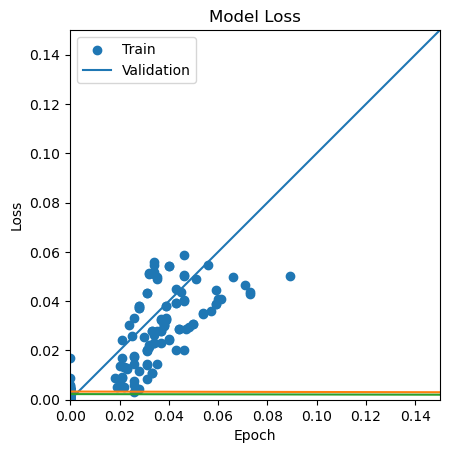

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 18ms/step - loss: 0.0035 - val_loss: 0.0010 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0018 - val_loss: 3.9432e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0014 - val_loss: 3.8712e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0010 - val_loss: 2.2193e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 1s 14ms/step - loss: 9.8041e-04 - val_loss: 2.1589e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 1s 14ms/step - loss: 9.0609e-04 - val_loss: 2.3842e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 1s 14ms/step - loss: 7.9112e-04 - val_loss: 1.6684e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 1s 14ms/step - loss: 7.5834e-04 - val_loss: 1.2268e-04 - lr: 1.0000e-04
Epoch 9/200
59/59 [=

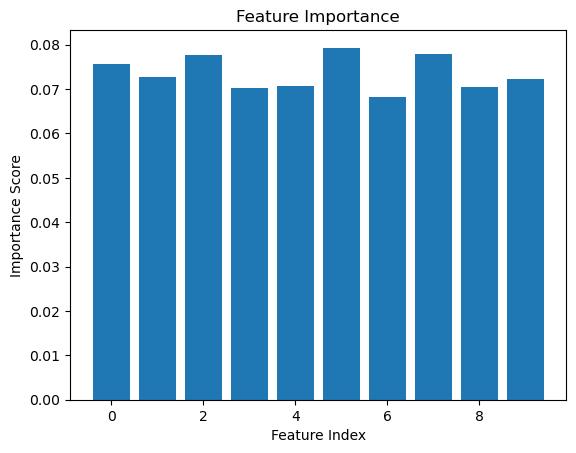

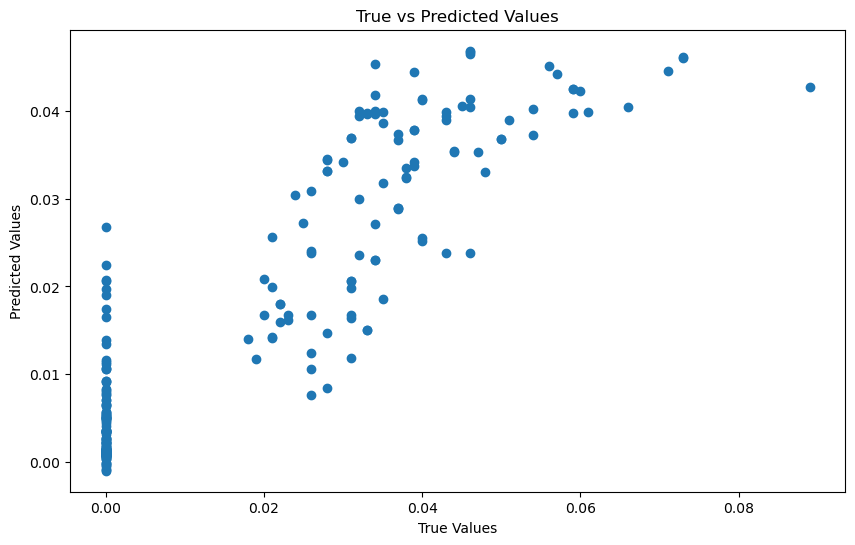

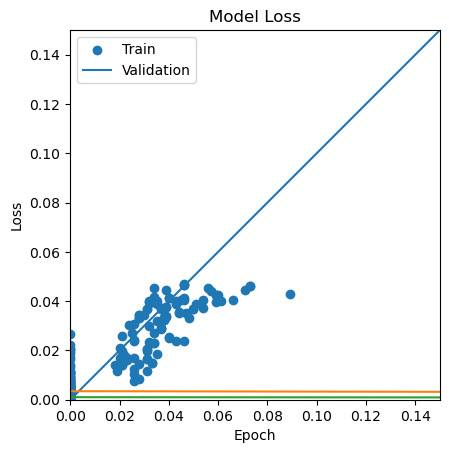

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 19ms/step - loss: 0.0052 - val_loss: 0.0015 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 1s 13ms/step - loss: 0.0025 - val_loss: 6.0410e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 1s 13ms/step - loss: 0.0020 - val_loss: 6.1036e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 1s 13ms/step - loss: 0.0016 - val_loss: 4.6078e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0014 - val_loss: 4.2155e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 1s 13ms/step - loss: 0.0012 - val_loss: 3.9033e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 1s 13ms/step - loss: 0.0011 - val_loss: 3.2090e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 1s 13ms/step - loss: 9.9822e-04 - val_loss: 2.7808e-04 - lr: 1.0000e-04
Epoch 9/200
59/59 [=============

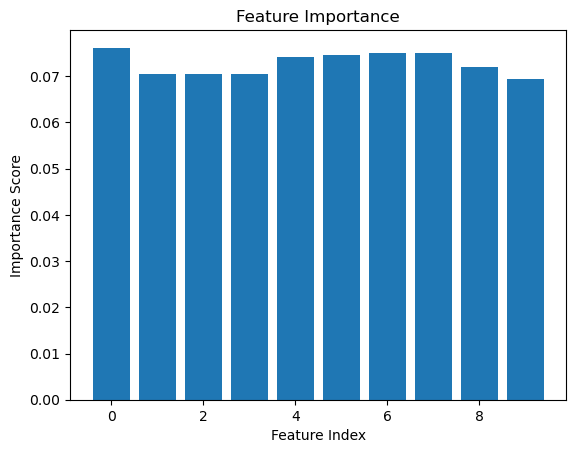

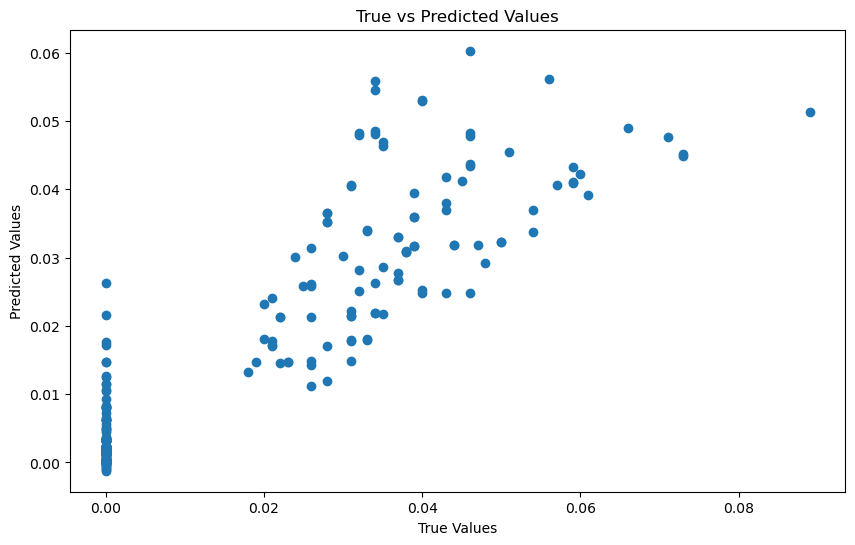

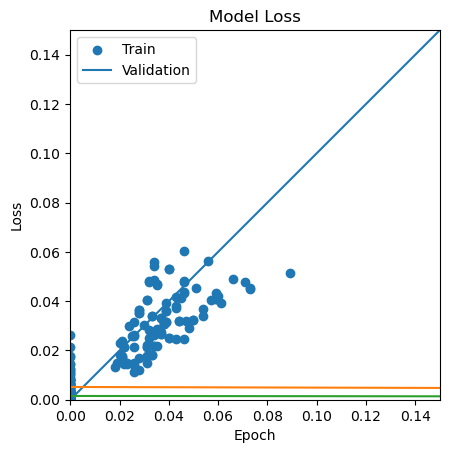

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 25ms/step - loss: 0.0019 - val_loss: 1.7937e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 0s 15ms/step - loss: 4.3006e-04 - val_loss: 1.9619e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 0s 15ms/step - loss: 3.2852e-04 - val_loss: 2.1000e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 0s 14ms/step - loss: 2.9758e-04 - val_loss: 2.6385e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 0s 15ms/step - loss: 2.8054e-04 - val_loss: 2.9891e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 0s 14ms/step - loss: 2.6284e-04 - val_loss: 3.9696e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 0s 15ms/step - loss: 2.5734e-04 - val_loss: 4.2312e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 0s 15ms/step - loss: 2.4436e-04 - val_loss: 4.2492e-04 - lr: 1.0000e-04
Epoc

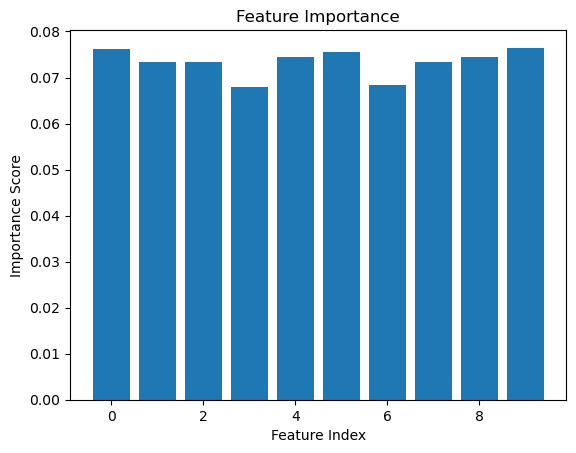

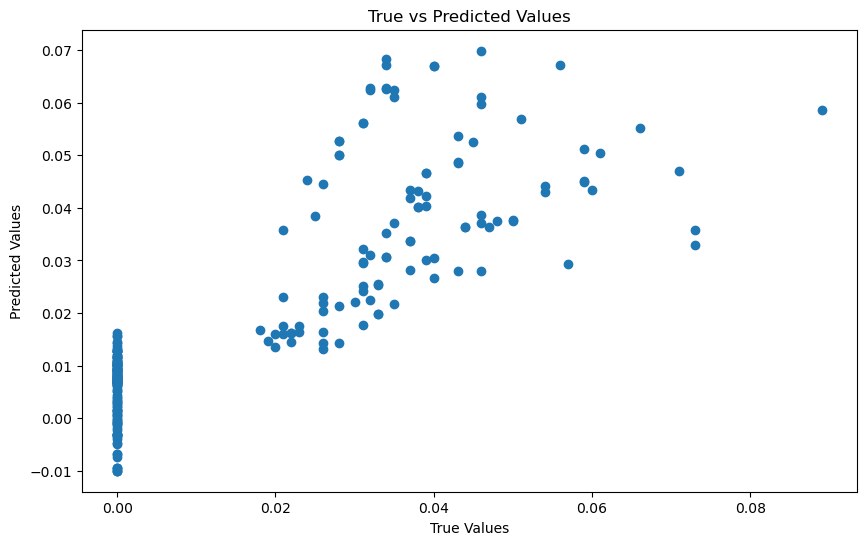

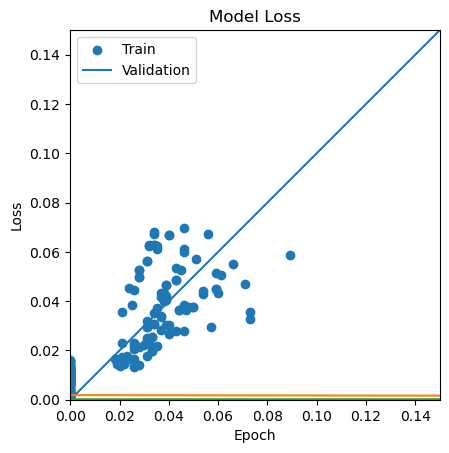

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 26ms/step - loss: 0.0028 - val_loss: 3.0019e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 17ms/step - loss: 0.0012 - val_loss: 1.8463e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0010 - val_loss: 2.8360e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 17ms/step - loss: 8.5176e-04 - val_loss: 2.4387e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 0s 16ms/step - loss: 7.7638e-04 - val_loss: 2.0072e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 19ms/step - loss: 7.0559e-04 - val_loss: 2.3107e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 21ms/step - loss: 6.9361e-04 - val_loss: 1.7956e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 20ms/step - loss: 6.6600e-04 - val_loss: 1.5454e-04 - lr: 1.0000e-04
Epoch 9/200


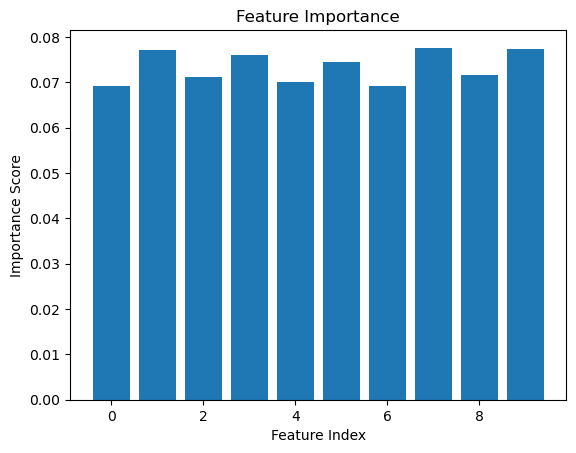

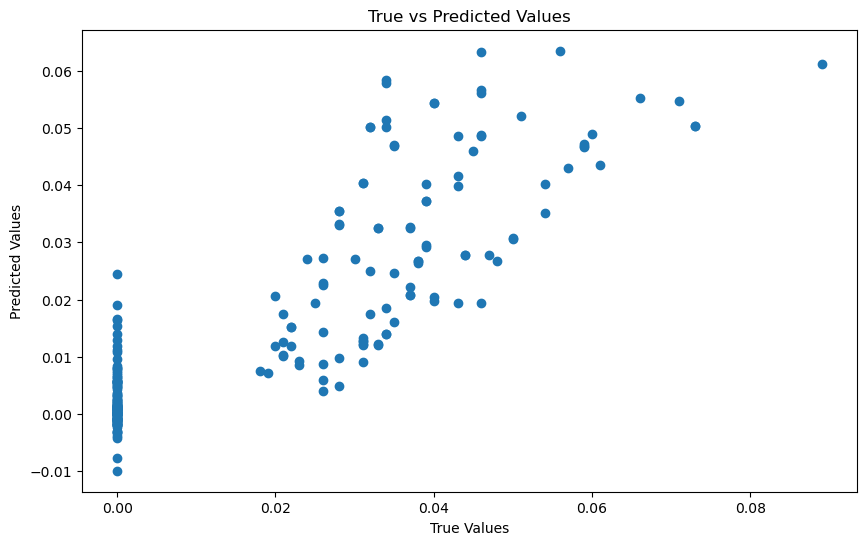

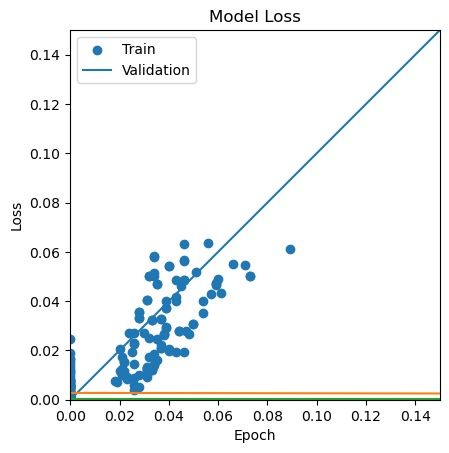

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 25ms/step - loss: 0.0097 - val_loss: 9.0636e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0027 - val_loss: 5.3889e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0020 - val_loss: 3.6721e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 17ms/step - loss: 0.0016 - val_loss: 2.9859e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0014 - val_loss: 2.7897e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0014 - val_loss: 2.2059e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 16ms/step - loss: 0.0012 - val_loss: 2.1884e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0011 - val_loss: 2.1799e-04 - lr: 1.0000e-04
Epoch 9/200
30/30 [=============

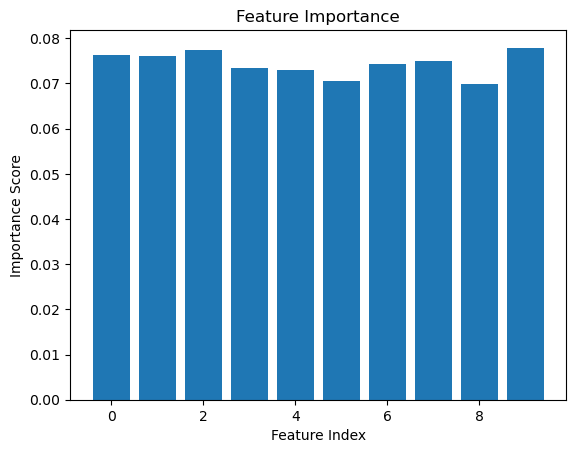

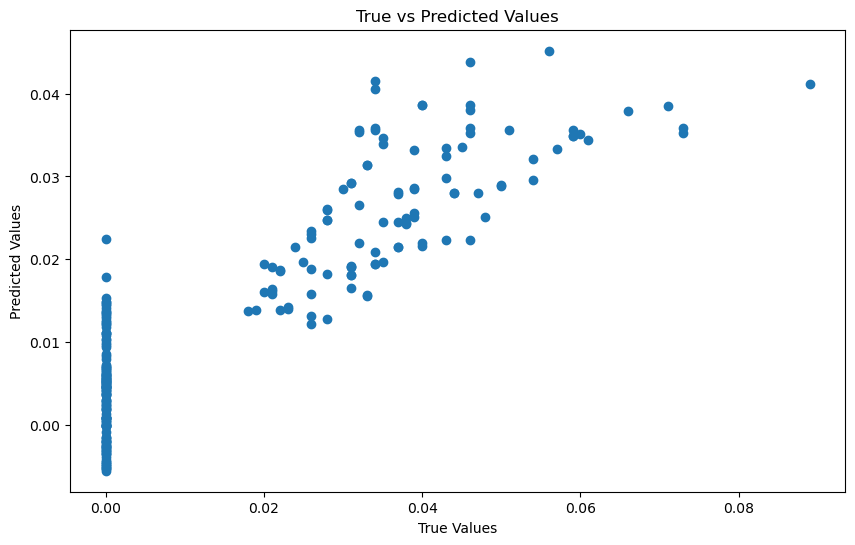

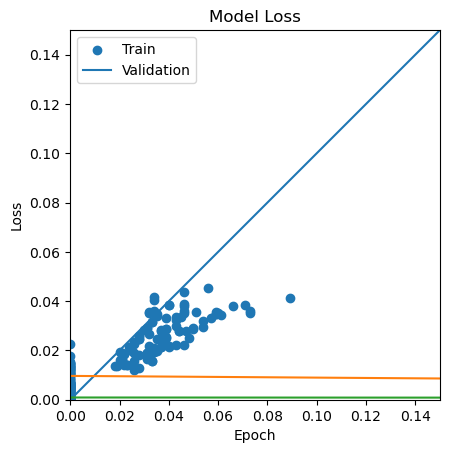

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 26ms/step - loss: 0.0076 - val_loss: 0.0018 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0034 - val_loss: 5.4315e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 17ms/step - loss: 0.0027 - val_loss: 3.9937e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 16ms/step - loss: 0.0022 - val_loss: 3.2175e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0017 - val_loss: 2.0070e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0016 - val_loss: 2.1740e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0014 - val_loss: 2.2964e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 17ms/step - loss: 0.0013 - val_loss: 2.3182e-04 - lr: 1.0000e-04
Epoch 9/200
30/30 [=================

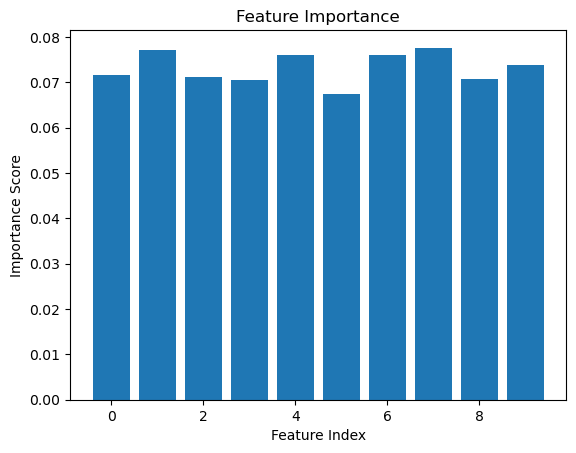

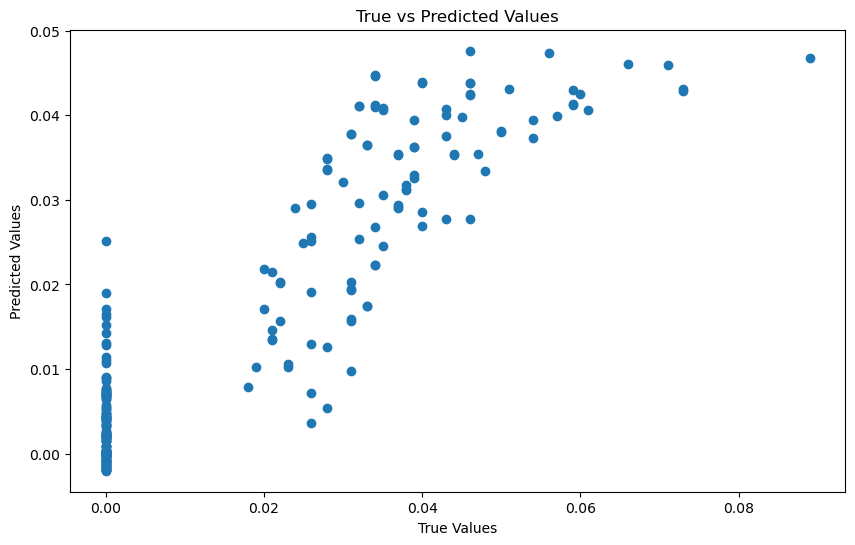

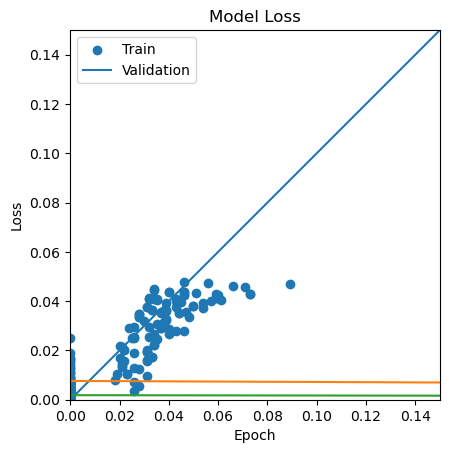

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 16ms/step - loss: 6.0550e-04 - val_loss: 1.4495e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 2s 13ms/step - loss: 4.0642e-04 - val_loss: 3.1464e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 2s 13ms/step - loss: 4.0287e-04 - val_loss: 0.0011 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 2s 13ms/step - loss: 3.5819e-04 - val_loss: 2.7035e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 2s 14ms/step - loss: 3.2348e-04 - val_loss: 2.1686e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 2s 14ms/step - loss: 3.3591e-04 - val_loss: 2.5936e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 2s 14ms/step - loss: 3.3847e-04 - val_loss: 2.7962e-04 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 2s 13ms/step - loss: 2.7940e-04 - val_loss: 3.7795e-04 - lr: 0.0010
Epoch 9/200
118/118 

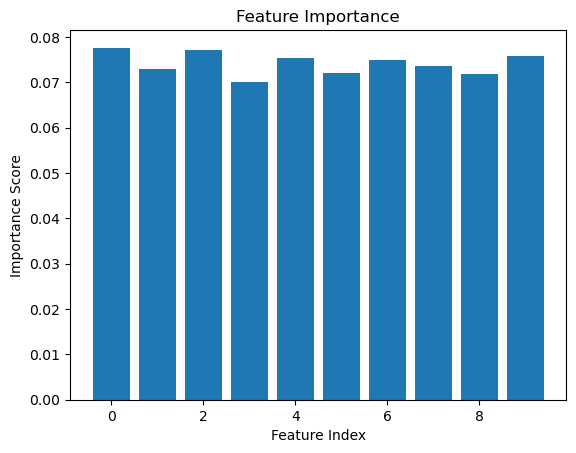

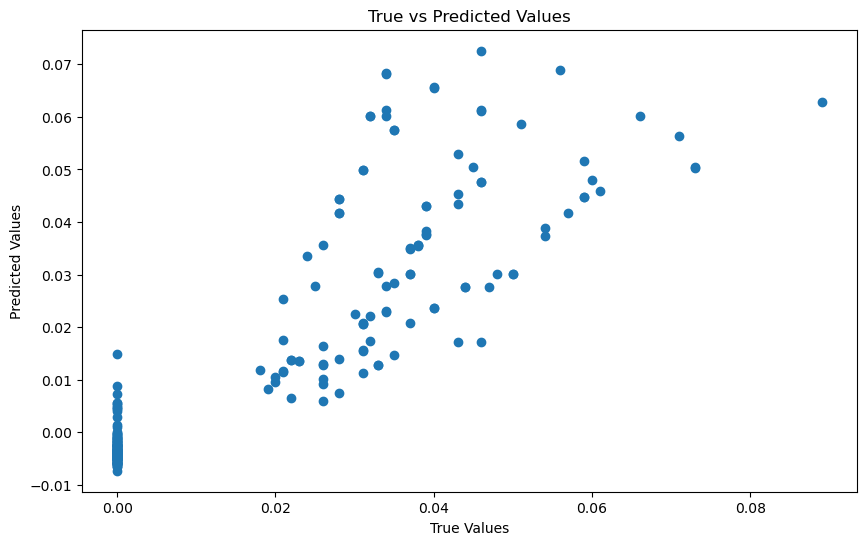

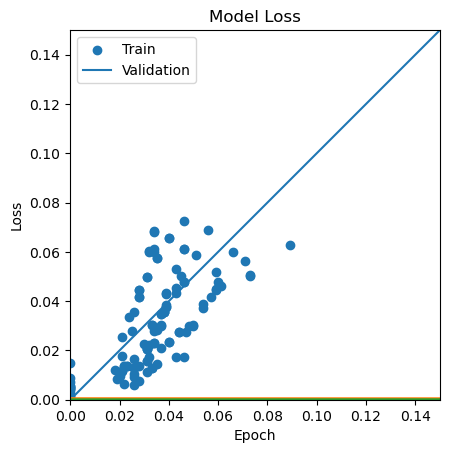

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 17ms/step - loss: 0.0014 - val_loss: 1.4026e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 5.4157e-04 - val_loss: 8.6600e-05 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 4.5663e-04 - val_loss: 1.5532e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 2s 14ms/step - loss: 4.3916e-04 - val_loss: 1.2854e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 4.1333e-04 - val_loss: 2.0308e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 2s 14ms/step - loss: 3.7463e-04 - val_loss: 2.3936e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 2s 14ms/step - loss: 3.8519e-04 - val_loss: 1.8439e-04 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 2s 14ms/step - loss: 3.6751e-04 - val_loss: 2.0361e-04 - lr: 0.0010
Epoch 9/200
118/118 

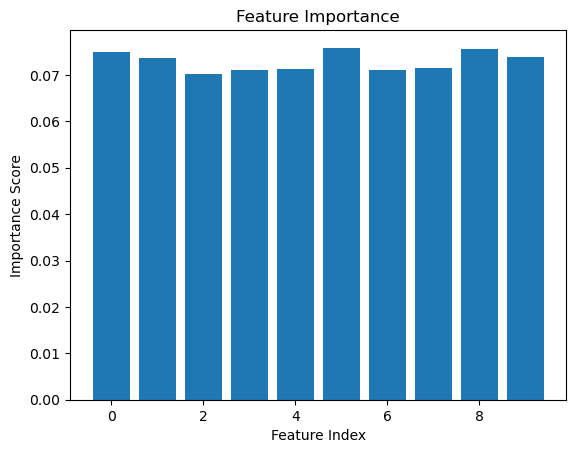

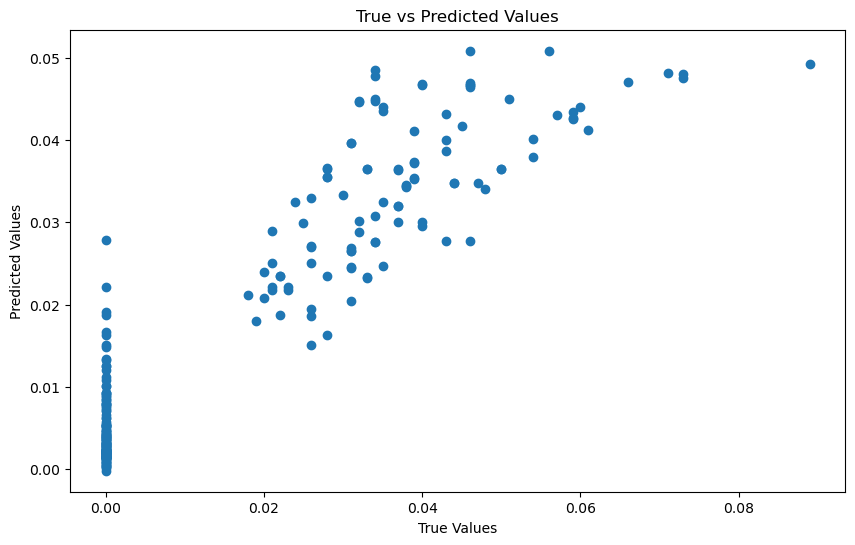

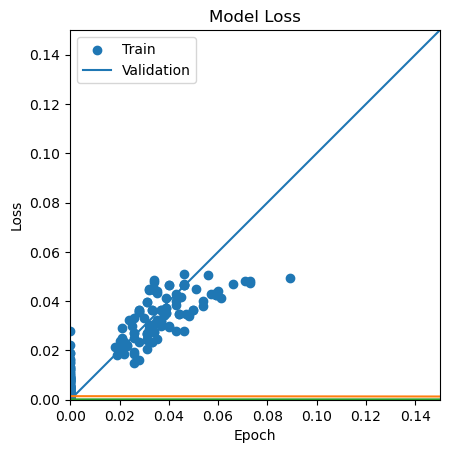

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 17ms/step - loss: 0.0012 - val_loss: 1.4798e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 6.4295e-04 - val_loss: 1.8772e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 5.4383e-04 - val_loss: 9.8369e-05 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 4.7677e-04 - val_loss: 1.1070e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 4.4251e-04 - val_loss: 1.6162e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 2s 15ms/step - loss: 4.1977e-04 - val_loss: 9.8466e-05 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 4.0645e-04 - val_loss: 8.9630e-05 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 2s 15ms/step - loss: 3.7308e-04 - val_loss: 1.0122e-04 - lr: 0.0010
Epoch 9/200
118/118 

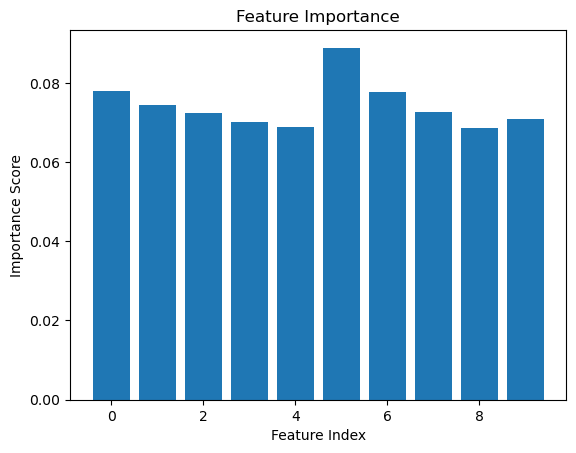

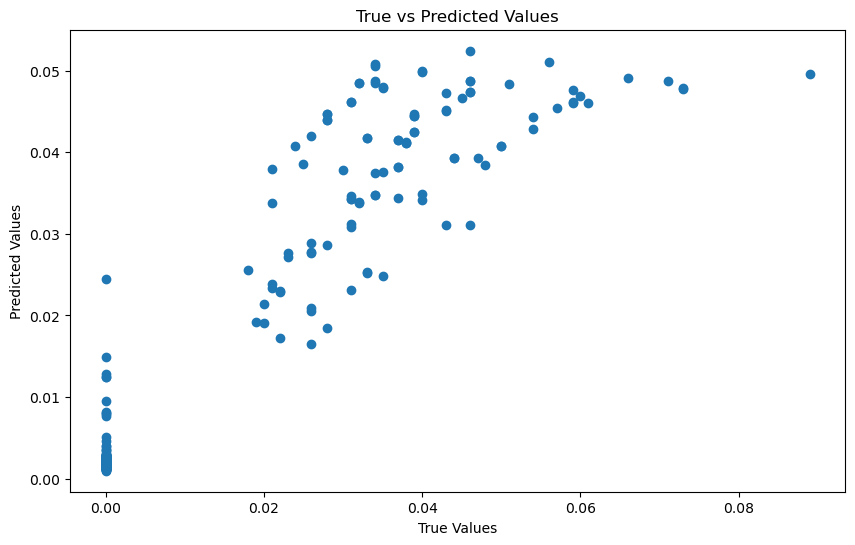

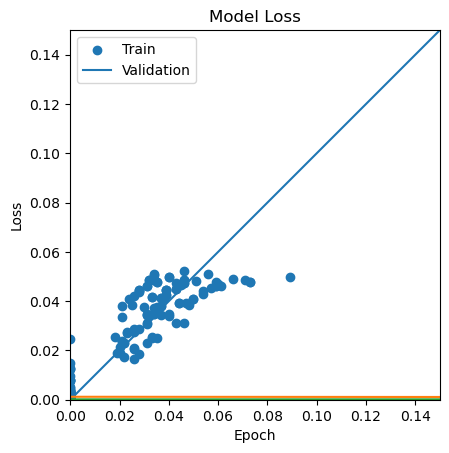

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 18ms/step - loss: 0.0026 - val_loss: 7.0509e-05 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 2s 16ms/step - loss: 7.3475e-04 - val_loss: 2.2740e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 2s 16ms/step - loss: 5.9597e-04 - val_loss: 1.3299e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 2s 16ms/step - loss: 5.5588e-04 - val_loss: 9.6619e-05 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 2s 16ms/step - loss: 5.2193e-04 - val_loss: 8.8957e-05 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 2s 16ms/step - loss: 4.9240e-04 - val_loss: 1.6380e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 2s 16ms/step - loss: 4.8913e-04 - val_loss: 2.4082e-04 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 2s 16ms/step - loss: 4.3647e-04 - val_loss: 1.8444e-04 - lr: 0.0010
Epoch 9/200
118/118 

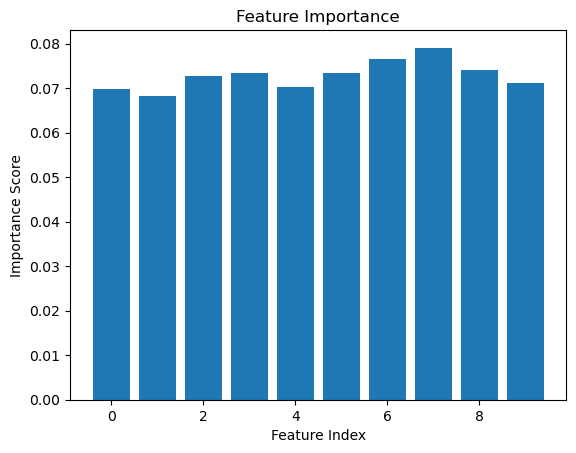

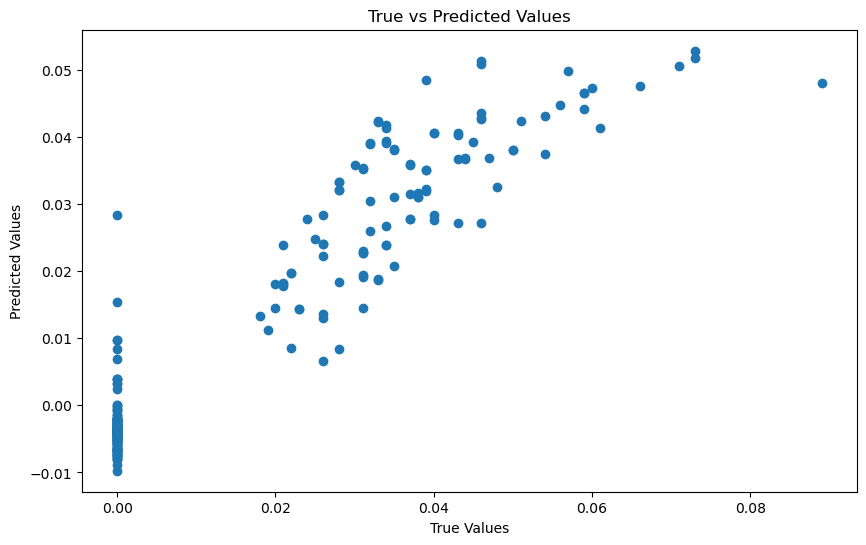

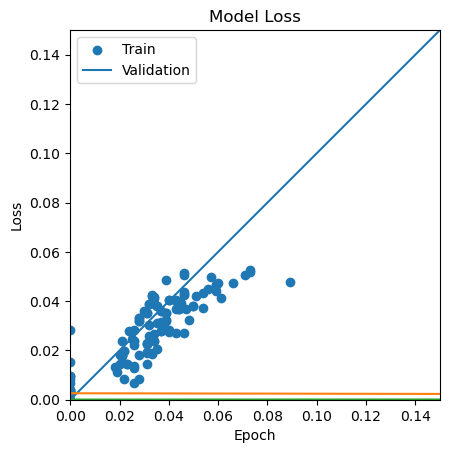

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 21ms/step - loss: 6.2639e-04 - val_loss: 2.3802e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 1s 15ms/step - loss: 4.1018e-04 - val_loss: 1.5323e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 1s 15ms/step - loss: 3.6120e-04 - val_loss: 1.8985e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 1s 17ms/step - loss: 3.2701e-04 - val_loss: 1.5090e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 1s 17ms/step - loss: 3.5639e-04 - val_loss: 3.7255e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 1s 16ms/step - loss: 3.2305e-04 - val_loss: 1.2242e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 1s 15ms/step - loss: 3.1280e-04 - val_loss: 1.3314e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 1s 14ms/step - loss: 2.8940e-04 - val_loss: 1.1494e-04 - lr: 0.0010
Epoch 9/200
59/59 [=============

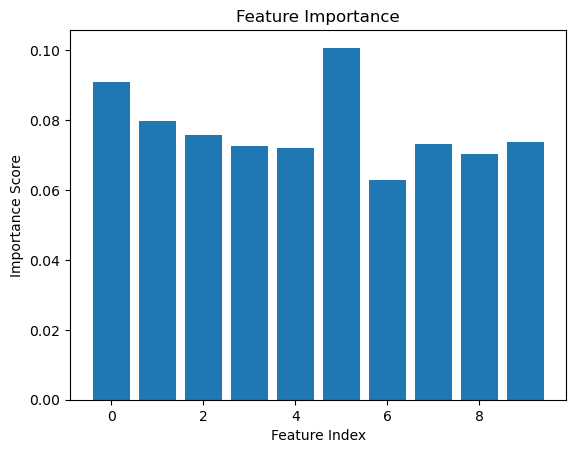

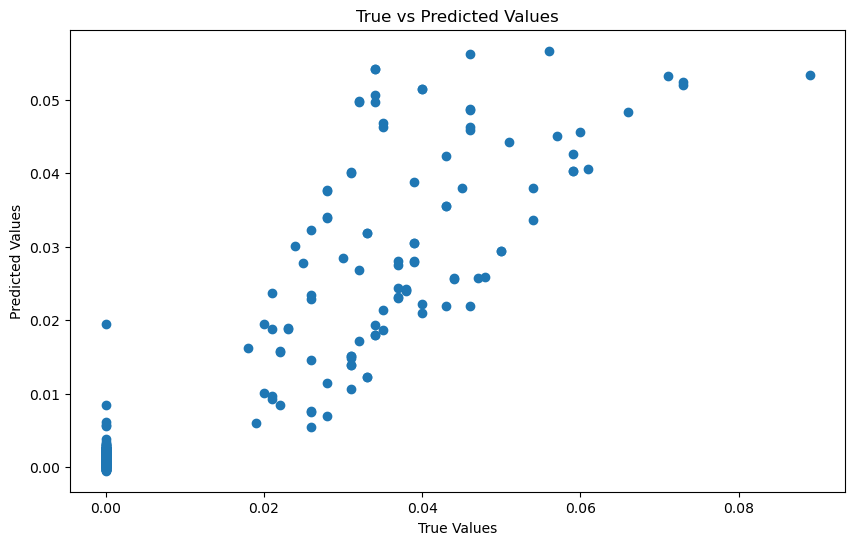

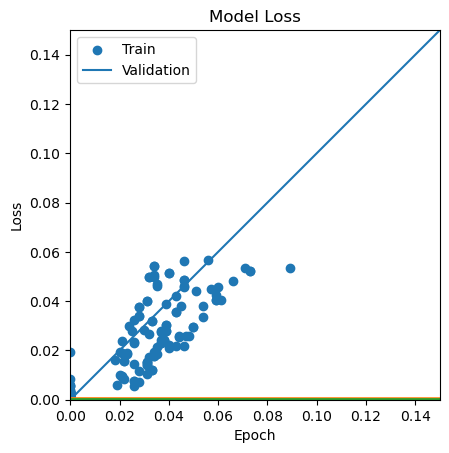

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 19ms/step - loss: 0.0011 - val_loss: 1.8470e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 1s 15ms/step - loss: 5.5011e-04 - val_loss: 1.4107e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 1s 15ms/step - loss: 4.6330e-04 - val_loss: 2.7736e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 1s 15ms/step - loss: 4.5252e-04 - val_loss: 8.1833e-05 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 1s 15ms/step - loss: 3.8586e-04 - val_loss: 1.7484e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 1s 15ms/step - loss: 3.8543e-04 - val_loss: 9.3571e-05 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 1s 15ms/step - loss: 3.6995e-04 - val_loss: 1.2037e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 1s 16ms/step - loss: 3.5038e-04 - val_loss: 1.4035e-04 - lr: 0.0010
Epoch 9/200
59/59 [=================

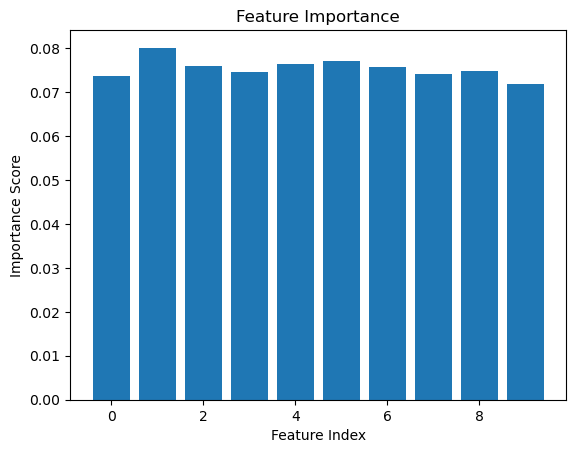

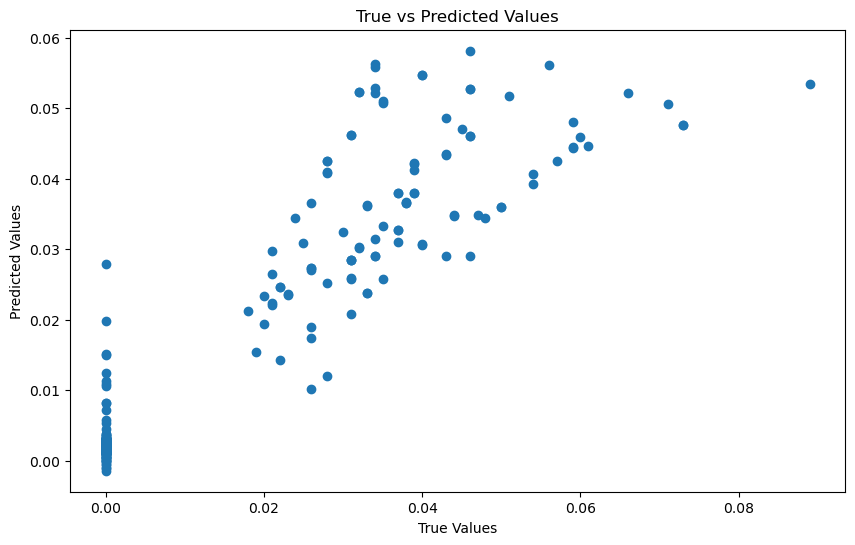

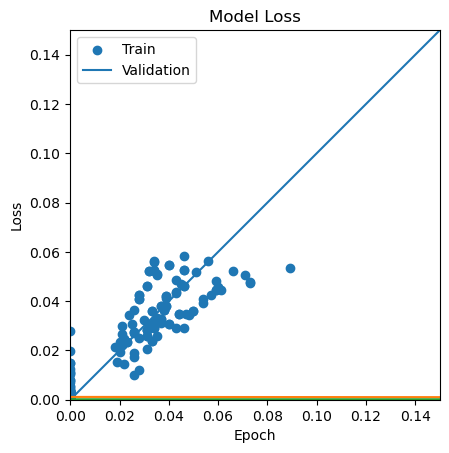

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 19ms/step - loss: 0.0013 - val_loss: 1.6906e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 1s 16ms/step - loss: 6.3220e-04 - val_loss: 1.3965e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 1s 16ms/step - loss: 5.2822e-04 - val_loss: 8.7533e-05 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 1s 16ms/step - loss: 4.5612e-04 - val_loss: 1.1208e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 1s 16ms/step - loss: 4.2982e-04 - val_loss: 4.3070e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 1s 16ms/step - loss: 4.1996e-04 - val_loss: 1.2716e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 1s 15ms/step - loss: 3.9880e-04 - val_loss: 1.0522e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 1s 16ms/step - loss: 3.8675e-04 - val_loss: 1.4575e-04 - lr: 0.0010
Epoch 9/200
59/59 [=================

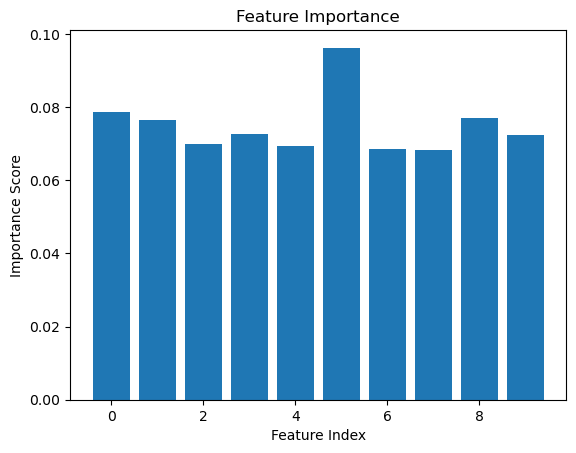

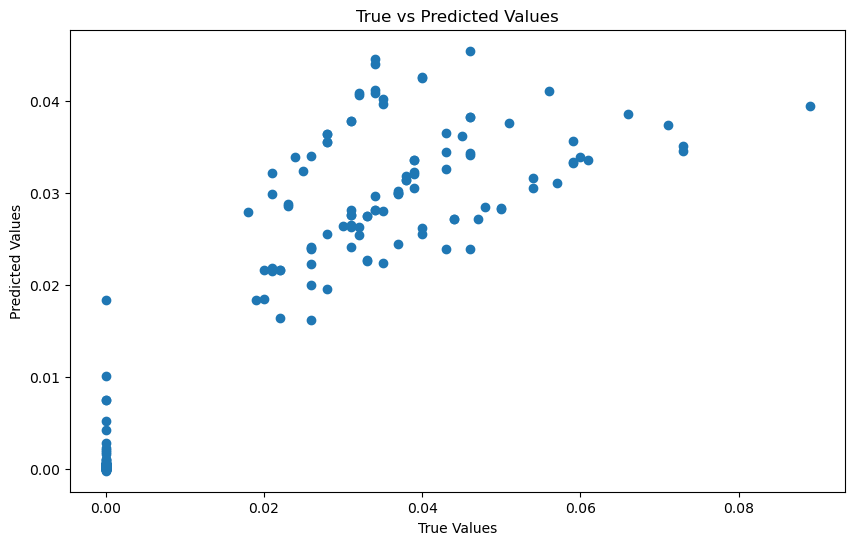

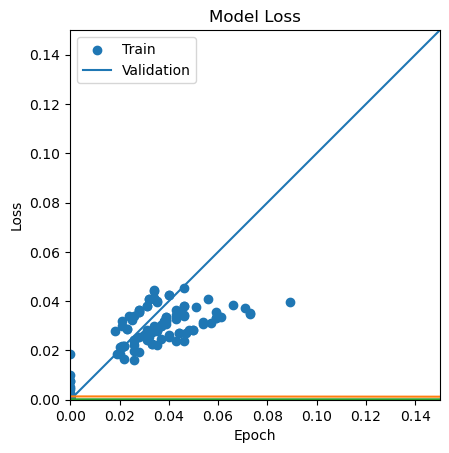

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 20ms/step - loss: 0.0027 - val_loss: 1.9114e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 1s 16ms/step - loss: 8.8428e-04 - val_loss: 2.7188e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 1s 16ms/step - loss: 6.5311e-04 - val_loss: 1.1007e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 1s 15ms/step - loss: 5.7203e-04 - val_loss: 1.1276e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 1s 16ms/step - loss: 5.7295e-04 - val_loss: 1.0722e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 1s 15ms/step - loss: 5.0068e-04 - val_loss: 1.8657e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 1s 16ms/step - loss: 4.5839e-04 - val_loss: 1.6129e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 1s 15ms/step - loss: 4.6874e-04 - val_loss: 1.2666e-04 - lr: 0.0010
Epoch 9/200
59/59 [=================

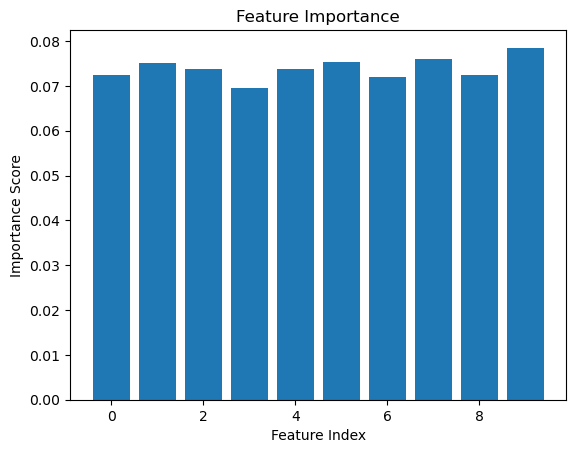

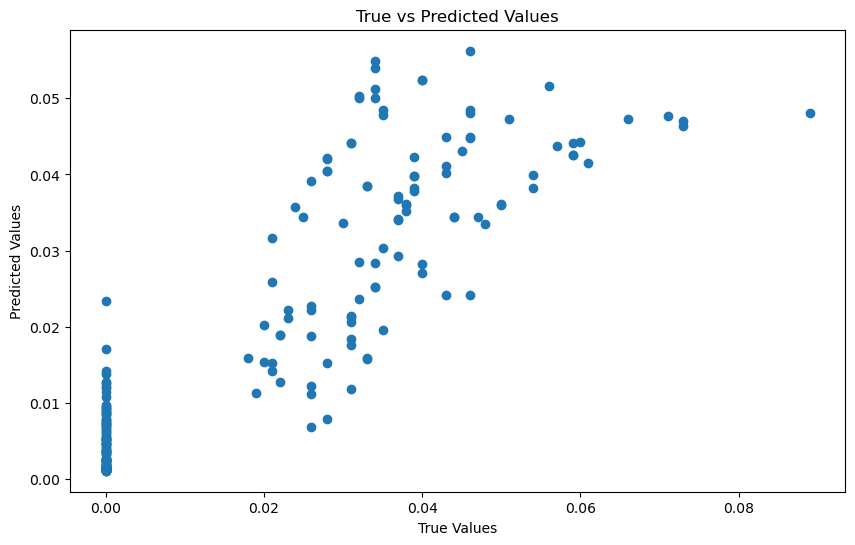

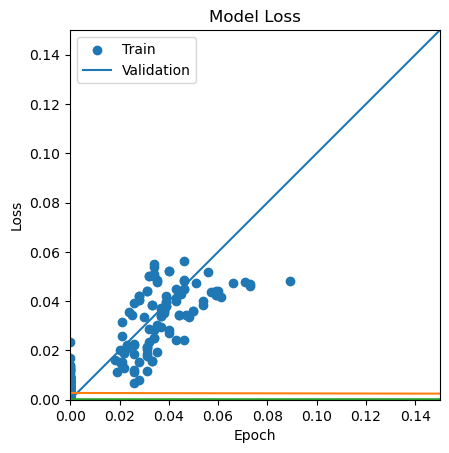

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 1s 23ms/step - loss: 6.7293e-04 - val_loss: 1.3532e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 0s 15ms/step - loss: 3.7827e-04 - val_loss: 1.3280e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 0s 15ms/step - loss: 3.2680e-04 - val_loss: 1.7611e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 0s 15ms/step - loss: 3.0905e-04 - val_loss: 3.5215e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 0s 15ms/step - loss: 3.1988e-04 - val_loss: 1.2975e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 0s 15ms/step - loss: 2.8681e-04 - val_loss: 2.0100e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 0s 15ms/step - loss: 2.8870e-04 - val_loss: 1.6363e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 0s 15ms/step - loss: 2.8978e-04 - val_loss: 2.5043e-04 - lr: 0.0010
Epoch 9/200
30/30 [=============

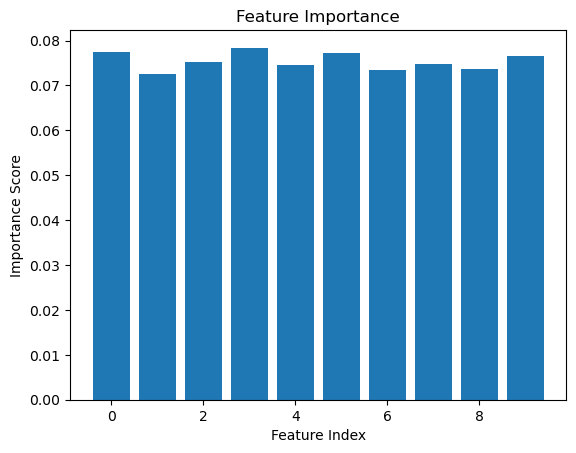

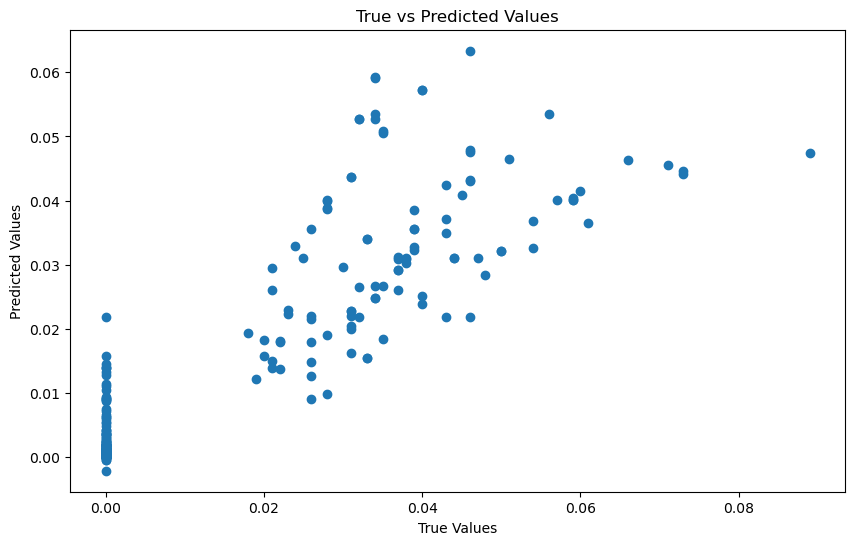

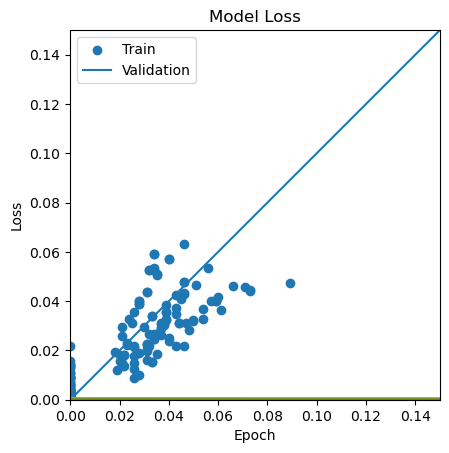

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 25ms/step - loss: 0.0010 - val_loss: 1.7766e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 0s 16ms/step - loss: 5.6574e-04 - val_loss: 9.4628e-05 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 0s 15ms/step - loss: 4.8359e-04 - val_loss: 1.3084e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 0s 16ms/step - loss: 4.5602e-04 - val_loss: 1.0435e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 0s 16ms/step - loss: 3.9387e-04 - val_loss: 2.1770e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 0s 16ms/step - loss: 3.8349e-04 - val_loss: 2.4964e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 0s 16ms/step - loss: 3.9212e-04 - val_loss: 2.3037e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 17ms/step - loss: 3.9179e-04 - val_loss: 1.2055e-04 - lr: 0.0010
Epoch 9/200
30/30 [=================

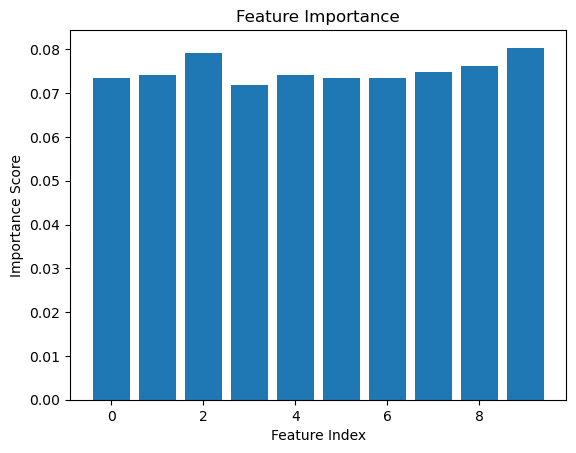

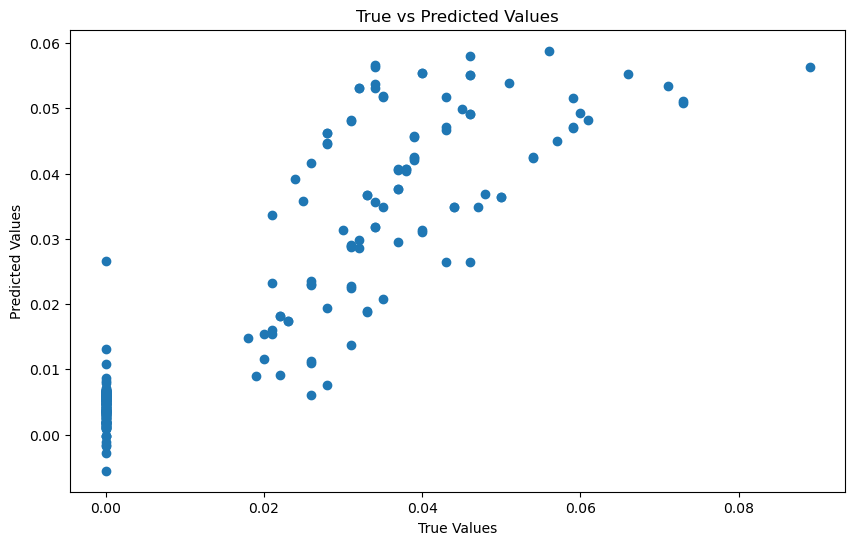

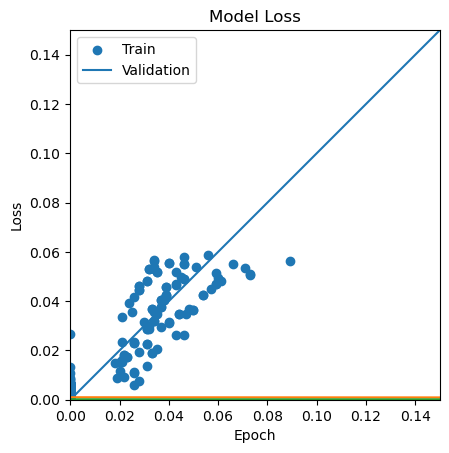

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 25ms/step - loss: 0.0017 - val_loss: 1.7668e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 17ms/step - loss: 7.0708e-04 - val_loss: 1.2501e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 0s 16ms/step - loss: 5.4351e-04 - val_loss: 1.0434e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 0s 15ms/step - loss: 4.7505e-04 - val_loss: 9.4182e-05 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 16ms/step - loss: 4.6014e-04 - val_loss: 8.5675e-05 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 0s 16ms/step - loss: 4.8361e-04 - val_loss: 1.1474e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 0s 15ms/step - loss: 4.2449e-04 - val_loss: 1.2319e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 0s 16ms/step - loss: 4.2573e-04 - val_loss: 1.1130e-04 - lr: 0.0010
Epoch 9/200
30/30 [=================

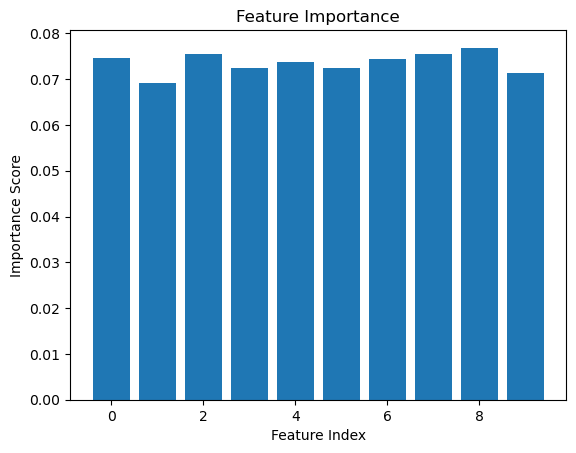

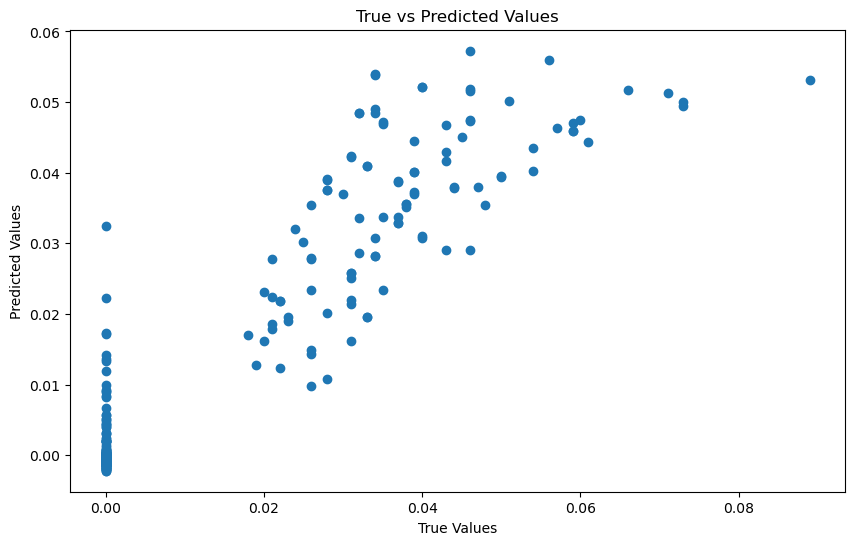

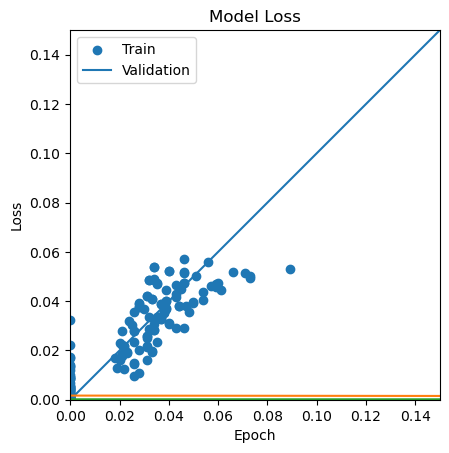

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 25ms/step - loss: 0.0025 - val_loss: 2.2645e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 16ms/step - loss: 8.6313e-04 - val_loss: 1.7293e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 16ms/step - loss: 6.7156e-04 - val_loss: 1.2051e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 0s 16ms/step - loss: 5.6102e-04 - val_loss: 1.2812e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 0s 16ms/step - loss: 5.7432e-04 - val_loss: 1.0320e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 0s 17ms/step - loss: 5.1995e-04 - val_loss: 1.6752e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 0s 17ms/step - loss: 5.4059e-04 - val_loss: 8.7506e-05 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 17ms/step - loss: 4.6601e-04 - val_loss: 8.3371e-05 - lr: 0.0010
Epoch 9/200
30/30 [=================

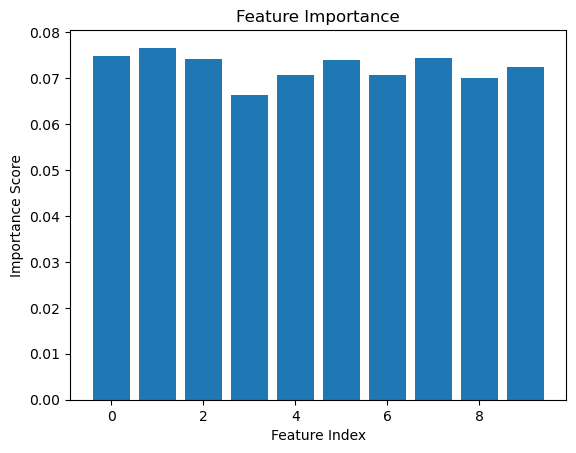

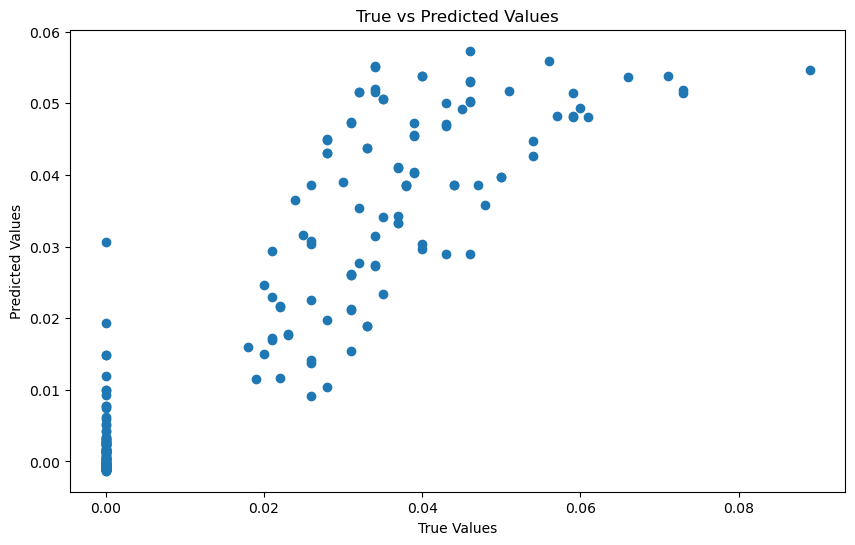

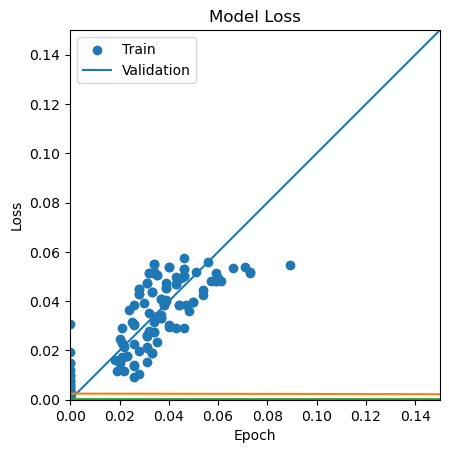

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 16ms/step - loss: 0.0027 - val_loss: 1.7567e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 2s 14ms/step - loss: 4.4753e-04 - val_loss: 1.1753e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 2s 14ms/step - loss: 4.0483e-04 - val_loss: 4.0807e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 2s 14ms/step - loss: 4.0340e-04 - val_loss: 6.2549e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 2s 14ms/step - loss: 3.7662e-04 - val_loss: 2.3200e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 2s 14ms/step - loss: 3.6853e-04 - val_loss: 1.5838e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 2s 14ms/step - loss: 3.9138e-04 - val_loss: 1.0067e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 2s 14ms/step - loss: 3.0099e-04 - val_loss: 1.2381e-04 - lr: 0.0100
Epoch 9/200
118/118 

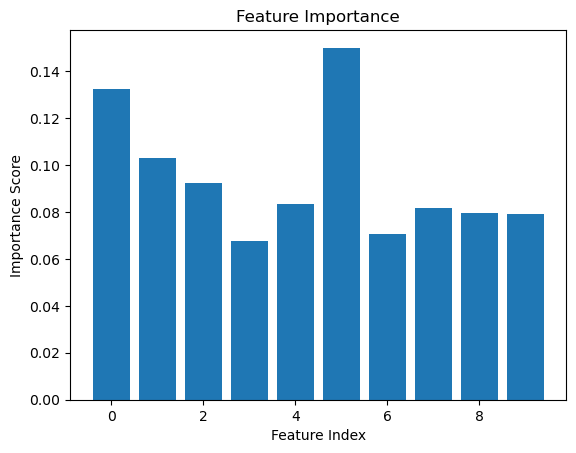

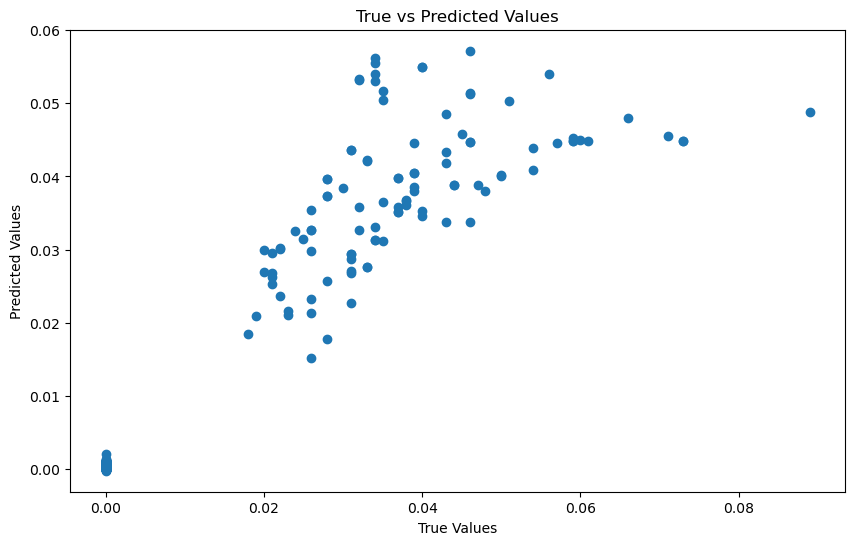

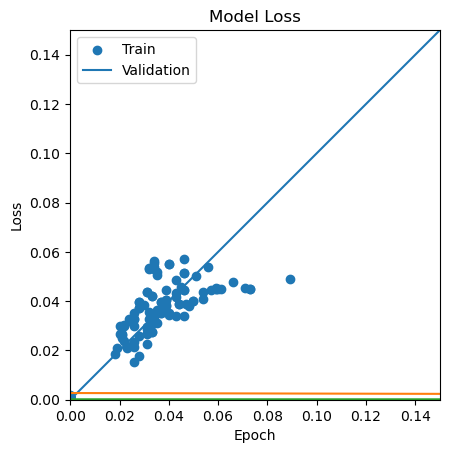

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 17ms/step - loss: 0.0047 - val_loss: 2.8058e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 5.2190e-04 - val_loss: 1.7238e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 5.0814e-04 - val_loss: 4.4942e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 4.5029e-04 - val_loss: 5.5671e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 4.4166e-04 - val_loss: 2.0943e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 2s 14ms/step - loss: 4.0658e-04 - val_loss: 1.1143e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 4.3471e-04 - val_loss: 1.4347e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 2s 15ms/step - loss: 3.7619e-04 - val_loss: 1.6901e-04 - lr: 0.0100
Epoch 9/200
118/118 

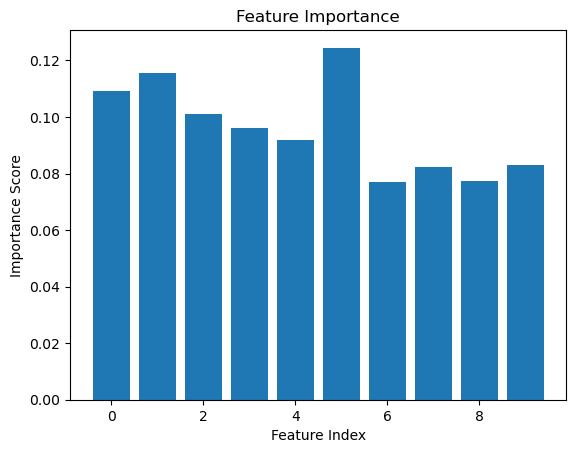

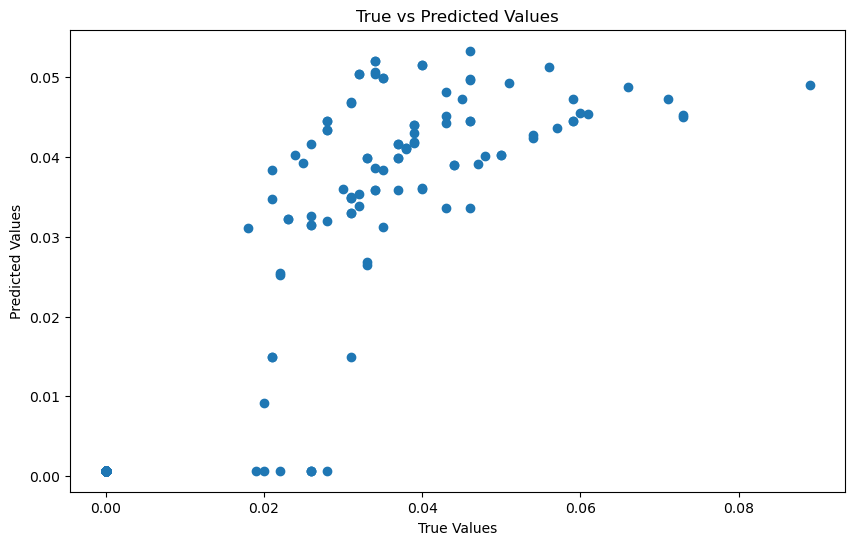

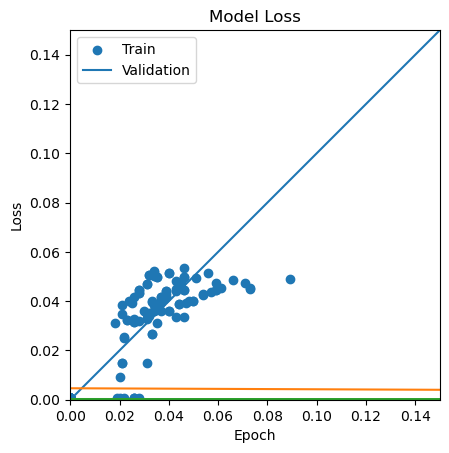

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 17ms/step - loss: 0.0022 - val_loss: 1.3064e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 5.9969e-04 - val_loss: 1.4634e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 5.1503e-04 - val_loss: 3.2223e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 4.3856e-04 - val_loss: 6.1797e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 4.3269e-04 - val_loss: 2.0327e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 2s 15ms/step - loss: 4.6842e-04 - val_loss: 1.3490e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 4.4840e-04 - val_loss: 1.0155e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 2s 15ms/step - loss: 3.6749e-04 - val_loss: 1.5806e-04 - lr: 0.0100
Epoch 9/200
118/118 

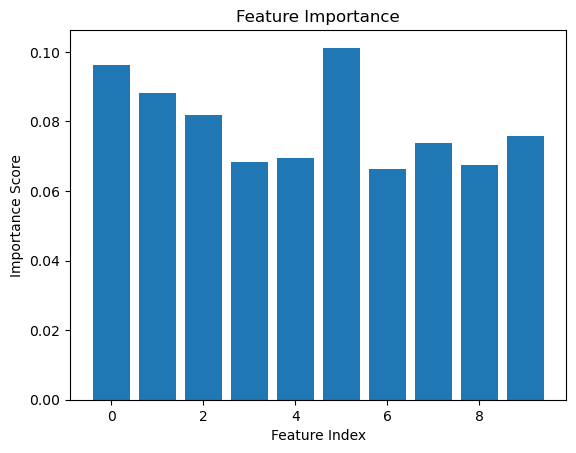

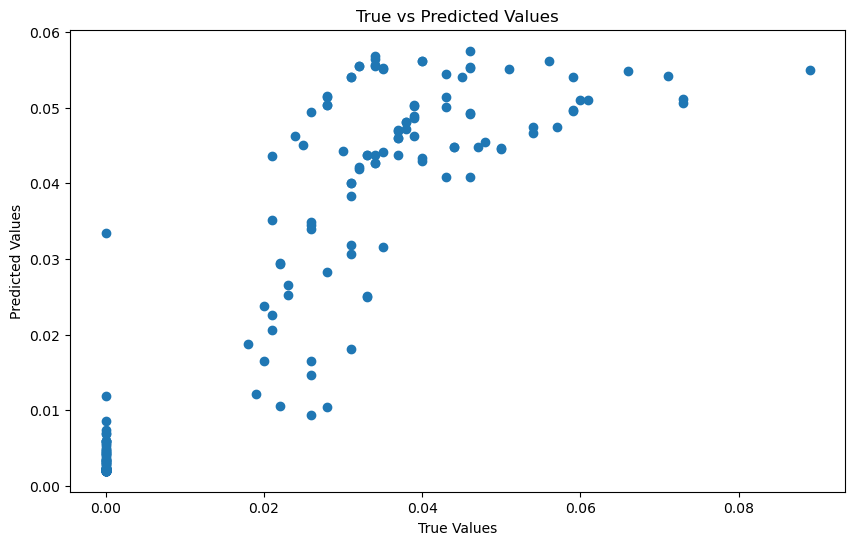

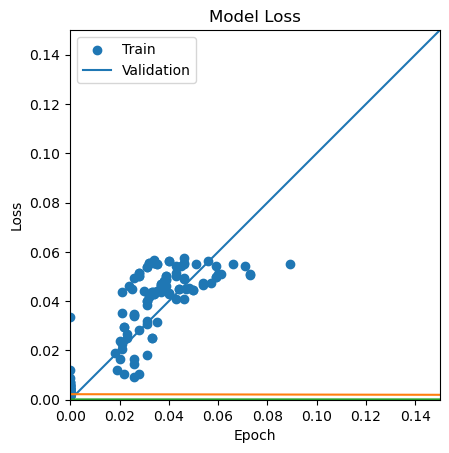

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 17ms/step - loss: 0.0034 - val_loss: 1.8881e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 9.0789e-04 - val_loss: 1.5616e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 6.4346e-04 - val_loss: 2.2111e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 5.8200e-04 - val_loss: 6.4672e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 5.2174e-04 - val_loss: 2.0896e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 2s 15ms/step - loss: 4.7983e-04 - val_loss: 2.8683e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 4.8097e-04 - val_loss: 1.6726e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 2s 15ms/step - loss: 4.2356e-04 - val_loss: 1.9909e-04 - lr: 0.0100
Epoch 9/200
118/118 

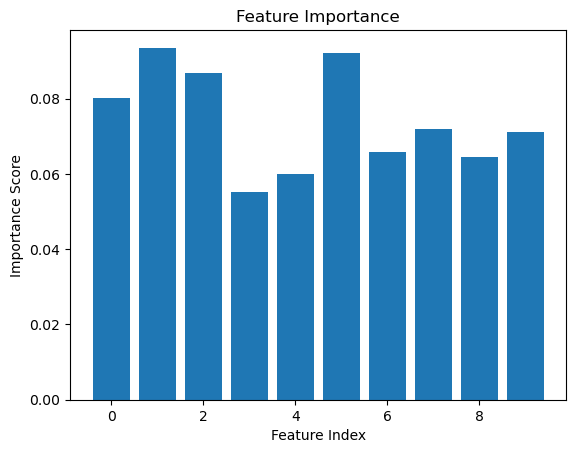

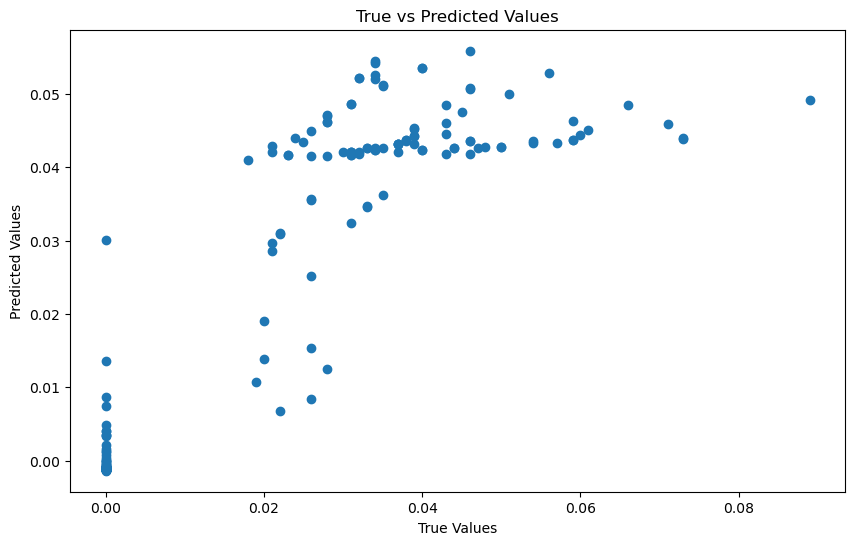

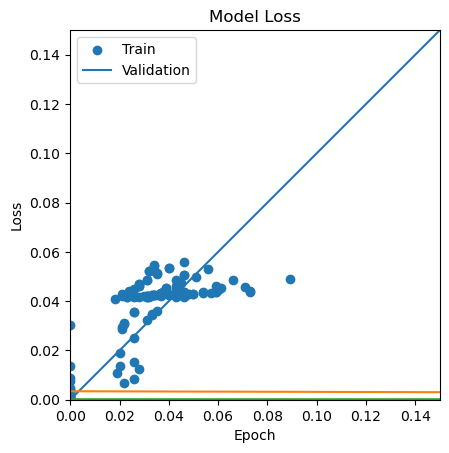

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 17ms/step - loss: 0.0181 - val_loss: 1.4957e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 1s 13ms/step - loss: 4.1433e-04 - val_loss: 1.4385e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 1s 13ms/step - loss: 4.3904e-04 - val_loss: 1.3113e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 1s 12ms/step - loss: 4.0958e-04 - val_loss: 2.1915e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 1s 12ms/step - loss: 3.6292e-04 - val_loss: 2.1835e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 1s 12ms/step - loss: 3.3604e-04 - val_loss: 1.3982e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 1s 12ms/step - loss: 3.4248e-04 - val_loss: 1.2952e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 1s 12ms/step - loss: 3.2560e-04 - val_loss: 7.7751e-05 - lr: 0.0100
Epoch 9/200
59/59 [=================

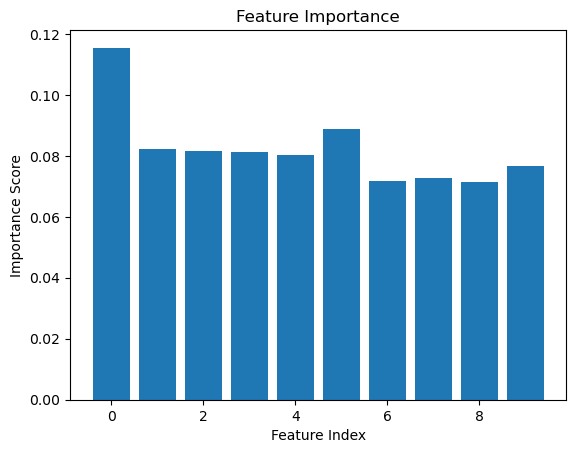

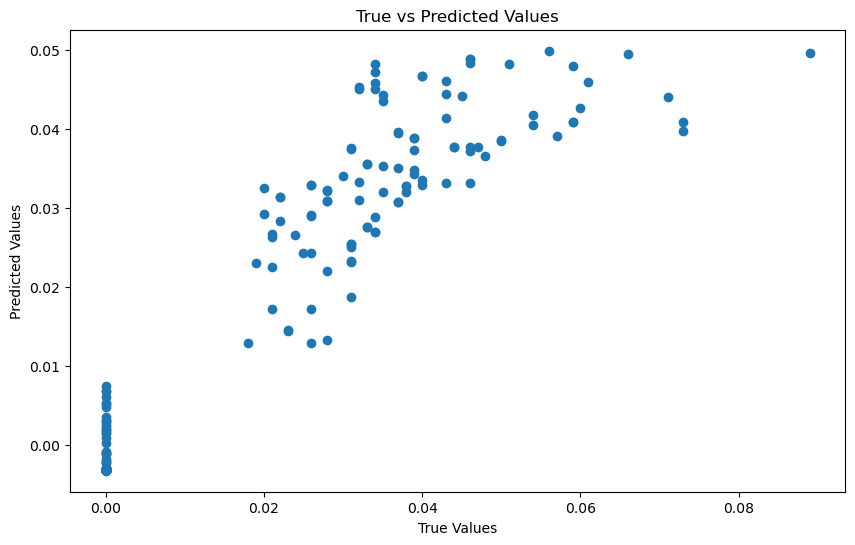

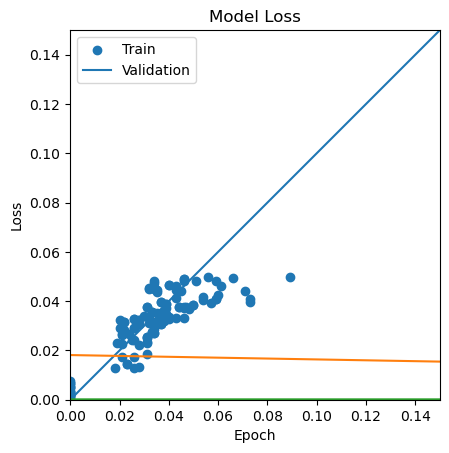

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 17ms/step - loss: 0.0048 - val_loss: 2.9462e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 1s 13ms/step - loss: 5.2998e-04 - val_loss: 9.1623e-05 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 1s 14ms/step - loss: 4.9058e-04 - val_loss: 1.3626e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 1s 14ms/step - loss: 4.5287e-04 - val_loss: 1.5716e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 1s 13ms/step - loss: 4.0585e-04 - val_loss: 2.2228e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 1s 13ms/step - loss: 4.4579e-04 - val_loss: 9.7228e-05 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 1s 13ms/step - loss: 3.9493e-04 - val_loss: 2.0026e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 1s 14ms/step - loss: 3.8694e-04 - val_loss: 1.7671e-04 - lr: 0.0100
Epoch 9/200
59/59 [=================

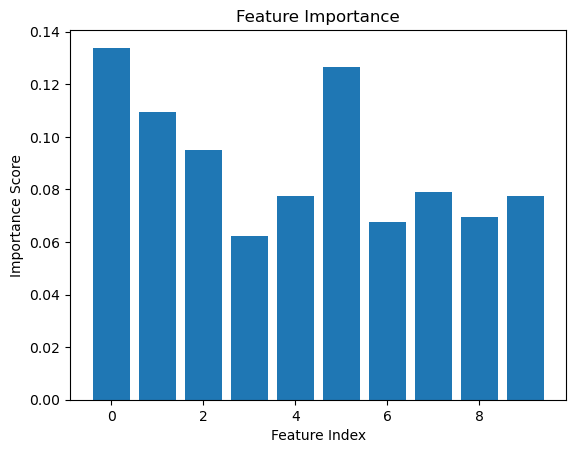

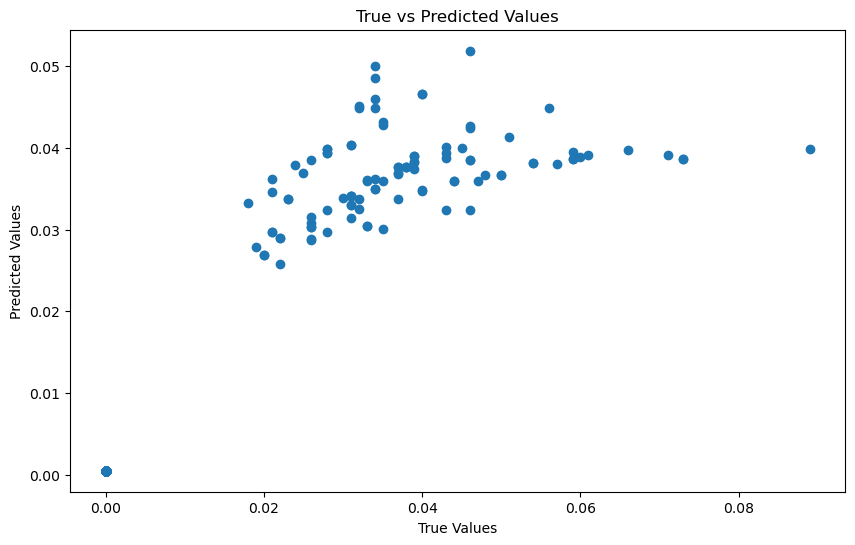

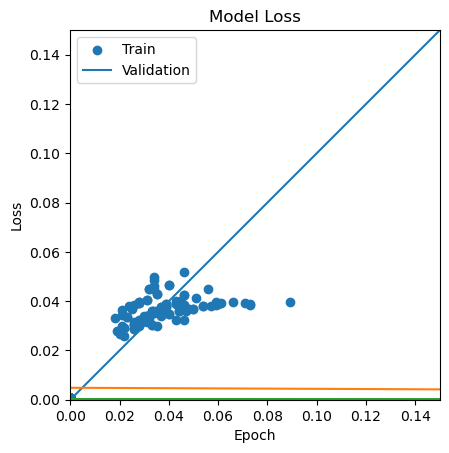

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 19ms/step - loss: 0.0091 - val_loss: 2.4069e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 1s 14ms/step - loss: 6.8351e-04 - val_loss: 2.0119e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 1s 14ms/step - loss: 5.6245e-04 - val_loss: 1.3161e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 1s 15ms/step - loss: 4.8894e-04 - val_loss: 2.5167e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 1s 14ms/step - loss: 4.5832e-04 - val_loss: 1.7923e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 1s 14ms/step - loss: 4.8298e-04 - val_loss: 1.5510e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 1s 14ms/step - loss: 4.2436e-04 - val_loss: 1.0078e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 1s 14ms/step - loss: 4.0208e-04 - val_loss: 2.0891e-04 - lr: 0.0100
Epoch 9/200
59/59 [=================

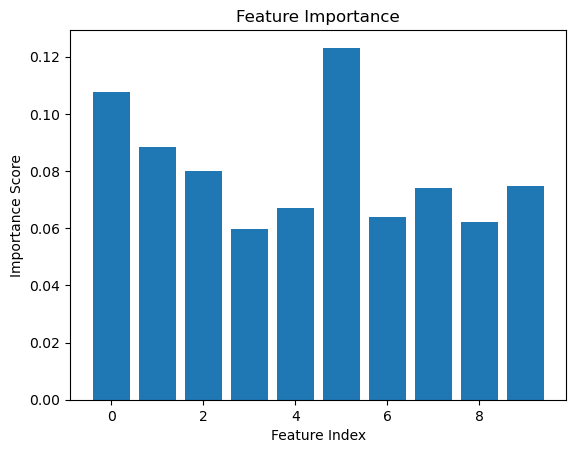

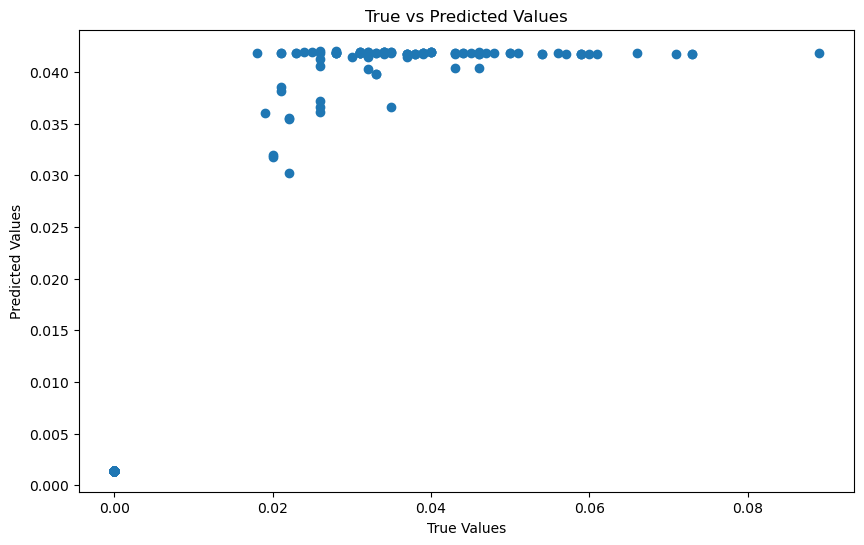

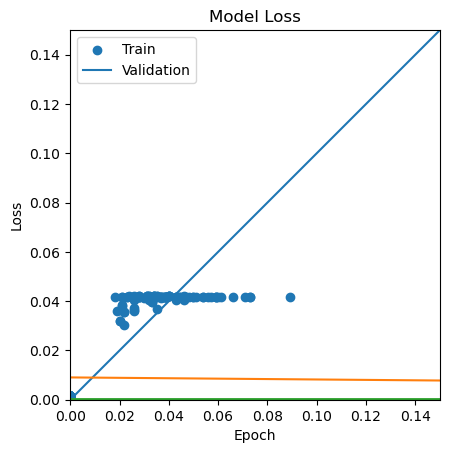

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 19ms/step - loss: 0.0056 - val_loss: 2.0872e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 1s 14ms/step - loss: 7.9881e-04 - val_loss: 1.1647e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 1s 14ms/step - loss: 6.0981e-04 - val_loss: 1.2396e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 1s 14ms/step - loss: 5.1477e-04 - val_loss: 1.6756e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 1s 14ms/step - loss: 5.2911e-04 - val_loss: 1.9864e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 1s 14ms/step - loss: 4.7647e-04 - val_loss: 1.1408e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 1s 14ms/step - loss: 4.3386e-04 - val_loss: 1.2895e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 1s 14ms/step - loss: 4.4711e-04 - val_loss: 1.7179e-04 - lr: 0.0100
Epoch 9/200
59/59 [=================

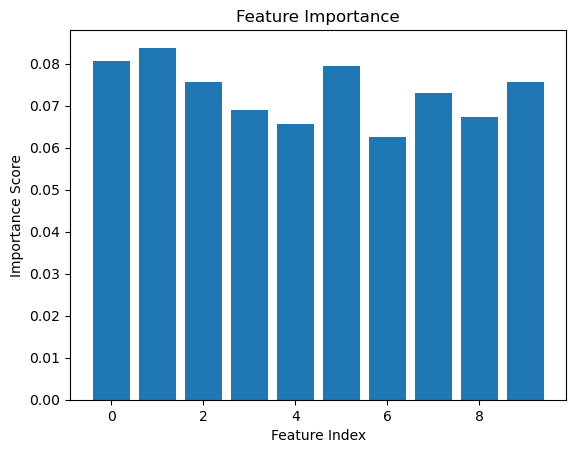

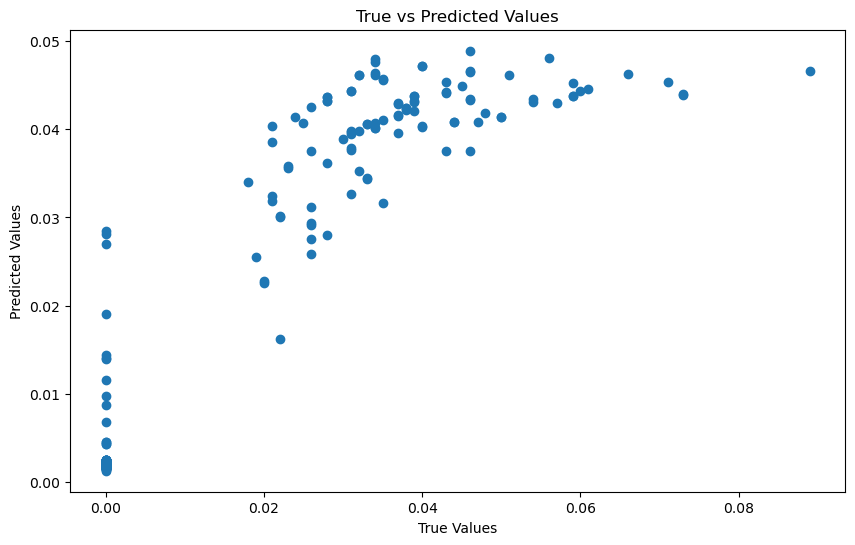

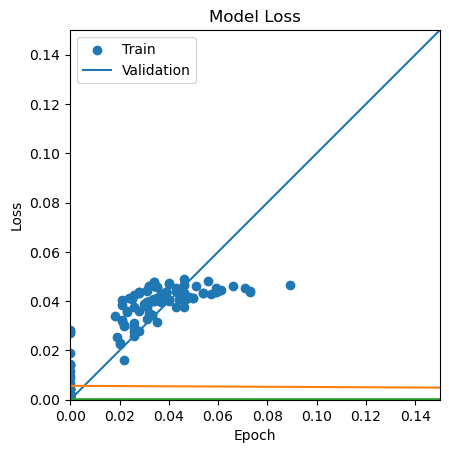

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 22ms/step - loss: 0.0174 - val_loss: 1.0576e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 0s 15ms/step - loss: 5.1944e-04 - val_loss: 2.2227e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 0s 14ms/step - loss: 4.0268e-04 - val_loss: 1.5361e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 0s 13ms/step - loss: 3.5100e-04 - val_loss: 2.0251e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 0s 14ms/step - loss: 3.4561e-04 - val_loss: 1.2931e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 0s 14ms/step - loss: 3.8142e-04 - val_loss: 9.6475e-05 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 0s 13ms/step - loss: 3.5276e-04 - val_loss: 1.0919e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 0s 14ms/step - loss: 3.3969e-04 - val_loss: 1.1542e-04 - lr: 0.0100
Epoch 9/200
30/30 [=================

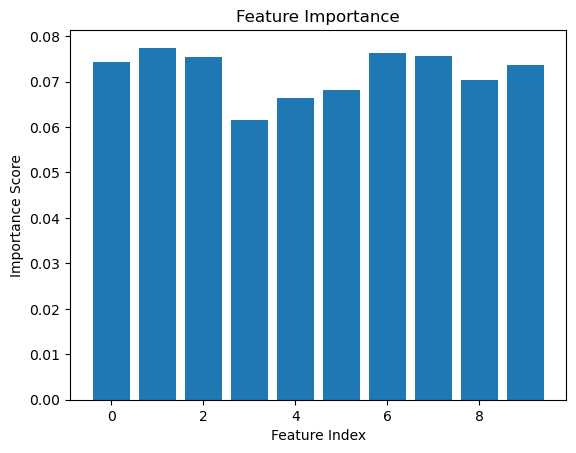

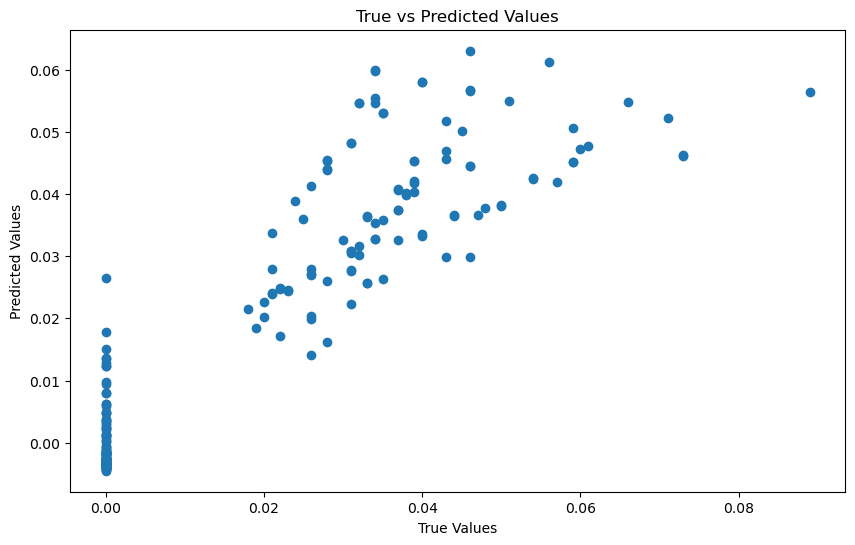

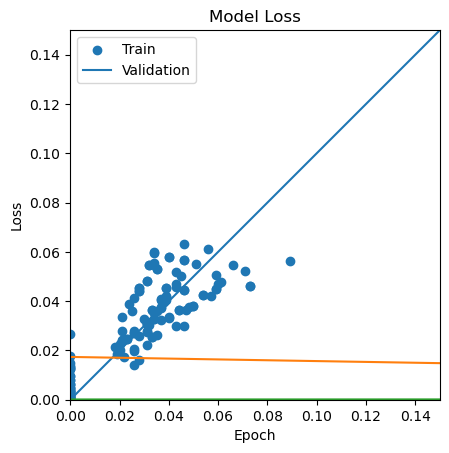

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 25ms/step - loss: 0.0296 - val_loss: 8.1849e-05 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 0s 14ms/step - loss: 6.4807e-04 - val_loss: 9.7902e-05 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 0s 14ms/step - loss: 5.5968e-04 - val_loss: 9.1787e-05 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 0s 14ms/step - loss: 4.8923e-04 - val_loss: 1.4153e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 0s 14ms/step - loss: 5.0643e-04 - val_loss: 7.9934e-05 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 0s 14ms/step - loss: 4.3764e-04 - val_loss: 8.5738e-05 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 0s 14ms/step - loss: 4.5728e-04 - val_loss: 9.2055e-05 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 0s 15ms/step - loss: 4.2257e-04 - val_loss: 1.0771e-04 - lr: 0.0100
Epoch 9/200
30/30 [=================

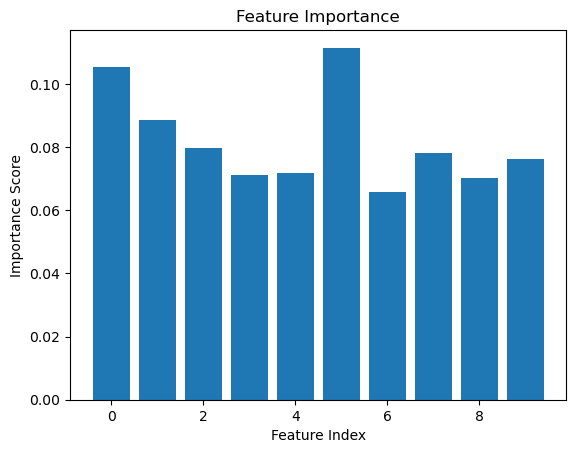

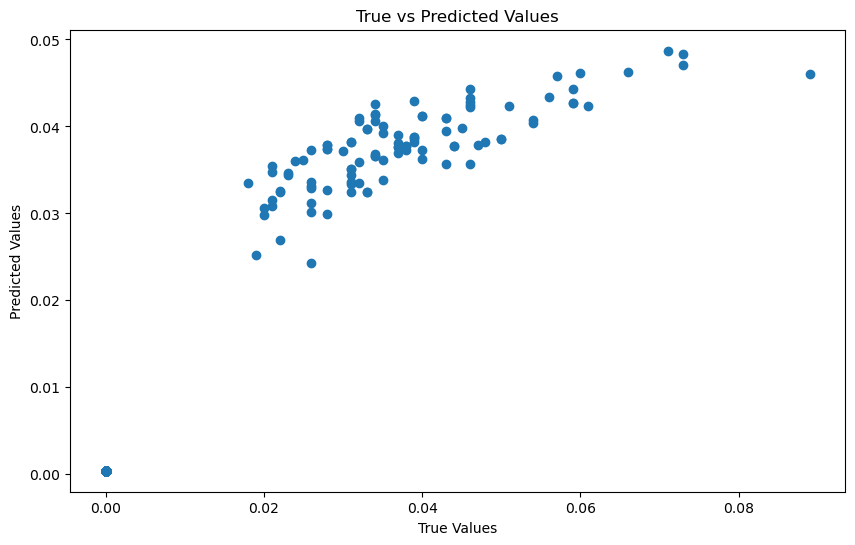

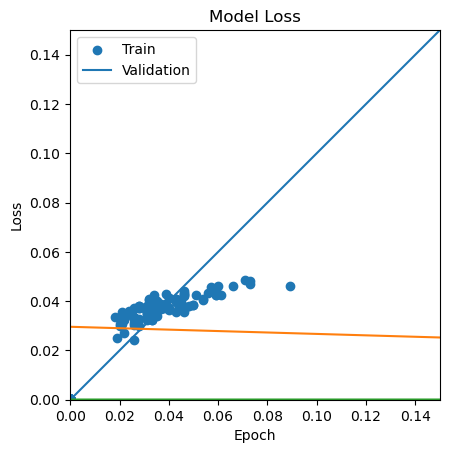

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 21ms/step - loss: 0.0042 - val_loss: 8.7915e-05 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 0s 14ms/step - loss: 6.5717e-04 - val_loss: 1.3698e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 0s 15ms/step - loss: 5.4117e-04 - val_loss: 8.6979e-05 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 0s 15ms/step - loss: 4.5838e-04 - val_loss: 1.7702e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 0s 14ms/step - loss: 4.6159e-04 - val_loss: 9.3037e-05 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 0s 14ms/step - loss: 4.1859e-04 - val_loss: 1.5420e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 0s 14ms/step - loss: 3.9969e-04 - val_loss: 7.4769e-05 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 0s 15ms/step - loss: 4.2198e-04 - val_loss: 1.4051e-04 - lr: 0.0100
Epoch 9/200
30/30 [=================

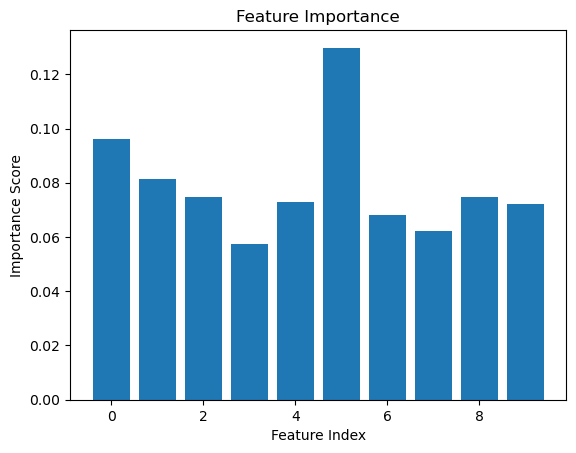

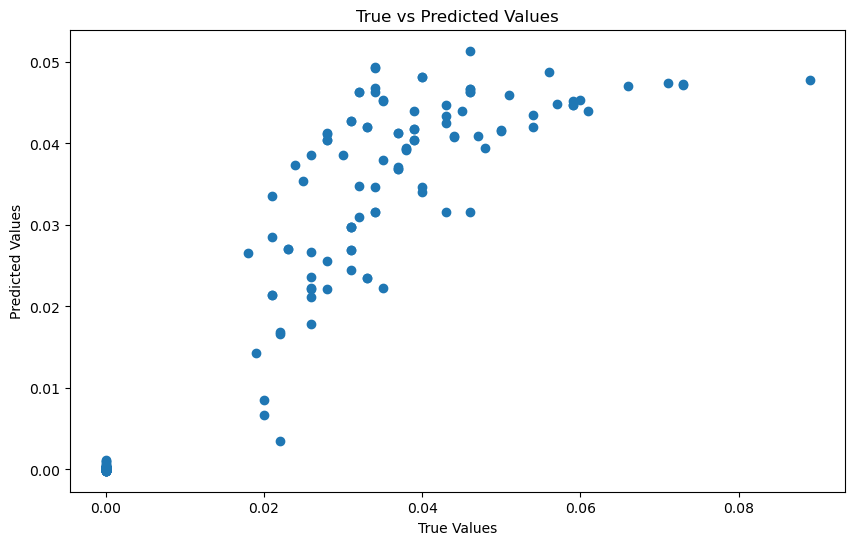

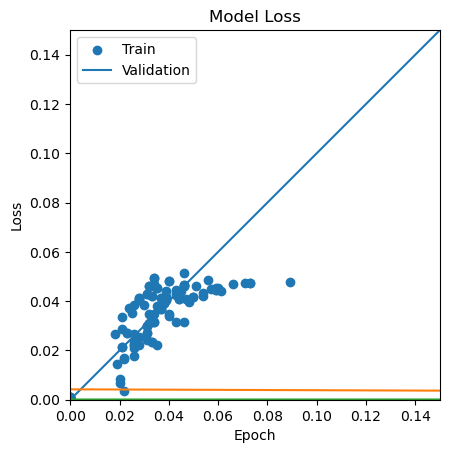

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 29ms/step - loss: 0.0060 - val_loss: 3.2890e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 0s 15ms/step - loss: 7.2086e-04 - val_loss: 1.2361e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 0s 14ms/step - loss: 6.0687e-04 - val_loss: 1.4298e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 0s 14ms/step - loss: 5.3796e-04 - val_loss: 1.3523e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 0s 14ms/step - loss: 5.0068e-04 - val_loss: 2.8574e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 18ms/step - loss: 4.6373e-04 - val_loss: 1.0191e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 20ms/step - loss: 4.5378e-04 - val_loss: 1.3524e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 18ms/step - loss: 4.1848e-04 - val_loss: 1.9016e-04 - lr: 0.0100
Epoch 9/200
30/30 [=================

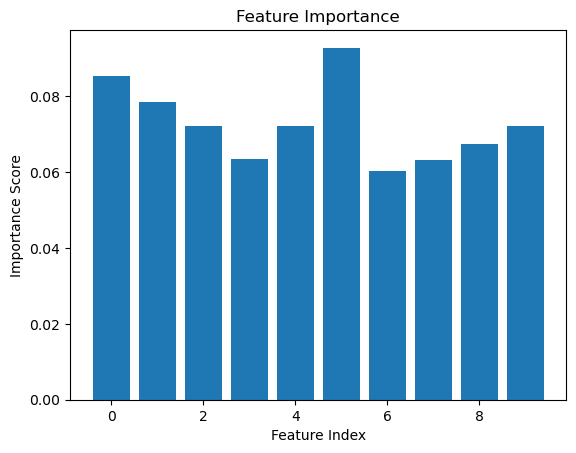

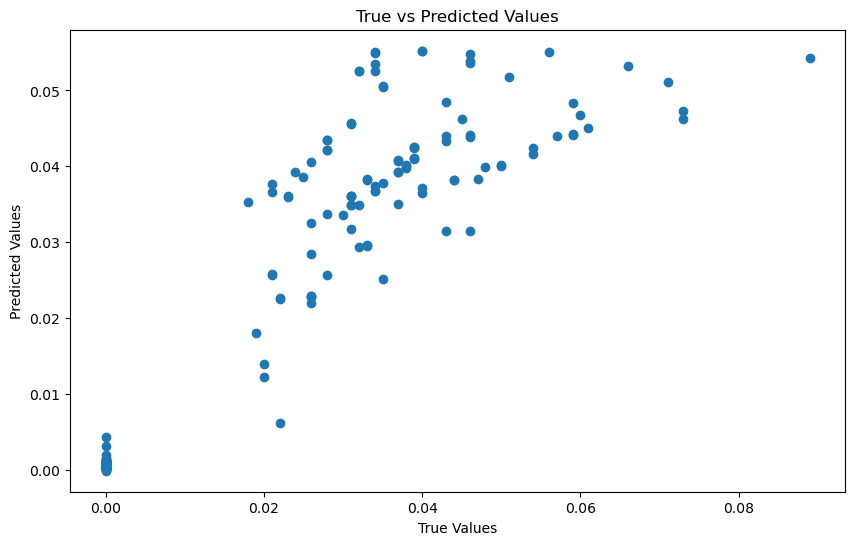

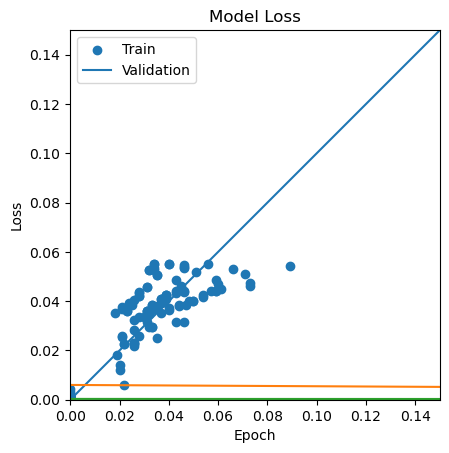

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 15ms/step - loss: 499.8604 - val_loss: 4.5785e-04 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 2s 13ms/step - loss: 0.0027 - val_loss: 4.4782e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 2s 13ms/step - loss: 0.0019 - val_loss: 5.0053e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0018 - val_loss: 5.4510e-04 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0018 - val_loss: 5.1697e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 2s 13ms/step - loss: 0.0017 - val_loss: 4.8437e-04 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 2s 13ms/step - loss: 0.0017 - val_loss: 4.9161e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0016 - val_loss: 6.8264e-04 - lr: 0.1000
Epoch 9/200
118/118 [=========================

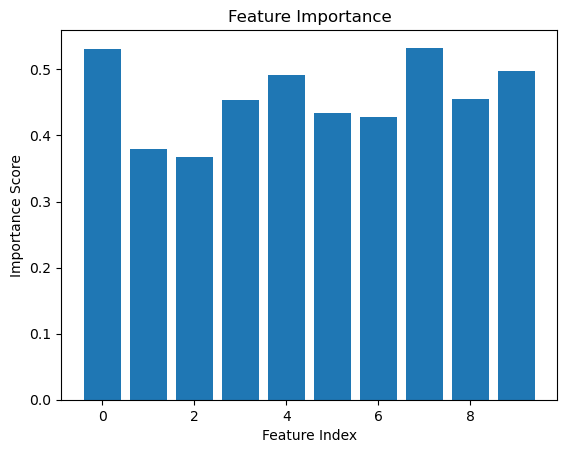

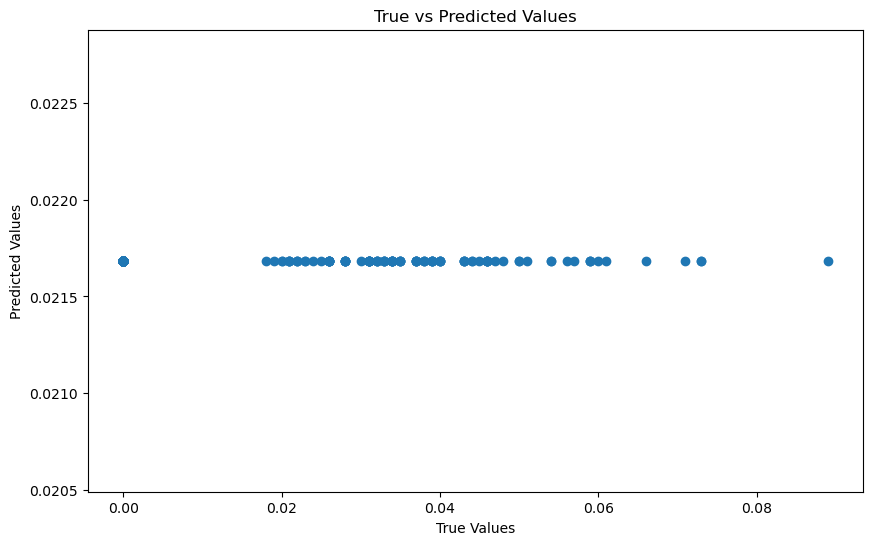

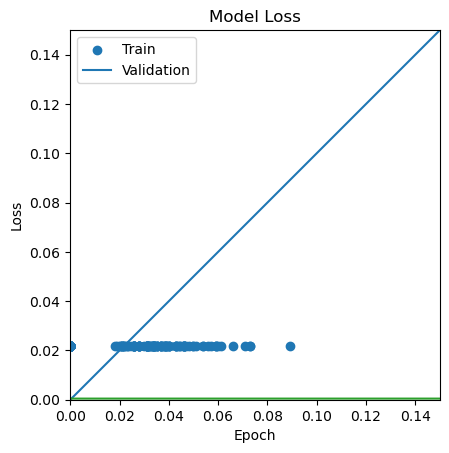

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 18ms/step - loss: 699.7792 - val_loss: 0.1914 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 47.3447 - val_loss: 0.0011 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 0.1634 - val_loss: 6.0155e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0341 - val_loss: 5.0497e-04 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0029 - val_loss: 4.5202e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0037 - val_loss: 4.3551e-04 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0018 - val_loss: 4.3743e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0016 - val_loss: 4.3657e-04 - lr: 0.1000
Epoch 9/200
118/118 [==============================] 

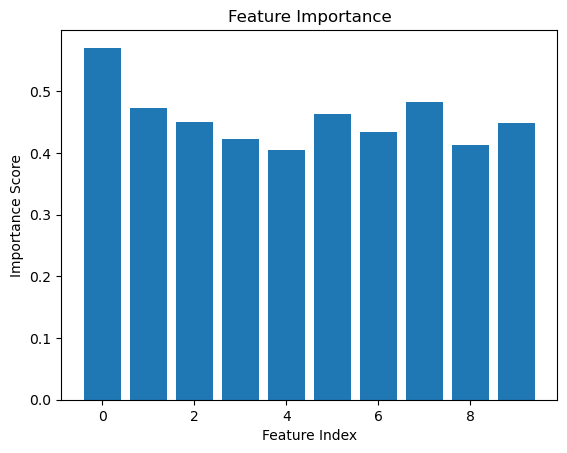

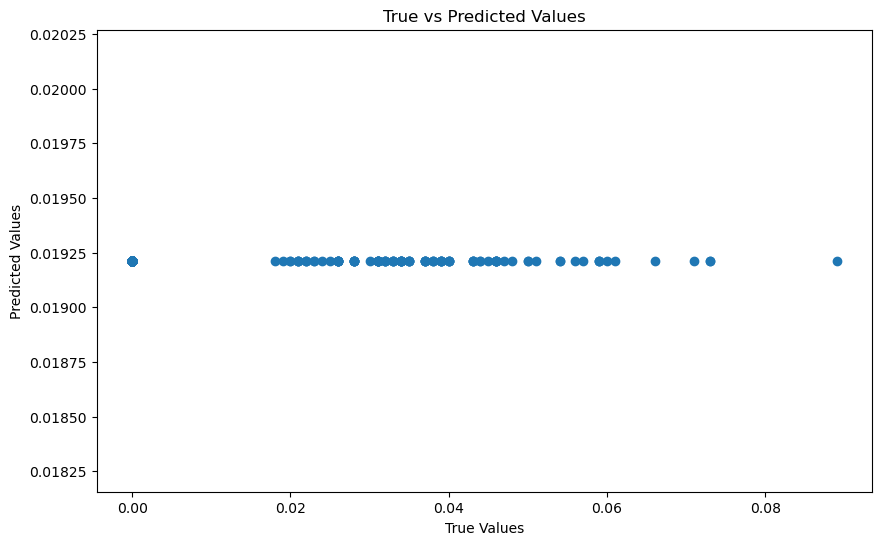

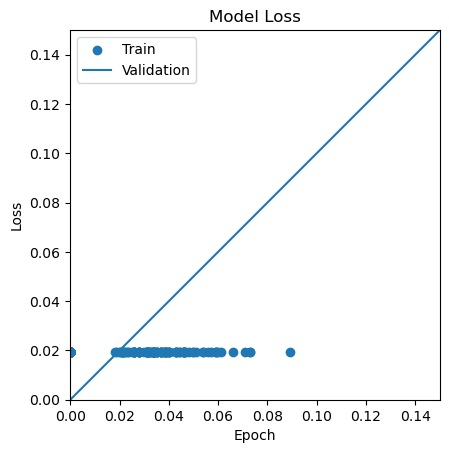

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 17ms/step - loss: 7980.4185 - val_loss: 0.1554 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 2s 16ms/step - loss: 2.0924 - val_loss: 0.0999 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0839 - val_loss: 0.0601 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0488 - val_loss: 0.0321 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0269 - val_loss: 0.0153 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0375 - val_loss: 0.0064 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0068 - val_loss: 0.0025 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0029 - val_loss: 0.0010 - lr: 0.1000
Epoch 9/200
118/118 [==============================] - 2s 15ms/step - loss: 0

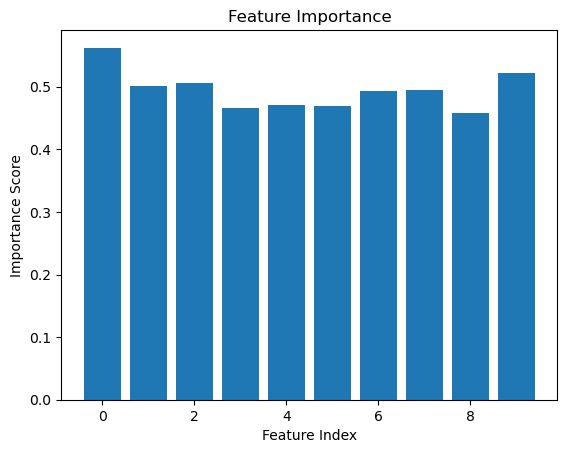

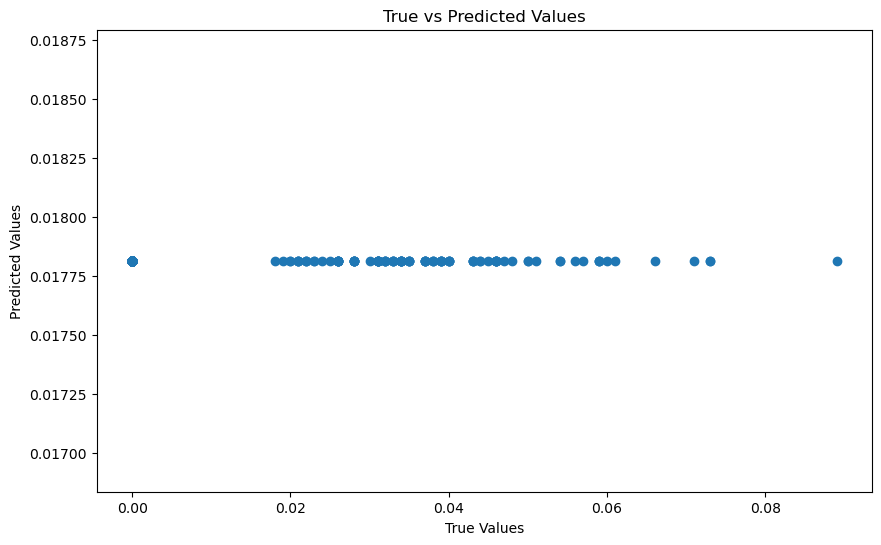

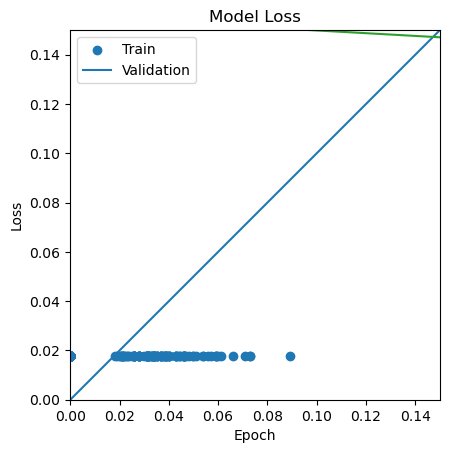

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 17ms/step - loss: 15642.2549 - val_loss: 0.0584 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 12489.5664 - val_loss: 0.1901 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 196.8430 - val_loss: 0.1015 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 54850.9766 - val_loss: 1.8253 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 12242.9160 - val_loss: 0.0602 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 2s 15ms/step - loss: 1.0808 - val_loss: 0.0197 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 1.1254 - val_loss: 0.0053 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 2s 15ms/step - loss: 0.3656 - val_loss: 0.0012 - lr: 0.1000
Epoch 9/200
118/118 [==============================] - 2s 15ms

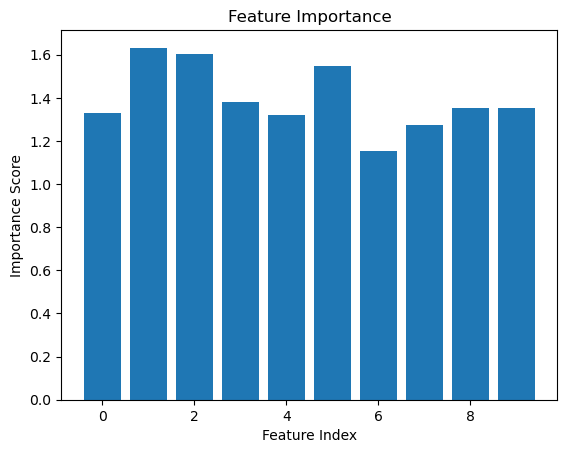

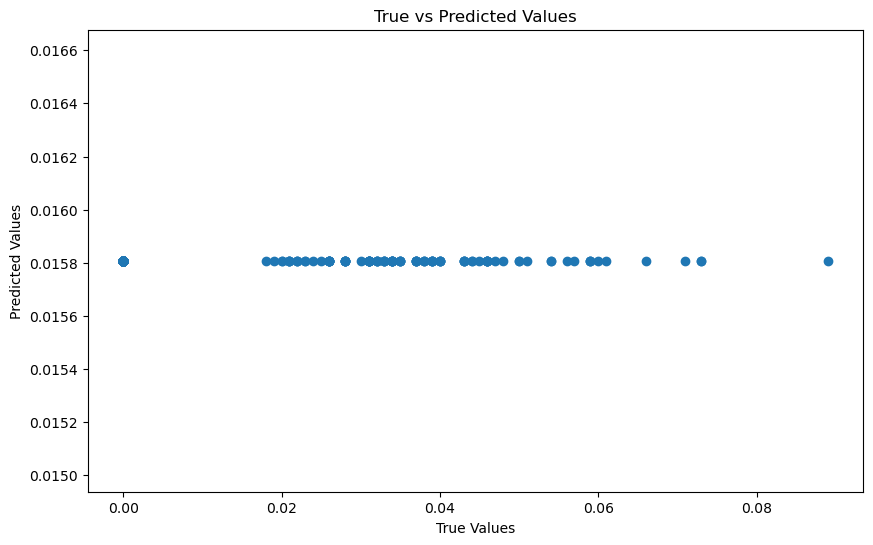

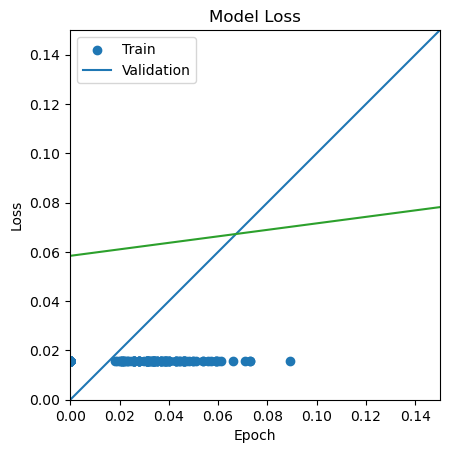

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 20ms/step - loss: 104012.0156 - val_loss: 6.0938e-04 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0013 - val_loss: 4.5741e-04 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0013 - val_loss: 6.3293e-04 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0013 - val_loss: 5.1809e-04 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0014 - val_loss: 5.1842e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0014 - val_loss: 4.3230e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0012 - val_loss: 5.2038e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0014 - val_loss: 5.0036e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 1s 13m

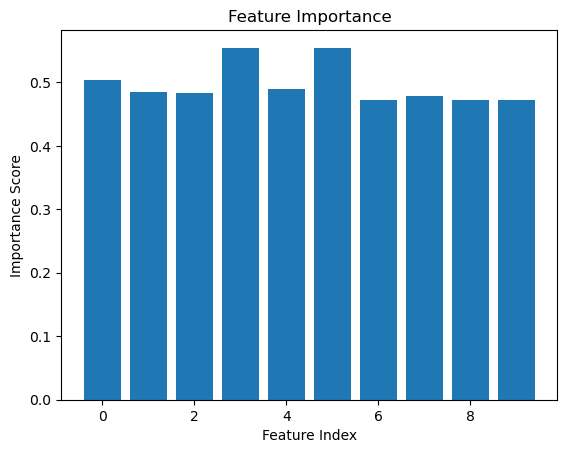

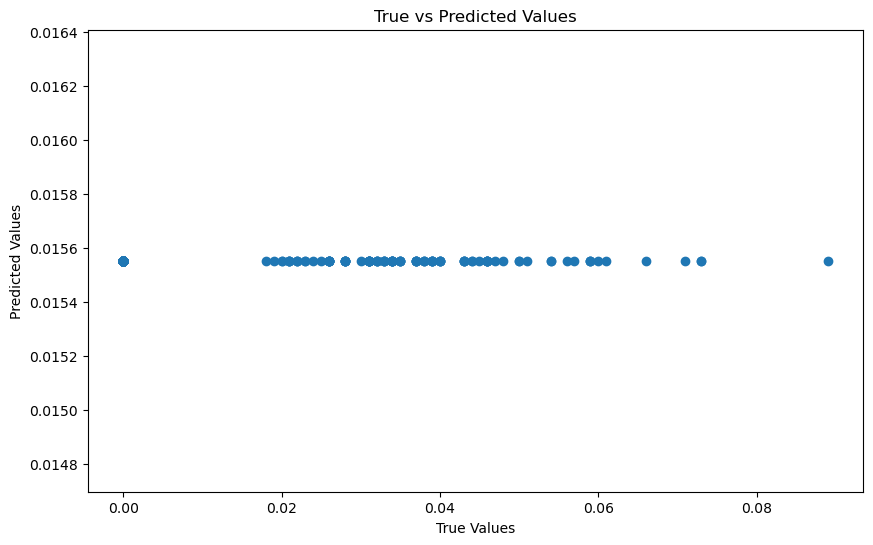

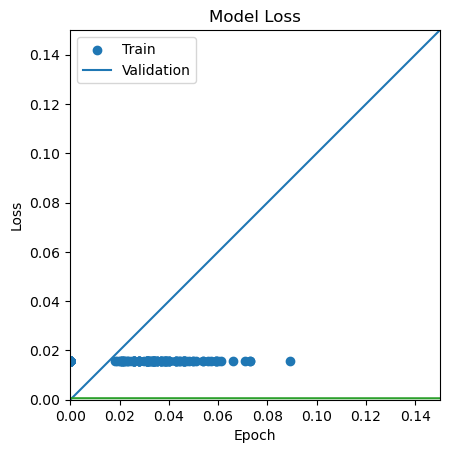

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 19ms/step - loss: 67106.6797 - val_loss: 0.2156 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 15ms/step - loss: 0.2173 - val_loss: 0.2041 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 16ms/step - loss: 0.2031 - val_loss: 0.1886 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 1s 15ms/step - loss: 0.1865 - val_loss: 0.1714 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 1s 15ms/step - loss: 389.3511 - val_loss: 0.1387 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 1s 16ms/step - loss: 0.1326 - val_loss: 0.1185 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 16ms/step - loss: 0.1161 - val_loss: 0.1033 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 1s 16ms/step - loss: 0.1010 - val_loss: 0.0890 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0868 - val_los

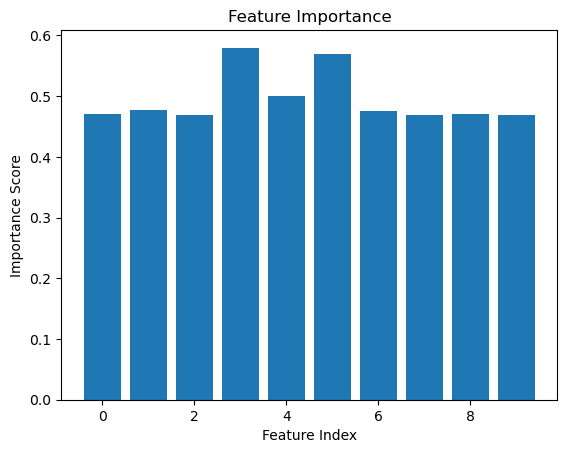

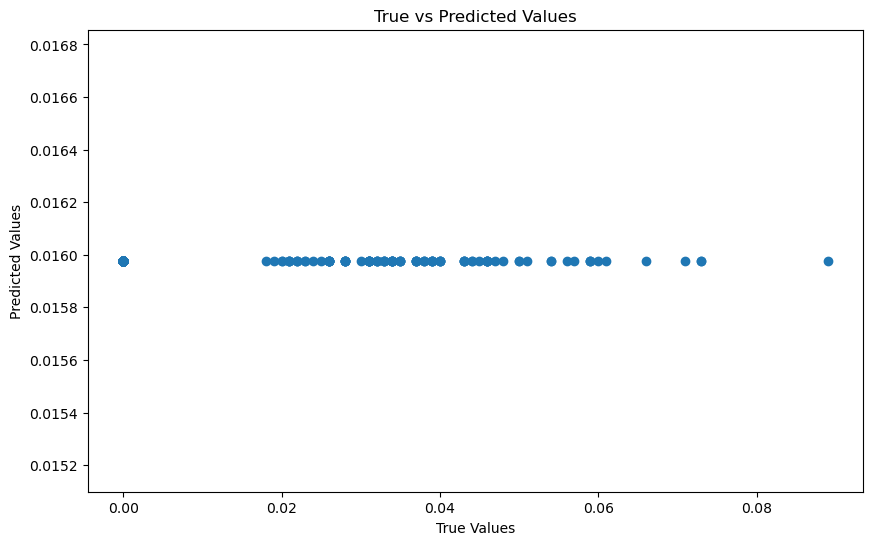

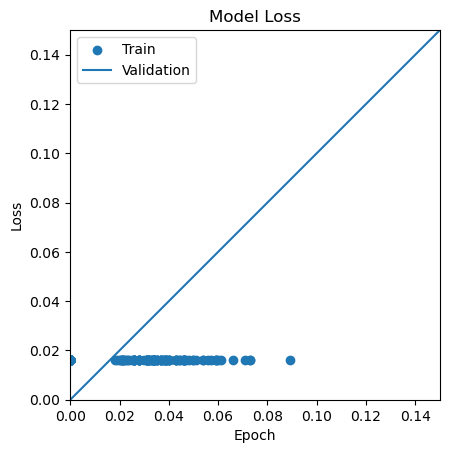

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 29ms/step - loss: 59077.0781 - val_loss: 4.6232e-04 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 22ms/step - loss: 0.0830 - val_loss: 5.0982e-04 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 16ms/step - loss: 0.6898 - val_loss: 0.1600 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 1s 21ms/step - loss: 0.0641 - val_loss: 4.9458e-04 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0502 - val_loss: 5.0317e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0526 - val_loss: 5.3981e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 17ms/step - loss: 0.0465 - val_loss: 5.4631e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 1s 22ms/step - loss: 0.0452 - val_loss: 4.5783e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 1s 25ms/ste

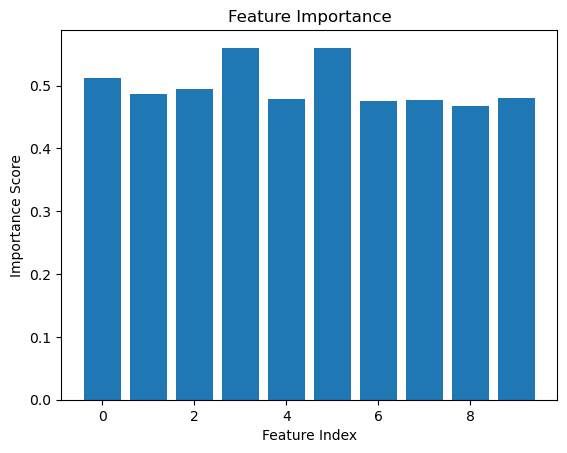

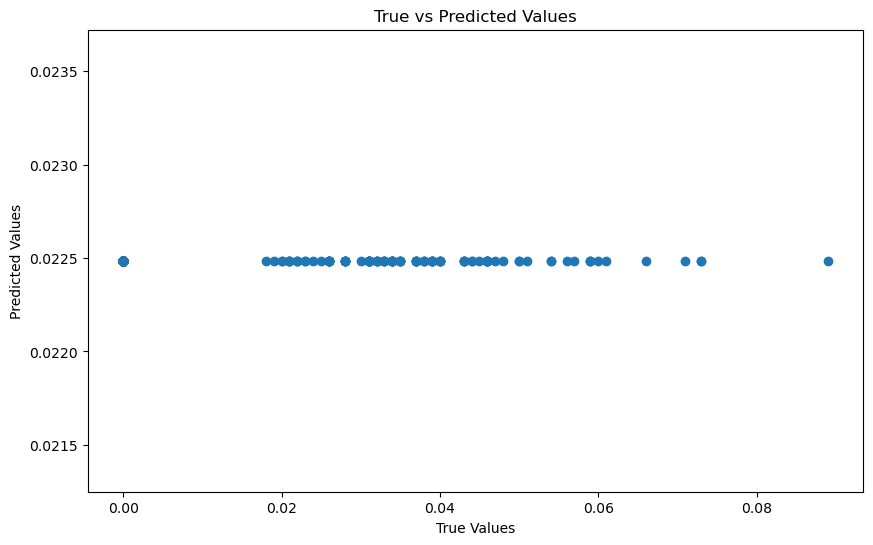

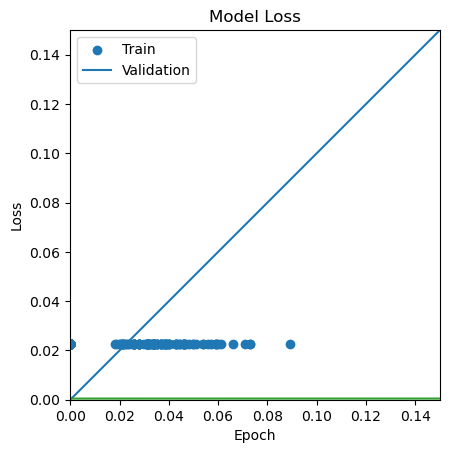

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 23ms/step - loss: 571.3401 - val_loss: 0.0110 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0106 - val_loss: 0.0018 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0565 - val_loss: 9.9650e-04 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0056 - val_loss: 6.3334e-04 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0012 - val_loss: 5.0872e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0012 - val_loss: 4.7083e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0012 - val_loss: 4.6142e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0012 - val_loss: 4.5187e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 1s 18ms/step - lo

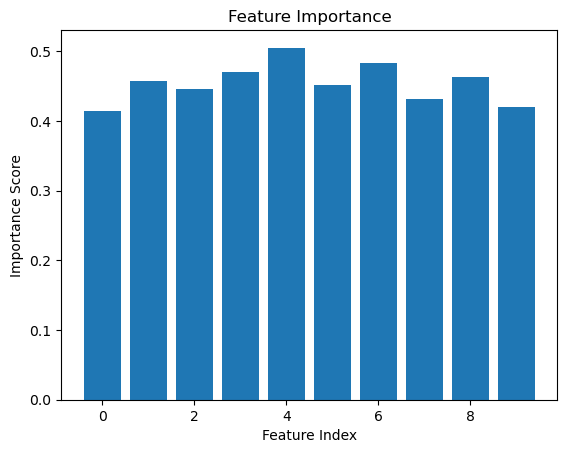

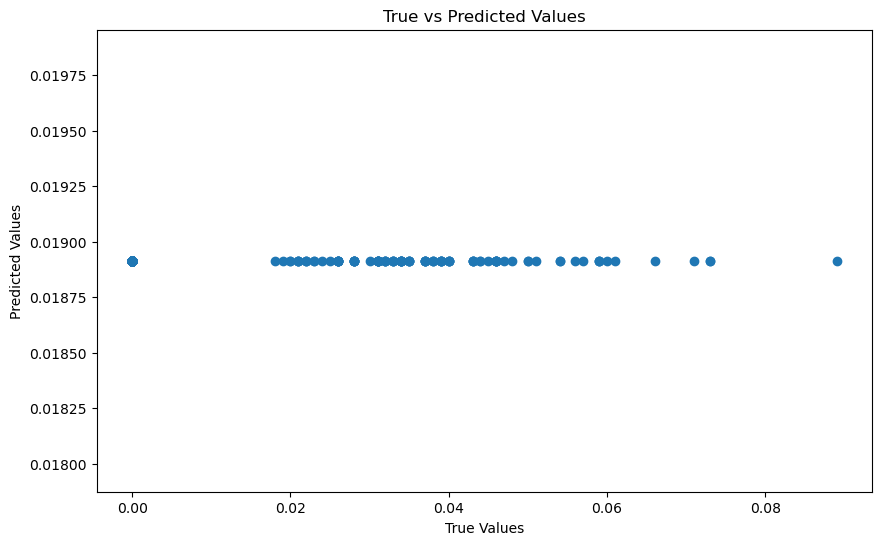

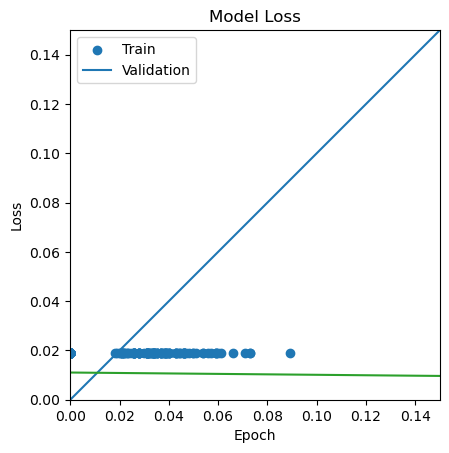

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 26ms/step - loss: 648029.6250 - val_loss: 0.1732 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0752 - val_loss: 0.0133 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 17ms/step - loss: 0.0038 - val_loss: 0.0014 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0013 - val_loss: 4.7587e-04 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 17ms/step - loss: 0.0012 - val_loss: 4.5648e-04 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 17ms/step - loss: 0.0012 - val_loss: 4.4814e-04 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 0s 16ms/step - loss: 0.0012 - val_loss: 4.2558e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 17ms/step - loss: 0.0012 - val_loss: 6.0205e-04 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 0s 17ms/step - los

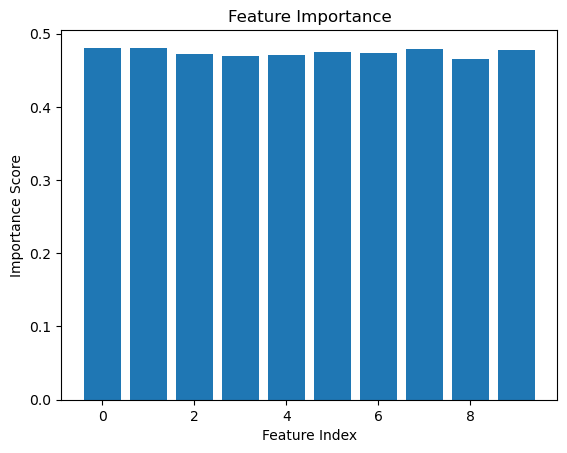

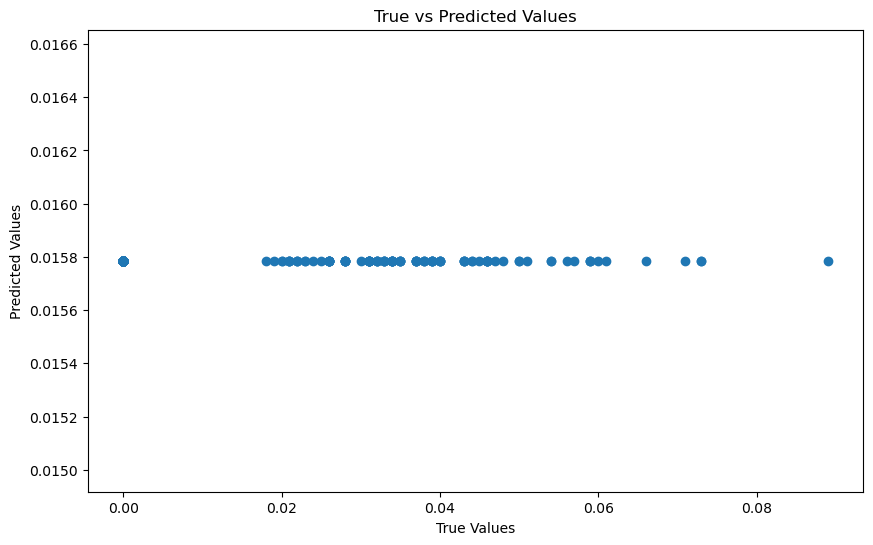

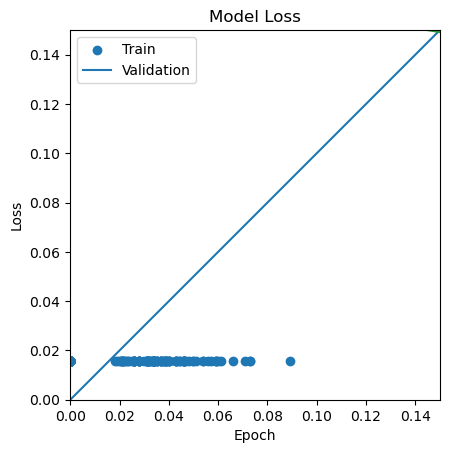

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 29ms/step - loss: 59204.7539 - val_loss: 2.3597 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 19ms/step - loss: 1.8896 - val_loss: 0.0188 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 18ms/step - loss: 0.2779 - val_loss: 0.0052 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 19ms/step - loss: 3.0964 - val_loss: 0.0018 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0133 - val_loss: 0.0011 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0112 - val_loss: 4.1409e-04 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 18ms/step - loss: 0.0033 - val_loss: 4.3507e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0035 - val_loss: 4.1461e-04 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 18ms/step - loss: 0.0025

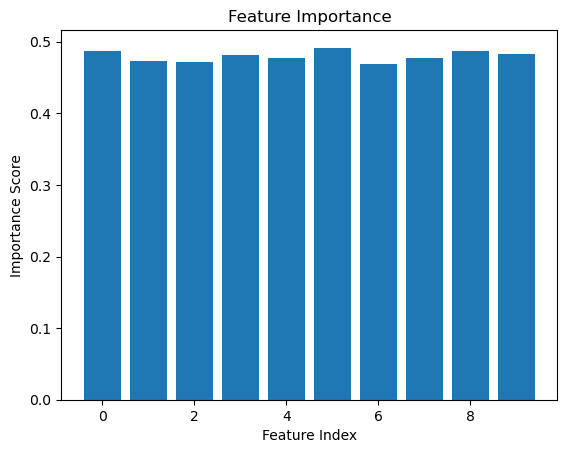

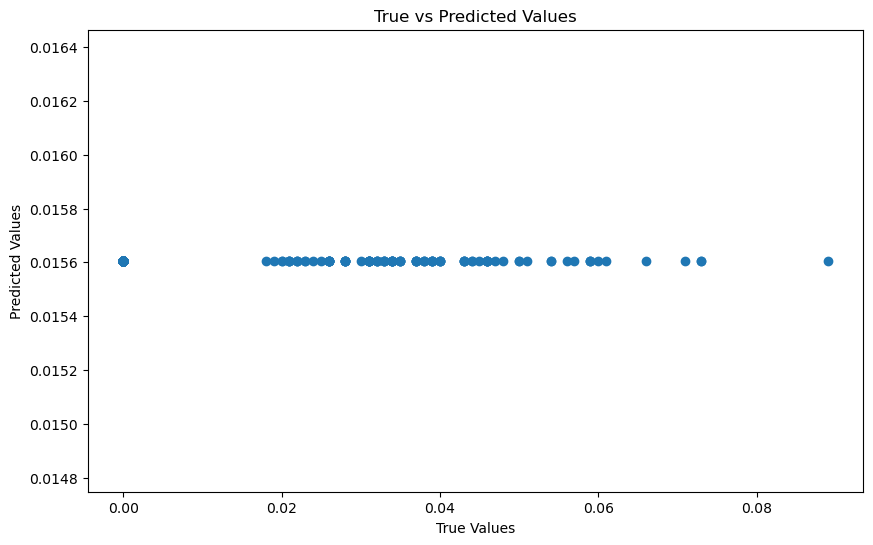

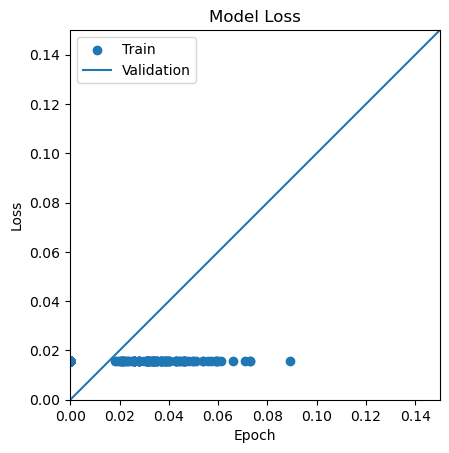

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 29ms/step - loss: 19806.3672 - val_loss: 1.2279 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 18ms/step - loss: 50.2907 - val_loss: 0.1357 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 18ms/step - loss: 18.1536 - val_loss: 0.1276 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 20ms/step - loss: 2.6089 - val_loss: 0.1209 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 19ms/step - loss: 42.6368 - val_loss: 0.1069 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 20ms/step - loss: 2903.9019 - val_loss: 0.0576 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 20ms/step - loss: 51.0737 - val_loss: 0.0437 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 18ms/step - loss: 130.5277 - val_loss: 0.0417 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 19ms/step - loss: 5.8110 - 

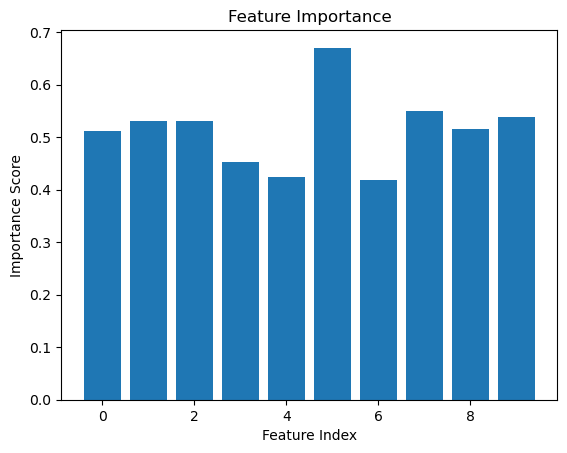

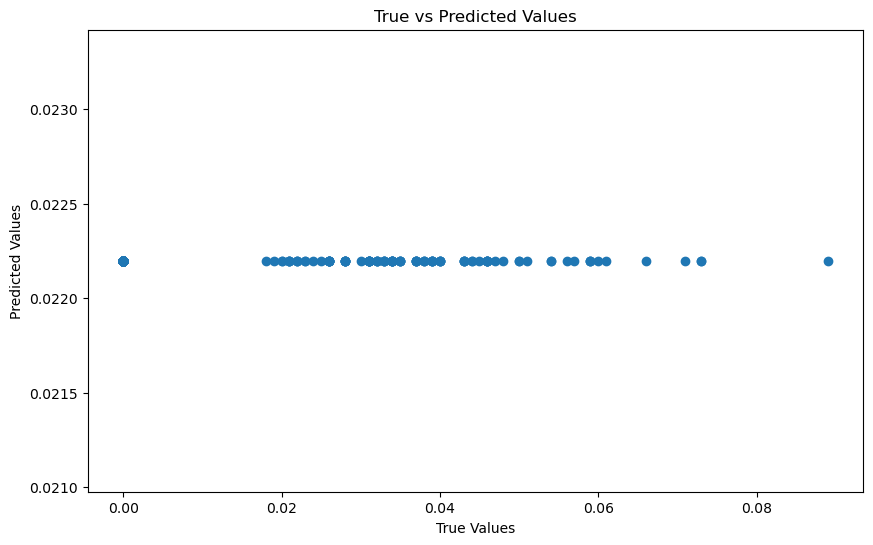

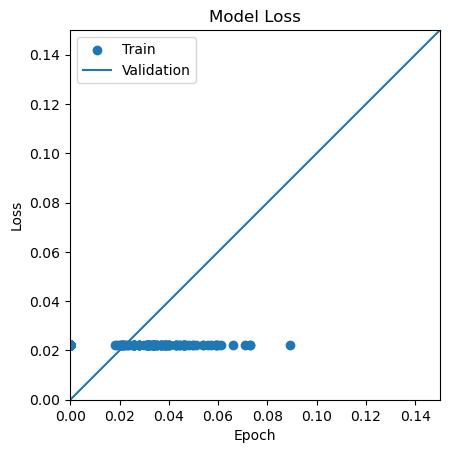

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 34ms/step - loss: 2560.5354 - val_loss: 0.1503 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 19ms/step - loss: 15.9202 - val_loss: 0.1462 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 18ms/step - loss: 0.3283 - val_loss: 0.1186 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 18ms/step - loss: 0.2269 - val_loss: 0.0912 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0935 - val_loss: 0.0675 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0948 - val_loss: 0.0481 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0400 - val_loss: 0.0334 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 18ms/step - loss: 0.0272 - val_loss: 0.0225 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0191 - val_loss:

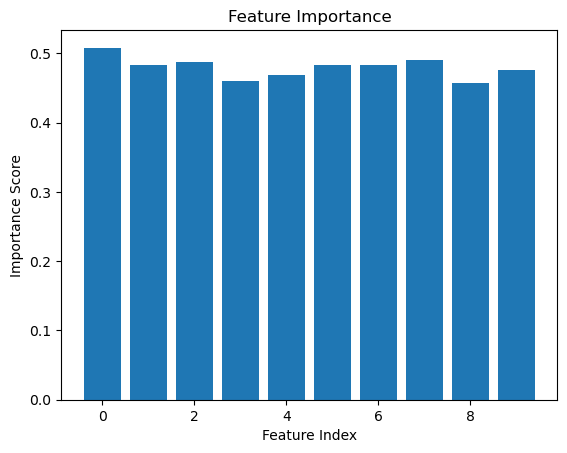

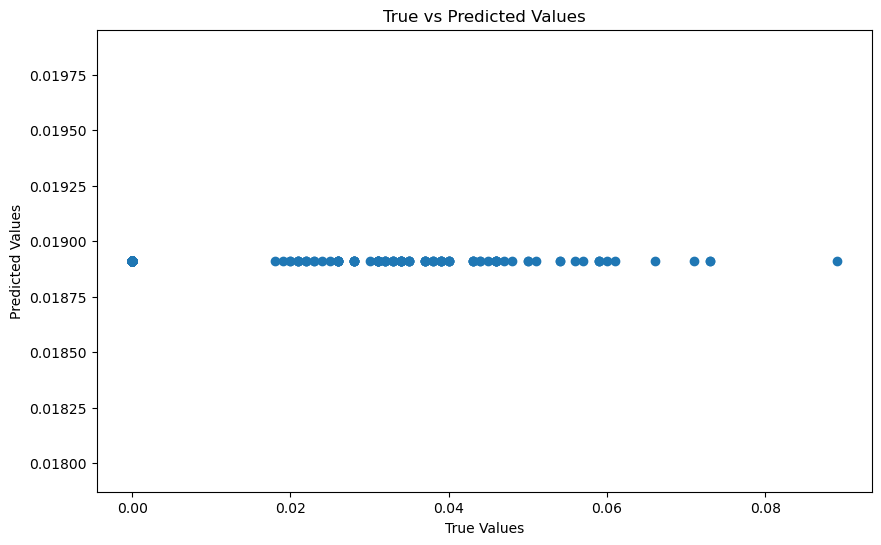

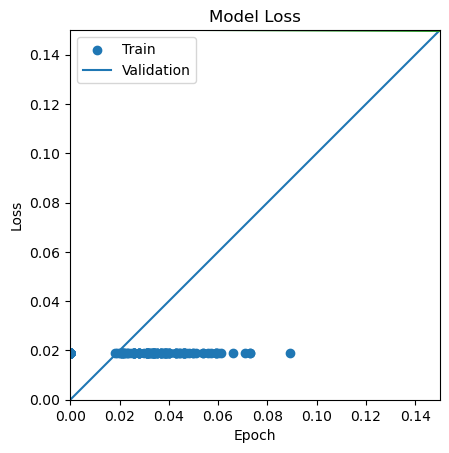

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 17ms/step - loss: 0.0131 - val_loss: 0.0076 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0116 - val_loss: 0.0066 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0103 - val_loss: 0.0057 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0092 - val_loss: 0.0049 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0083 - val_loss: 0.0043 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 2s 13ms/step - loss: 0.0075 - val_loss: 0.0037 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0068 - val_loss: 0.0032 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0061 - val_loss: 0.0028 - lr: 1.0000e-04
Epoch 9/200
118/118 [===========================

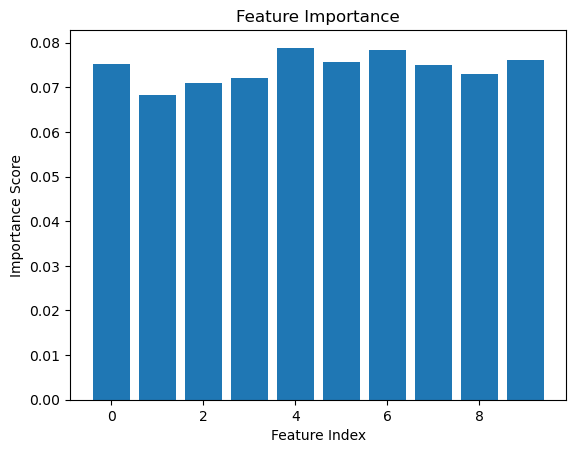

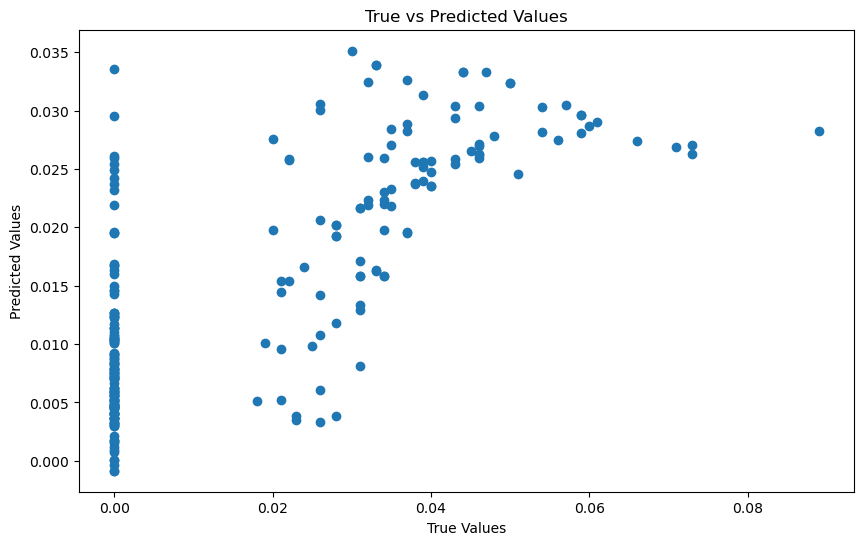

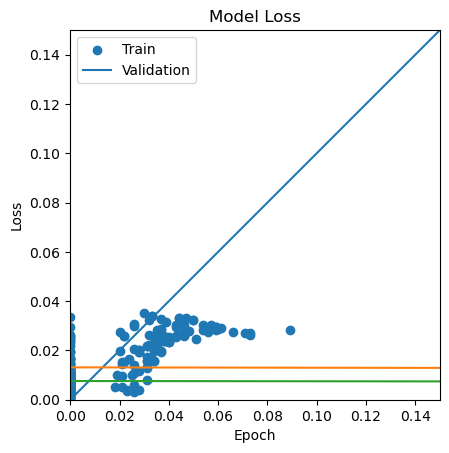

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 18ms/step - loss: 0.0079 - val_loss: 0.0053 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0074 - val_loss: 0.0047 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0075 - val_loss: 0.0041 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0063 - val_loss: 0.0037 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0060 - val_loss: 0.0033 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0057 - val_loss: 0.0029 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0056 - val_loss: 0.0026 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0052 - val_loss: 0.0023 - lr: 1.0000e-04
Epoch 9/200
118/118 [===========================

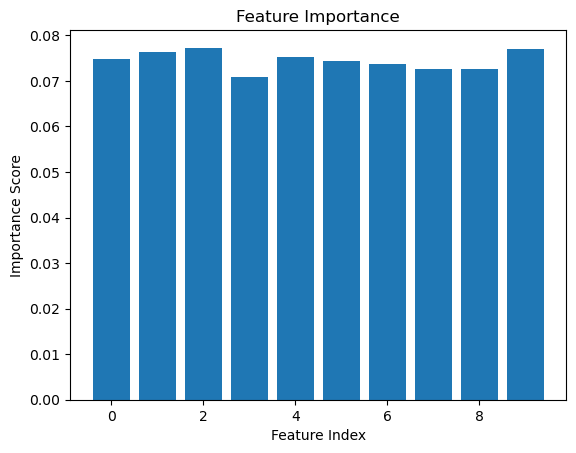

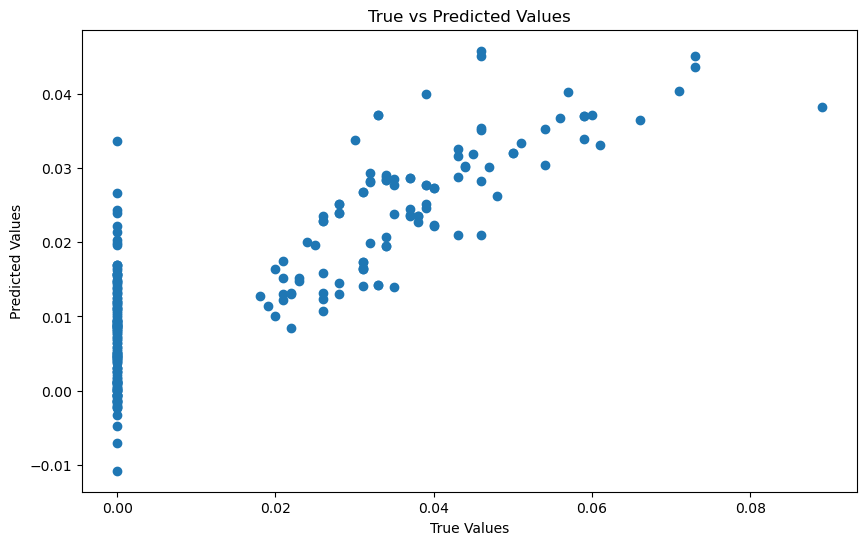

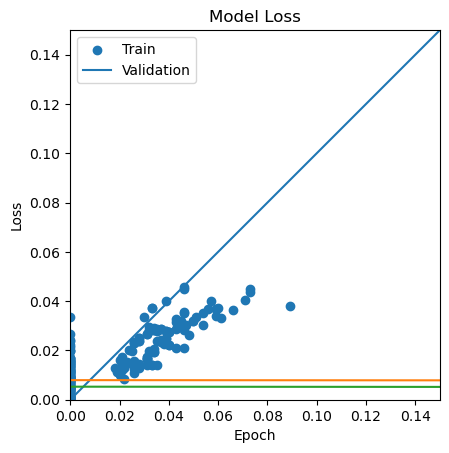

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 18ms/step - loss: 0.0047 - val_loss: 0.0011 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0046 - val_loss: 0.0011 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0046 - val_loss: 0.0011 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0047 - val_loss: 0.0010 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0047 - val_loss: 0.0010 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0047 - val_loss: 9.9179e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0043 - val_loss: 9.7461e-04 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0050 - val_loss: 9.5251e-04 - lr: 1.0000e-04
Epoch 9/200
118/118 [===============

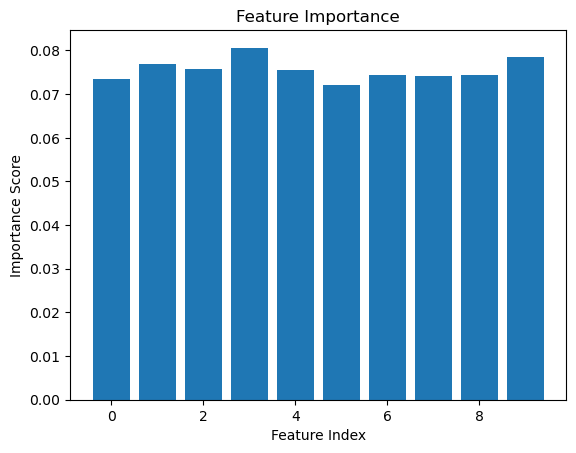

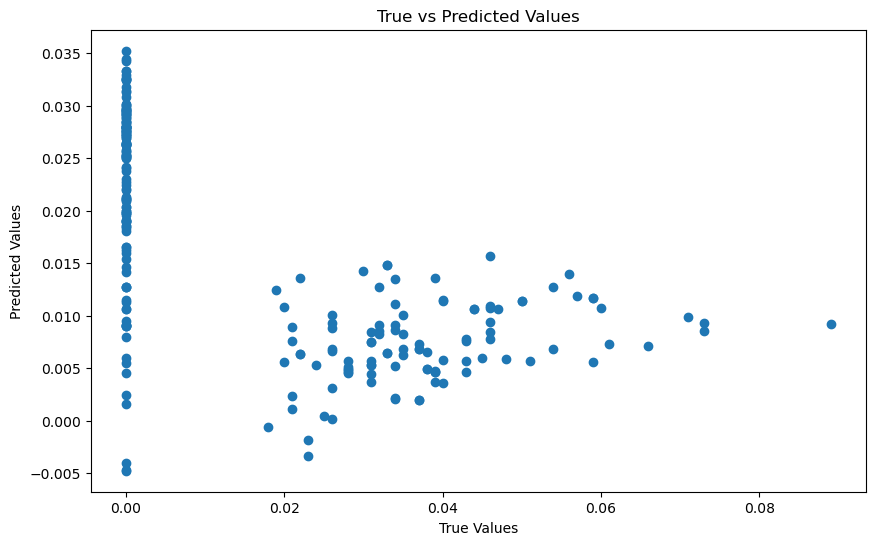

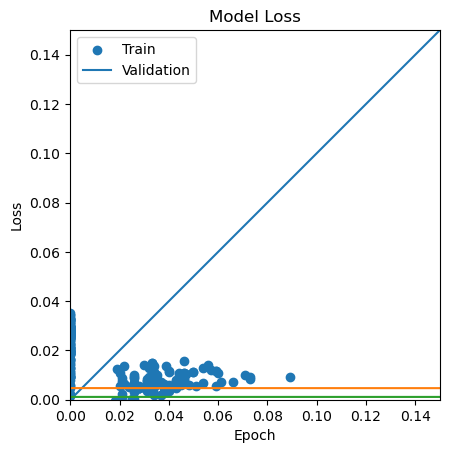

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 18ms/step - loss: 0.0113 - val_loss: 0.0038 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0112 - val_loss: 0.0033 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0100 - val_loss: 0.0029 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0096 - val_loss: 0.0025 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0091 - val_loss: 0.0022 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0082 - val_loss: 0.0019 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0091 - val_loss: 0.0016 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0082 - val_loss: 0.0014 - lr: 1.0000e-04
Epoch 9/200
118/118 [===========================

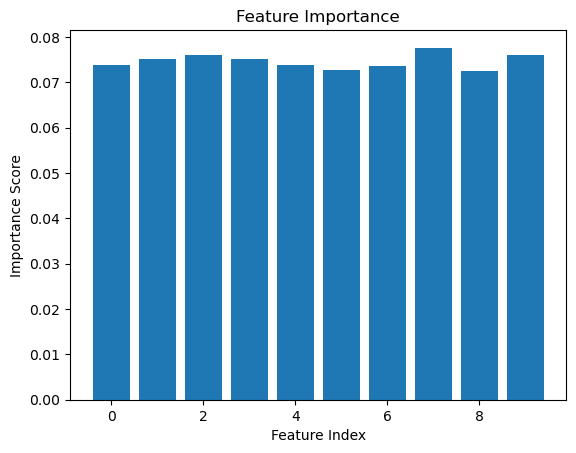

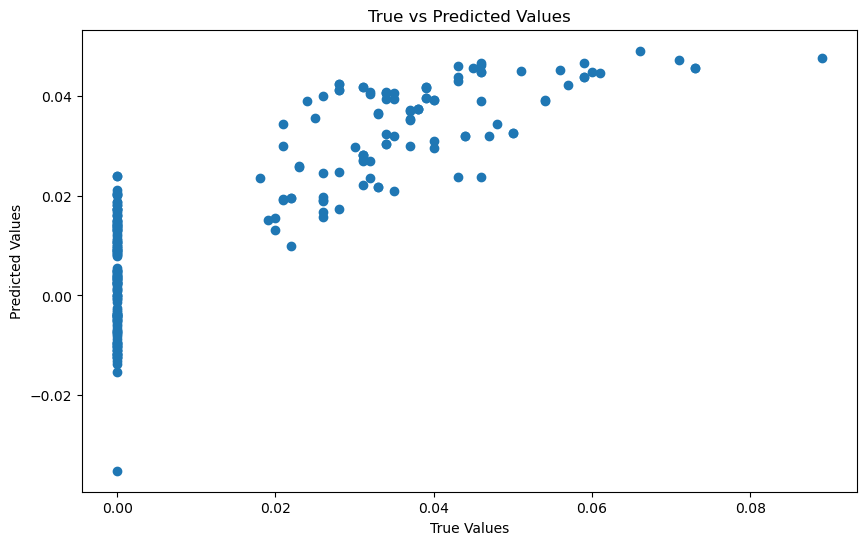

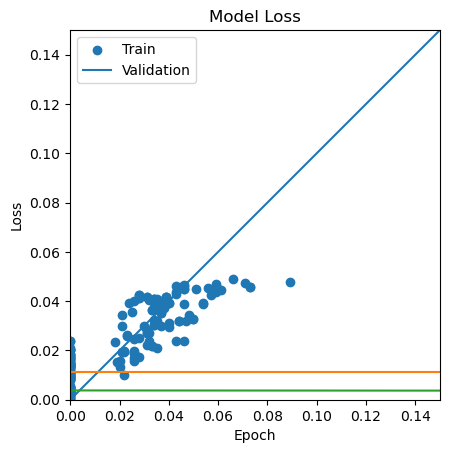

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 23ms/step - loss: 0.0019 - val_loss: 0.0020 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0019 - val_loss: 0.0020 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0019 - val_loss: 0.0020 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0019 - val_loss: 0.0020 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0019 - val_loss: 0.0020 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0019 - val_loss: 0.0020 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0019 - val_loss: 0.0019 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0019 - val_loss: 0.0019 - lr: 1.0000e-04
Epoch 9/200
59/59 [==============================] - 1s 14ms/ste

59/59 [==============================] - 1s 15ms/step - loss: 0.0017 - val_loss: 0.0017 - lr: 1.3639e-08
Epoch 140/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0017 - val_loss: 0.0017 - lr: 1.2341e-08
Epoch 141/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0017 - val_loss: 0.0017 - lr: 1.1167e-08
Epoch 142/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0017 - val_loss: 0.0017 - lr: 1.0104e-08
Epoch 143/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0017 - val_loss: 0.0017 - lr: 9.1424e-09
Epoch 144/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0017 - val_loss: 0.0017 - lr: 8.2724e-09
Epoch 145/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0017 - val_loss: 0.0017 - lr: 7.4851e-09
Epoch 146/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0017 - val_loss: 0.0017 - lr: 6.7728e-09
Epoch 147/200
59/59 [==============================] - 1s 14ms

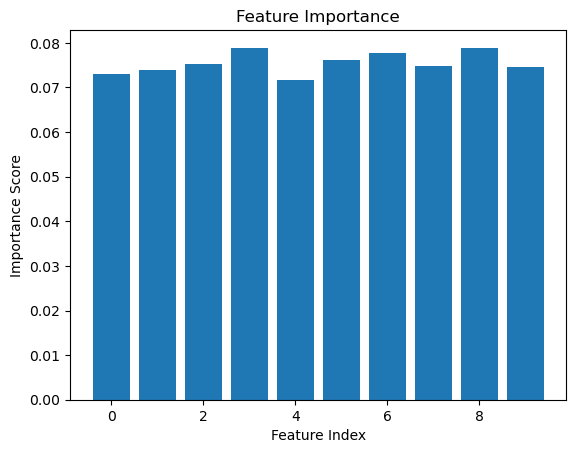

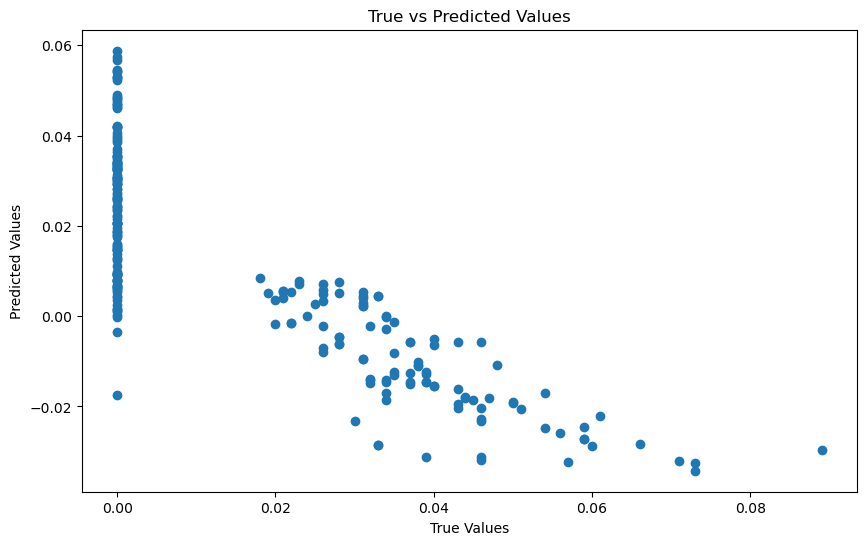

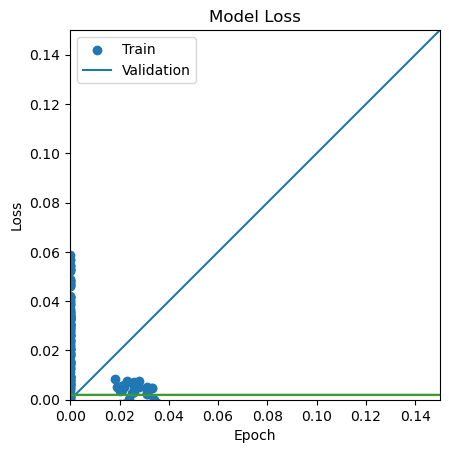

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 22ms/step - loss: 0.0104 - val_loss: 0.0138 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0102 - val_loss: 0.0133 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0108 - val_loss: 0.0128 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0097 - val_loss: 0.0123 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0098 - val_loss: 0.0119 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0091 - val_loss: 0.0115 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 1s 17ms/step - loss: 0.0085 - val_loss: 0.0111 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0088 - val_loss: 0.0107 - lr: 1.0000e-04
Epoch 9/200
59/59 [==============================] - 1s 16ms/ste

59/59 [==============================] - 1s 17ms/step - loss: 0.0050 - val_loss: 0.0034 - lr: 1.3639e-08
Epoch 140/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0048 - val_loss: 0.0034 - lr: 1.2341e-08
Epoch 141/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0053 - val_loss: 0.0034 - lr: 1.1167e-08
Epoch 142/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0049 - val_loss: 0.0034 - lr: 1.0104e-08
Epoch 143/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0049 - val_loss: 0.0034 - lr: 9.1424e-09
Epoch 144/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0048 - val_loss: 0.0034 - lr: 8.2724e-09
Epoch 145/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0052 - val_loss: 0.0034 - lr: 7.4851e-09
Epoch 146/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0047 - val_loss: 0.0034 - lr: 6.7728e-09
Epoch 147/200
59/59 [==============================] - 1s 16ms

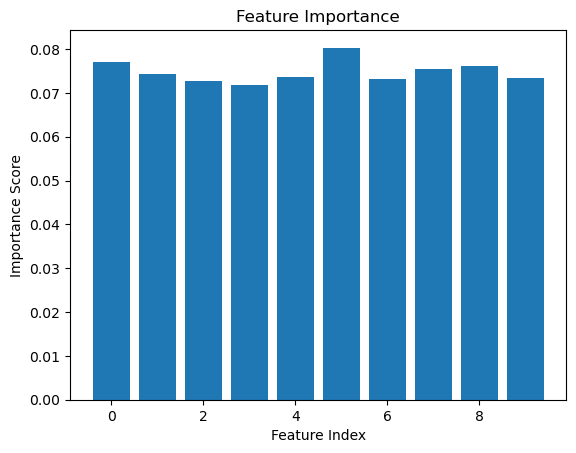

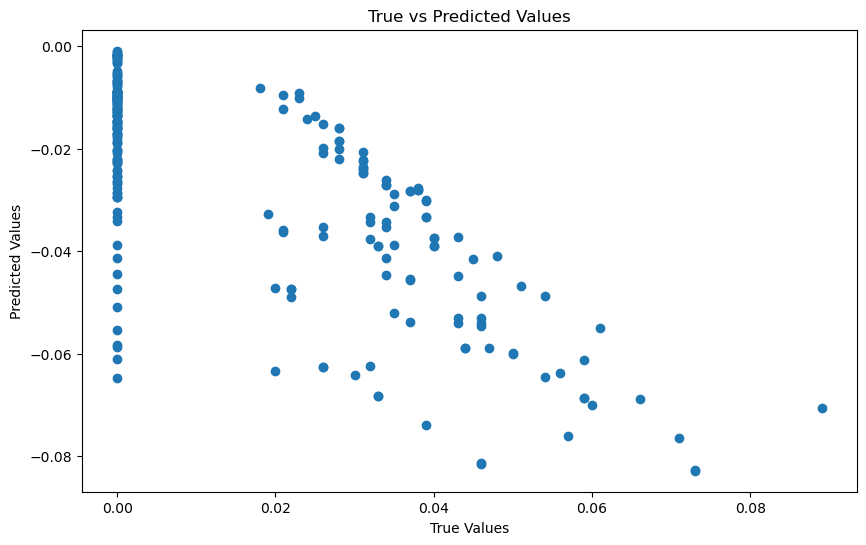

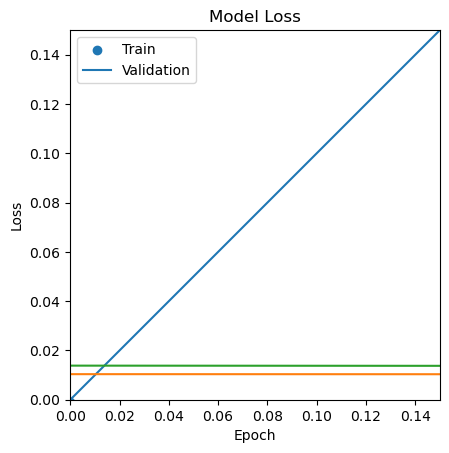

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 23ms/step - loss: 0.0073 - val_loss: 0.0042 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0078 - val_loss: 0.0040 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 1s 17ms/step - loss: 0.0068 - val_loss: 0.0039 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0073 - val_loss: 0.0037 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0067 - val_loss: 0.0036 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0067 - val_loss: 0.0034 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0064 - val_loss: 0.0033 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0065 - val_loss: 0.0032 - lr: 1.0000e-04
Epoch 9/200
59/59 [==============================] - 1s 15ms/ste

59/59 [==============================] - 2s 26ms/step - loss: 0.0040 - val_loss: 0.0011 - lr: 1.3639e-08
Epoch 140/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0042 - val_loss: 0.0011 - lr: 1.2341e-08
Epoch 141/200
59/59 [==============================] - 2s 27ms/step - loss: 0.0042 - val_loss: 0.0011 - lr: 1.1167e-08
Epoch 142/200
59/59 [==============================] - 2s 25ms/step - loss: 0.0043 - val_loss: 0.0011 - lr: 1.0104e-08
Epoch 143/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0039 - val_loss: 0.0011 - lr: 9.1424e-09
Epoch 144/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0040 - val_loss: 0.0011 - lr: 8.2724e-09
Epoch 145/200
59/59 [==============================] - 2s 25ms/step - loss: 0.0040 - val_loss: 0.0011 - lr: 7.4851e-09
Epoch 146/200
59/59 [==============================] - 2s 25ms/step - loss: 0.0040 - val_loss: 0.0011 - lr: 6.7728e-09
Epoch 147/200
59/59 [==============================] - 2s 26ms

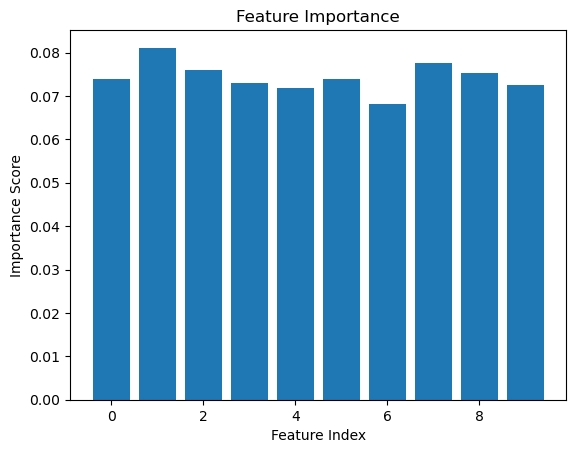

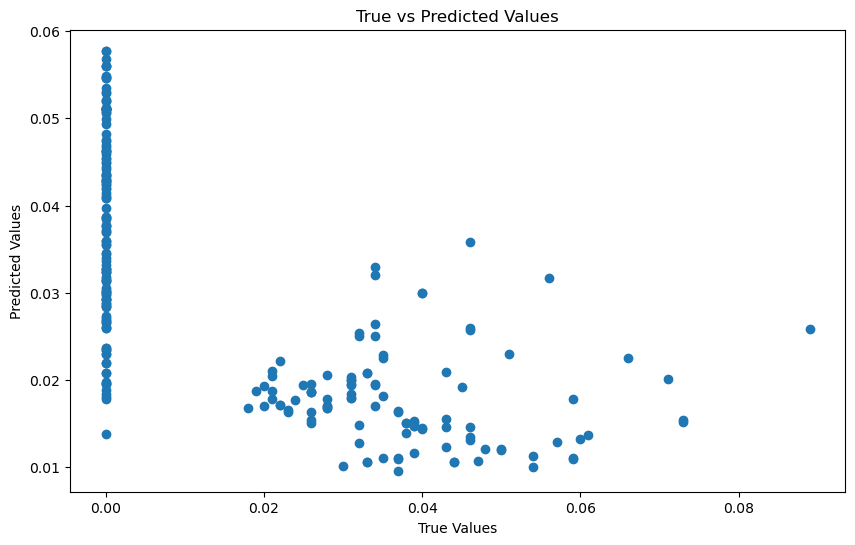

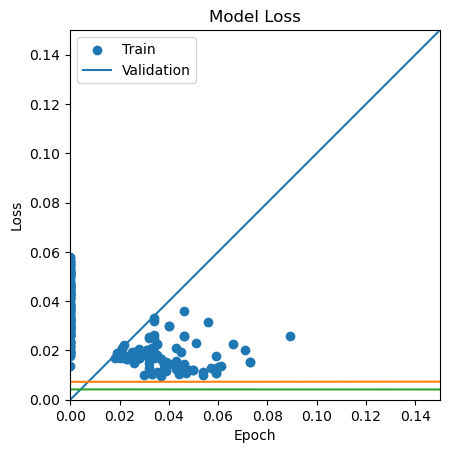

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 30ms/step - loss: 0.0291 - val_loss: 0.0080 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0270 - val_loss: 0.0073 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 2s 30ms/step - loss: 0.0260 - val_loss: 0.0067 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0261 - val_loss: 0.0061 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0249 - val_loss: 0.0056 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0240 - val_loss: 0.0051 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0228 - val_loss: 0.0047 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0210 - val_loss: 0.0043 - lr: 1.0000e-04
Epoch 9/200
59/59 [==============================] - 1s 24ms/ste

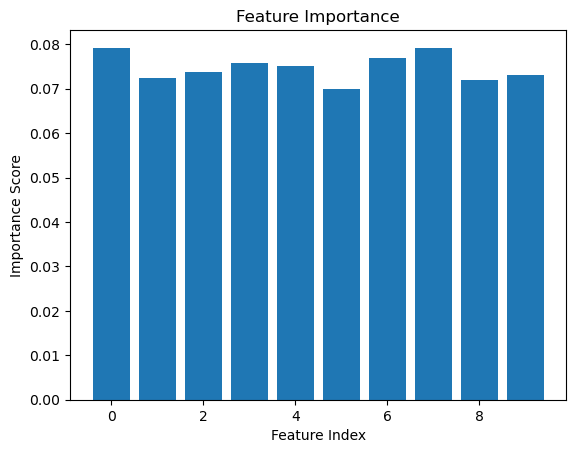

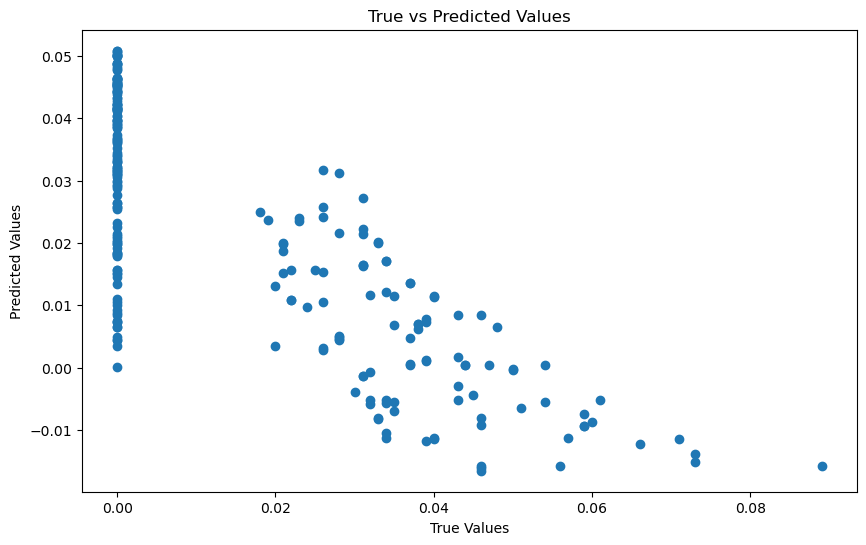

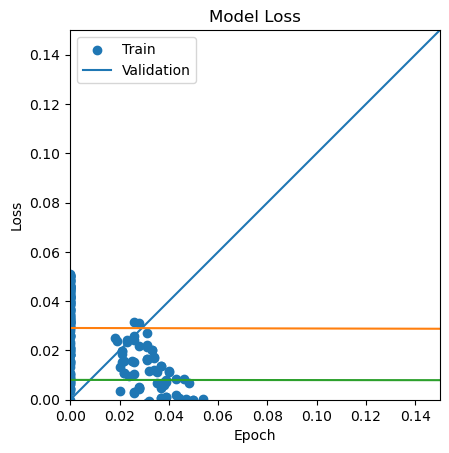

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 41ms/step - loss: 0.0070 - val_loss: 0.0068 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0068 - val_loss: 0.0066 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0067 - val_loss: 0.0064 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0065 - val_loss: 0.0063 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0063 - val_loss: 0.0061 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0062 - val_loss: 0.0059 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0060 - val_loss: 0.0058 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0059 - val_loss: 0.0056 - lr: 1.0000e-04
Epoch 9/200
30/30 [==============================] - 1s 26ms/ste

30/30 [==============================] - 1s 26ms/step - loss: 0.0022 - val_loss: 0.0019 - lr: 1.3639e-08
Epoch 140/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0022 - val_loss: 0.0019 - lr: 1.2341e-08
Epoch 141/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0022 - val_loss: 0.0019 - lr: 1.1167e-08
Epoch 142/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0022 - val_loss: 0.0019 - lr: 1.0104e-08
Epoch 143/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0022 - val_loss: 0.0019 - lr: 9.1424e-09
Epoch 144/200
30/30 [==============================] - 1s 48ms/step - loss: 0.0022 - val_loss: 0.0019 - lr: 8.2724e-09
Epoch 145/200
30/30 [==============================] - 1s 37ms/step - loss: 0.0022 - val_loss: 0.0019 - lr: 7.4851e-09
Epoch 146/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0022 - val_loss: 0.0019 - lr: 6.7728e-09
Epoch 147/200
30/30 [==============================] - 1s 25ms

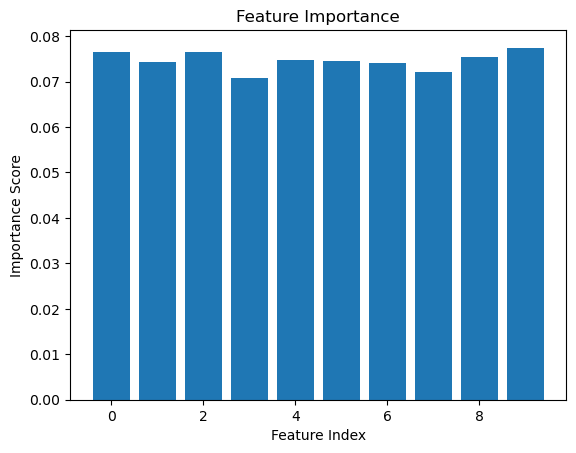

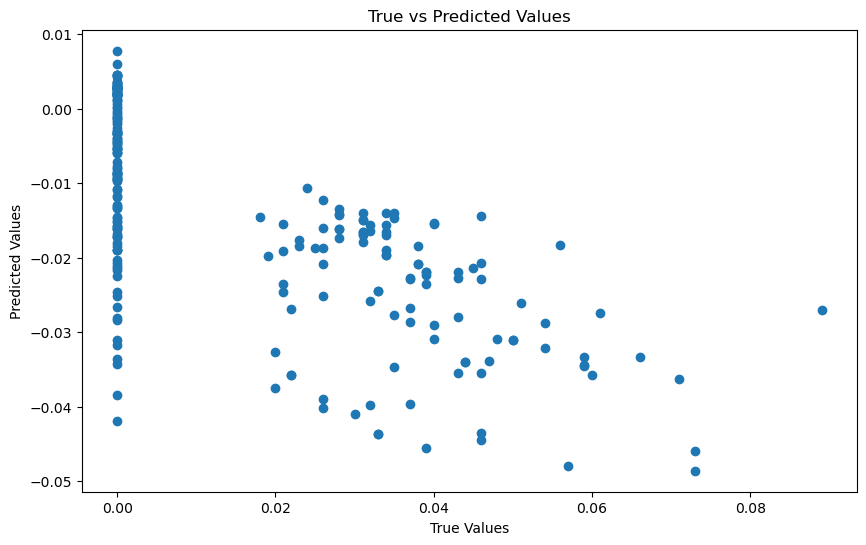

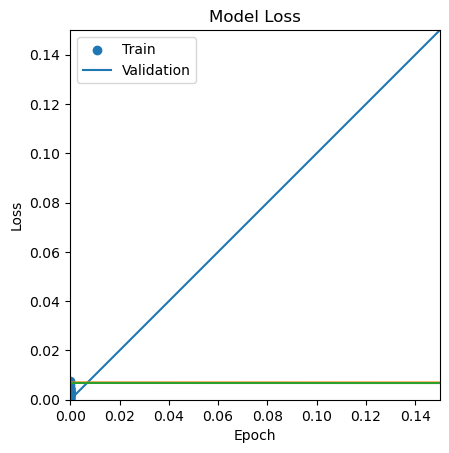

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 55ms/step - loss: 0.0093 - val_loss: 0.0053 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 34ms/step - loss: 0.0094 - val_loss: 0.0051 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0090 - val_loss: 0.0049 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0087 - val_loss: 0.0047 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 35ms/step - loss: 0.0093 - val_loss: 0.0046 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0085 - val_loss: 0.0044 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0085 - val_loss: 0.0042 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0081 - val_loss: 0.0041 - lr: 1.0000e-04
Epoch 9/200
30/30 [==============================] - 1s 26ms/ste

Epoch 70/200
30/30 [==============================] - 1s 37ms/step - loss: 0.0039 - val_loss: 7.0599e-04 - lr: 1.3534e-05
Epoch 71/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0040 - val_loss: 7.0339e-04 - lr: 1.2246e-05
Epoch 72/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0040 - val_loss: 7.0094e-04 - lr: 1.1080e-05
Epoch 73/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0045 - val_loss: 6.9866e-04 - lr: 1.0026e-05
Epoch 74/200
30/30 [==============================] - 1s 34ms/step - loss: 0.0041 - val_loss: 6.9673e-04 - lr: 9.0718e-06
Epoch 75/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0044 - val_loss: 6.9494e-04 - lr: 8.2085e-06
Epoch 76/200
30/30 [==============================] - 1s 31ms/step - loss: 0.0040 - val_loss: 6.9345e-04 - lr: 7.4273e-06
Epoch 77/200
30/30 [==============================] - 1s 40ms/step - loss: 0.0042 - val_loss: 6.9199e-04 - lr: 6.7205e-06
Epoch 78/200
30/30 [====

Epoch 137/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0040 - val_loss: 6.7977e-04 - lr: 1.6659e-08
Epoch 138/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0041 - val_loss: 6.7977e-04 - lr: 1.5073e-08
Epoch 139/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0040 - val_loss: 6.7977e-04 - lr: 1.3639e-08
Epoch 140/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0041 - val_loss: 6.7977e-04 - lr: 1.2341e-08
Epoch 141/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0040 - val_loss: 6.7977e-04 - lr: 1.1167e-08
Epoch 142/200
30/30 [==============================] - 1s 41ms/step - loss: 0.0043 - val_loss: 6.7977e-04 - lr: 1.0104e-08
Epoch 143/200
30/30 [==============================] - 1s 46ms/step - loss: 0.0040 - val_loss: 6.7977e-04 - lr: 9.1424e-09
Epoch 144/200
30/30 [==============================] - 1s 46ms/step - loss: 0.0041 - val_loss: 6.7977e-04 - lr: 8.2724e-09
Epoch 145/200
30

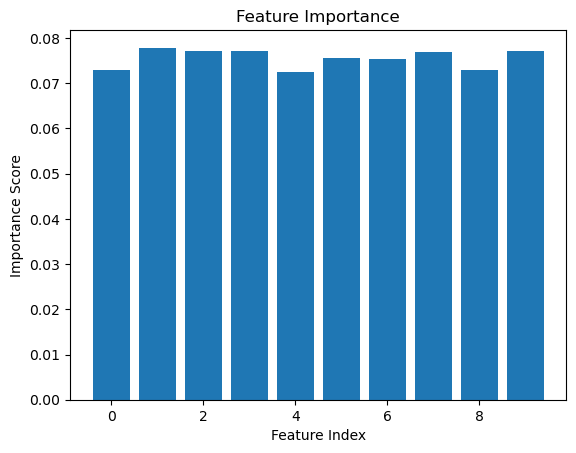

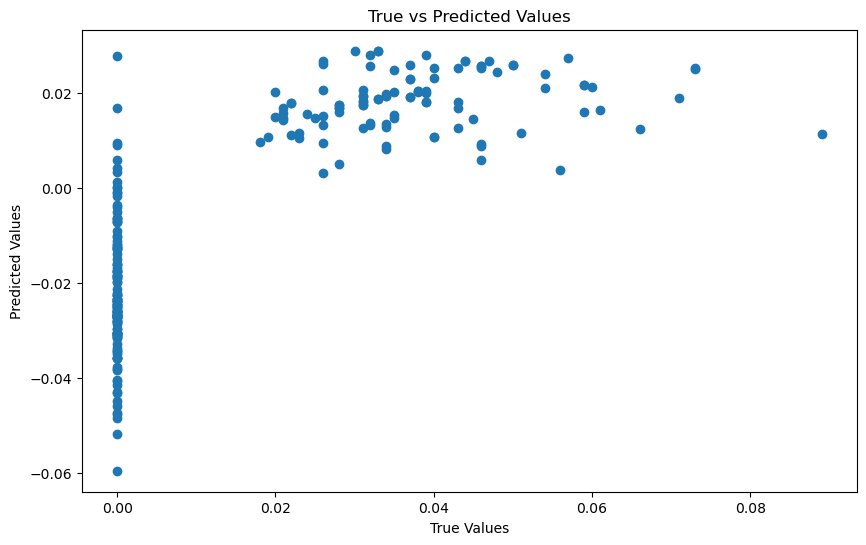

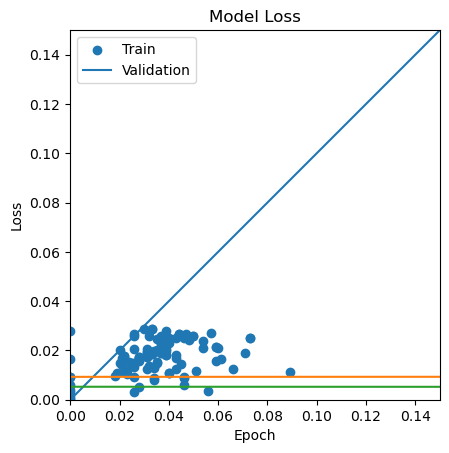

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 41ms/step - loss: 0.0067 - val_loss: 0.0027 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0064 - val_loss: 0.0027 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0061 - val_loss: 0.0027 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0059 - val_loss: 0.0028 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0061 - val_loss: 0.0028 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0062 - val_loss: 0.0028 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0057 - val_loss: 0.0028 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0061 - val_loss: 0.0028 - lr: 1.0000e-04
Epoch 9/200
30/30 [==============================] - 1s 25ms/ste

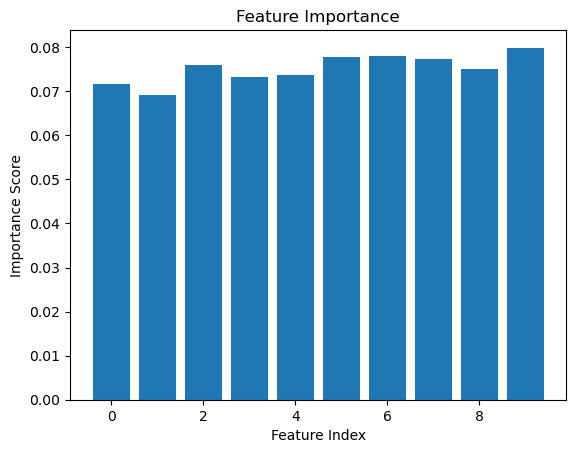

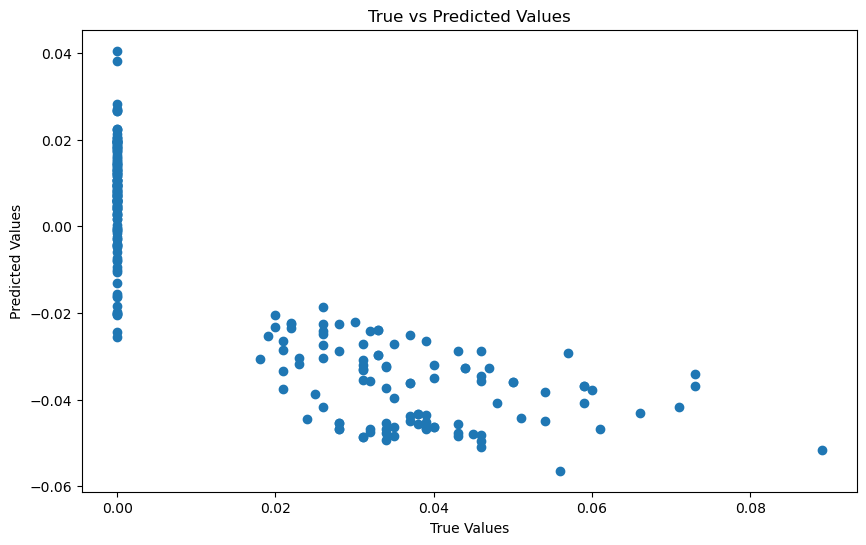

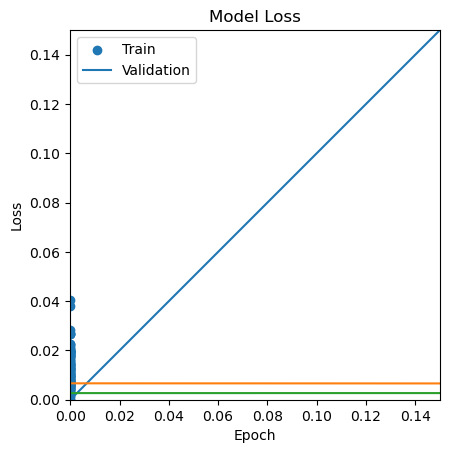

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 57ms/step - loss: 0.0299 - val_loss: 0.0054 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 45ms/step - loss: 0.0275 - val_loss: 0.0052 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 40ms/step - loss: 0.0304 - val_loss: 0.0050 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 48ms/step - loss: 0.0271 - val_loss: 0.0048 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 47ms/step - loss: 0.0272 - val_loss: 0.0046 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0281 - val_loss: 0.0044 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0265 - val_loss: 0.0043 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0263 - val_loss: 0.0042 - lr: 1.0000e-04
Epoch 9/200
30/30 [==============================] - 1s 42ms/ste

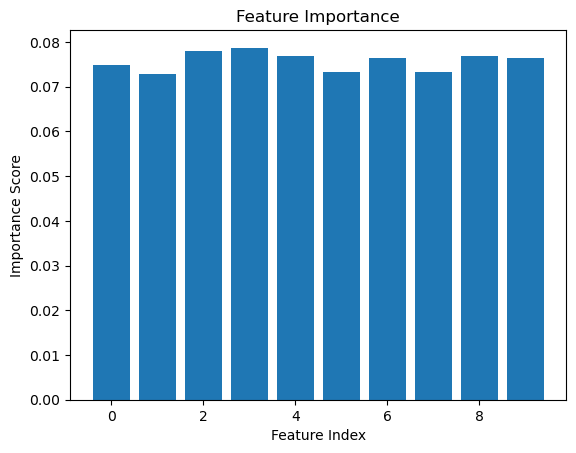

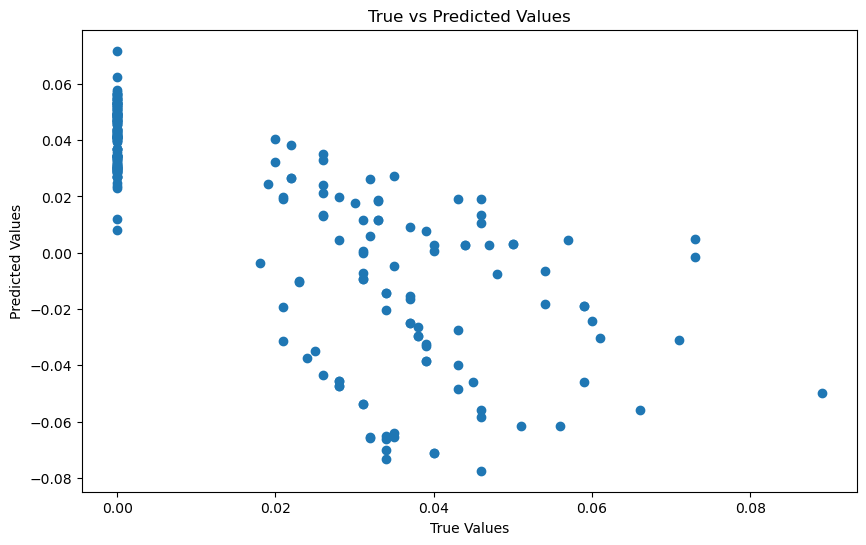

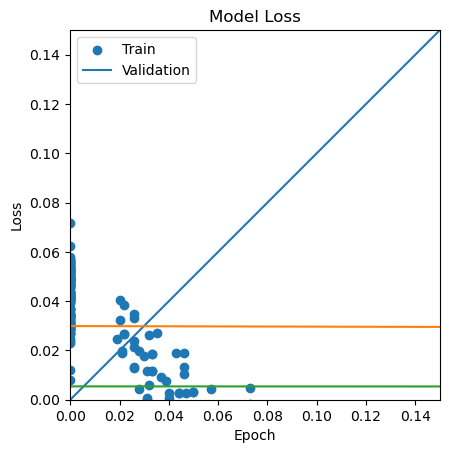

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 4s 25ms/step - loss: 0.0019 - val_loss: 0.0065 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 3s 22ms/step - loss: 0.0015 - val_loss: 0.0052 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0013 - val_loss: 0.0046 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 3s 22ms/step - loss: 0.0013 - val_loss: 0.0043 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 3s 21ms/step - loss: 0.0012 - val_loss: 0.0041 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0012 - val_loss: 0.0040 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0011 - val_loss: 0.0039 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 3s 22ms/step - loss: 0.0011 - val_loss: 0.0038 - lr: 0.0010
Epoch 9/200
118/118 [==============================] - 3s 22ms/step - loss: 0.00

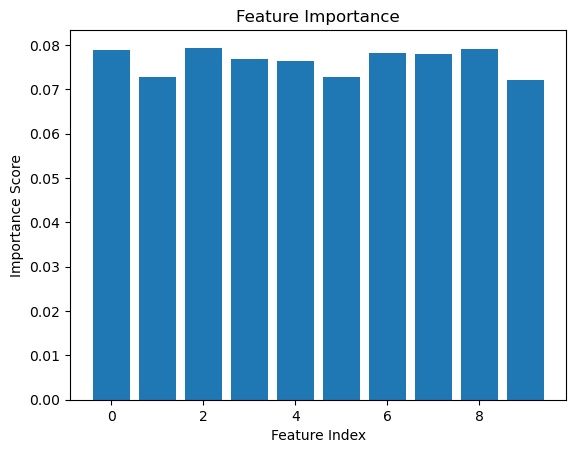

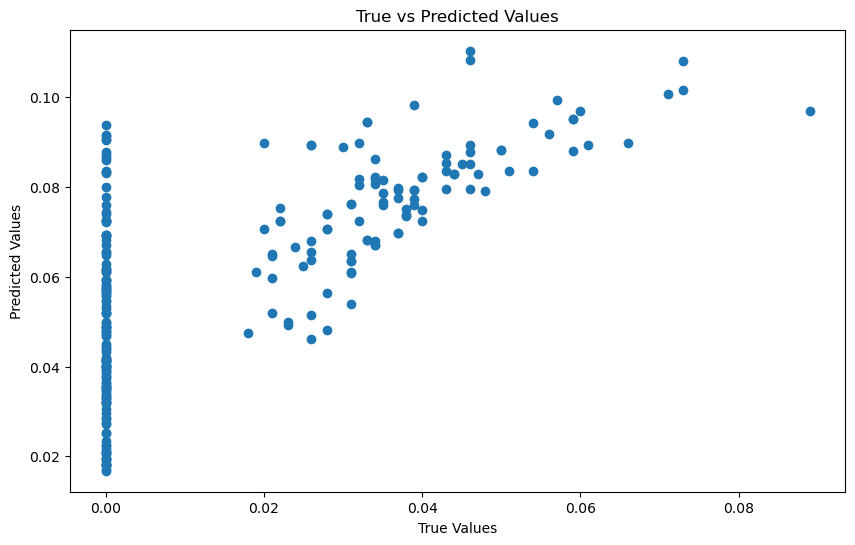

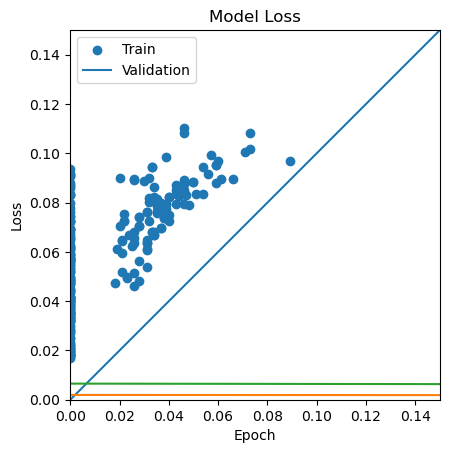

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 5s 30ms/step - loss: 0.0059 - val_loss: 9.9059e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0039 - val_loss: 5.9274e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0030 - val_loss: 6.9084e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0028 - val_loss: 8.3736e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0026 - val_loss: 9.1629e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0027 - val_loss: 0.0010 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0027 - val_loss: 0.0011 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0025 - val_loss: 0.0012 - lr: 0.0010
Epoch 9/200
118/118 [==============================] - 3s 29

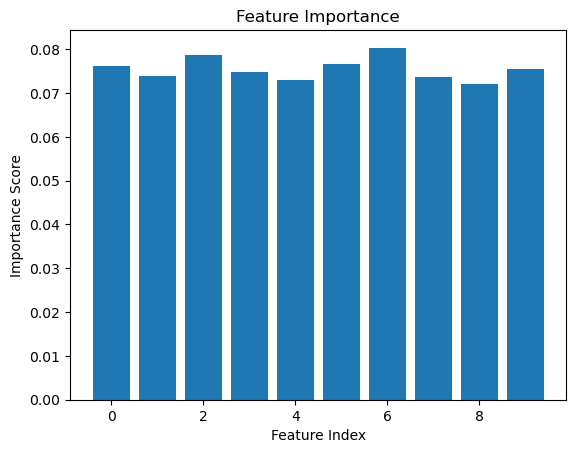

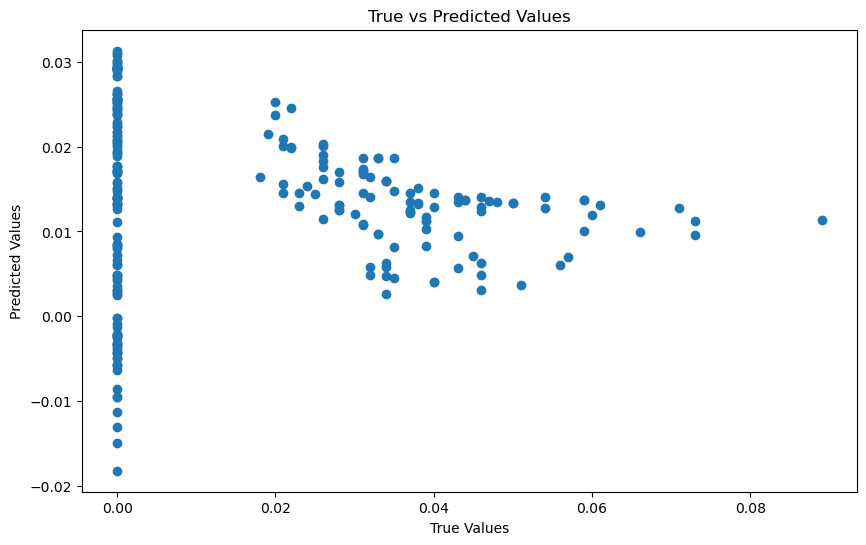

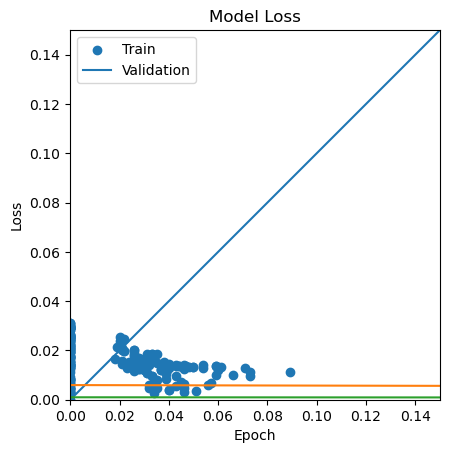

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 5s 28ms/step - loss: 0.0102 - val_loss: 0.0057 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0084 - val_loss: 0.0032 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 3s 26ms/step - loss: 0.0076 - val_loss: 0.0022 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 3s 27ms/step - loss: 0.0070 - val_loss: 0.0018 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 3s 25ms/step - loss: 0.0065 - val_loss: 0.0017 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 3s 25ms/step - loss: 0.0064 - val_loss: 0.0015 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 3s 26ms/step - loss: 0.0058 - val_loss: 0.0014 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 3s 26ms/step - loss: 0.0064 - val_loss: 0.0013 - lr: 0.0010
Epoch 9/200
118/118 [==============================] - 3s 26ms/step - loss: 0.00

Epoch 135/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0025 - val_loss: 3.0853e-04 - lr: 2.0347e-07
Epoch 136/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0027 - val_loss: 3.0853e-04 - lr: 1.8410e-07
Epoch 137/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0027 - val_loss: 3.0853e-04 - lr: 1.6659e-07
Epoch 138/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0025 - val_loss: 3.0853e-04 - lr: 1.5073e-07
Epoch 139/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0025 - val_loss: 3.0853e-04 - lr: 1.3639e-07
Epoch 140/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0027 - val_loss: 3.0853e-04 - lr: 1.2341e-07
Epoch 141/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0026 - val_loss: 3.0853e-04 - lr: 1.1167e-07
Epoch 142/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0025 - val_loss: 3.0853e-04 - lr: 1.0104e-07


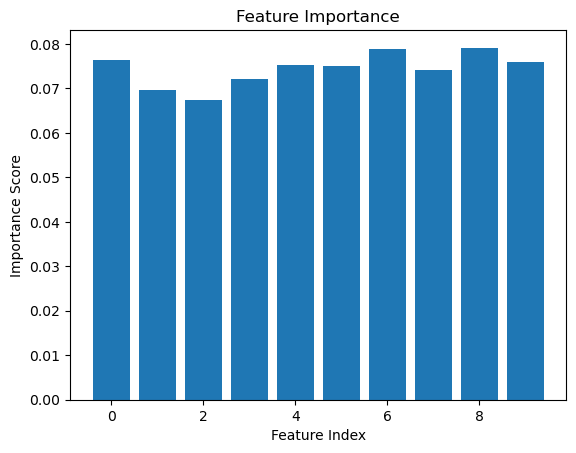

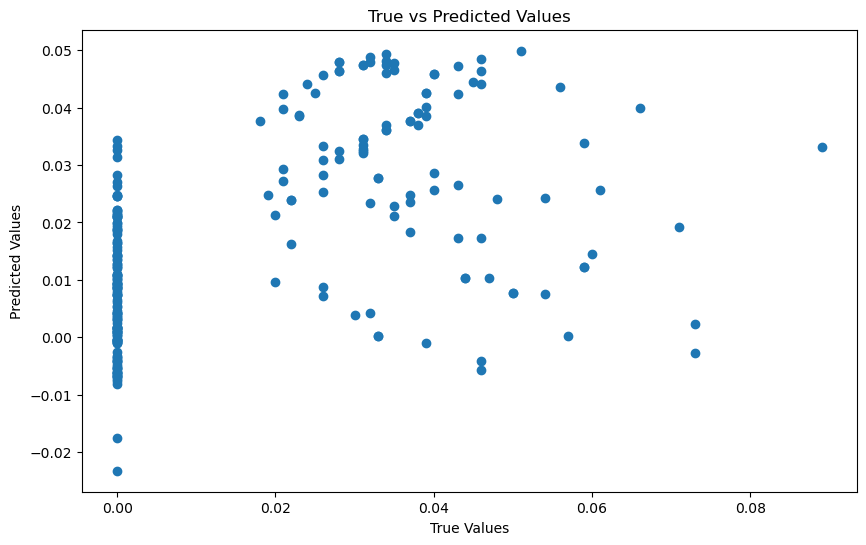

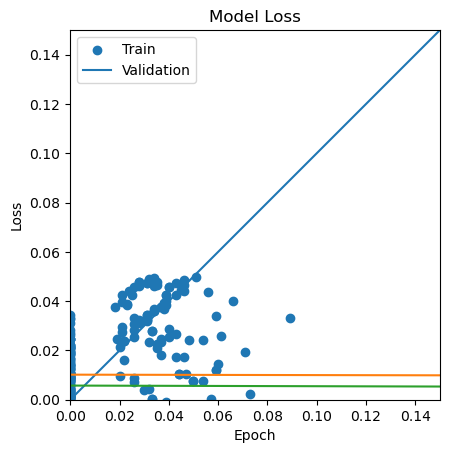

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 3s 19ms/step - loss: 0.0105 - val_loss: 0.0047 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 2s 18ms/step - loss: 0.0099 - val_loss: 0.0057 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 2s 17ms/step - loss: 0.0096 - val_loss: 0.0064 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0089 - val_loss: 0.0065 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0090 - val_loss: 0.0066 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 2s 16ms/step - loss: 0.0079 - val_loss: 0.0059 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0076 - val_loss: 0.0054 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0076 - val_loss: 0.0054 - lr: 0.0010
Epoch 9/200
118/118 [==============================] - 2s 15ms/step - loss: 0.00

118/118 [==============================] - 2s 16ms/step - loss: 0.0032 - val_loss: 0.0015 - lr: 1.2246e-04
Epoch 72/200
118/118 [==============================] - 2s 15ms/step - loss: 0.0034 - val_loss: 0.0015 - lr: 1.1080e-04
Epoch 73/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0033 - val_loss: 0.0015 - lr: 1.0026e-04
Epoch 74/200
118/118 [==============================] - 4s 37ms/step - loss: 0.0030 - val_loss: 0.0015 - lr: 9.0718e-05
Epoch 75/200
118/118 [==============================] - 2s 17ms/step - loss: 0.0033 - val_loss: 0.0015 - lr: 8.2085e-05
Epoch 76/200
118/118 [==============================] - 3s 22ms/step - loss: 0.0030 - val_loss: 0.0015 - lr: 7.4273e-05
Epoch 77/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0030 - val_loss: 0.0015 - lr: 6.7205e-05
Epoch 78/200
118/118 [==============================] - 2s 17ms/step - loss: 0.0032 - val_loss: 0.0015 - lr: 6.0810e-05
Epoch 79/200
118/118 [==============================]

118/118 [==============================] - 3s 23ms/step - loss: 0.0032 - val_loss: 0.0015 - lr: 1.3639e-07
Epoch 140/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0031 - val_loss: 0.0015 - lr: 1.2341e-07
Epoch 141/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0032 - val_loss: 0.0015 - lr: 1.1167e-07
Epoch 142/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0032 - val_loss: 0.0015 - lr: 1.0104e-07
Epoch 143/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0029 - val_loss: 0.0015 - lr: 9.1424e-08
Epoch 144/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0029 - val_loss: 0.0015 - lr: 8.2724e-08
Epoch 145/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0032 - val_loss: 0.0015 - lr: 7.4851e-08
Epoch 146/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0032 - val_loss: 0.0015 - lr: 6.7728e-08
Epoch 147/200
118/118 [=======================

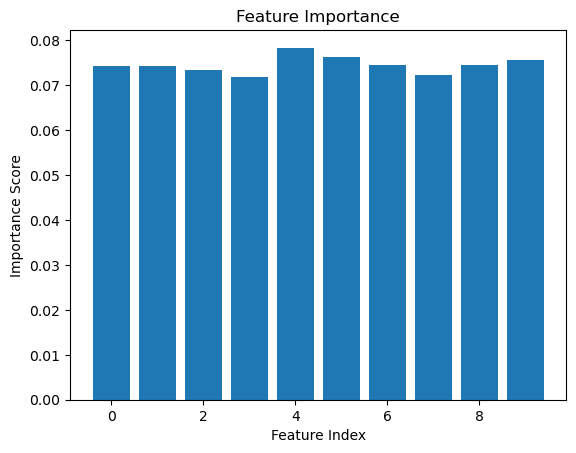

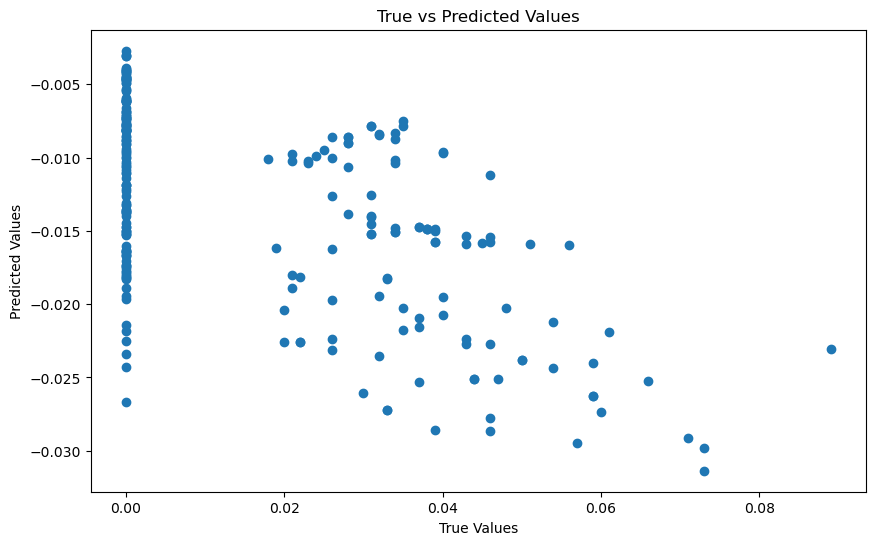

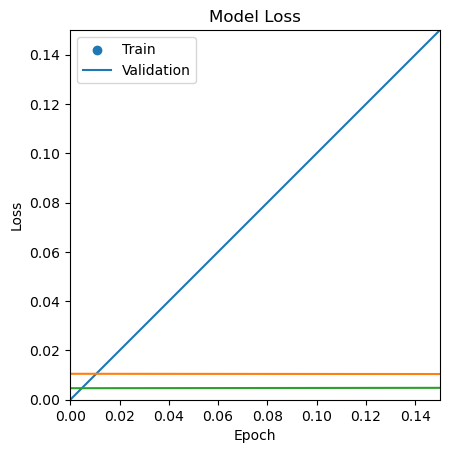

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 30ms/step - loss: 0.0047 - val_loss: 0.0134 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 1s 22ms/step - loss: 0.0033 - val_loss: 0.0105 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 1s 23ms/step - loss: 0.0026 - val_loss: 0.0086 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 1s 22ms/step - loss: 0.0022 - val_loss: 0.0075 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 1s 22ms/step - loss: 0.0020 - val_loss: 0.0067 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 1s 22ms/step - loss: 0.0019 - val_loss: 0.0061 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 1s 23ms/step - loss: 0.0018 - val_loss: 0.0057 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 1s 23ms/step - loss: 0.0018 - val_loss: 0.0054 - lr: 0.0010
Epoch 9/200
59/59 [==============================] - 1s 23ms/step - loss: 0.0017 - val_loss: 0.0

59/59 [==============================] - 1s 22ms/step - loss: 7.8008e-04 - val_loss: 0.0026 - lr: 1.2246e-04
Epoch 72/200
59/59 [==============================] - 1s 23ms/step - loss: 7.7930e-04 - val_loss: 0.0026 - lr: 1.1080e-04
Epoch 73/200
59/59 [==============================] - 1s 22ms/step - loss: 7.7860e-04 - val_loss: 0.0026 - lr: 1.0026e-04
Epoch 74/200
59/59 [==============================] - 1s 22ms/step - loss: 7.7797e-04 - val_loss: 0.0026 - lr: 9.0718e-05
Epoch 75/200
59/59 [==============================] - 1s 24ms/step - loss: 7.7740e-04 - val_loss: 0.0026 - lr: 8.2085e-05
Epoch 76/200
59/59 [==============================] - 1s 23ms/step - loss: 7.7689e-04 - val_loss: 0.0026 - lr: 7.4273e-05
Epoch 77/200
59/59 [==============================] - 1s 22ms/step - loss: 7.7643e-04 - val_loss: 0.0026 - lr: 6.7205e-05
Epoch 78/200
59/59 [==============================] - 1s 24ms/step - loss: 7.7602e-04 - val_loss: 0.0026 - lr: 6.0810e-05
Epoch 79/200
59/59 [=================

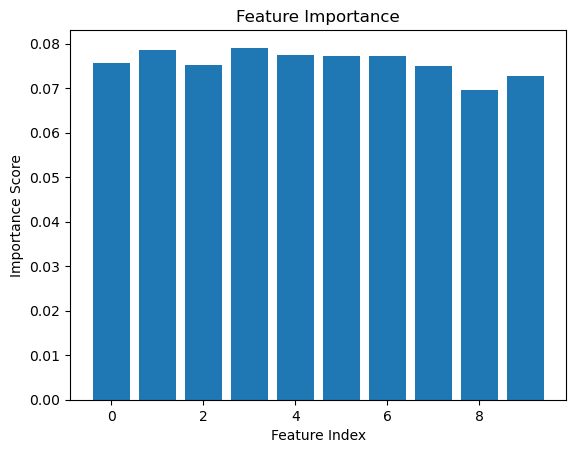

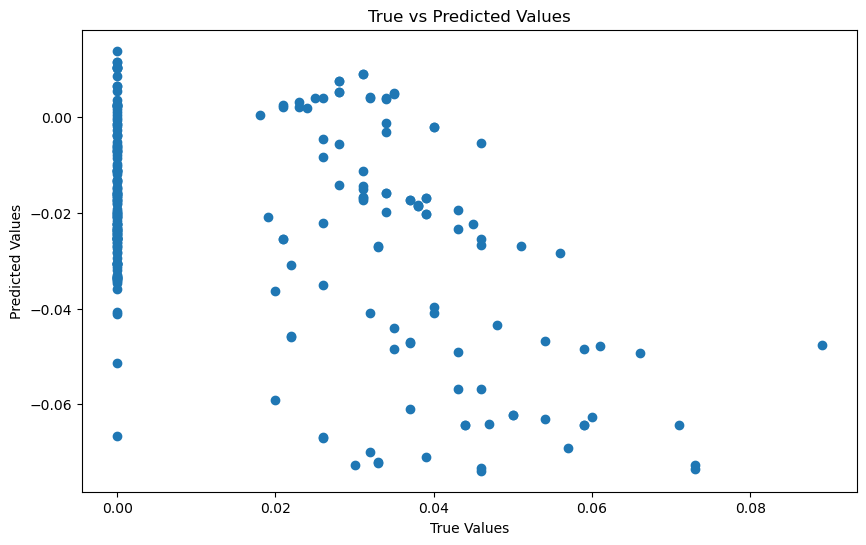

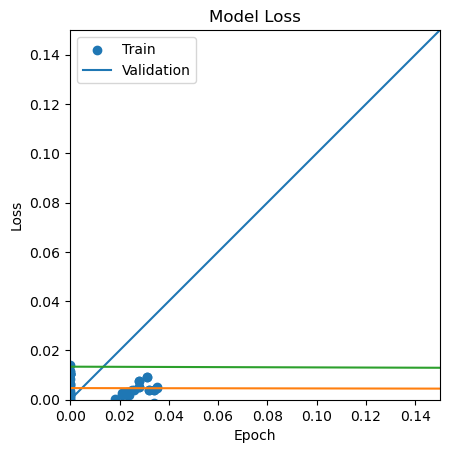

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 34ms/step - loss: 0.0056 - val_loss: 0.0026 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0048 - val_loss: 0.0019 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0045 - val_loss: 0.0016 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0037 - val_loss: 0.0014 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0036 - val_loss: 0.0013 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0036 - val_loss: 0.0013 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0033 - val_loss: 0.0013 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0036 - val_loss: 0.0013 - lr: 0.0010
Epoch 9/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0032 - val_loss: 0.0

Epoch 71/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0022 - val_loss: 6.7534e-04 - lr: 1.2246e-04
Epoch 72/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0024 - val_loss: 6.7466e-04 - lr: 1.1080e-04
Epoch 73/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0024 - val_loss: 6.7377e-04 - lr: 1.0026e-04
Epoch 74/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0021 - val_loss: 6.7340e-04 - lr: 9.0718e-05
Epoch 75/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0022 - val_loss: 6.7298e-04 - lr: 8.2085e-05
Epoch 76/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0023 - val_loss: 6.7255e-04 - lr: 7.4273e-05
Epoch 77/200
59/59 [==============================] - 2s 25ms/step - loss: 0.0022 - val_loss: 6.7181e-04 - lr: 6.7205e-05
Epoch 78/200
59/59 [==============================] - 1s 23ms/step - loss: 0.0023 - val_loss: 6.7120e-04 - lr: 6.0810e-05
Epoch 79/200
59/59 [====

Epoch 138/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0024 - val_loss: 6.6845e-04 - lr: 1.5073e-07
Epoch 139/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0022 - val_loss: 6.6845e-04 - lr: 1.3639e-07
Epoch 140/200
59/59 [==============================] - 2s 25ms/step - loss: 0.0021 - val_loss: 6.6845e-04 - lr: 1.2341e-07
Epoch 141/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0023 - val_loss: 6.6845e-04 - lr: 1.1167e-07
Epoch 142/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0021 - val_loss: 6.6845e-04 - lr: 1.0104e-07
Epoch 143/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0022 - val_loss: 6.6845e-04 - lr: 9.1424e-08
Epoch 144/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0022 - val_loss: 6.6845e-04 - lr: 8.2724e-08
Epoch 145/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0022 - val_loss: 6.6845e-04 - lr: 7.4851e-08
Epoch 146/200
59

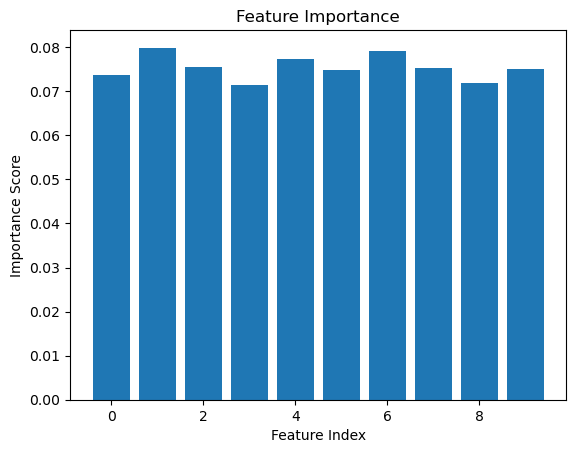

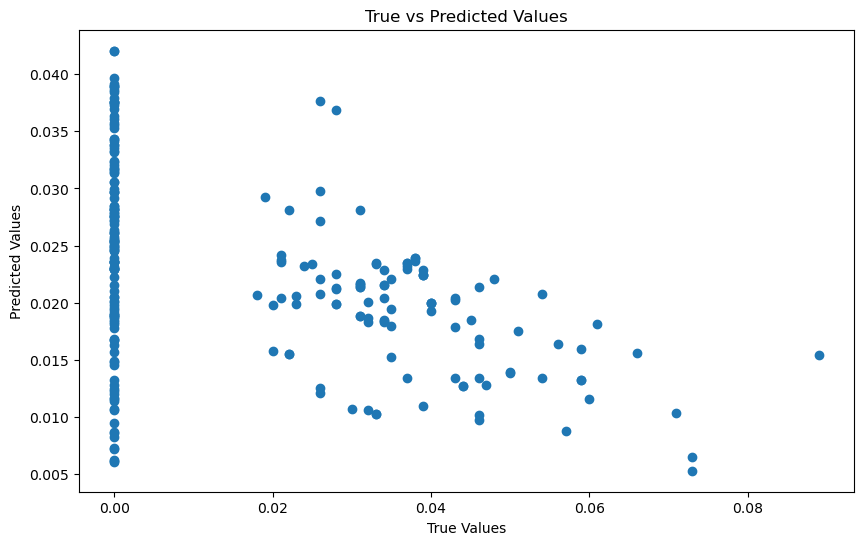

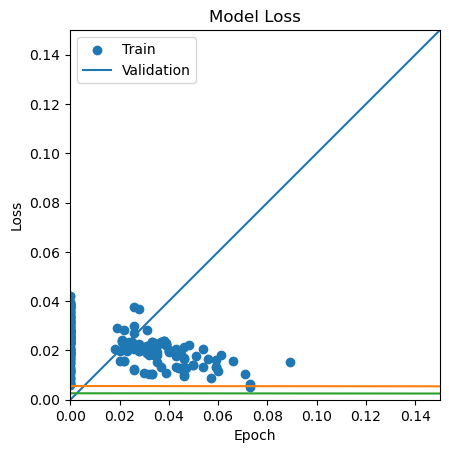

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 2s 19ms/step - loss: 0.0116 - val_loss: 8.2977e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 1s 16ms/step - loss: 0.0091 - val_loss: 3.4641e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0065 - val_loss: 2.0458e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 1s 13ms/step - loss: 0.0061 - val_loss: 2.1485e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 1s 15ms/step - loss: 0.0048 - val_loss: 2.8509e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 1s 17ms/step - loss: 0.0052 - val_loss: 3.8571e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 1s 13ms/step - loss: 0.0054 - val_loss: 4.8884e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 1s 14ms/step - loss: 0.0047 - val_loss: 5.7471e-04 - lr: 0.0010
Epoch 9/200
59/59 [==============================] - 1s 23ms/ste

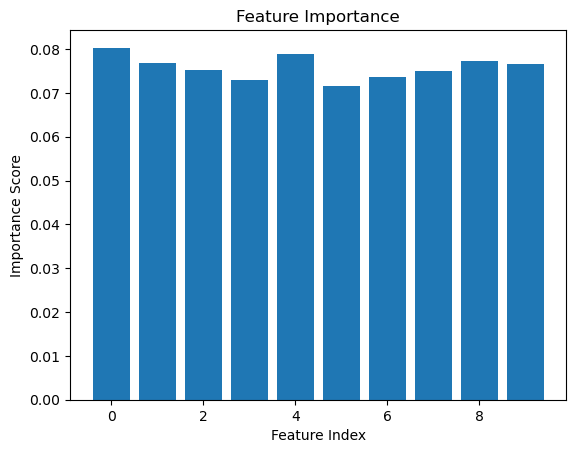

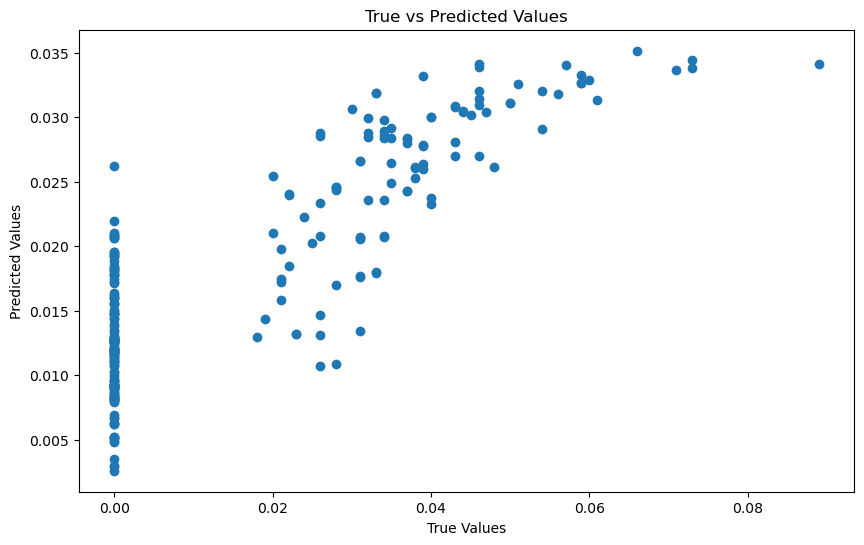

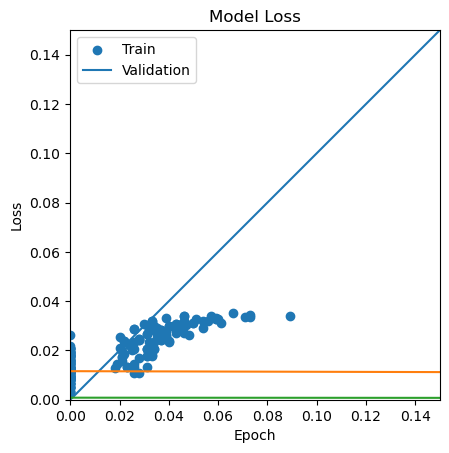

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 37ms/step - loss: 0.0059 - val_loss: 8.4860e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 2s 42ms/step - loss: 0.0062 - val_loss: 8.4648e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 3s 47ms/step - loss: 0.0059 - val_loss: 8.5880e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 4s 61ms/step - loss: 0.0056 - val_loss: 8.6591e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 2s 41ms/step - loss: 0.0062 - val_loss: 8.6890e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0061 - val_loss: 8.7658e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0058 - val_loss: 8.6319e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0059 - val_loss: 8.7811e-04 - lr: 0.0010
Epoch 9/200
59/59 [==============================] - 1s 23ms/ste

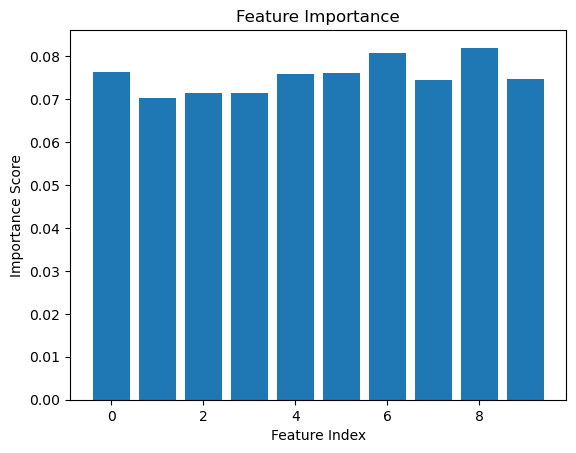

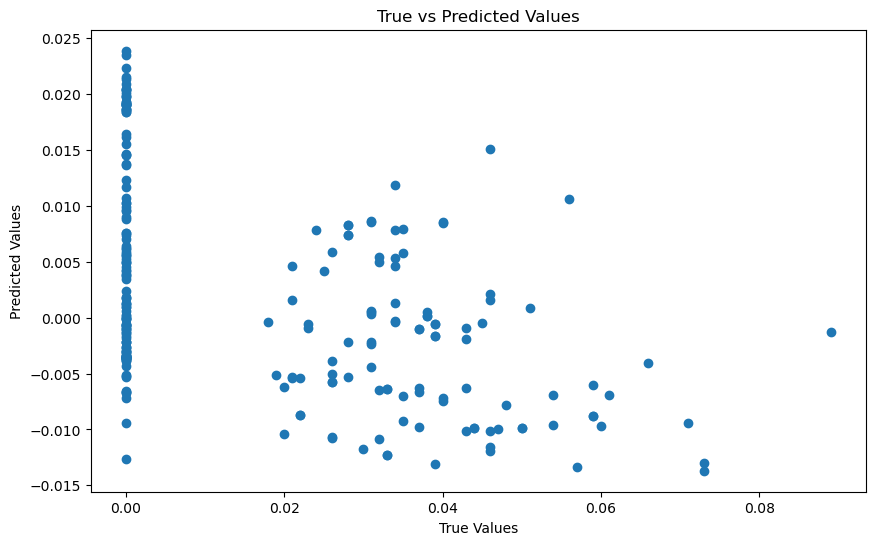

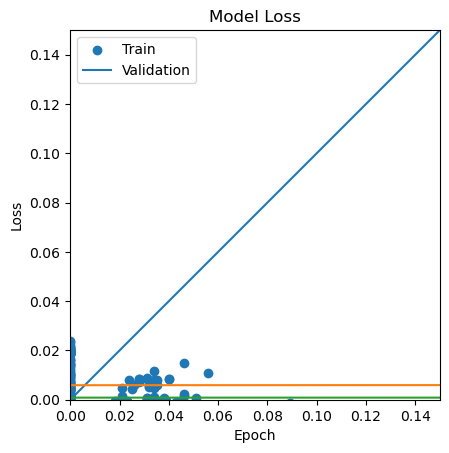

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 56ms/step - loss: 0.0036 - val_loss: 0.0010 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 23ms/step - loss: 0.0033 - val_loss: 8.6448e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0031 - val_loss: 7.3592e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 23ms/step - loss: 0.0030 - val_loss: 6.3917e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0028 - val_loss: 5.6772e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 21ms/step - loss: 0.0027 - val_loss: 5.1386e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 22ms/step - loss: 0.0026 - val_loss: 4.7211e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0025 - val_loss: 4.4057e-04 - lr: 0.0010
Epoch 9/200
30/30 [==============================] - 1s 23ms/step - 

Epoch 70/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0012 - val_loss: 2.7656e-04 - lr: 1.3534e-04
Epoch 71/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0012 - val_loss: 2.7659e-04 - lr: 1.2246e-04
Epoch 72/200
30/30 [==============================] - 1s 23ms/step - loss: 0.0012 - val_loss: 2.7656e-04 - lr: 1.1080e-04
Epoch 73/200
59/59 [==============================] - 1s 9ms/step


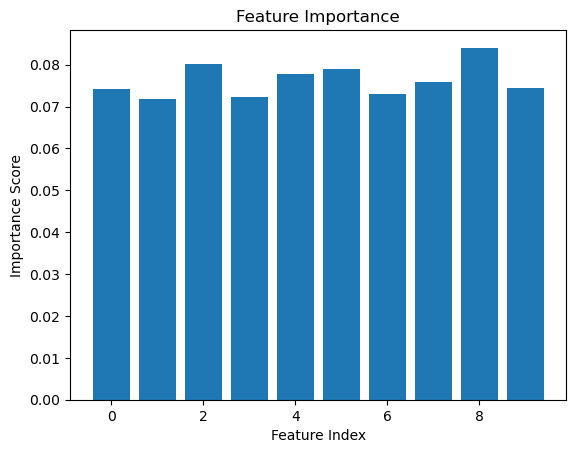

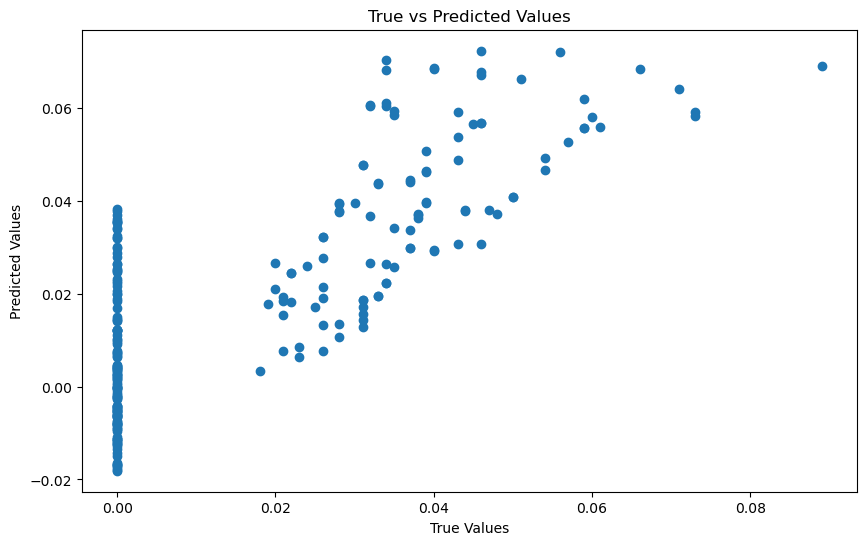

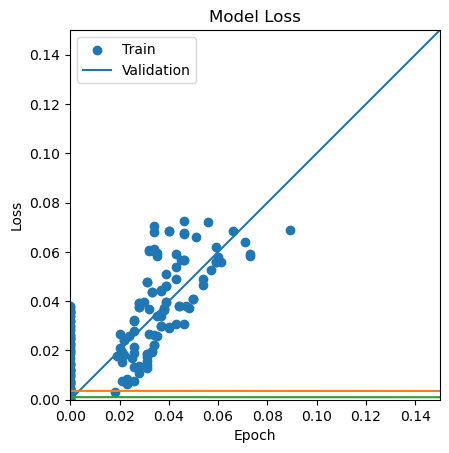

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 44ms/step - loss: 0.0064 - val_loss: 0.0080 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0056 - val_loss: 0.0067 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0054 - val_loss: 0.0056 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0051 - val_loss: 0.0047 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0043 - val_loss: 0.0041 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0045 - val_loss: 0.0036 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0037 - val_loss: 0.0032 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0039 - val_loss: 0.0030 - lr: 0.0010
Epoch 9/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0040 - val_loss: 0.0

Epoch 72/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0028 - val_loss: 9.6192e-04 - lr: 1.1080e-04
Epoch 73/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0027 - val_loss: 9.6060e-04 - lr: 1.0026e-04
Epoch 74/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0028 - val_loss: 9.6012e-04 - lr: 9.0718e-05
Epoch 75/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0029 - val_loss: 9.5817e-04 - lr: 8.2085e-05
Epoch 76/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0028 - val_loss: 9.5758e-04 - lr: 7.4273e-05
Epoch 77/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0028 - val_loss: 9.5601e-04 - lr: 6.7205e-05
Epoch 78/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0030 - val_loss: 9.5539e-04 - lr: 6.0810e-05
Epoch 79/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0028 - val_loss: 9.5495e-04 - lr: 5.5023e-05
Epoch 80/200
30/30 [====

Epoch 139/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0028 - val_loss: 9.4834e-04 - lr: 1.3639e-07
Epoch 140/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0027 - val_loss: 9.4834e-04 - lr: 1.2341e-07
Epoch 141/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0029 - val_loss: 9.4834e-04 - lr: 1.1167e-07
Epoch 142/200
30/30 [==============================] - 1s 30ms/step - loss: 0.0031 - val_loss: 9.4834e-04 - lr: 1.0104e-07
Epoch 143/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0029 - val_loss: 9.4834e-04 - lr: 9.1424e-08
Epoch 144/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0030 - val_loss: 9.4834e-04 - lr: 8.2724e-08
Epoch 145/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0028 - val_loss: 9.4834e-04 - lr: 7.4851e-08
Epoch 146/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0030 - val_loss: 9.4834e-04 - lr: 6.7728e-08
Epoch 147/200
30

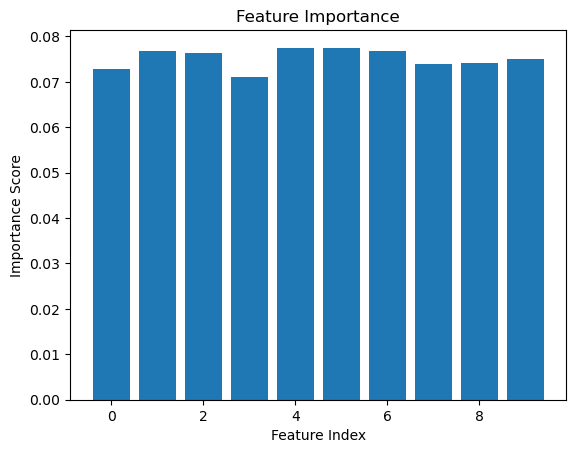

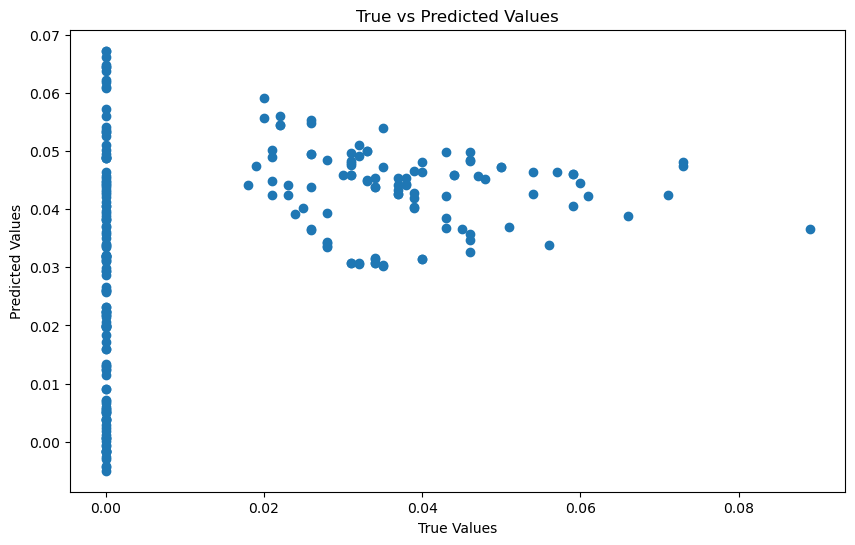

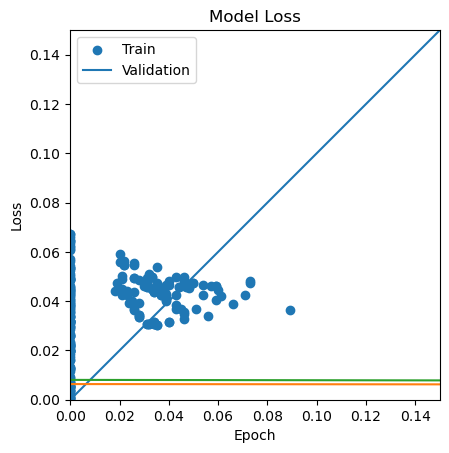

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 53ms/step - loss: 0.0055 - val_loss: 2.7476e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 38ms/step - loss: 0.0053 - val_loss: 1.9778e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 2s 61ms/step - loss: 0.0049 - val_loss: 1.7180e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0048 - val_loss: 1.7862e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 43ms/step - loss: 0.0046 - val_loss: 2.0476e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 41ms/step - loss: 0.0048 - val_loss: 2.4828e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 49ms/step - loss: 0.0044 - val_loss: 3.0673e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 2s 68ms/step - loss: 0.0043 - val_loss: 3.6536e-04 - lr: 0.0010
Epoch 9/200
30/30 [==============================] - 1s 33ms/ste

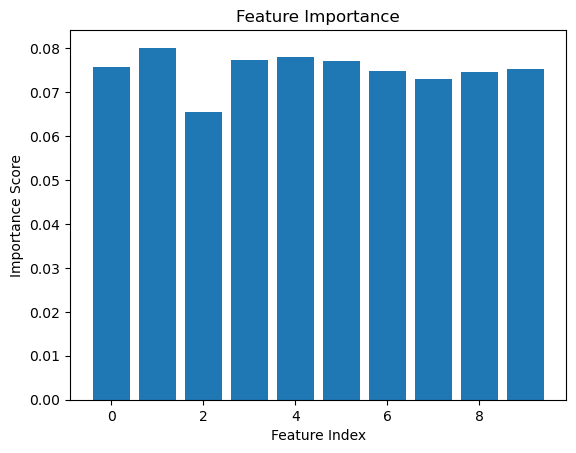

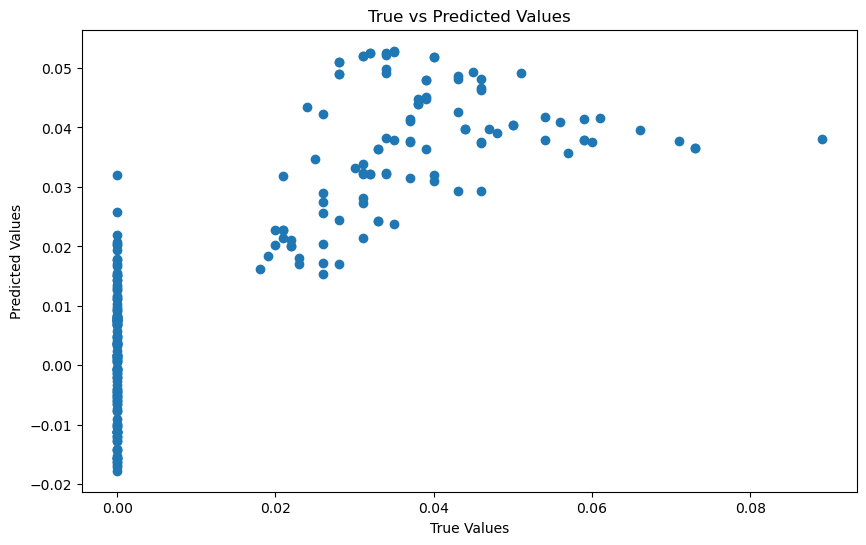

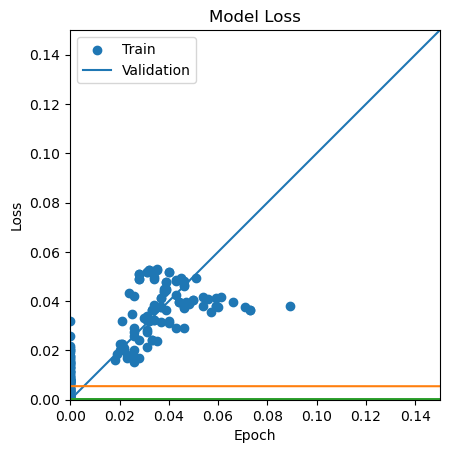

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 44ms/step - loss: 0.0129 - val_loss: 0.0134 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0131 - val_loss: 0.0132 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0121 - val_loss: 0.0131 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0118 - val_loss: 0.0128 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0124 - val_loss: 0.0127 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0117 - val_loss: 0.0126 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0122 - val_loss: 0.0123 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0119 - val_loss: 0.0122 - lr: 0.0010
Epoch 9/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0108 - val_loss: 0.0

30/30 [==============================] - 1s 24ms/step - loss: 0.0074 - val_loss: 0.0084 - lr: 1.1167e-07
Epoch 142/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0072 - val_loss: 0.0084 - lr: 1.0104e-07
Epoch 143/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0073 - val_loss: 0.0084 - lr: 9.1424e-08
Epoch 144/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0068 - val_loss: 0.0084 - lr: 8.2724e-08
Epoch 145/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0069 - val_loss: 0.0084 - lr: 7.4851e-08
Epoch 146/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0074 - val_loss: 0.0084 - lr: 6.7728e-08
Epoch 147/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0068 - val_loss: 0.0084 - lr: 6.1283e-08
Epoch 148/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0071 - val_loss: 0.0084 - lr: 5.5451e-08
Epoch 149/200
30/30 [==============================] - 1s 27ms

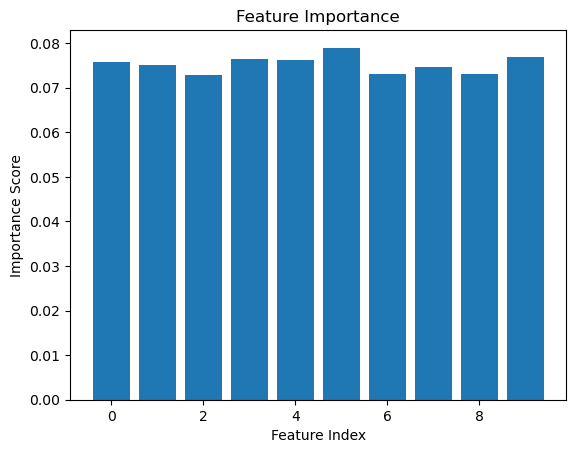

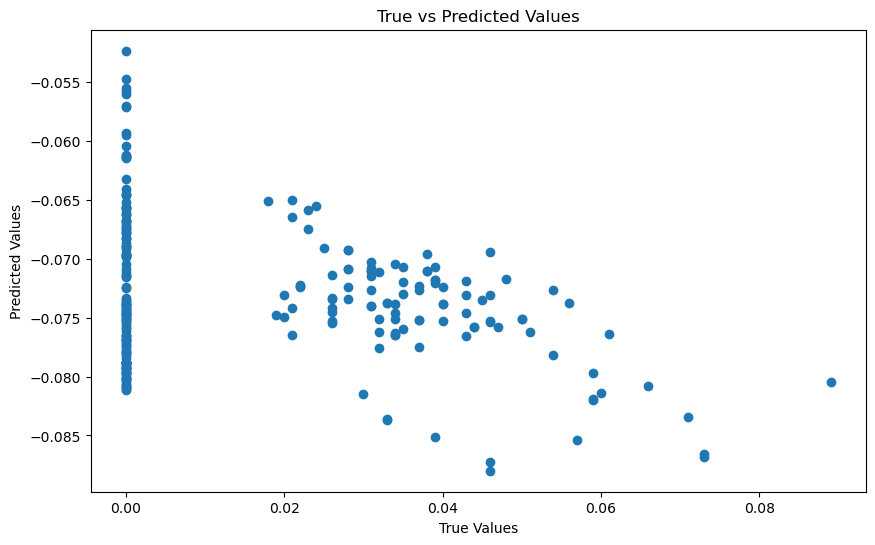

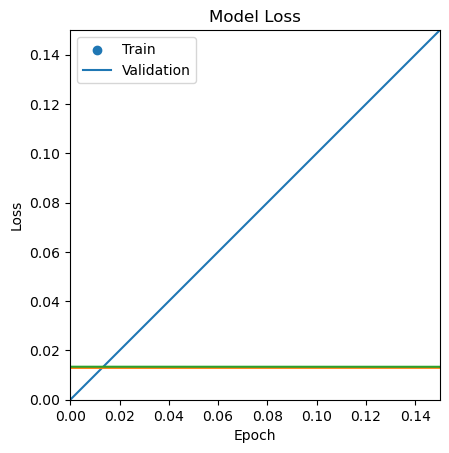

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 4s 25ms/step - loss: 0.0012 - val_loss: 7.8967e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 3s 22ms/step - loss: 7.7418e-04 - val_loss: 0.0010 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 3s 22ms/step - loss: 6.3184e-04 - val_loss: 0.0011 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 3s 22ms/step - loss: 5.5026e-04 - val_loss: 0.0012 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 3s 22ms/step - loss: 5.0152e-04 - val_loss: 0.0013 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 3s 21ms/step - loss: 4.7017e-04 - val_loss: 0.0014 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 3s 22ms/step - loss: 4.4849e-04 - val_loss: 0.0014 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 3s 21ms/step - loss: 4.3257e-04 - val_loss: 0.0014 - lr: 0.0100
Epoch 9/200
118/118 [===========================

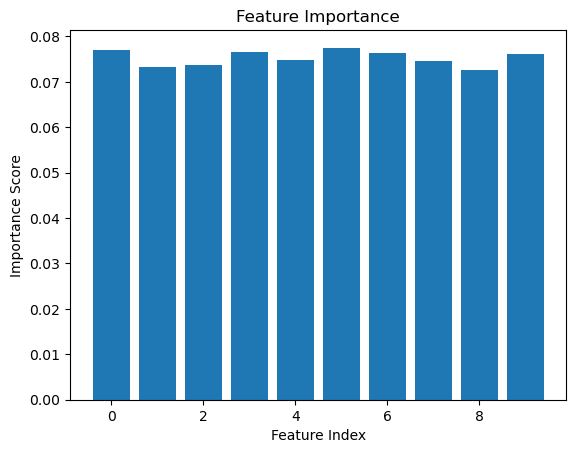

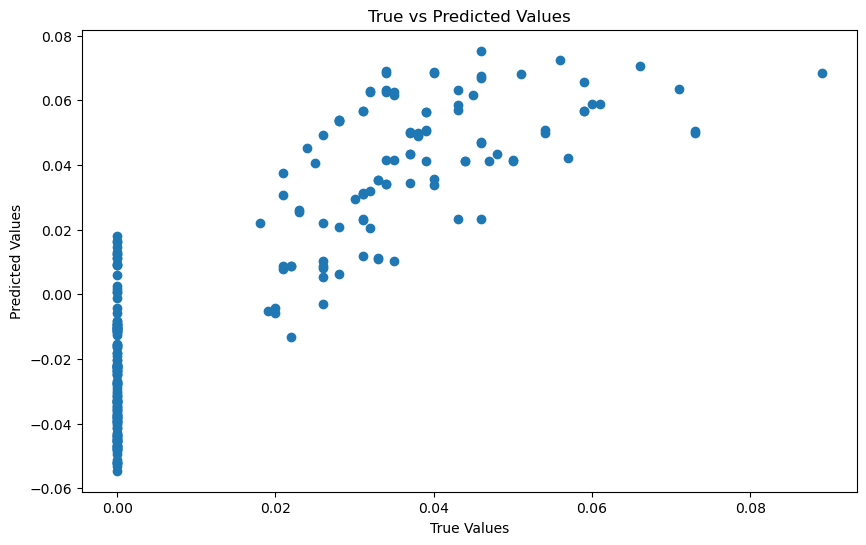

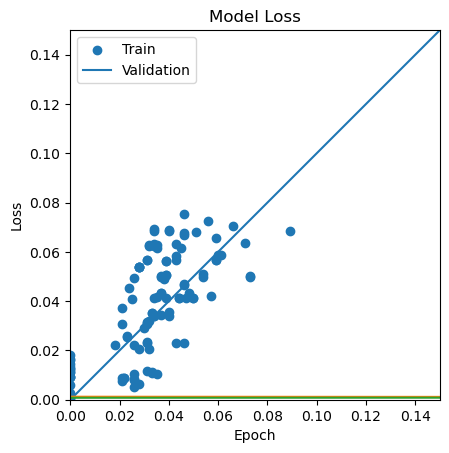

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 5s 28ms/step - loss: 0.0034 - val_loss: 7.2661e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0028 - val_loss: 5.6932e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0024 - val_loss: 7.8593e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0022 - val_loss: 8.2146e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0020 - val_loss: 7.2422e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0019 - val_loss: 6.9701e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0017 - val_loss: 6.4815e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0017 - val_loss: 6.6271e-04 - lr: 0.0100
Epoch 9/200
118/118 [===========================

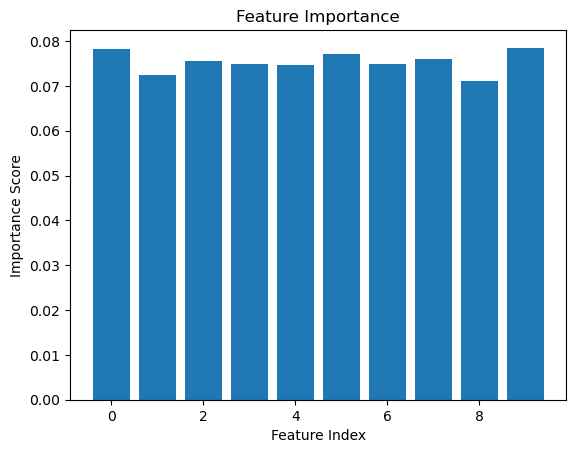

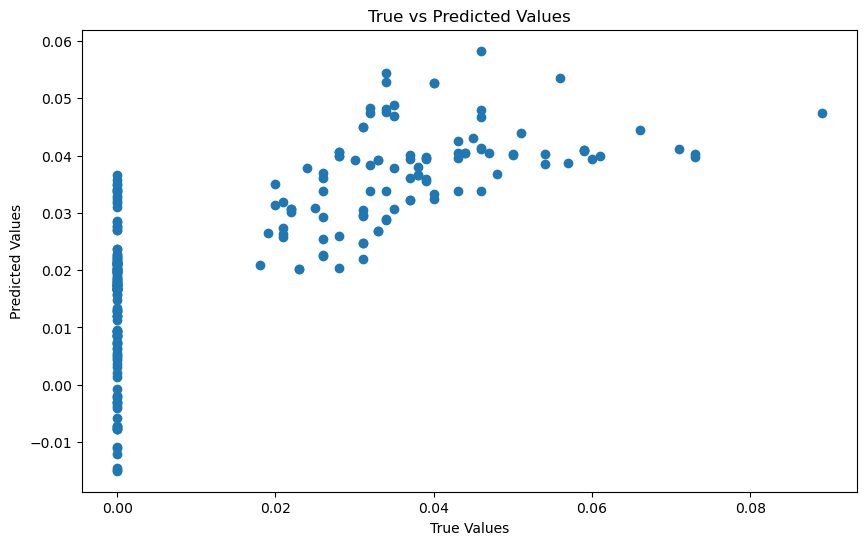

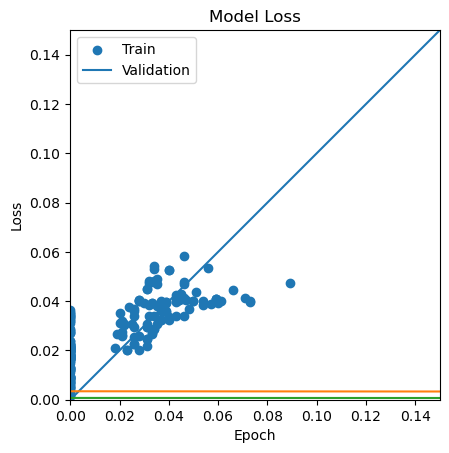

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 5s 28ms/step - loss: 0.0075 - val_loss: 0.0035 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0040 - val_loss: 0.0020 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0034 - val_loss: 0.0013 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0029 - val_loss: 0.0010 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 3s 25ms/step - loss: 0.0025 - val_loss: 7.9586e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0023 - val_loss: 5.0638e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0023 - val_loss: 3.5633e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0021 - val_loss: 3.0918e-04 - lr: 0.0100
Epoch 9/200
118/118 [==============================] - 3s 24ms/s

Epoch 69/200
118/118 [==============================] - 3s 23ms/step - loss: 8.8583e-04 - val_loss: 1.5963e-04 - lr: 0.0015
Epoch 70/200
118/118 [==============================] - 3s 24ms/step - loss: 9.1466e-04 - val_loss: 1.5947e-04 - lr: 0.0014
Epoch 71/200
118/118 [==============================] - 3s 24ms/step - loss: 9.5884e-04 - val_loss: 1.5937e-04 - lr: 0.0012
Epoch 72/200
118/118 [==============================] - 3s 23ms/step - loss: 9.5603e-04 - val_loss: 1.5918e-04 - lr: 0.0011
Epoch 73/200
118/118 [==============================] - 3s 24ms/step - loss: 8.9505e-04 - val_loss: 1.5900e-04 - lr: 0.0010
Epoch 74/200
118/118 [==============================] - 3s 23ms/step - loss: 9.2422e-04 - val_loss: 1.5961e-04 - lr: 9.0718e-04
Epoch 75/200
118/118 [==============================] - 3s 23ms/step - loss: 9.1929e-04 - val_loss: 1.5952e-04 - lr: 8.2085e-04
Epoch 76/200
118/118 [==============================] - 3s 23ms/step - loss: 9.0294e-04 - val_loss: 1.5947e-04 - lr: 7.4273e

Epoch 133/200
118/118 [==============================] - 3s 25ms/step - loss: 9.2040e-04 - val_loss: 1.5808e-04 - lr: 2.4852e-06
Epoch 134/200
118/118 [==============================] - 3s 26ms/step - loss: 8.7004e-04 - val_loss: 1.5808e-04 - lr: 2.2487e-06
Epoch 135/200
118/118 [==============================] - 3s 24ms/step - loss: 9.4329e-04 - val_loss: 1.5808e-04 - lr: 2.0347e-06
Epoch 136/200
118/118 [==============================] - 3s 24ms/step - loss: 9.7290e-04 - val_loss: 1.5808e-04 - lr: 1.8410e-06
Epoch 137/200
118/118 [==============================] - 3s 23ms/step - loss: 8.9977e-04 - val_loss: 1.5808e-04 - lr: 1.6659e-06
Epoch 138/200
118/118 [==============================] - 3s 26ms/step - loss: 9.5509e-04 - val_loss: 1.5808e-04 - lr: 1.5073e-06
Epoch 139/200
118/118 [==============================] - 3s 24ms/step - loss: 9.6520e-04 - val_loss: 1.5808e-04 - lr: 1.3639e-06
Epoch 140/200
118/118 [==============================] - 3s 23ms/step - loss: 9.2134e-04 - val_lo

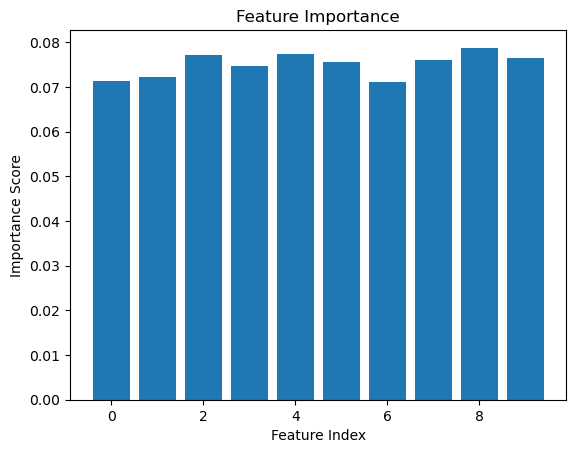

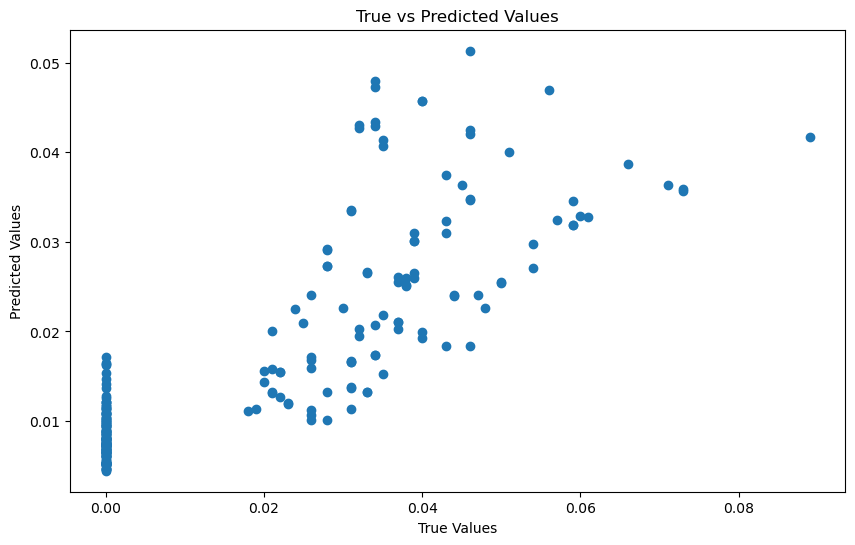

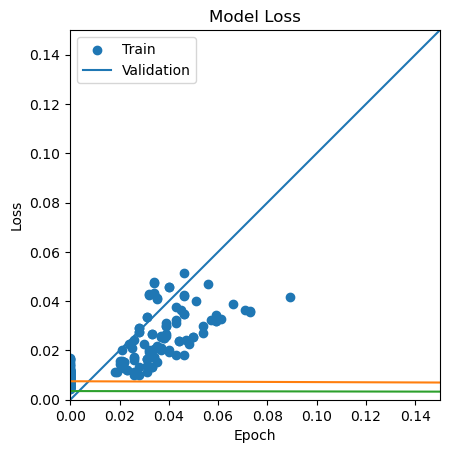

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 5s 27ms/step - loss: 0.0112 - val_loss: 0.0068 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0074 - val_loss: 0.0044 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0059 - val_loss: 0.0027 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 3s 25ms/step - loss: 0.0049 - val_loss: 0.0018 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0040 - val_loss: 0.0013 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 3s 29ms/step - loss: 0.0036 - val_loss: 9.4194e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 3s 25ms/step - loss: 0.0038 - val_loss: 8.6380e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0032 - val_loss: 6.4122e-04 - lr: 0.0100
Epoch 9/200
118/118 [==============================] - 3s 24ms/step 

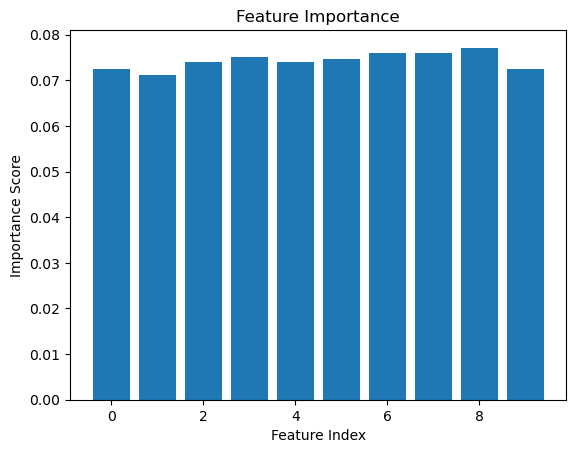

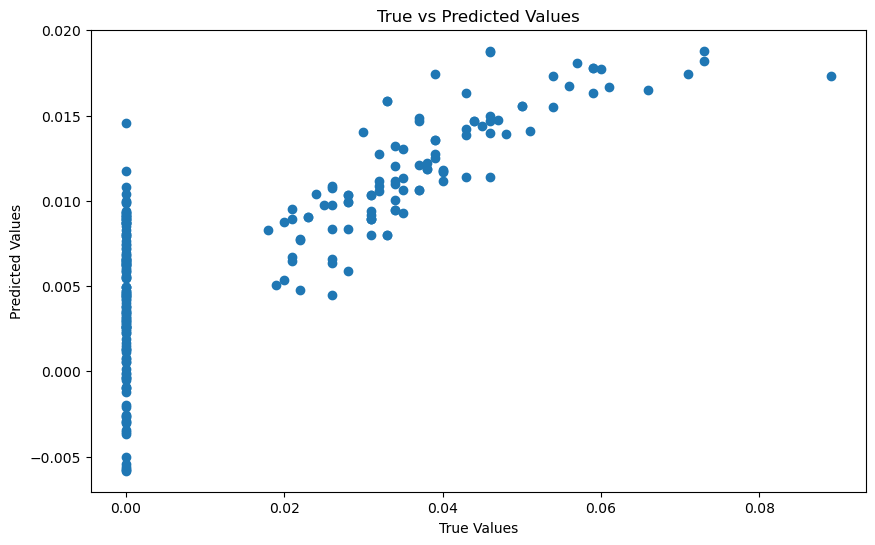

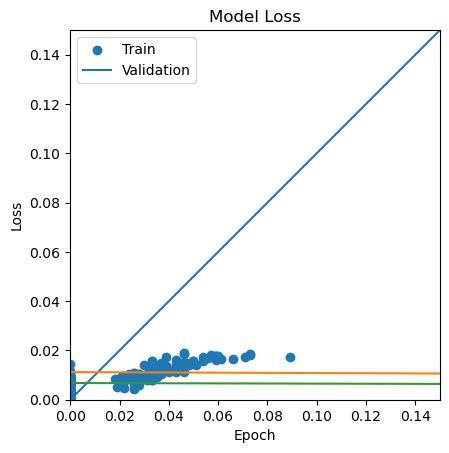

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 33ms/step - loss: 0.0012 - val_loss: 5.2932e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 1s 23ms/step - loss: 9.1026e-04 - val_loss: 5.1885e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 1s 22ms/step - loss: 7.6599e-04 - val_loss: 6.1208e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 1s 22ms/step - loss: 6.7456e-04 - val_loss: 5.9654e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 1s 22ms/step - loss: 6.1103e-04 - val_loss: 5.6788e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 1s 22ms/step - loss: 5.6857e-04 - val_loss: 6.1777e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 1s 23ms/step - loss: 5.3654e-04 - val_loss: 5.8312e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 1s 22ms/step - loss: 5.1051e-04 - val_loss: 6.1240e-04 - lr: 0.0100
Epoch 9/200
59/59 [=================

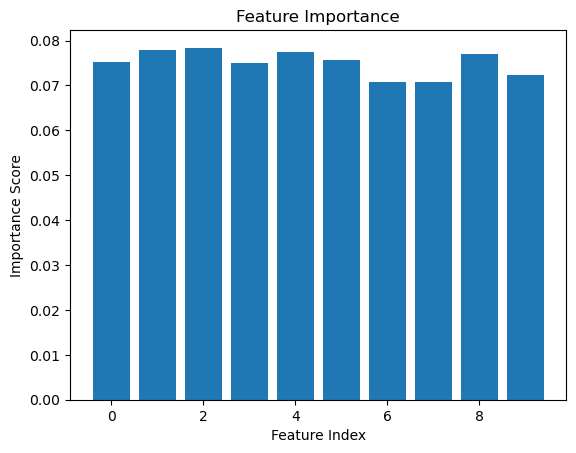

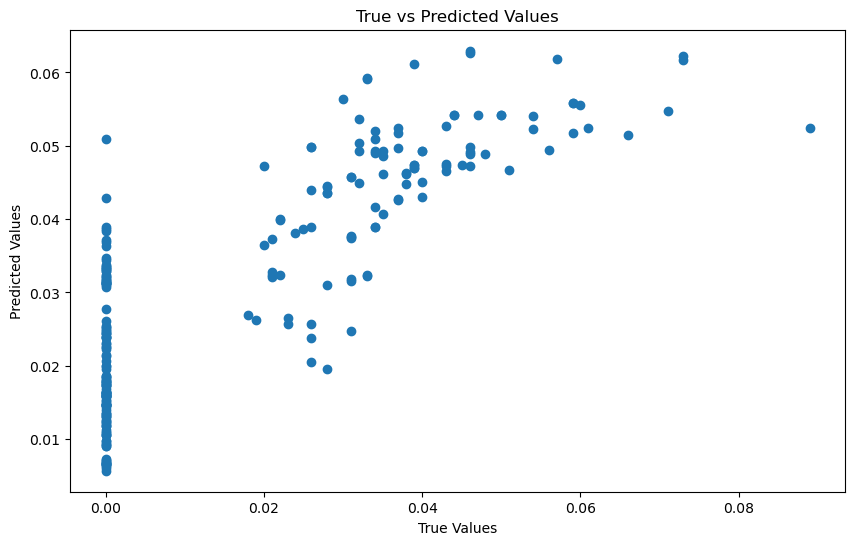

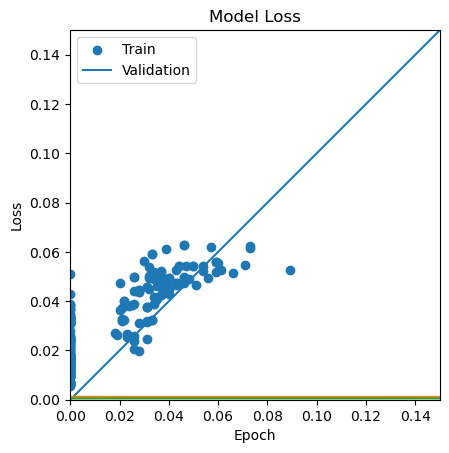

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 32ms/step - loss: 0.0045 - val_loss: 3.9677e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0042 - val_loss: 3.8958e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 2s 25ms/step - loss: 0.0036 - val_loss: 3.6549e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0033 - val_loss: 3.5833e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0030 - val_loss: 3.5678e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0029 - val_loss: 3.8967e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0029 - val_loss: 3.8996e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0026 - val_loss: 3.9722e-04 - lr: 0.0100
Epoch 9/200
59/59 [==============================] - 1s 24ms/ste

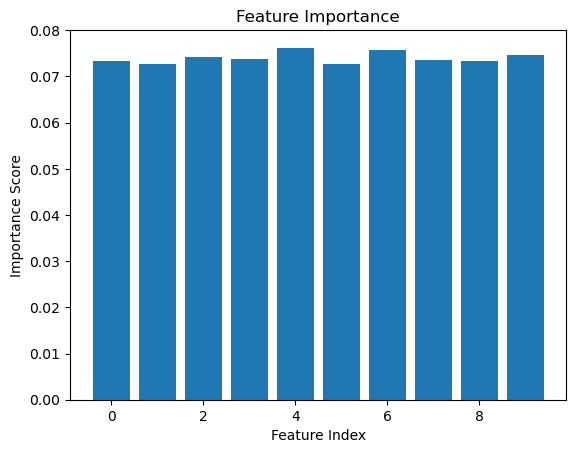

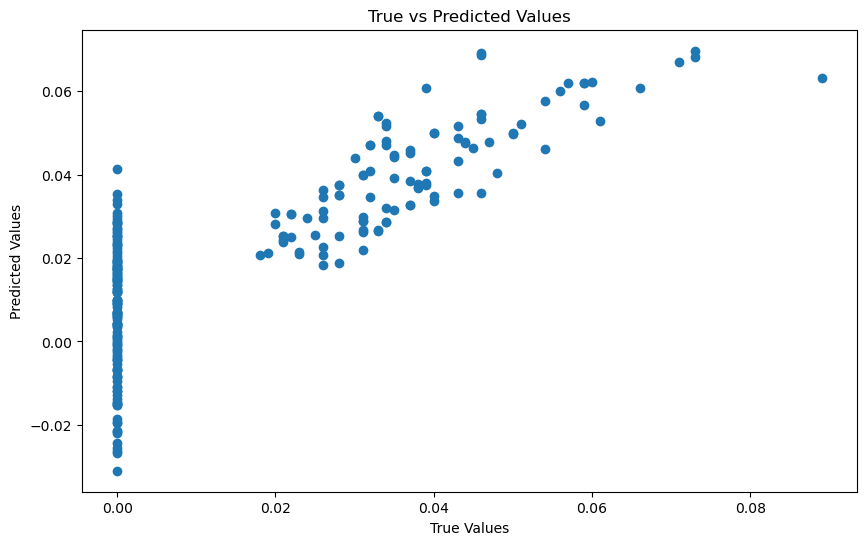

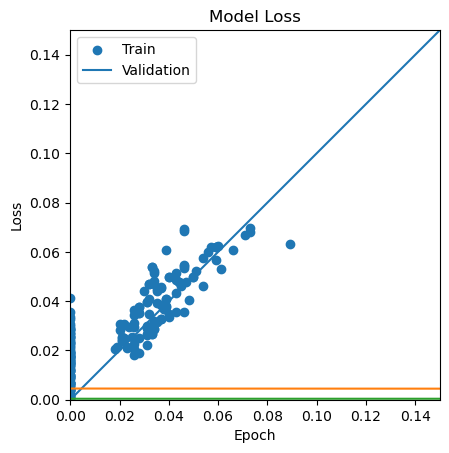

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 34ms/step - loss: 0.0115 - val_loss: 0.0022 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0066 - val_loss: 0.0020 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0058 - val_loss: 0.0018 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0044 - val_loss: 0.0015 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0046 - val_loss: 0.0015 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0042 - val_loss: 0.0015 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0038 - val_loss: 0.0012 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0034 - val_loss: 0.0012 - lr: 0.0100
Epoch 9/200
59/59 [==============================] - 1s 23ms/step - loss: 0.0033 - val_loss: 0.0

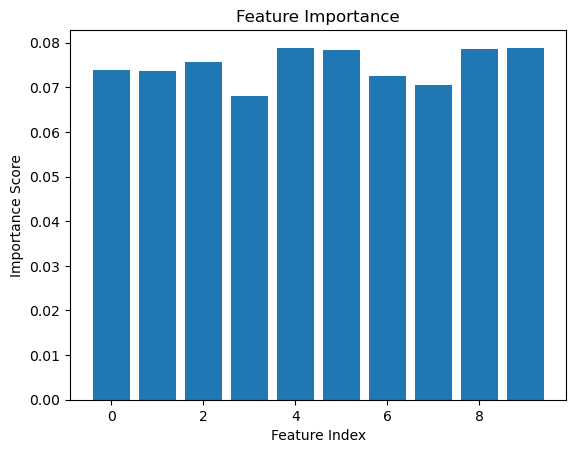

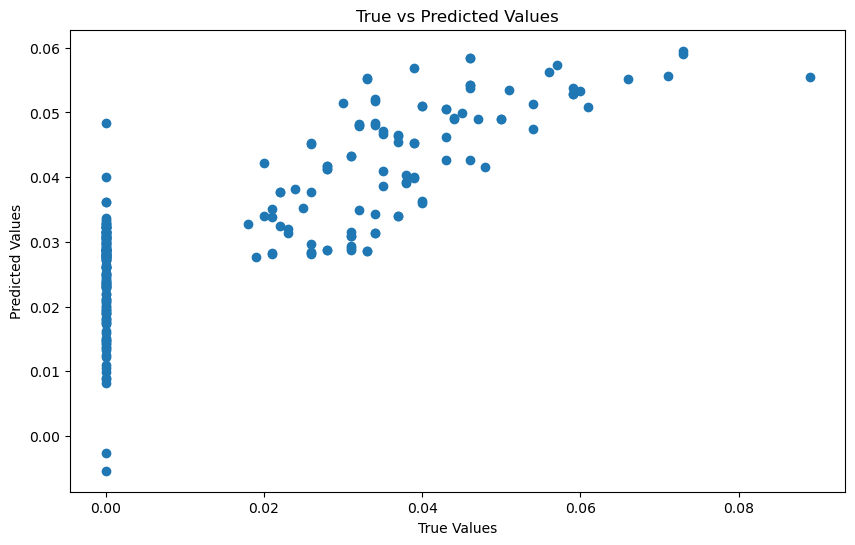

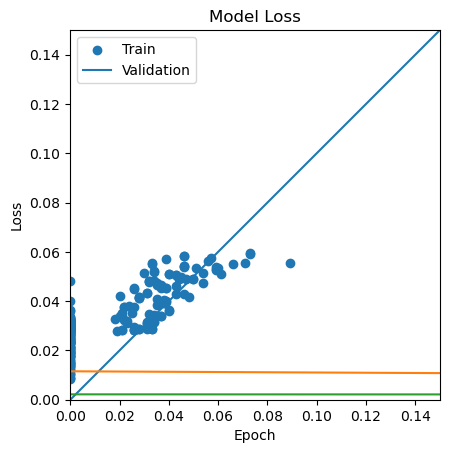

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 32ms/step - loss: 0.0077 - val_loss: 3.1224e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0055 - val_loss: 2.7106e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0057 - val_loss: 3.1877e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0052 - val_loss: 2.5165e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0044 - val_loss: 2.5243e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0042 - val_loss: 3.1750e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 1s 21ms/step - loss: 0.0042 - val_loss: 2.7476e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 1s 21ms/step - loss: 0.0037 - val_loss: 2.7466e-04 - lr: 0.0100
Epoch 9/200
59/59 [==============================] - 1s 22ms/ste

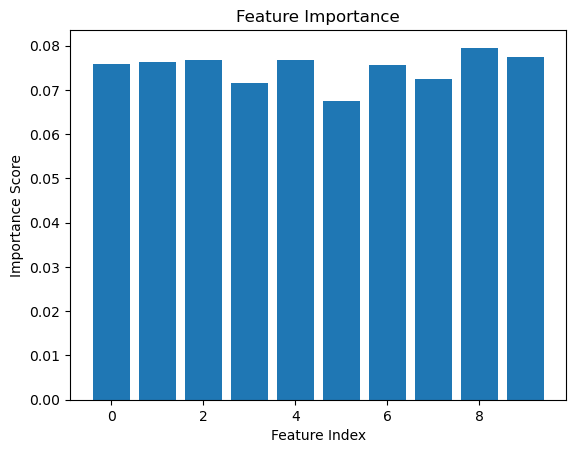

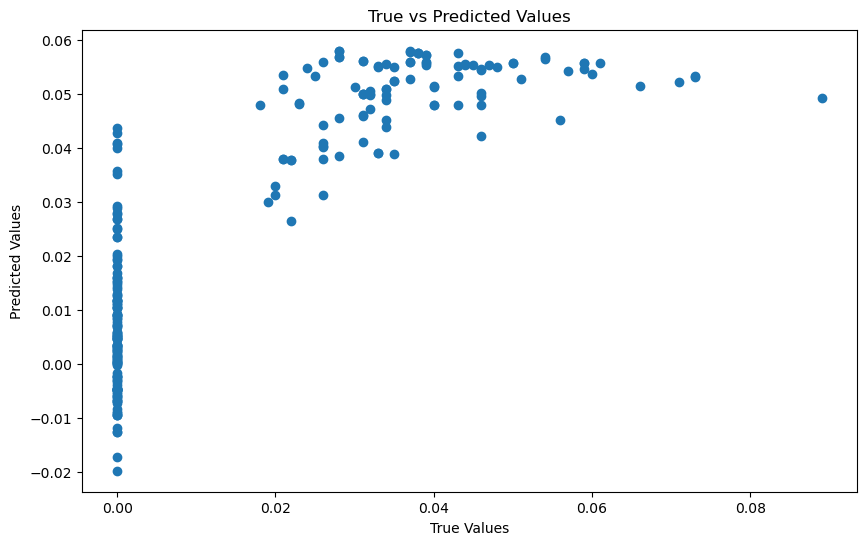

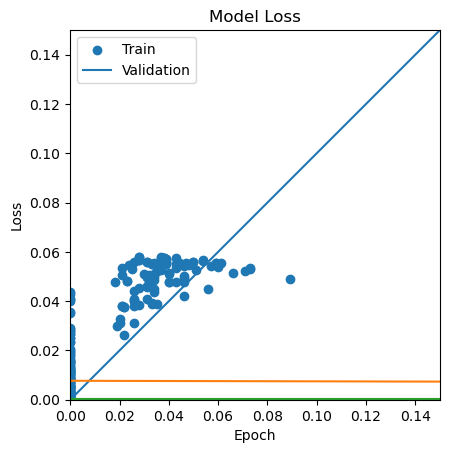

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 40ms/step - loss: 0.0018 - val_loss: 4.8997e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0013 - val_loss: 2.9330e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0011 - val_loss: 2.3007e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0010 - val_loss: 1.9930e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 24ms/step - loss: 9.3623e-04 - val_loss: 1.8350e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 25ms/step - loss: 8.7211e-04 - val_loss: 1.7537e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 25ms/step - loss: 8.1740e-04 - val_loss: 1.7283e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 23ms/step - loss: 7.7129e-04 - val_loss: 1.7347e-04 - lr: 0.0100
Epoch 9/200
30/30 [=============================

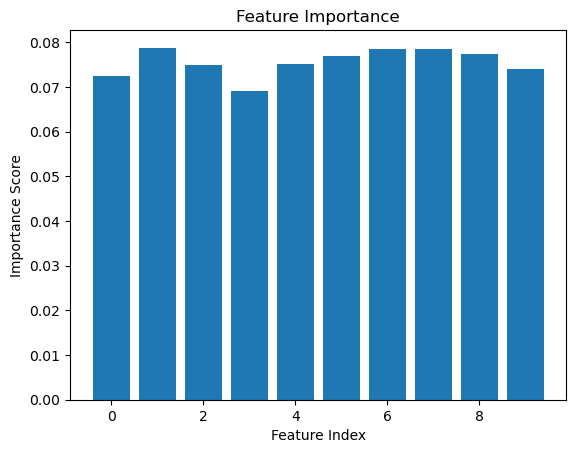

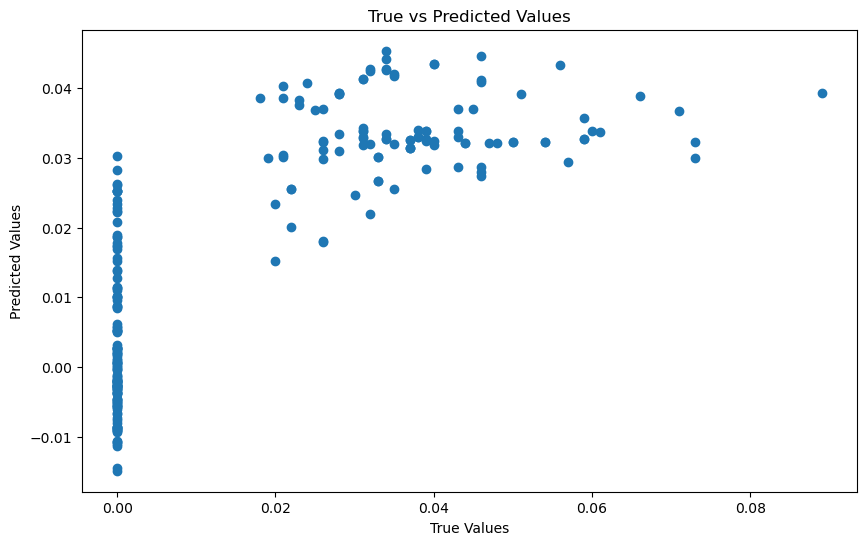

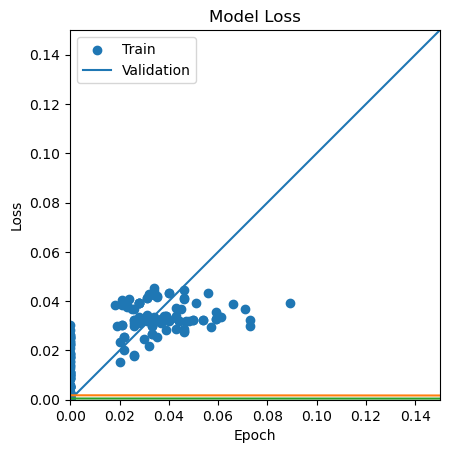

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 41ms/step - loss: 0.0037 - val_loss: 3.5338e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 22ms/step - loss: 0.0029 - val_loss: 6.5853e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 23ms/step - loss: 0.0026 - val_loss: 7.3558e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0023 - val_loss: 8.0763e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0024 - val_loss: 8.4966e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0023 - val_loss: 8.8813e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 22ms/step - loss: 0.0024 - val_loss: 8.7332e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0021 - val_loss: 8.3109e-04 - lr: 0.0100
Epoch 9/200
30/30 [==============================] - 1s 23ms/ste

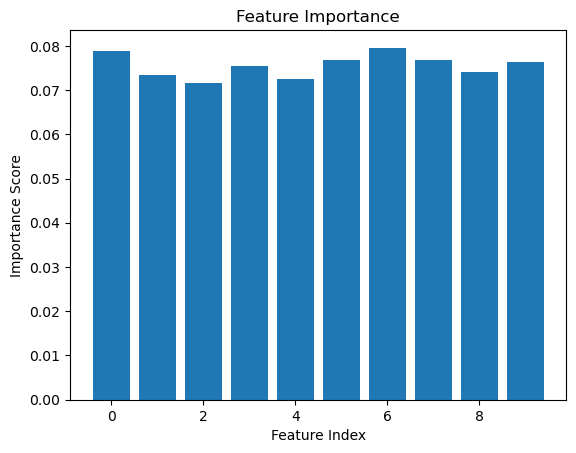

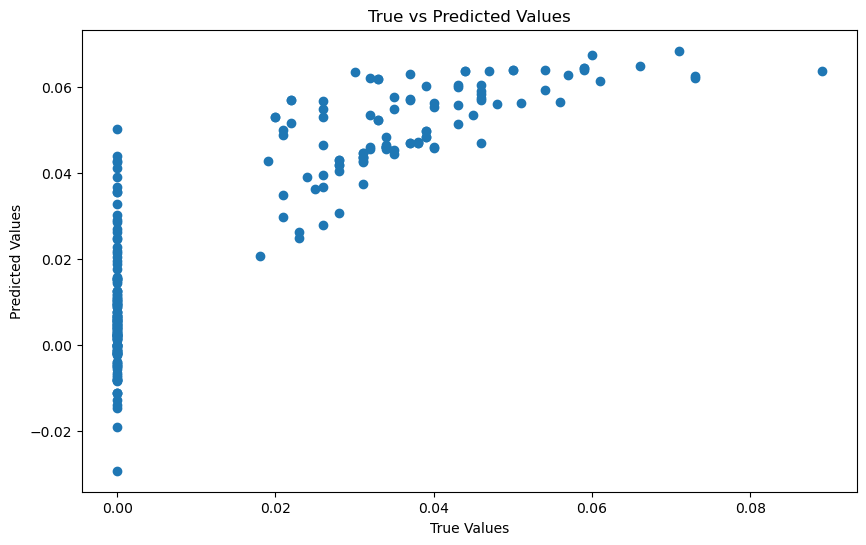

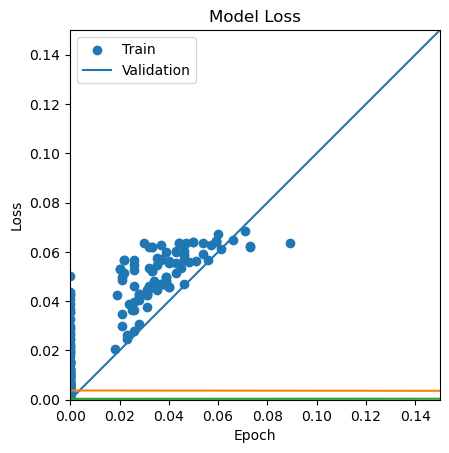

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 42ms/step - loss: 0.0089 - val_loss: 0.0029 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0060 - val_loss: 0.0048 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0051 - val_loss: 0.0050 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0053 - val_loss: 0.0053 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0052 - val_loss: 0.0052 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0043 - val_loss: 0.0045 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0043 - val_loss: 0.0044 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0039 - val_loss: 0.0041 - lr: 0.0100
Epoch 9/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0042 - val_loss: 0.0

Epoch 72/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0015 - val_loss: 7.2286e-04 - lr: 0.0011
Epoch 73/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0015 - val_loss: 7.2345e-04 - lr: 0.0010
Epoch 74/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0015 - val_loss: 7.1963e-04 - lr: 9.0718e-04
Epoch 75/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0016 - val_loss: 7.2054e-04 - lr: 8.2085e-04
Epoch 76/200
30/30 [==============================] - 1s 29ms/step - loss: 0.0015 - val_loss: 7.1898e-04 - lr: 7.4273e-04
Epoch 77/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0015 - val_loss: 7.1978e-04 - lr: 6.7205e-04
Epoch 78/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0014 - val_loss: 7.1874e-04 - lr: 6.0810e-04
Epoch 79/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0016 - val_loss: 7.2151e-04 - lr: 5.5023e-04
Epoch 80/200
30/30 [============

Epoch 139/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0015 - val_loss: 7.1818e-04 - lr: 1.3639e-06
Epoch 140/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0015 - val_loss: 7.1819e-04 - lr: 1.2341e-06
Epoch 141/200
59/59 [==============================] - 1s 9ms/step


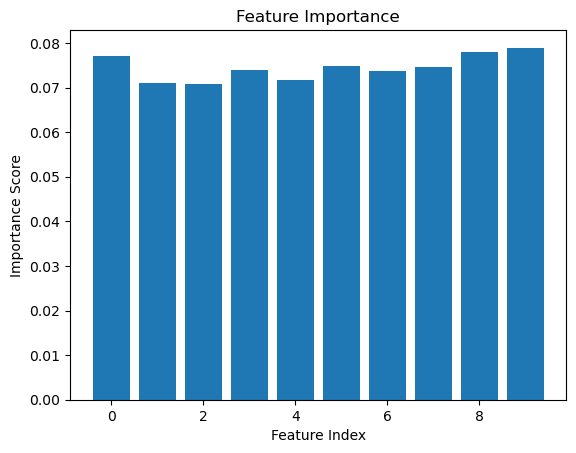

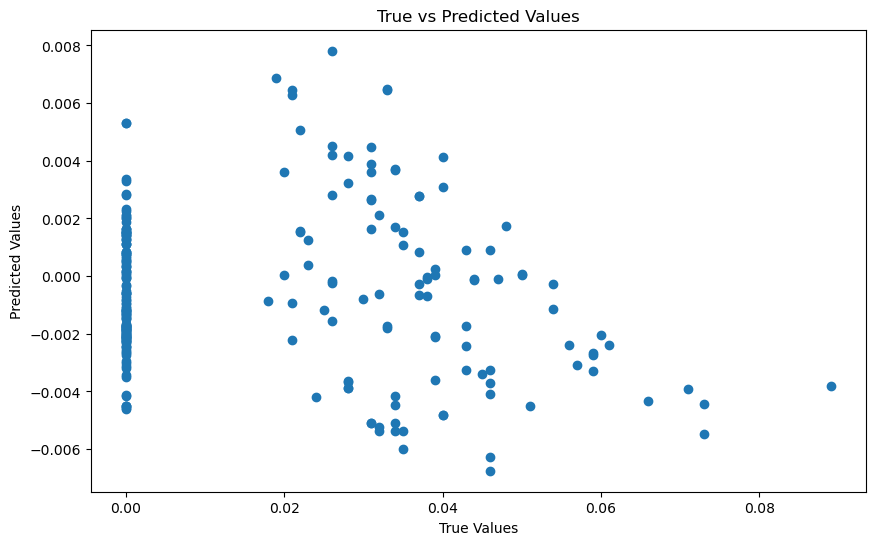

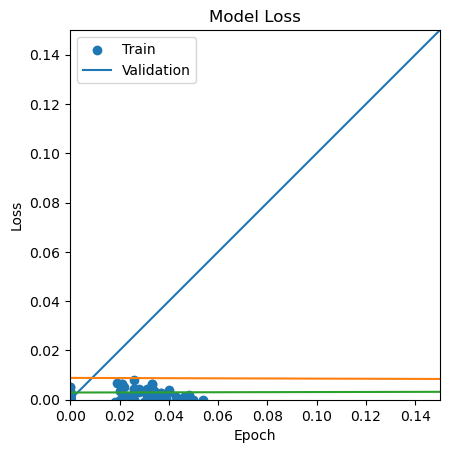

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 40ms/step - loss: 0.0320 - val_loss: 0.0029 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0095 - val_loss: 0.0068 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 23ms/step - loss: 0.0077 - val_loss: 0.0074 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0068 - val_loss: 0.0070 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0062 - val_loss: 0.0060 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0061 - val_loss: 0.0055 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0053 - val_loss: 0.0049 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 22ms/step - loss: 0.0058 - val_loss: 0.0048 - lr: 0.0100
Epoch 9/200
30/30 [==============================] - 1s 23ms/step - loss: 0.0048 - val_loss: 0.0

30/30 [==============================] - 1s 29ms/step - loss: 0.0017 - val_loss: 4.4171e-04 - lr: 1.5073e-06
Epoch 139/200
30/30 [==============================] - 1s 26ms/step - loss: 0.0019 - val_loss: 4.4171e-04 - lr: 1.3639e-06
Epoch 140/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0018 - val_loss: 4.4171e-04 - lr: 1.2341e-06
Epoch 141/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0017 - val_loss: 4.4171e-04 - lr: 1.1167e-06
Epoch 142/200
30/30 [==============================] - 1s 25ms/step - loss: 0.0018 - val_loss: 4.4171e-04 - lr: 1.0104e-06
Epoch 143/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0018 - val_loss: 4.4171e-04 - lr: 9.1424e-07
Epoch 144/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0018 - val_loss: 4.4171e-04 - lr: 8.2724e-07
Epoch 145/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0018 - val_loss: 4.4171e-04 - lr: 7.4851e-07
Epoch 146/200
30/30 [=========

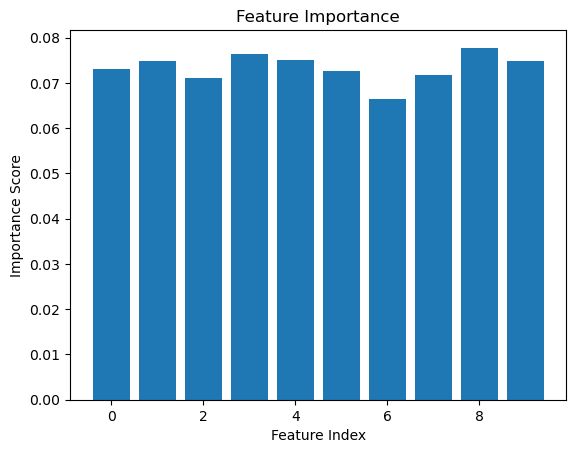

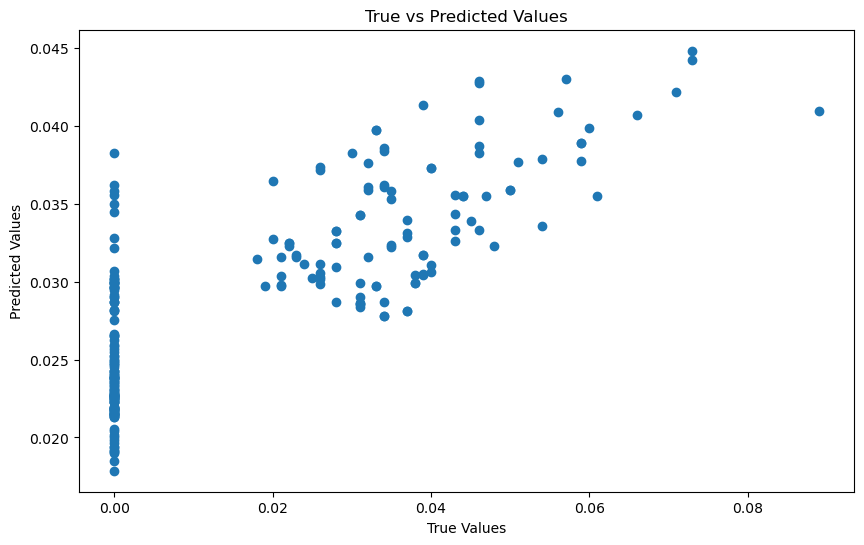

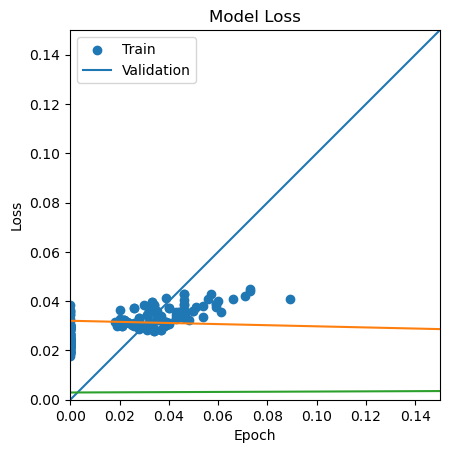

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 4s 25ms/step - loss: 6.6267e-04 - val_loss: 4.1616e-04 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 3s 22ms/step - loss: 3.9832e-04 - val_loss: 2.4598e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 3s 22ms/step - loss: 3.4573e-04 - val_loss: 1.9543e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 3s 22ms/step - loss: 3.2315e-04 - val_loss: 1.8206e-04 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 2s 19ms/step - loss: 3.0968e-04 - val_loss: 1.6824e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 2s 19ms/step - loss: 2.9592e-04 - val_loss: 1.6302e-04 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 2s 19ms/step - loss: 2.8702e-04 - val_loss: 1.6653e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 2s 20ms/step - loss: 2.8033e-04 - val_loss: 1.6441e-04 - lr: 0.1000
Epoch 9/200
118/

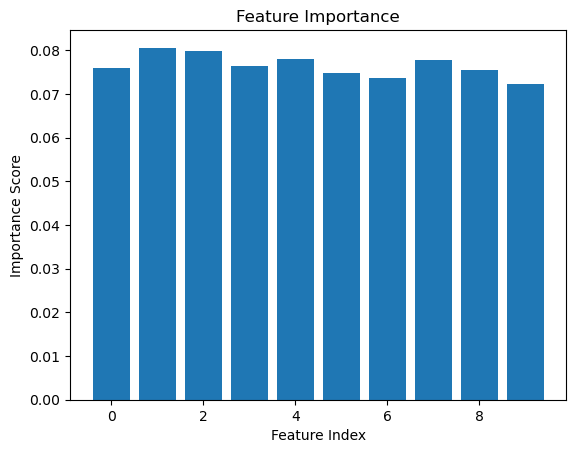

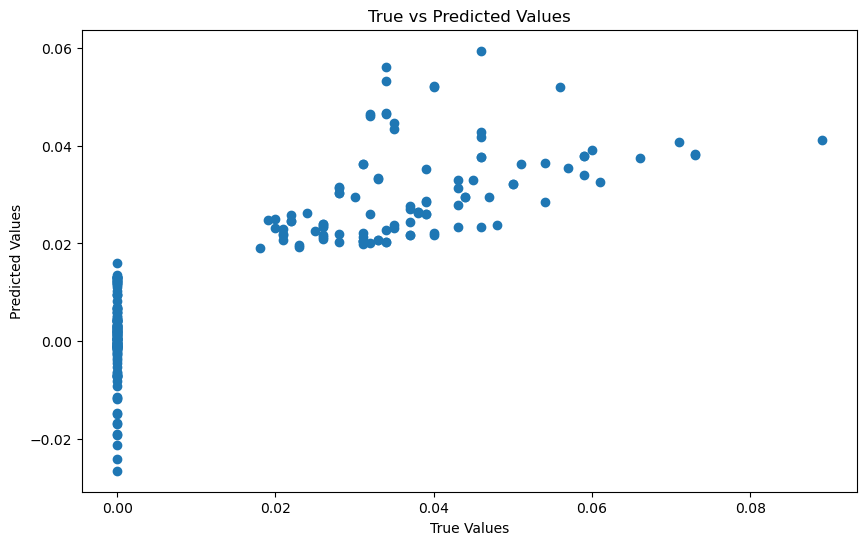

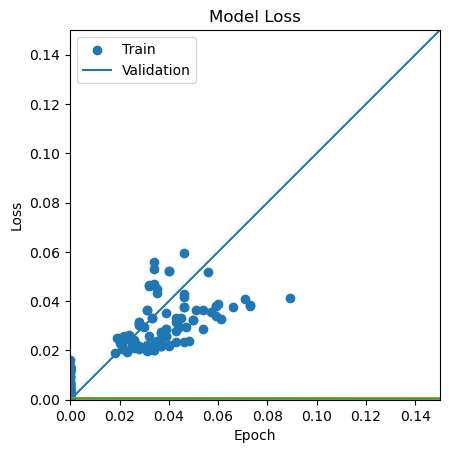

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 5s 28ms/step - loss: 0.0022 - val_loss: 6.5515e-04 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 2s 21ms/step - loss: 0.0014 - val_loss: 7.2422e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 2s 21ms/step - loss: 0.0010 - val_loss: 6.5634e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 3s 21ms/step - loss: 0.0010 - val_loss: 4.4702e-04 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 3s 22ms/step - loss: 8.5190e-04 - val_loss: 2.4949e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 1s 12ms/step - loss: 8.0309e-04 - val_loss: 2.8475e-04 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 1s 12ms/step - loss: 7.3114e-04 - val_loss: 2.2027e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 1s 12ms/step - loss: 7.4180e-04 - val_loss: 1.9203e-04 - lr: 0.1000
Epoch 9/200
118/118 [===========

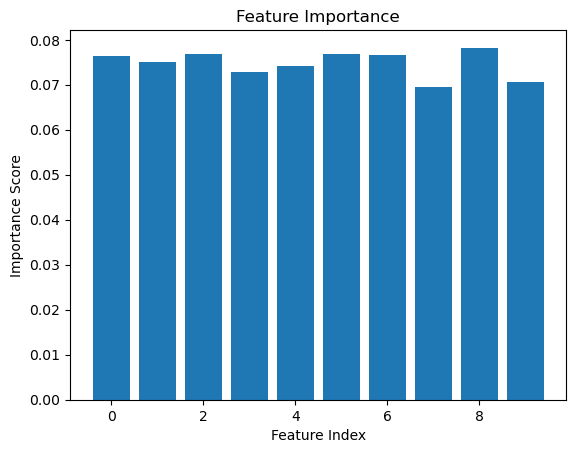

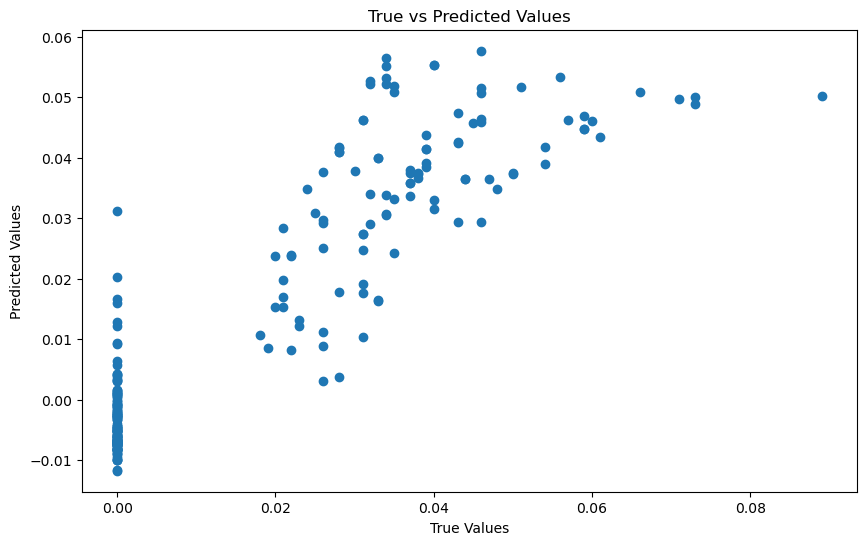

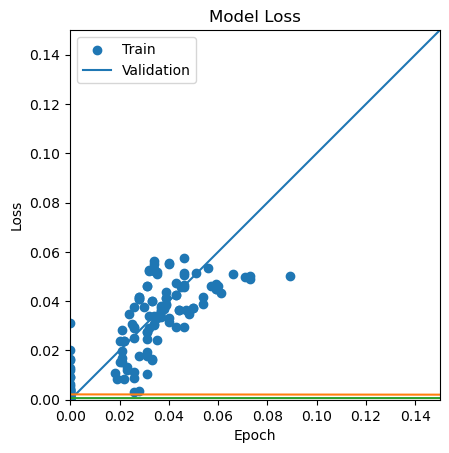

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 4s 20ms/step - loss: 0.0025 - val_loss: 6.0461e-04 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0014 - val_loss: 5.6717e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0012 - val_loss: 1.5829e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 2s 14ms/step - loss: 0.0010 - val_loss: 1.6469e-04 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 2s 15ms/step - loss: 9.6506e-04 - val_loss: 2.0629e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 2s 14ms/step - loss: 8.7089e-04 - val_loss: 1.6224e-04 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 2s 14ms/step - loss: 8.4178e-04 - val_loss: 2.1947e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 2s 14ms/step - loss: 8.2992e-04 - val_loss: 1.9567e-04 - lr: 0.1000
Epoch 9/200
118/118 [===========

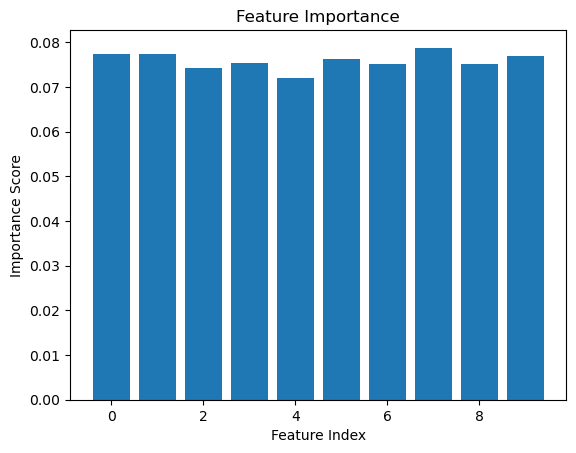

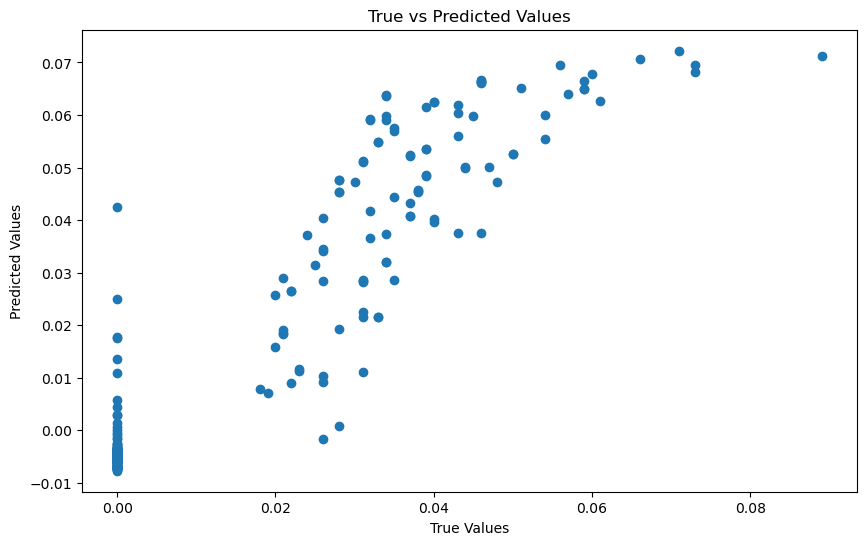

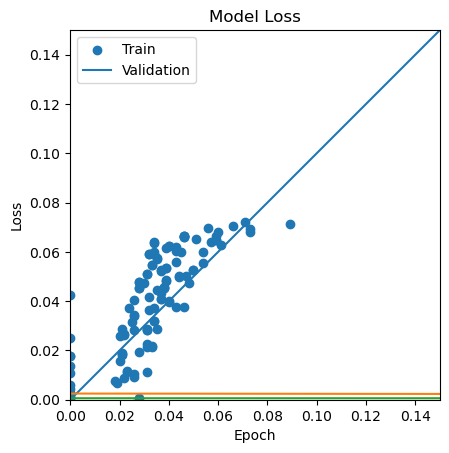

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 4s 27ms/step - loss: 0.0045 - val_loss: 3.6294e-04 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 3s 21ms/step - loss: 0.0020 - val_loss: 4.6656e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 3s 22ms/step - loss: 0.0015 - val_loss: 3.4358e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 3s 21ms/step - loss: 0.0014 - val_loss: 3.4302e-04 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 2s 21ms/step - loss: 0.0013 - val_loss: 4.8317e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 3s 23ms/step - loss: 0.0011 - val_loss: 3.2051e-04 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 3s 24ms/step - loss: 0.0011 - val_loss: 3.3019e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 3s 25ms/step - loss: 0.0011 - val_loss: 2.6690e-04 - lr: 0.1000
Epoch 9/200
118/118 [===========================

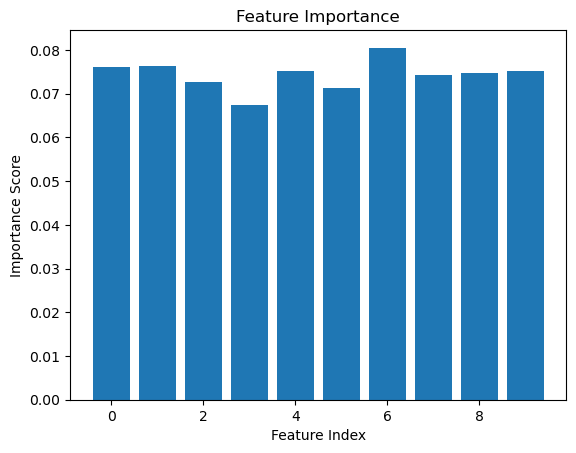

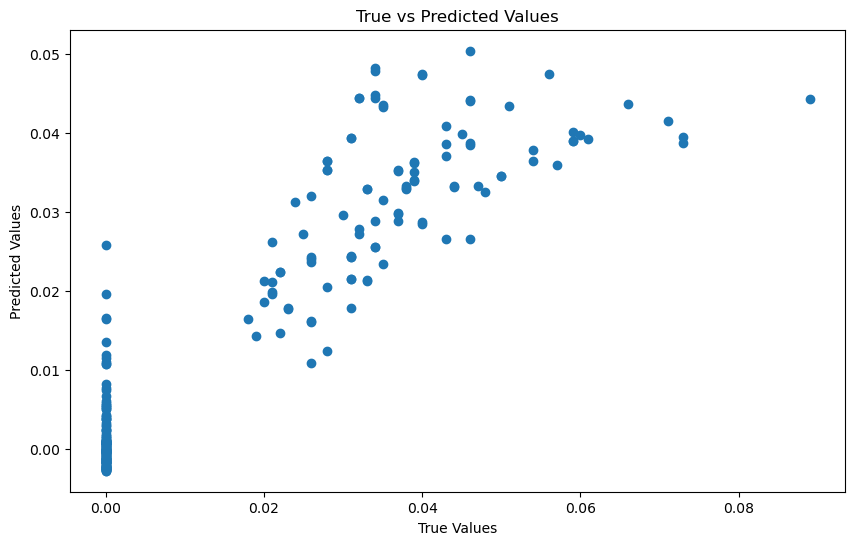

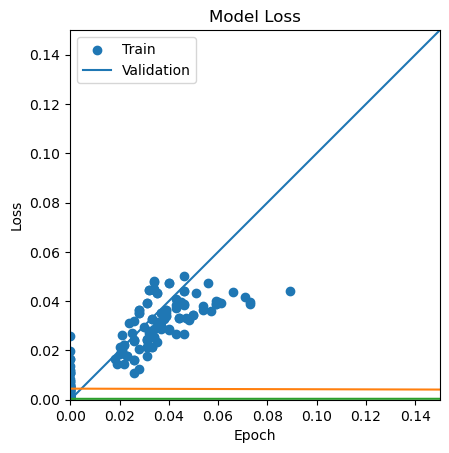

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 28ms/step - loss: 0.0013 - val_loss: 2.6475e-04 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 19ms/step - loss: 4.9477e-04 - val_loss: 2.2548e-04 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 20ms/step - loss: 4.1503e-04 - val_loss: 1.9843e-04 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 1s 21ms/step - loss: 3.7731e-04 - val_loss: 1.8960e-04 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 1s 19ms/step - loss: 3.5469e-04 - val_loss: 2.1940e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 1s 22ms/step - loss: 3.3898e-04 - val_loss: 2.1500e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 22ms/step - loss: 3.2762e-04 - val_loss: 2.0991e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 1s 22ms/step - loss: 3.1383e-04 - val_loss: 2.1698e-04 - lr: 0.1000
Epoch 9/200
59/59 [=================

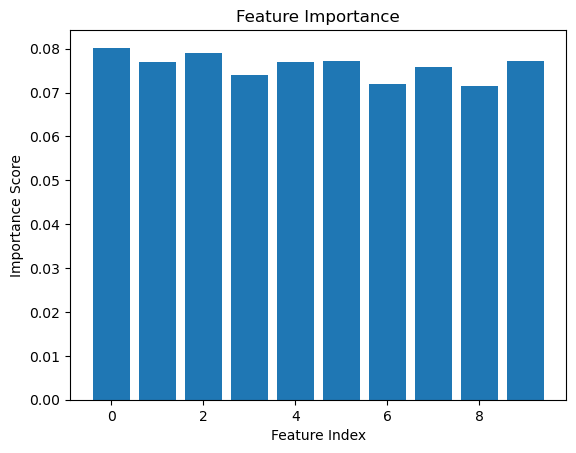

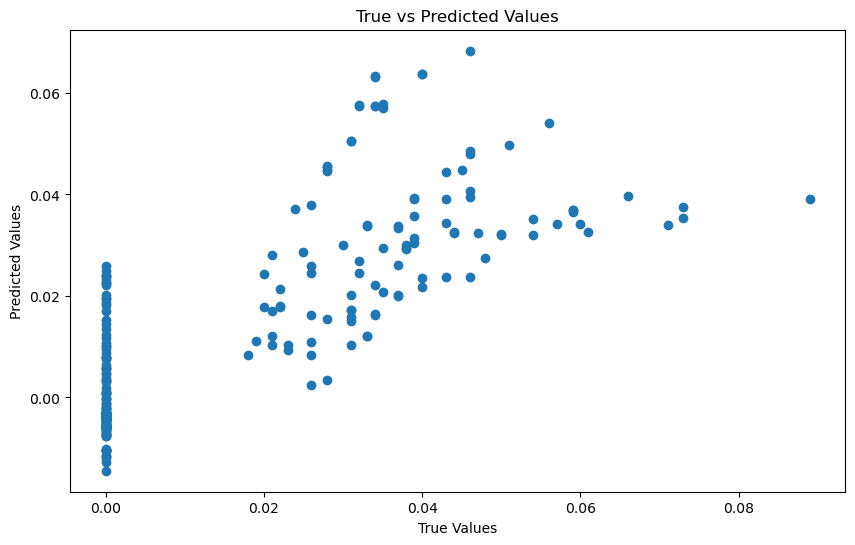

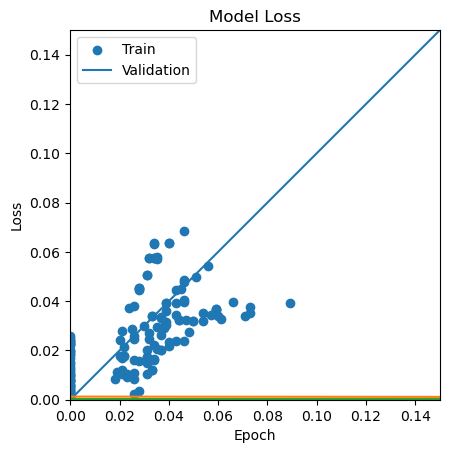

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 33ms/step - loss: 0.0031 - val_loss: 9.2015e-04 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0016 - val_loss: 6.5028e-04 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0013 - val_loss: 3.3291e-04 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0012 - val_loss: 2.8995e-04 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0011 - val_loss: 2.1497e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 1s 23ms/step - loss: 0.0010 - val_loss: 2.0481e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 2s 27ms/step - loss: 9.8428e-04 - val_loss: 1.6419e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 2s 27ms/step - loss: 9.4593e-04 - val_loss: 1.3815e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 2s 

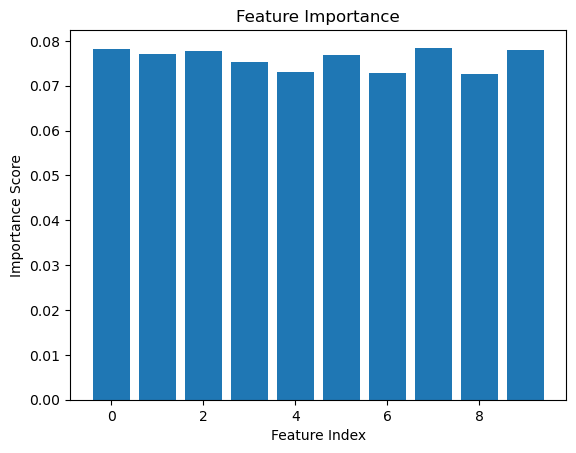

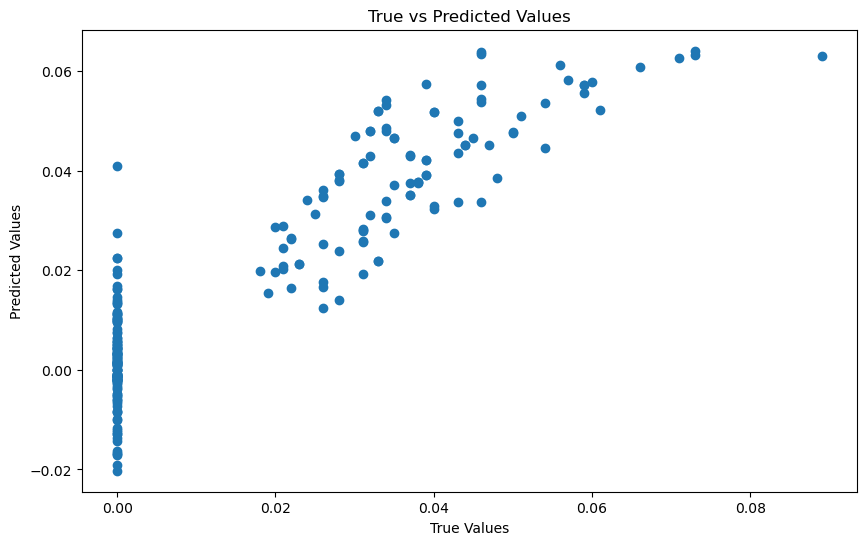

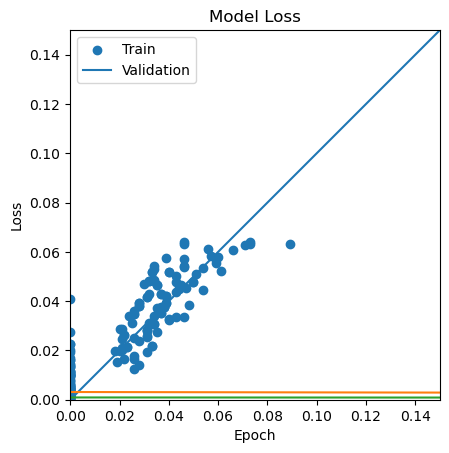

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 33ms/step - loss: 0.0043 - val_loss: 0.0013 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 2s 26ms/step - loss: 0.0021 - val_loss: 7.4651e-04 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0018 - val_loss: 8.7884e-04 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0016 - val_loss: 8.7296e-04 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0014 - val_loss: 6.4149e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 1s 24ms/step - loss: 0.0013 - val_loss: 7.9310e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 25ms/step - loss: 0.0012 - val_loss: 6.2659e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 2s 31ms/step - loss: 0.0012 - val_loss: 6.7179e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 2s 34ms/step - 

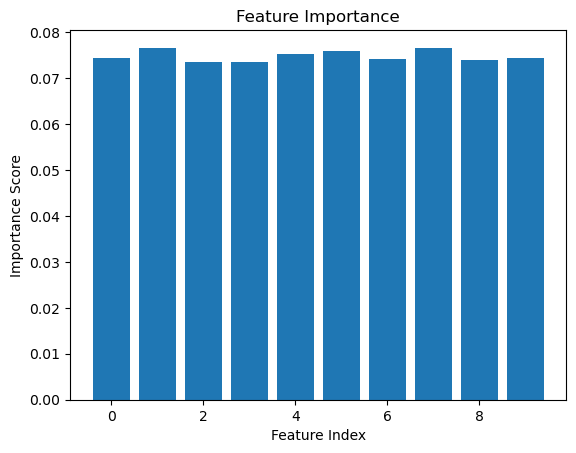

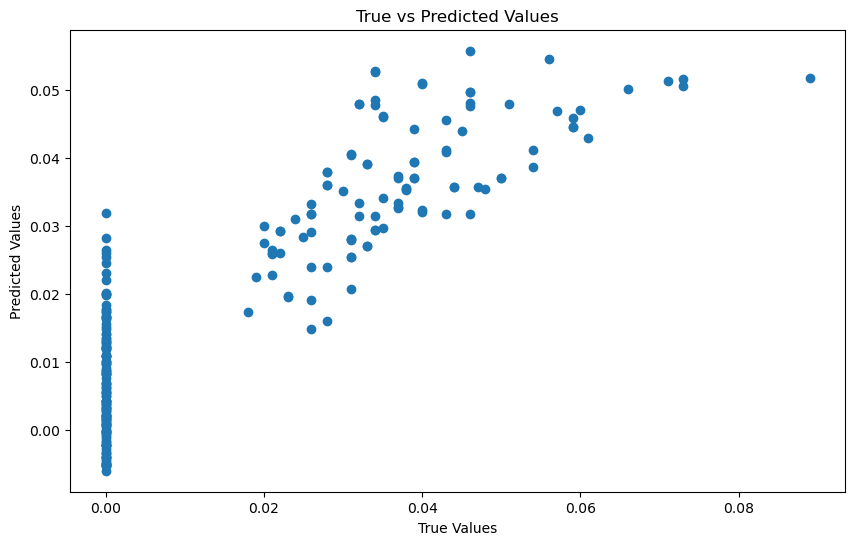

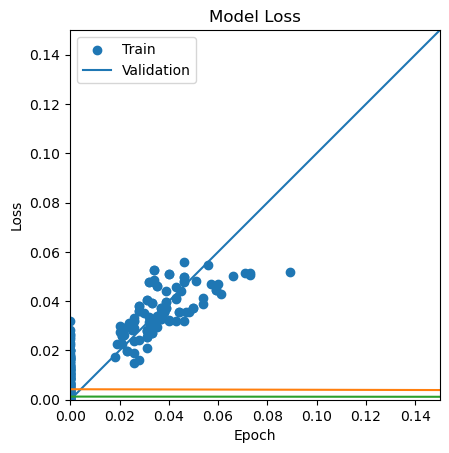

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 5s 57ms/step - loss: 0.0055 - val_loss: 0.0023 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 3s 44ms/step - loss: 0.0027 - val_loss: 0.0017 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 3s 47ms/step - loss: 0.0021 - val_loss: 9.3426e-04 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 3s 43ms/step - loss: 0.0018 - val_loss: 6.2711e-04 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 3s 45ms/step - loss: 0.0015 - val_loss: 5.9388e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 2s 32ms/step - loss: 0.0015 - val_loss: 4.8046e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 23ms/step - loss: 0.0014 - val_loss: 5.4888e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0012 - val_loss: 5.1336e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 1s 17ms/step - loss

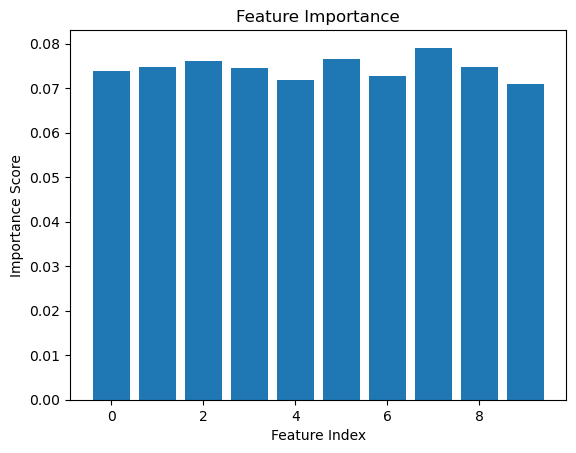

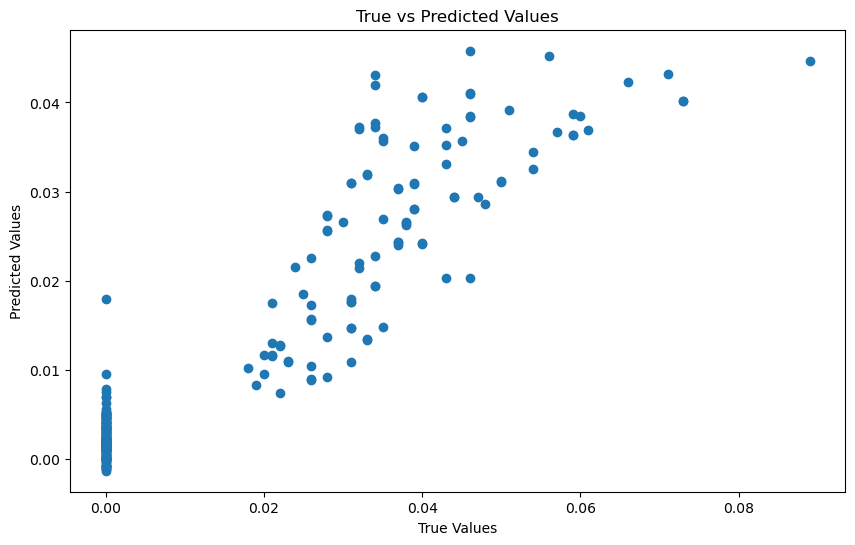

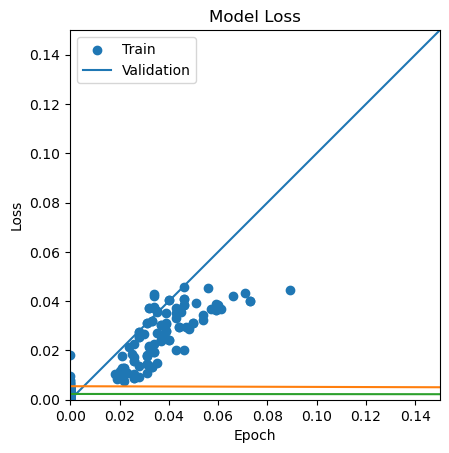

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 34ms/step - loss: 0.0013 - val_loss: 1.5984e-04 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 0s 16ms/step - loss: 6.9434e-04 - val_loss: 2.4804e-04 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 0s 13ms/step - loss: 5.4321e-04 - val_loss: 3.9887e-04 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 0s 13ms/step - loss: 4.7505e-04 - val_loss: 3.8513e-04 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 0s 13ms/step - loss: 4.3503e-04 - val_loss: 2.3157e-04 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 0s 13ms/step - loss: 4.1711e-04 - val_loss: 2.1007e-04 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 0s 16ms/step - loss: 4.0108e-04 - val_loss: 2.6283e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 18ms/step - loss: 3.8416e-04 - val_loss: 2.6608e-04 - lr: 0.1000
Epoch 9/200
30/30 [=================

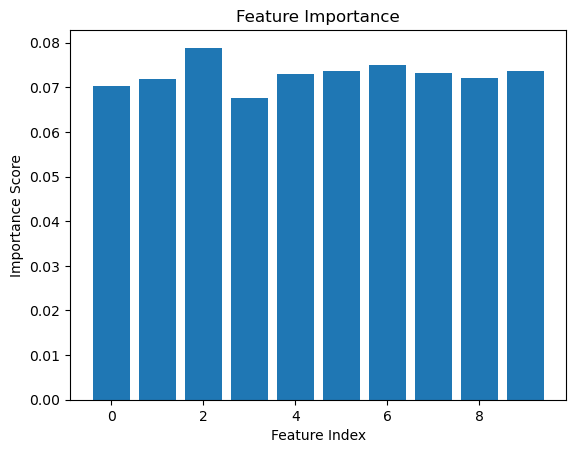

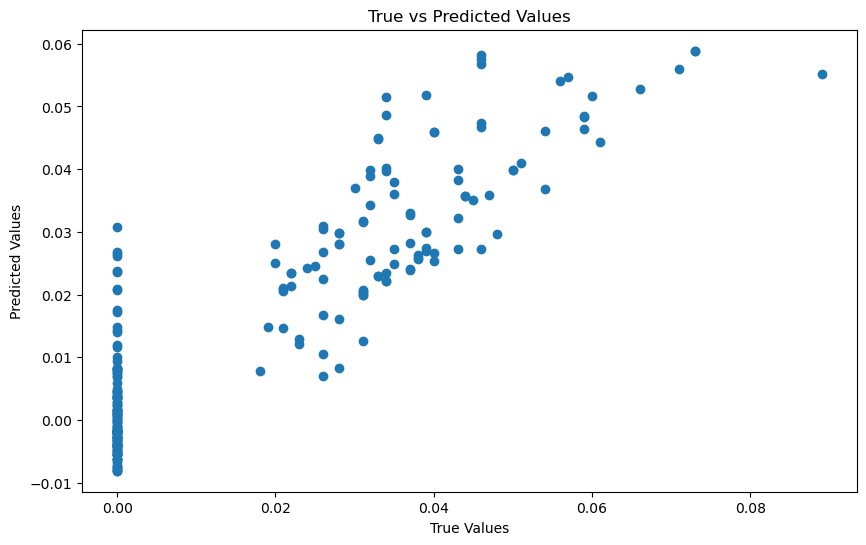

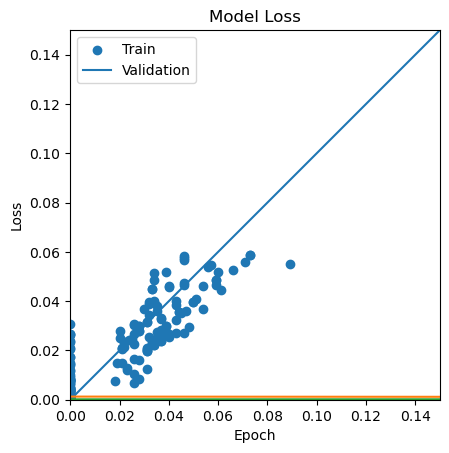

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 44ms/step - loss: 0.0028 - val_loss: 0.0023 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 2s 51ms/step - loss: 0.0020 - val_loss: 0.0019 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 24ms/step - loss: 0.0018 - val_loss: 0.0016 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 22ms/step - loss: 0.0016 - val_loss: 0.0011 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 18ms/step - loss: 0.0015 - val_loss: 9.1862e-04 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 48ms/step - loss: 0.0013 - val_loss: 7.3853e-04 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 2s 67ms/step - loss: 0.0013 - val_loss: 4.8436e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 18ms/step - loss: 0.0012 - val_loss: 0.0013 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 40ms/step - loss: 0.0012 - v

59/59 [==============================] - 0s 6ms/step


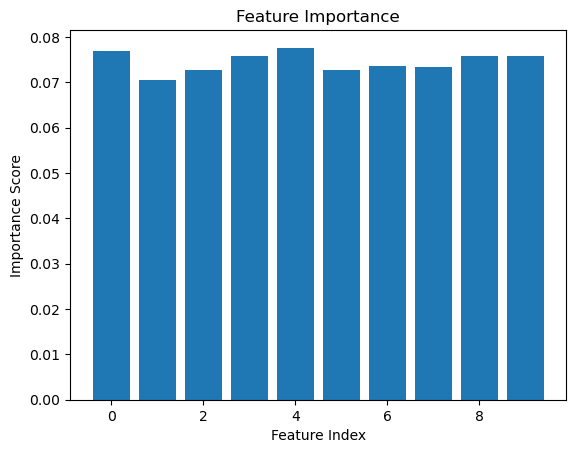

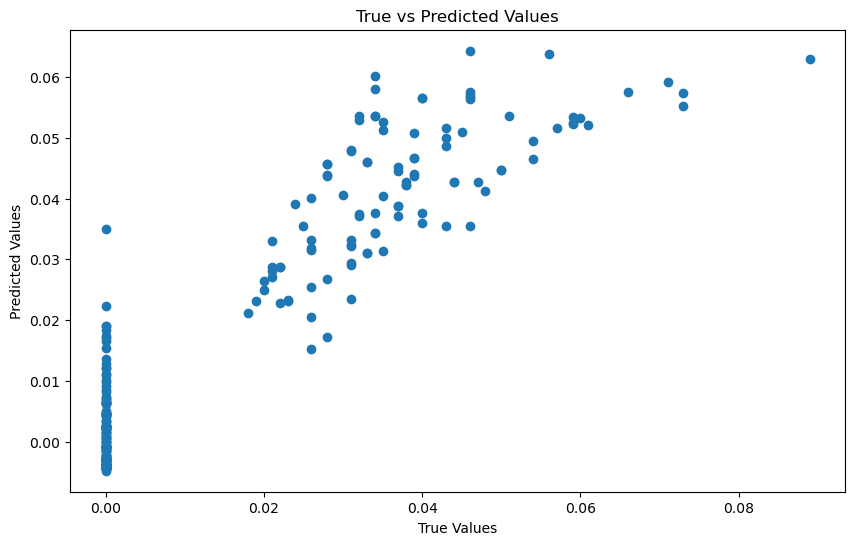

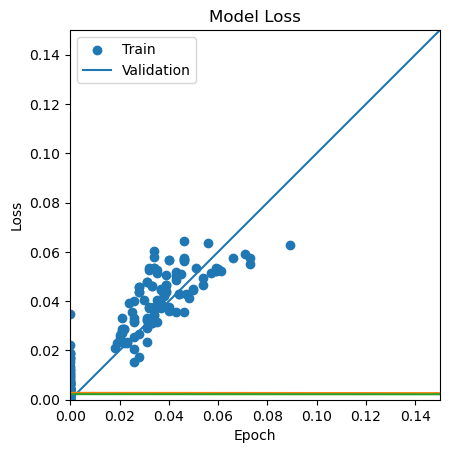

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 42ms/step - loss: 0.0056 - val_loss: 7.8196e-04 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0032 - val_loss: 8.4043e-04 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0024 - val_loss: 5.0439e-04 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0022 - val_loss: 5.7158e-04 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 22ms/step - loss: 0.0019 - val_loss: 4.3224e-04 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 21ms/step - loss: 0.0017 - val_loss: 3.8972e-04 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0015 - val_loss: 4.4672e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0015 - val_loss: 3.9155e-04 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 21ms/ste

Epoch 69/200
30/30 [==============================] - 1s 20ms/step - loss: 6.8492e-04 - val_loss: 1.2292e-04 - lr: 0.0150
Epoch 70/200
30/30 [==============================] - 1s 30ms/step - loss: 6.4952e-04 - val_loss: 1.2262e-04 - lr: 0.0135
Epoch 71/200
30/30 [==============================] - 1s 20ms/step - loss: 6.5812e-04 - val_loss: 1.2348e-04 - lr: 0.0122
Epoch 72/200
30/30 [==============================] - 1s 20ms/step - loss: 6.9581e-04 - val_loss: 1.2618e-04 - lr: 0.0111
Epoch 73/200
30/30 [==============================] - 1s 20ms/step - loss: 6.4439e-04 - val_loss: 1.2498e-04 - lr: 0.0100
Epoch 74/200
30/30 [==============================] - 1s 19ms/step - loss: 6.7758e-04 - val_loss: 1.2437e-04 - lr: 0.0091
Epoch 75/200
30/30 [==============================] - 1s 18ms/step - loss: 6.4230e-04 - val_loss: 1.2396e-04 - lr: 0.0082
Epoch 76/200
30/30 [==============================] - 1s 19ms/step - loss: 6.7634e-04 - val_loss: 1.2433e-04 - lr: 0.0074
Epoch 77/200
30/30 [====

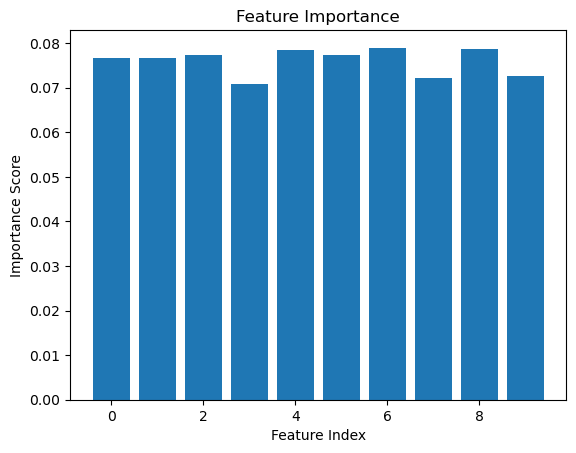

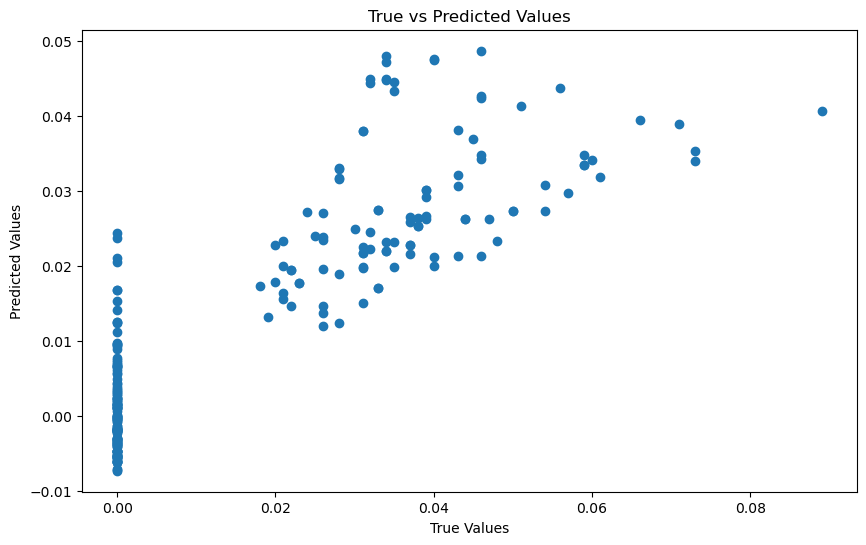

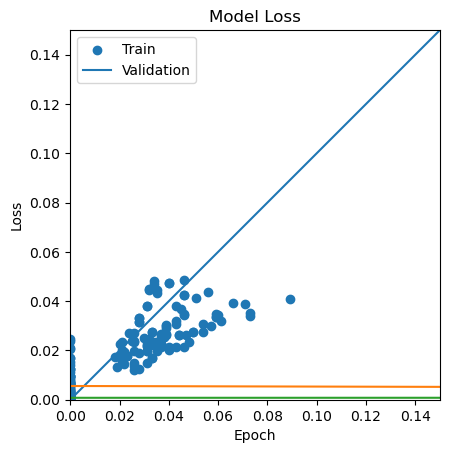

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 35ms/step - loss: 0.0121 - val_loss: 0.0046 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 21ms/step - loss: 0.0049 - val_loss: 0.0028 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0034 - val_loss: 0.0018 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0026 - val_loss: 0.0021 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 18ms/step - loss: 0.0024 - val_loss: 0.0011 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0021 - val_loss: 9.8985e-04 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0020 - val_loss: 9.6600e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 21ms/step - loss: 0.0018 - val_loss: 7.7389e-04 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0017 - v

59/59 [==============================] - 0s 7ms/step


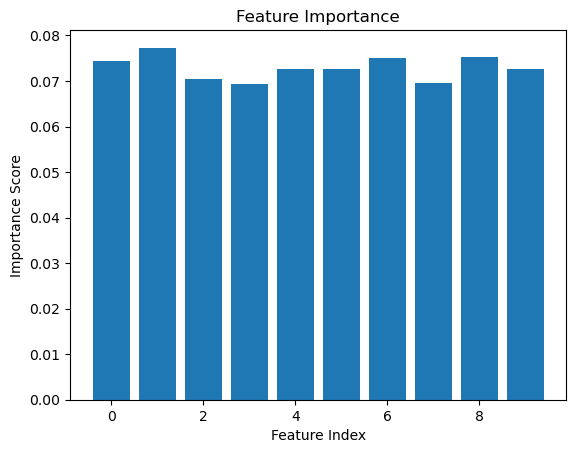

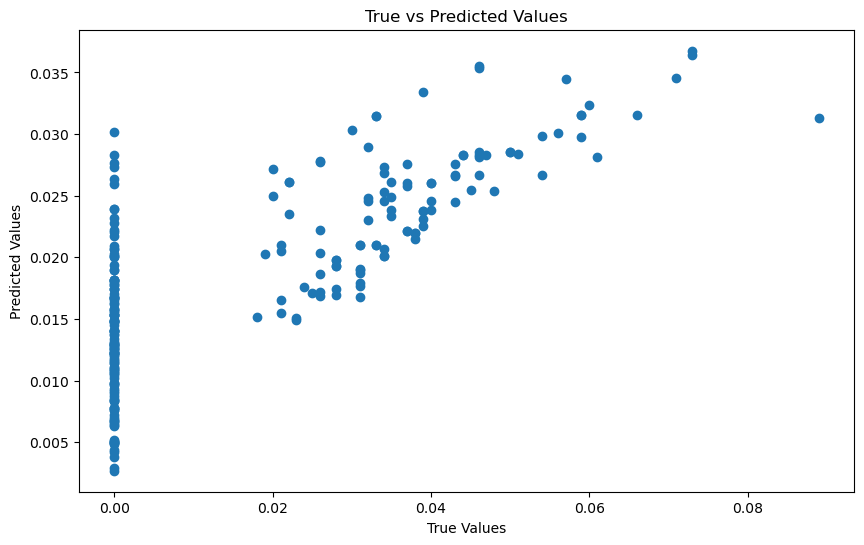

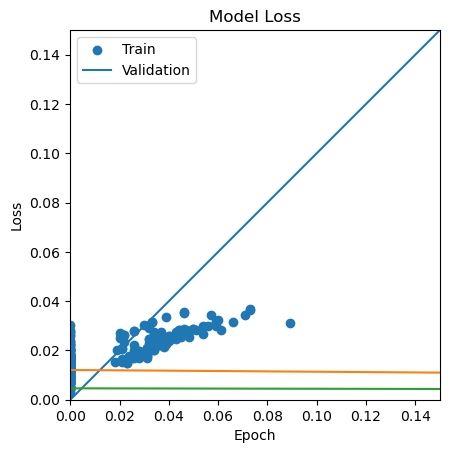

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 7s 30ms/step - loss: 4.6506e-04 - val_loss: 2.3311e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 3s 26ms/step - loss: 2.9424e-04 - val_loss: 3.1164e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 3s 27ms/step - loss: 2.7485e-04 - val_loss: 3.2726e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 3s 26ms/step - loss: 2.6146e-04 - val_loss: 2.4797e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 3s 27ms/step - loss: 2.4075e-04 - val_loss: 4.3212e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 3s 27ms/step - loss: 2.4165e-04 - val_loss: 6.2900e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 4s 31ms/step - loss: 2.2584e-04 - val_loss: 5.3208e-04 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 5s 41ms/step - loss: 2.2542e-04 - val_loss: 6.3221e-04 -

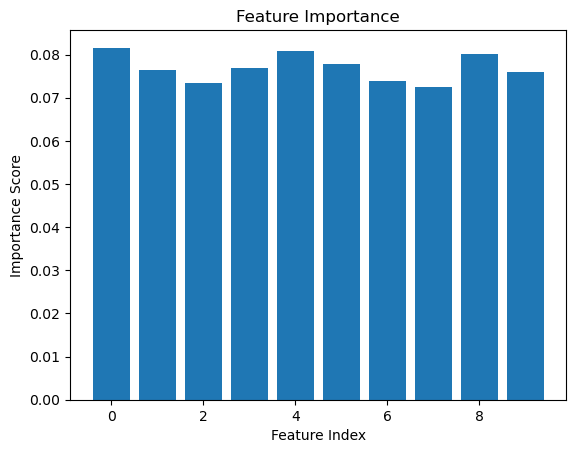

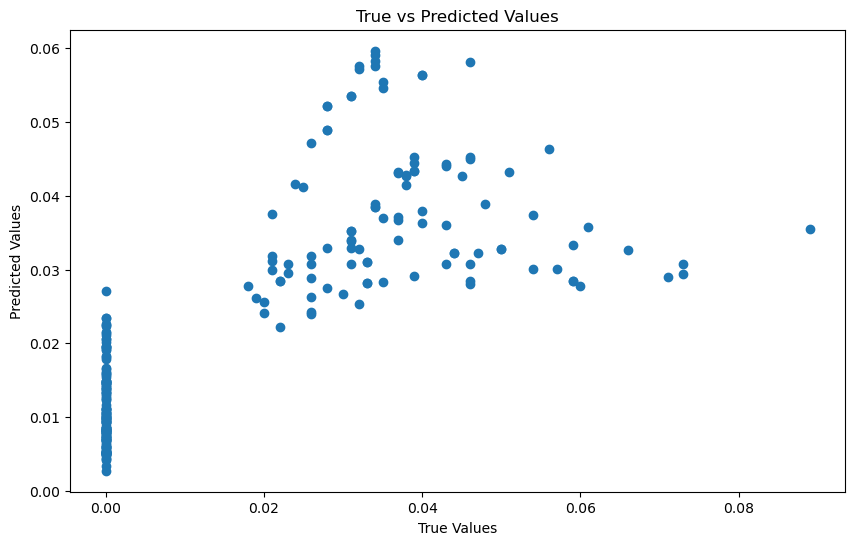

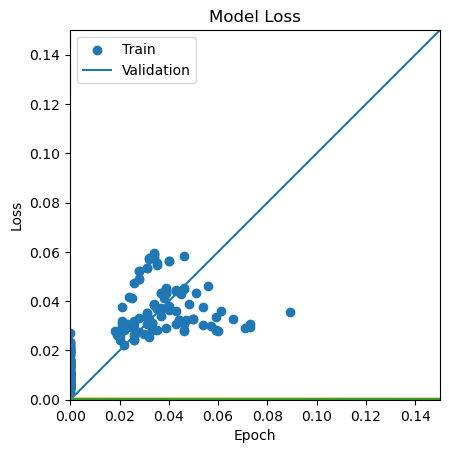

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 7s 32ms/step - loss: 0.0014 - val_loss: 4.3625e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 3s 27ms/step - loss: 7.6168e-04 - val_loss: 4.4695e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 4s 31ms/step - loss: 6.1501e-04 - val_loss: 5.7205e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 4s 34ms/step - loss: 5.5015e-04 - val_loss: 3.6193e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 6s 47ms/step - loss: 4.5136e-04 - val_loss: 2.1285e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 5s 39ms/step - loss: 4.8140e-04 - val_loss: 1.3660e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 5s 41ms/step - loss: 4.2528e-04 - val_loss: 1.3340e-04 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 4s 36ms/step - loss: 4.3802e-04 - val_loss: 1.4068e-04 - lr:

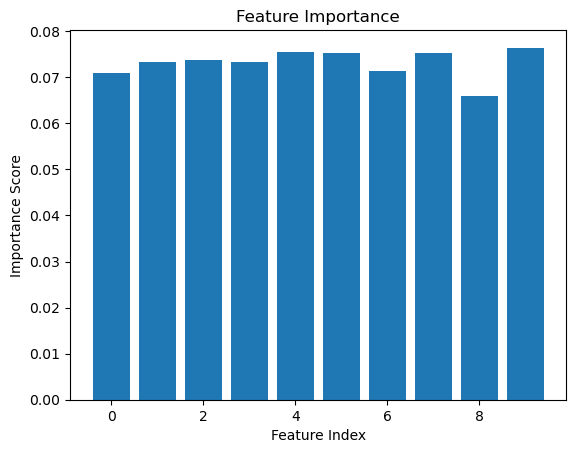

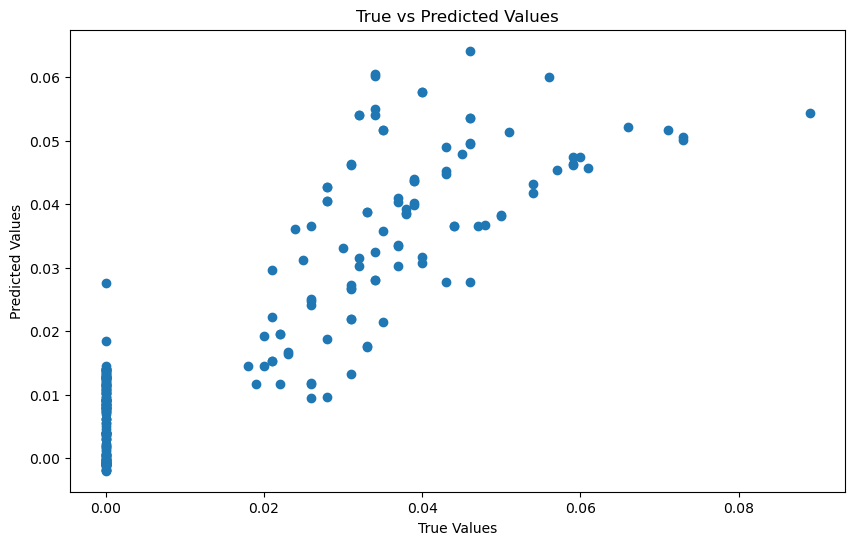

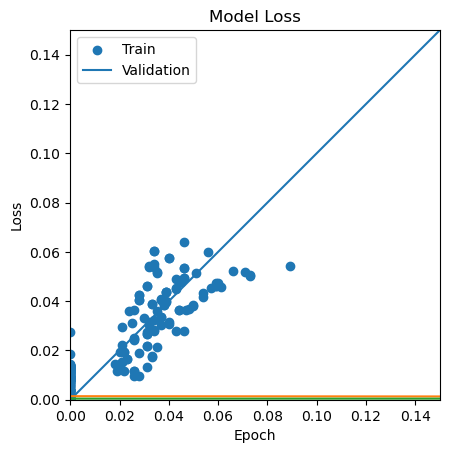

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 9s 48ms/step - loss: 0.0044 - val_loss: 3.2209e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 5s 43ms/step - loss: 0.0018 - val_loss: 1.4870e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 5s 42ms/step - loss: 0.0011 - val_loss: 2.0747e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 5s 42ms/step - loss: 7.7206e-04 - val_loss: 1.2708e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 5s 43ms/step - loss: 6.6435e-04 - val_loss: 1.0959e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 5s 44ms/step - loss: 6.1619e-04 - val_loss: 1.2154e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 5s 43ms/step - loss: 5.2720e-04 - val_loss: 9.8837e-05 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 5s 42ms/step - loss: 5.0251e-04 - val_loss: 1.0554e-04 - lr: 1.0000e

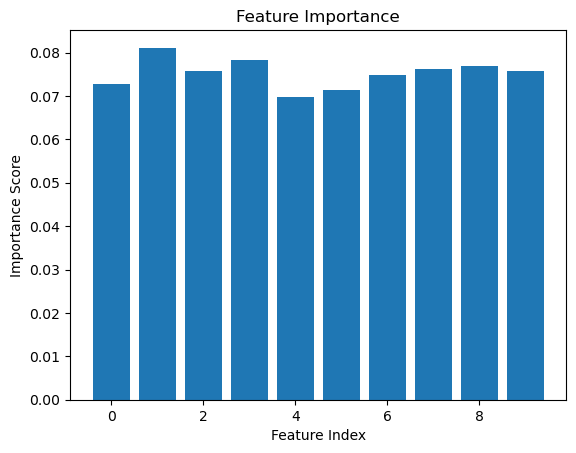

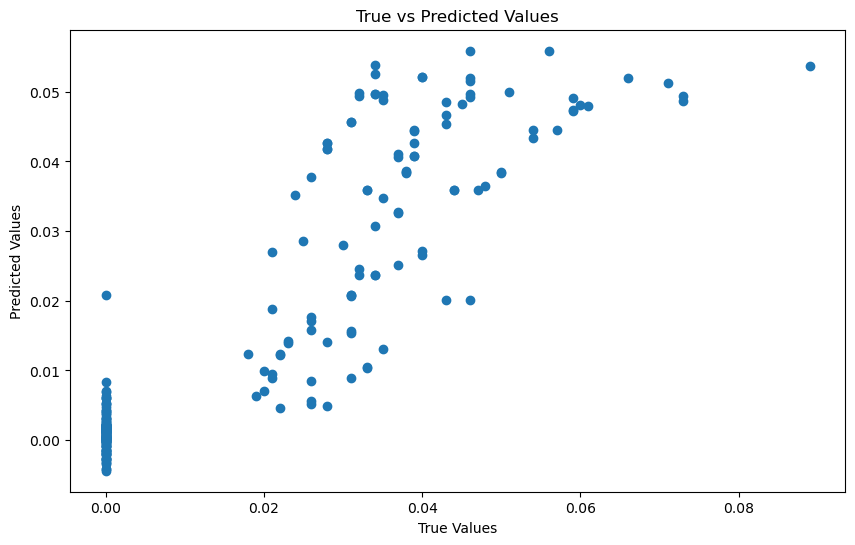

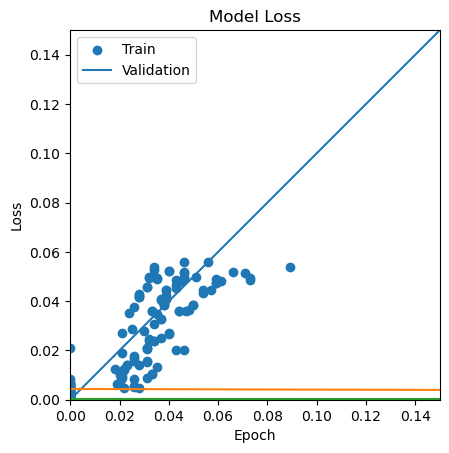

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 8s 43ms/step - loss: 0.0038 - val_loss: 3.7732e-04 - lr: 1.0000e-04
Epoch 2/200
118/118 [==============================] - 5s 40ms/step - loss: 0.0017 - val_loss: 2.3561e-04 - lr: 1.0000e-04
Epoch 3/200
118/118 [==============================] - 5s 38ms/step - loss: 0.0012 - val_loss: 1.8964e-04 - lr: 1.0000e-04
Epoch 4/200
118/118 [==============================] - 5s 38ms/step - loss: 0.0010 - val_loss: 1.4463e-04 - lr: 1.0000e-04
Epoch 5/200
118/118 [==============================] - 5s 39ms/step - loss: 8.4868e-04 - val_loss: 1.3935e-04 - lr: 1.0000e-04
Epoch 6/200
118/118 [==============================] - 5s 39ms/step - loss: 7.4693e-04 - val_loss: 1.9119e-04 - lr: 1.0000e-04
Epoch 7/200
118/118 [==============================] - 5s 38ms/step - loss: 6.6910e-04 - val_loss: 1.2108e-04 - lr: 1.0000e-04
Epoch 8/200
118/118 [==============================] - 5s 39ms/step - loss: 6.1930e-04 - val_loss: 1.1626e-04 - lr: 1.0000e-04


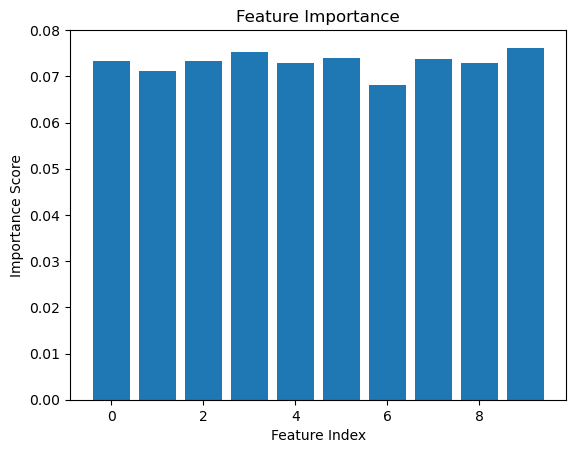

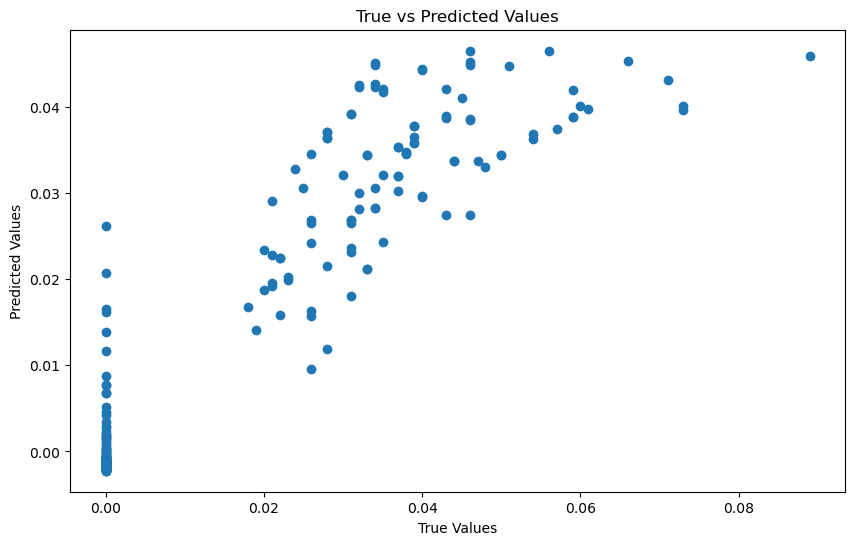

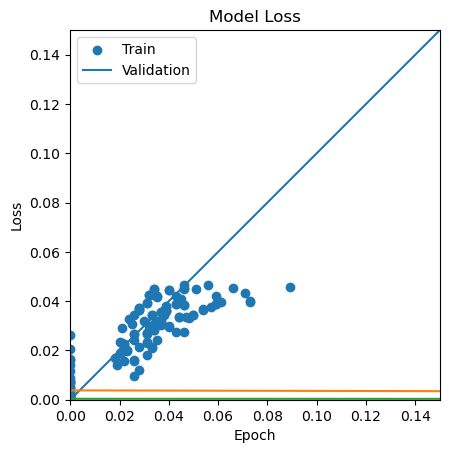

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 5s 47ms/step - loss: 5.2823e-04 - val_loss: 2.2736e-04 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 2s 37ms/step - loss: 3.0845e-04 - val_loss: 1.9813e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 2s 37ms/step - loss: 2.8930e-04 - val_loss: 3.1105e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 2s 37ms/step - loss: 2.6370e-04 - val_loss: 3.9480e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 2s 38ms/step - loss: 2.5465e-04 - val_loss: 5.8471e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 3s 43ms/step - loss: 2.4835e-04 - val_loss: 7.0622e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 2s 40ms/step - loss: 2.4061e-04 - val_loss: 5.7683e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 2s 37ms/step - loss: 2.2755e-04 - val_loss: 7.2999e-04 - lr: 1.0000e-04


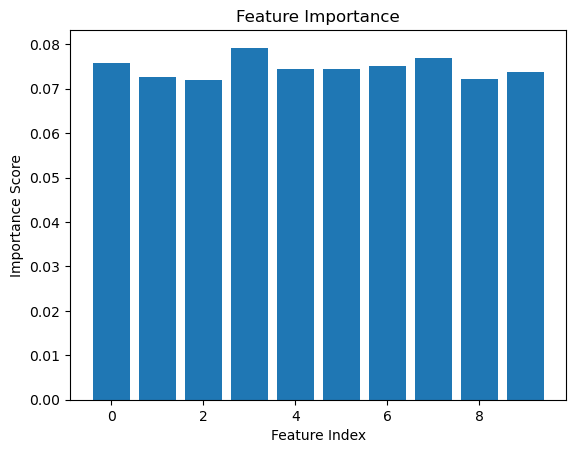

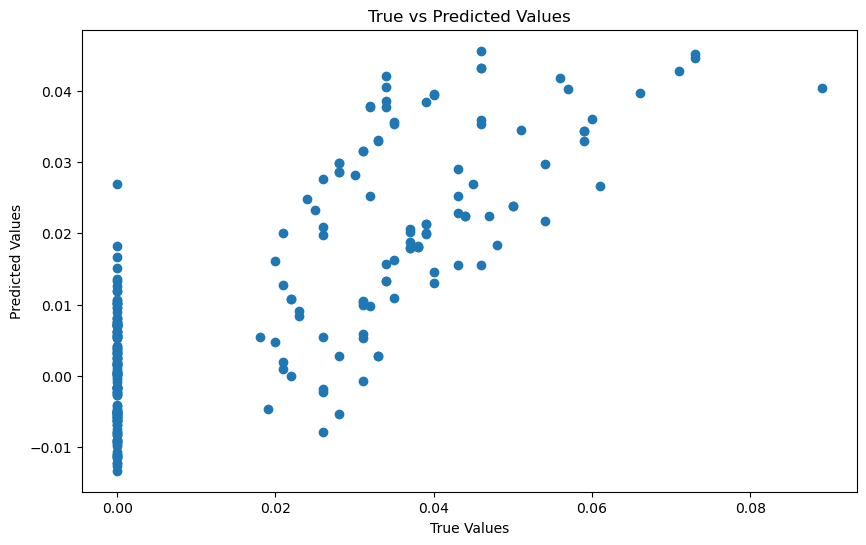

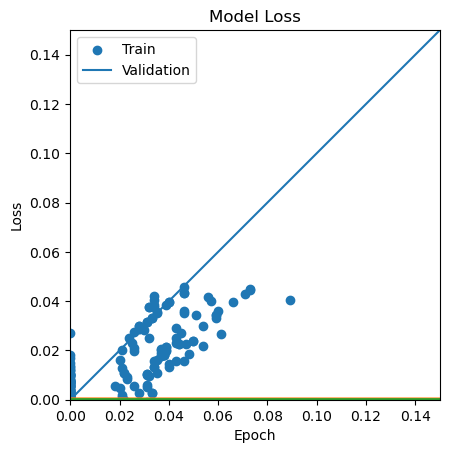

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 6s 48ms/step - loss: 0.0019 - val_loss: 1.2044e-04 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 2s 39ms/step - loss: 9.9929e-04 - val_loss: 1.8182e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 2s 39ms/step - loss: 7.2883e-04 - val_loss: 1.3474e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 2s 40ms/step - loss: 6.0108e-04 - val_loss: 1.4133e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 2s 41ms/step - loss: 5.2476e-04 - val_loss: 1.1308e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 2s 40ms/step - loss: 5.5191e-04 - val_loss: 1.1456e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 2s 40ms/step - loss: 4.8053e-04 - val_loss: 1.0909e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 2s 42ms/step - loss: 4.4671e-04 - val_loss: 1.2865e-04 - lr: 1.0000e-04
Epoc

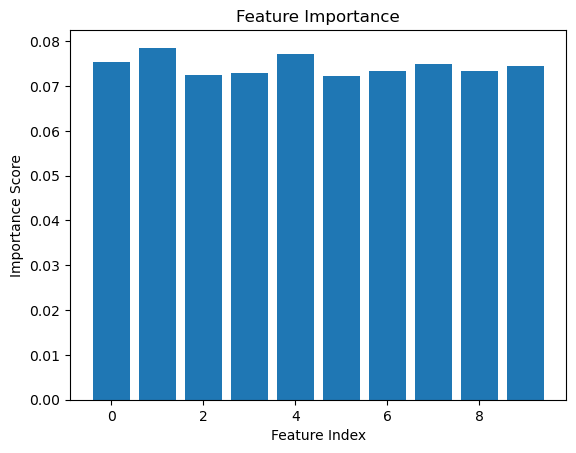

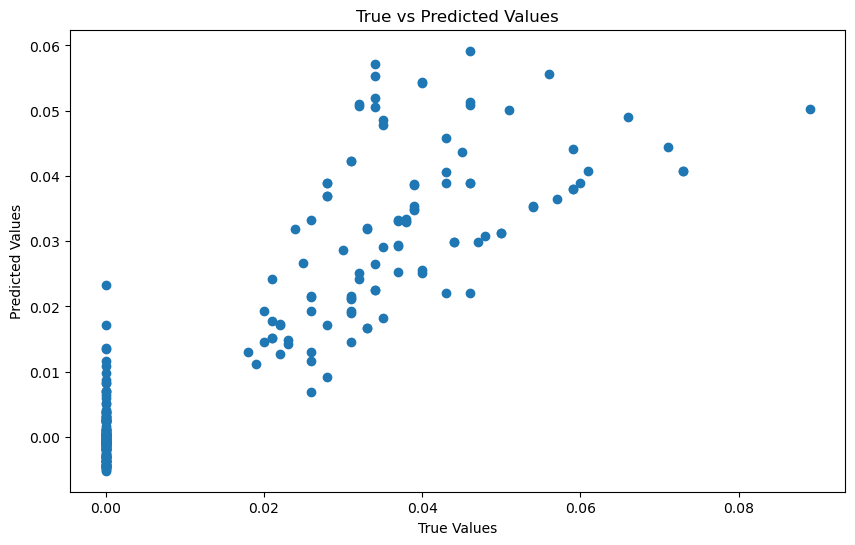

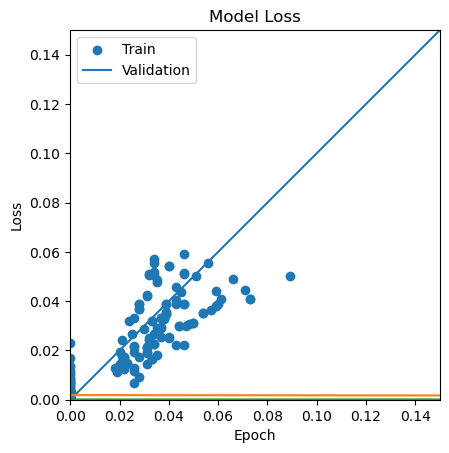

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 5s 47ms/step - loss: 0.0045 - val_loss: 0.0024 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 2s 40ms/step - loss: 0.0020 - val_loss: 6.2347e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 2s 40ms/step - loss: 0.0013 - val_loss: 5.0494e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 3s 43ms/step - loss: 9.6877e-04 - val_loss: 5.1342e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 3s 43ms/step - loss: 7.9780e-04 - val_loss: 4.5596e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 3s 43ms/step - loss: 7.3474e-04 - val_loss: 3.0968e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 3s 44ms/step - loss: 6.2402e-04 - val_loss: 2.6396e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 3s 44ms/step - loss: 5.9694e-04 - val_loss: 2.4734e-04 - lr: 1.0000e-04
Epoch 9/200
59/5

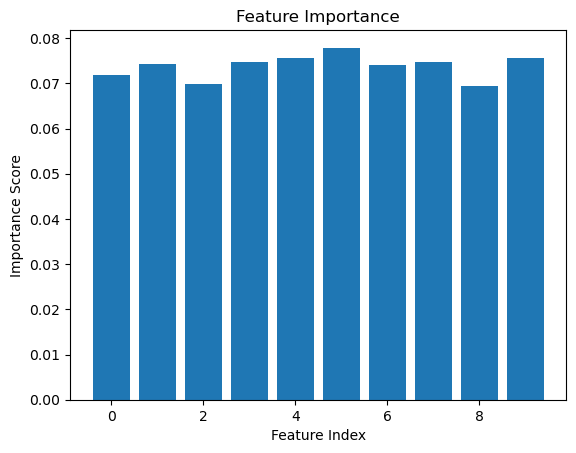

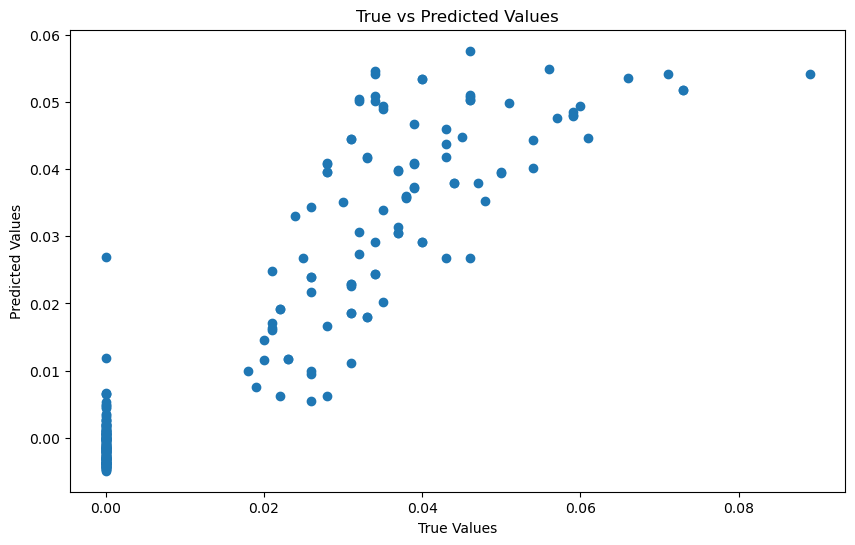

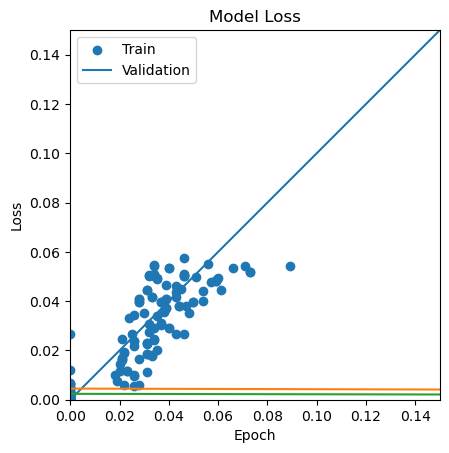

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 6s 53ms/step - loss: 0.0067 - val_loss: 2.7978e-04 - lr: 1.0000e-04
Epoch 2/200
59/59 [==============================] - 3s 44ms/step - loss: 0.0025 - val_loss: 2.7537e-04 - lr: 1.0000e-04
Epoch 3/200
59/59 [==============================] - 3s 44ms/step - loss: 0.0018 - val_loss: 1.8969e-04 - lr: 1.0000e-04
Epoch 4/200
59/59 [==============================] - 3s 43ms/step - loss: 0.0012 - val_loss: 1.1630e-04 - lr: 1.0000e-04
Epoch 5/200
59/59 [==============================] - 2s 42ms/step - loss: 0.0010 - val_loss: 2.2641e-04 - lr: 1.0000e-04
Epoch 6/200
59/59 [==============================] - 3s 44ms/step - loss: 8.8762e-04 - val_loss: 2.0654e-04 - lr: 1.0000e-04
Epoch 7/200
59/59 [==============================] - 3s 43ms/step - loss: 7.9492e-04 - val_loss: 1.6819e-04 - lr: 1.0000e-04
Epoch 8/200
59/59 [==============================] - 3s 44ms/step - loss: 7.2498e-04 - val_loss: 2.1955e-04 - lr: 1.0000e-04
Epoch 9/200
59/59 [=

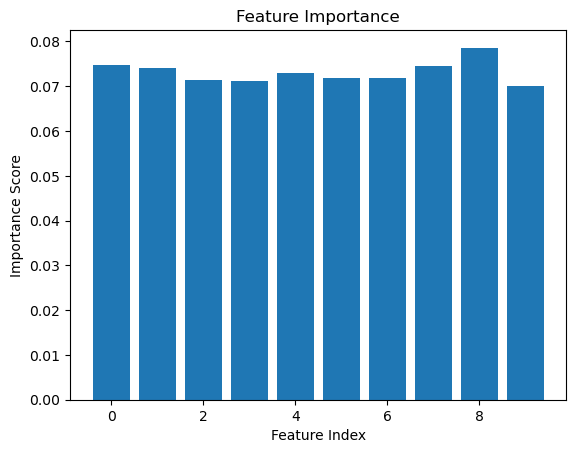

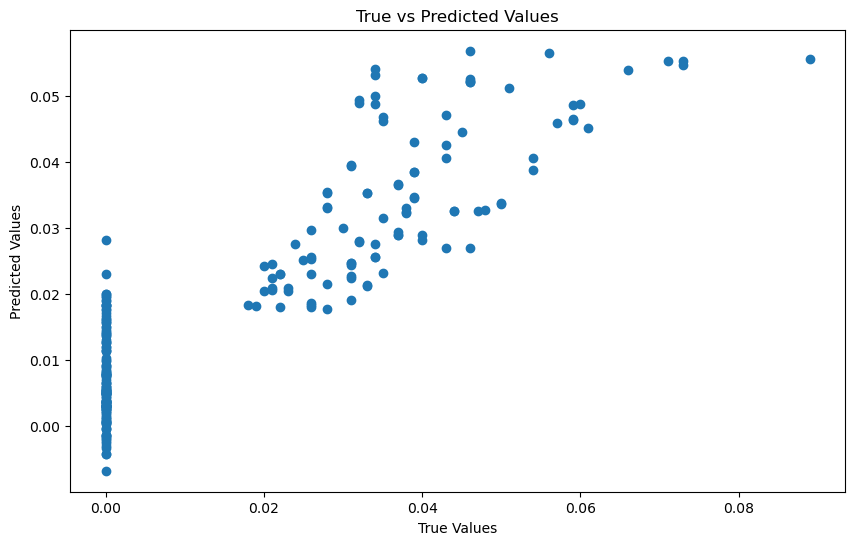

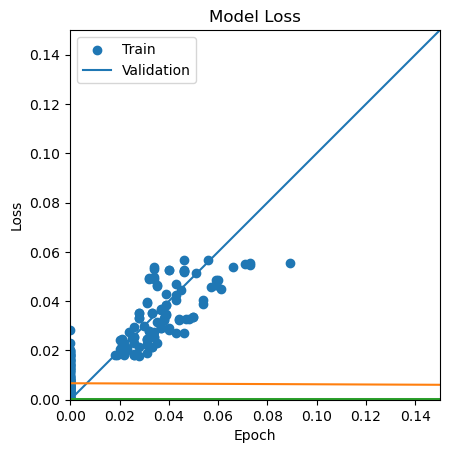

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 5s 62ms/step - loss: 4.9741e-04 - val_loss: 3.4002e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 42ms/step - loss: 3.1612e-04 - val_loss: 6.9147e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 42ms/step - loss: 2.9100e-04 - val_loss: 3.9674e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 49ms/step - loss: 2.6964e-04 - val_loss: 4.6774e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 3s 95ms/step - loss: 2.5365e-04 - val_loss: 2.2119e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 2s 68ms/step - loss: 2.4791e-04 - val_loss: 2.3912e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 50ms/step - loss: 2.4184e-04 - val_loss: 3.0325e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 2s 63ms/step - loss: 2.2229e-04 - val_loss: 2.4489e-04 - lr: 1.0000e-04


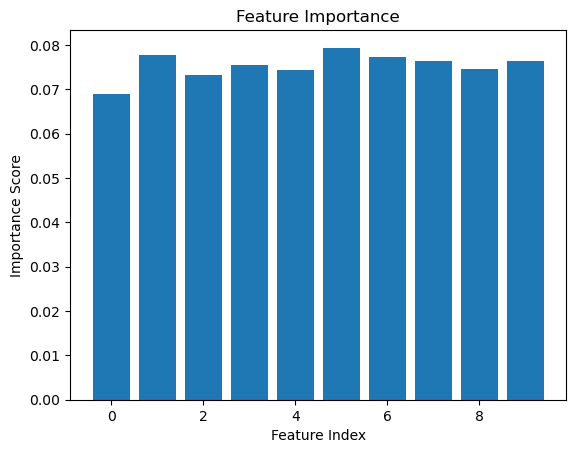

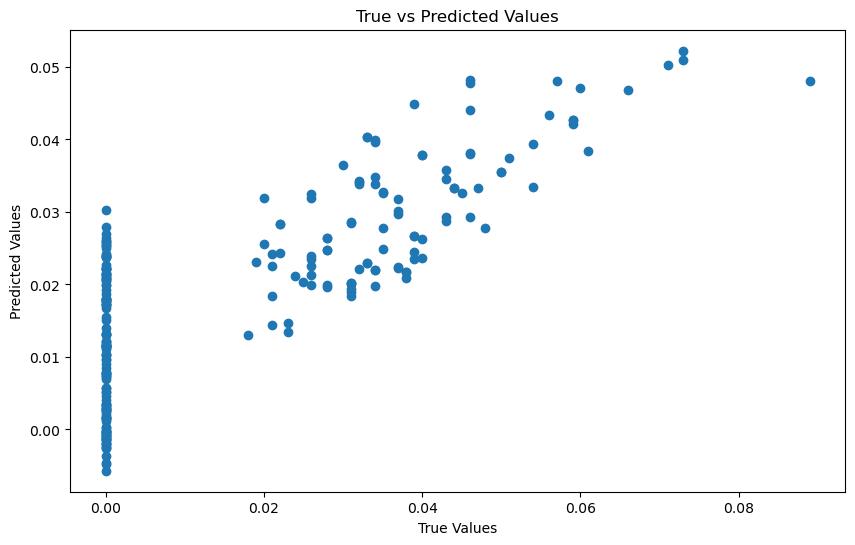

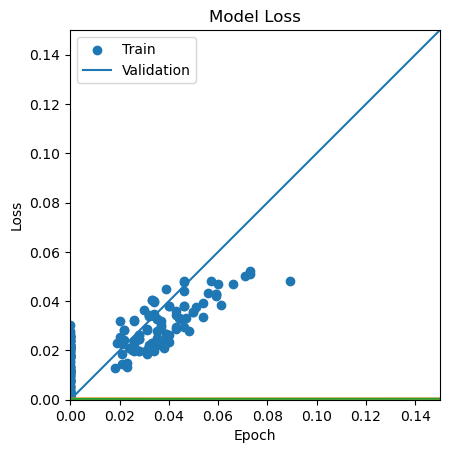

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 7s 91ms/step - loss: 0.0014 - val_loss: 4.4122e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 50ms/step - loss: 9.9070e-04 - val_loss: 6.0041e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 31ms/step - loss: 7.5362e-04 - val_loss: 6.0686e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 30ms/step - loss: 6.0942e-04 - val_loss: 5.0456e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 29ms/step - loss: 5.9838e-04 - val_loss: 3.5147e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 2s 52ms/step - loss: 5.4448e-04 - val_loss: 2.6635e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 38ms/step - loss: 5.1958e-04 - val_loss: 2.8007e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 2s 82ms/step - loss: 4.8152e-04 - val_loss: 2.2468e-04 - lr: 1.0000e-04
Epoc

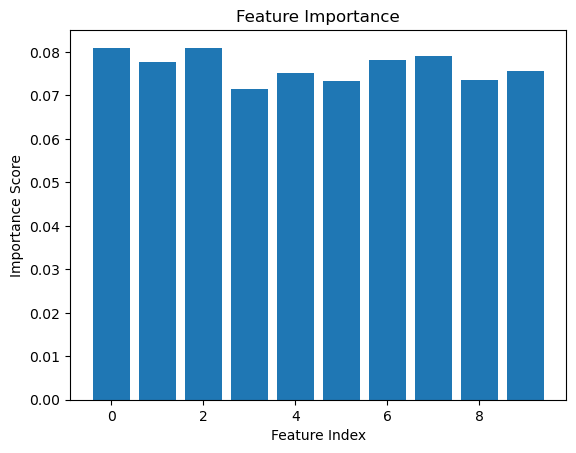

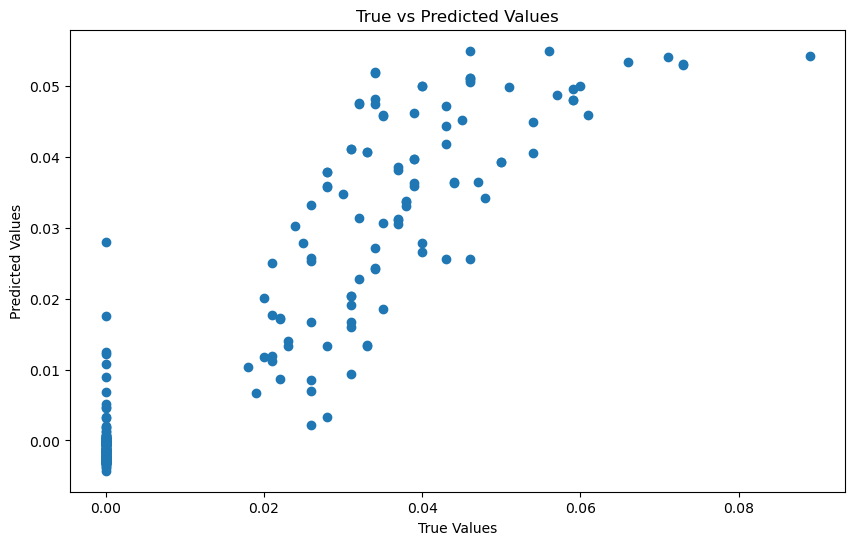

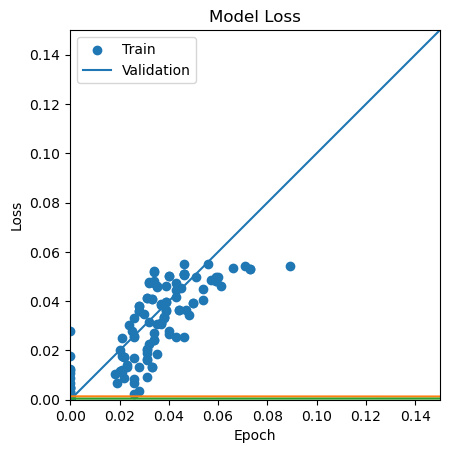

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 41ms/step - loss: 0.0034 - val_loss: 3.3870e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0017 - val_loss: 2.2660e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 28ms/step - loss: 0.0013 - val_loss: 1.5102e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 27ms/step - loss: 0.0011 - val_loss: 1.4642e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 28ms/step - loss: 9.8725e-04 - val_loss: 1.7139e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 28ms/step - loss: 8.7638e-04 - val_loss: 1.2866e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 27ms/step - loss: 6.8223e-04 - val_loss: 1.4368e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 27ms/step - loss: 7.3232e-04 - val_loss: 1.0796e-04 - lr: 1.0000e-04
Epoch 9/200
30/3

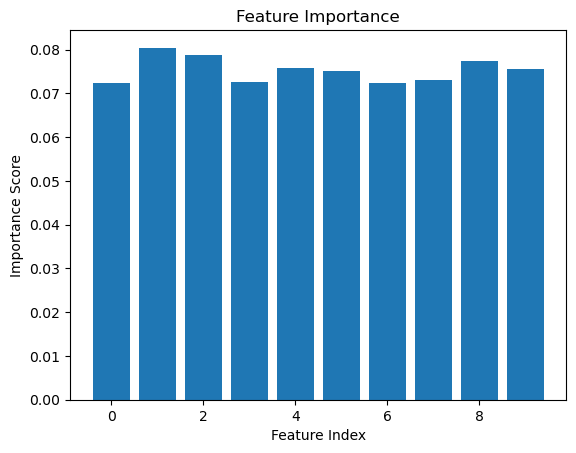

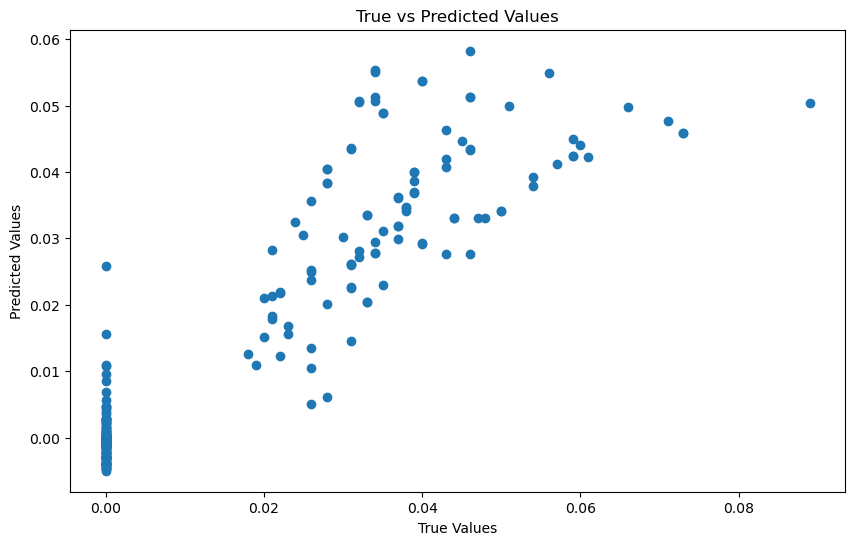

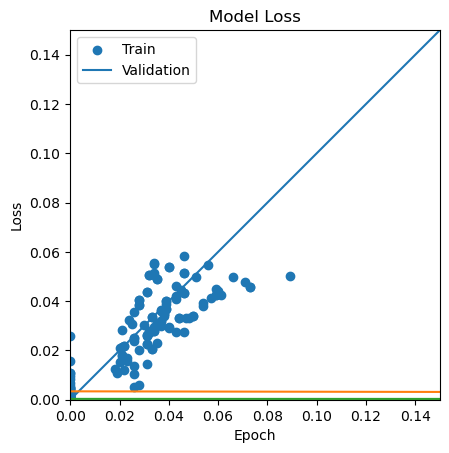

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 2s 27ms/step - loss: 0.0088 - val_loss: 7.3437e-04 - lr: 1.0000e-04
Epoch 2/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0050 - val_loss: 3.7398e-04 - lr: 1.0000e-04
Epoch 3/200
30/30 [==============================] - 1s 20ms/step - loss: 0.0030 - val_loss: 2.0190e-04 - lr: 1.0000e-04
Epoch 4/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0021 - val_loss: 1.9860e-04 - lr: 1.0000e-04
Epoch 5/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0016 - val_loss: 1.9531e-04 - lr: 1.0000e-04
Epoch 6/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0013 - val_loss: 1.9743e-04 - lr: 1.0000e-04
Epoch 7/200
30/30 [==============================] - 1s 19ms/step - loss: 0.0010 - val_loss: 2.0886e-04 - lr: 1.0000e-04
Epoch 8/200
30/30 [==============================] - 1s 19ms/step - loss: 9.5914e-04 - val_loss: 1.9952e-04 - lr: 1.0000e-04
Epoch 9/200
30/30 [=========

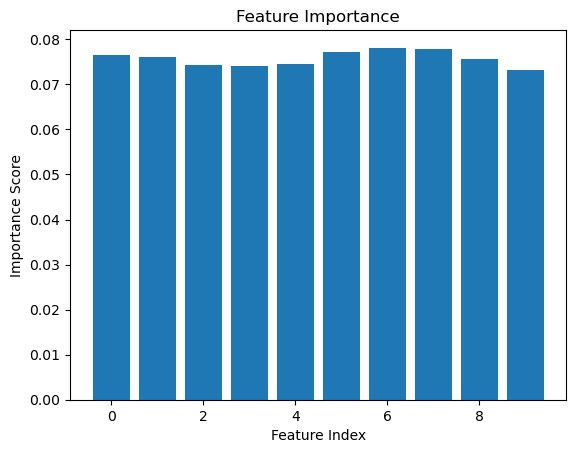

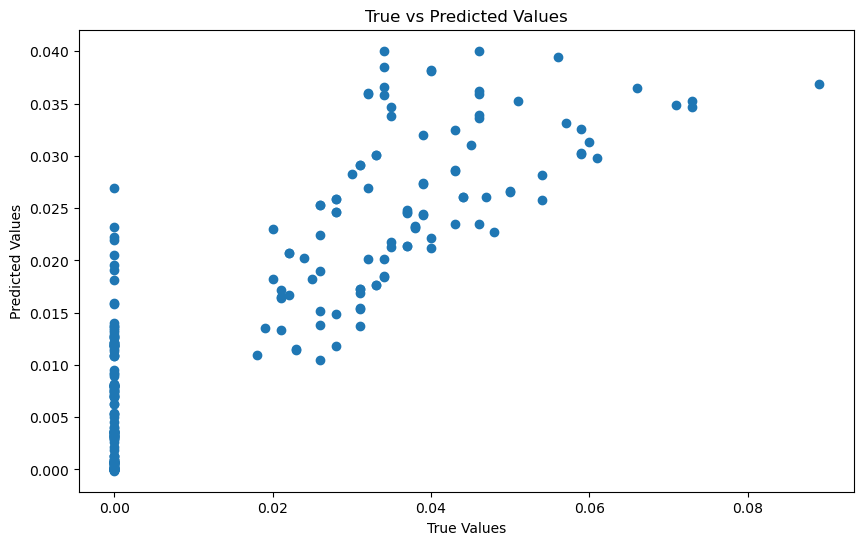

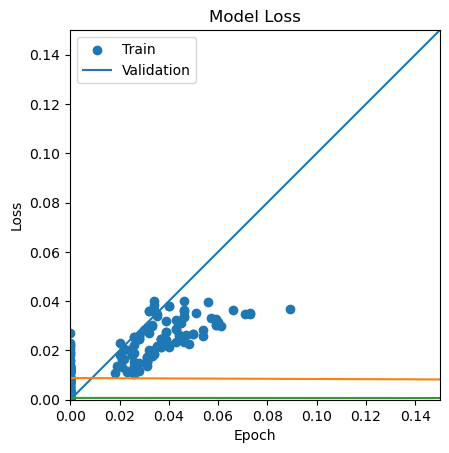

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 4s 20ms/step - loss: 8.8401e-04 - val_loss: 7.5549e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 2s 18ms/step - loss: 4.4320e-04 - val_loss: 4.1402e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 3s 21ms/step - loss: 3.9628e-04 - val_loss: 3.0475e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 4s 31ms/step - loss: 3.6626e-04 - val_loss: 3.1782e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 4s 31ms/step - loss: 3.3004e-04 - val_loss: 5.3445e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 4s 30ms/step - loss: 3.0961e-04 - val_loss: 5.1066e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 4s 31ms/step - loss: 2.9179e-04 - val_loss: 2.7754e-04 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 4s 32ms/step - loss: 2.9323e-04 - val_loss: 5.3632e-04 - lr: 0.0010
Epoch 9/200
118/

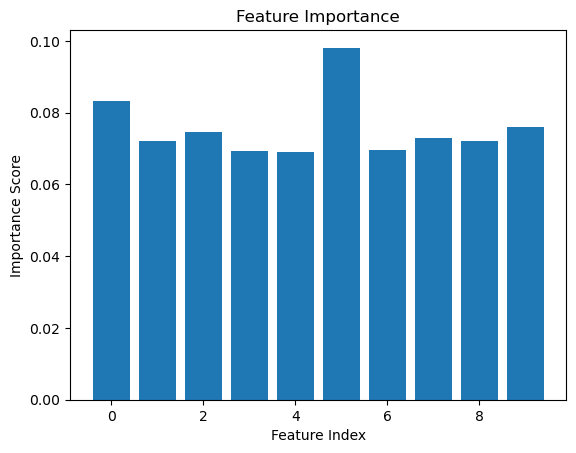

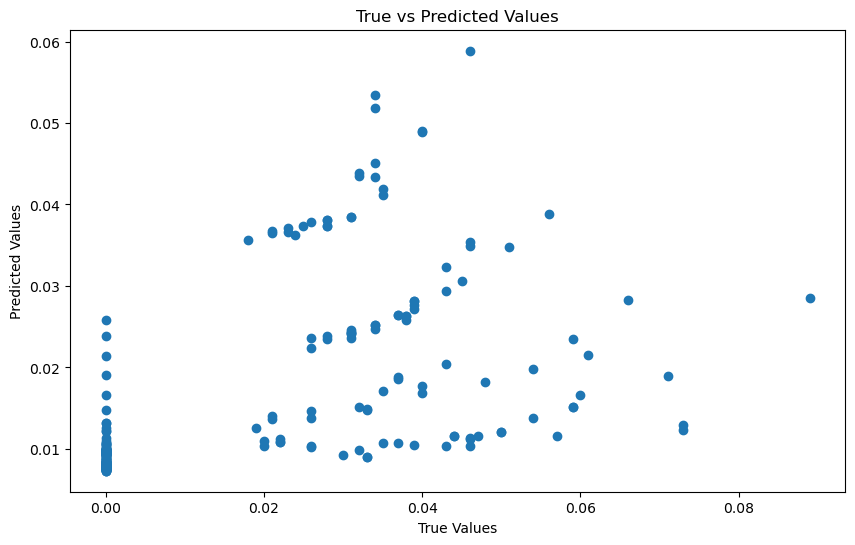

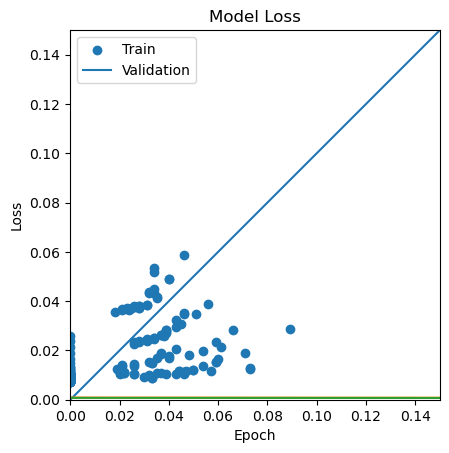

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 36ms/step - loss: 0.0015 - val_loss: 1.3686e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 4s 33ms/step - loss: 5.4392e-04 - val_loss: 2.2816e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 4s 33ms/step - loss: 4.7098e-04 - val_loss: 1.4800e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 4s 33ms/step - loss: 4.4229e-04 - val_loss: 2.6596e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 4s 33ms/step - loss: 3.8710e-04 - val_loss: 2.5581e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 4s 33ms/step - loss: 3.8161e-04 - val_loss: 3.2457e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 4s 32ms/step - loss: 3.5399e-04 - val_loss: 1.7998e-04 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 4s 32ms/step - loss: 3.3209e-04 - val_loss: 1.9606e-04 - lr: 0.0010
Epoch 9/200
118/118 

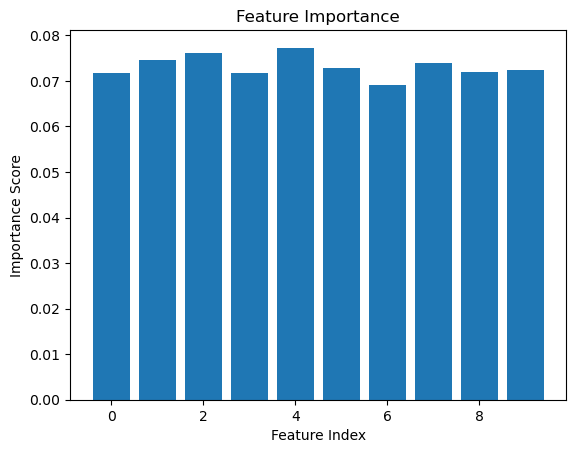

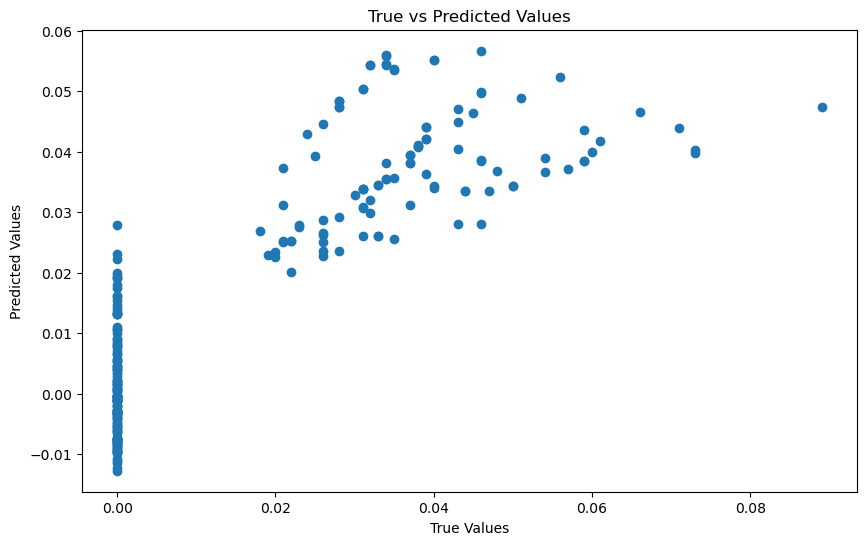

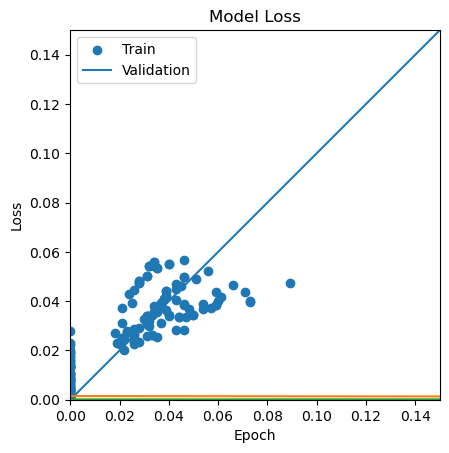

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 36ms/step - loss: 0.0013 - val_loss: 2.0762e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 4s 33ms/step - loss: 6.6083e-04 - val_loss: 2.0117e-04 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 4s 33ms/step - loss: 5.4154e-04 - val_loss: 1.0259e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 4s 33ms/step - loss: 4.7822e-04 - val_loss: 1.7052e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 4s 36ms/step - loss: 4.4471e-04 - val_loss: 1.0442e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 4s 33ms/step - loss: 3.9439e-04 - val_loss: 1.4058e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 4s 33ms/step - loss: 3.9479e-04 - val_loss: 1.6076e-04 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 4s 37ms/step - loss: 3.8947e-04 - val_loss: 2.3411e-04 - lr: 0.0010
Epoch 9/200
118/118 

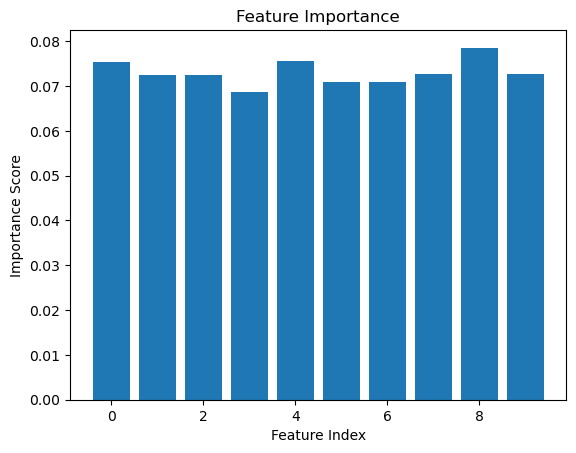

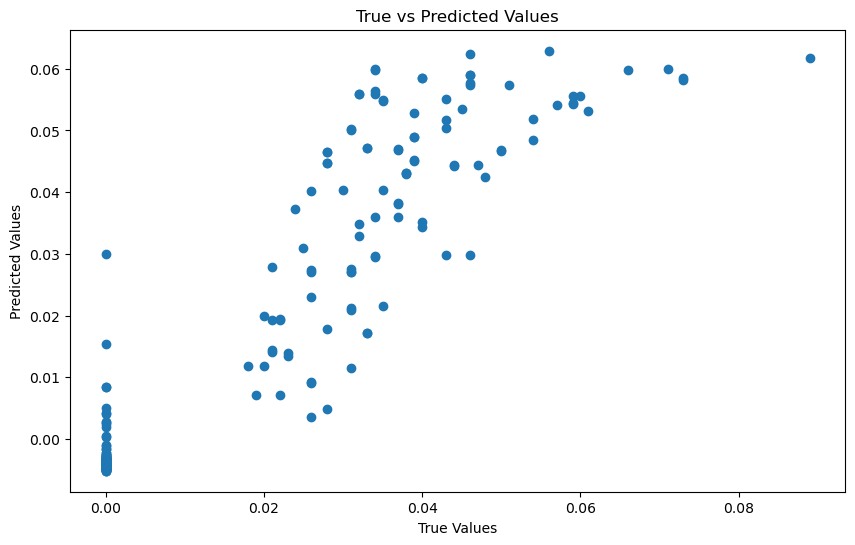

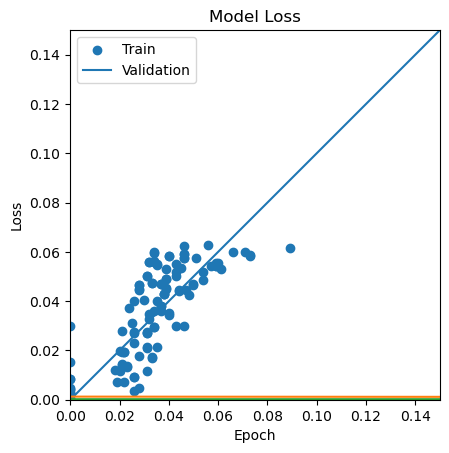

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 36ms/step - loss: 0.0021 - val_loss: 1.8290e-04 - lr: 0.0010
Epoch 2/200
118/118 [==============================] - 4s 33ms/step - loss: 7.4404e-04 - val_loss: 8.6365e-05 - lr: 0.0010
Epoch 3/200
118/118 [==============================] - 4s 32ms/step - loss: 6.0201e-04 - val_loss: 1.3859e-04 - lr: 0.0010
Epoch 4/200
118/118 [==============================] - 4s 33ms/step - loss: 5.2443e-04 - val_loss: 1.2266e-04 - lr: 0.0010
Epoch 5/200
118/118 [==============================] - 4s 32ms/step - loss: 4.9662e-04 - val_loss: 1.0343e-04 - lr: 0.0010
Epoch 6/200
118/118 [==============================] - 4s 33ms/step - loss: 4.3817e-04 - val_loss: 1.3351e-04 - lr: 0.0010
Epoch 7/200
118/118 [==============================] - 4s 33ms/step - loss: 4.5325e-04 - val_loss: 1.8331e-04 - lr: 0.0010
Epoch 8/200
118/118 [==============================] - 4s 34ms/step - loss: 3.9833e-04 - val_loss: 1.1952e-04 - lr: 0.0010
Epoch 9/200
118/118 

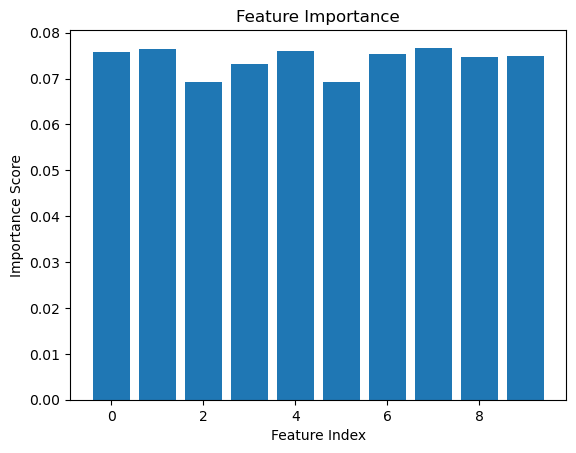

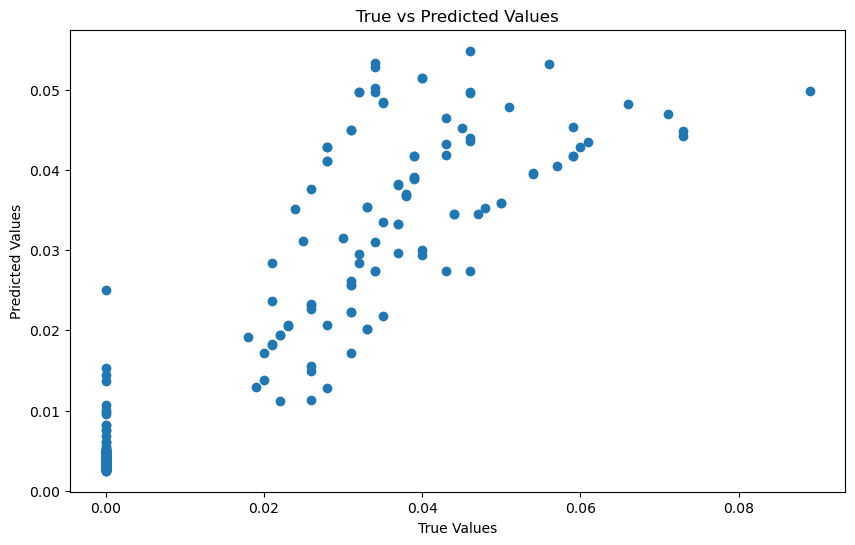

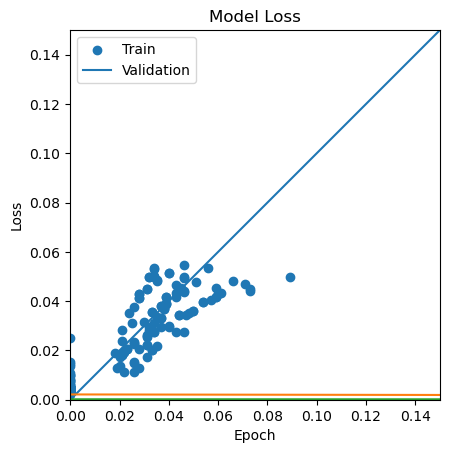

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 39ms/step - loss: 0.0013 - val_loss: 2.5685e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 2s 31ms/step - loss: 4.7257e-04 - val_loss: 2.0246e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 2s 31ms/step - loss: 4.4619e-04 - val_loss: 3.4594e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 2s 32ms/step - loss: 3.8869e-04 - val_loss: 2.1817e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 2s 31ms/step - loss: 3.5000e-04 - val_loss: 2.7315e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 2s 31ms/step - loss: 3.2411e-04 - val_loss: 7.9668e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 2s 34ms/step - loss: 3.1210e-04 - val_loss: 1.6480e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 2s 31ms/step - loss: 2.8329e-04 - val_loss: 9.3899e-05 - lr: 0.0010
Epoch 9/200
59/59 [=================

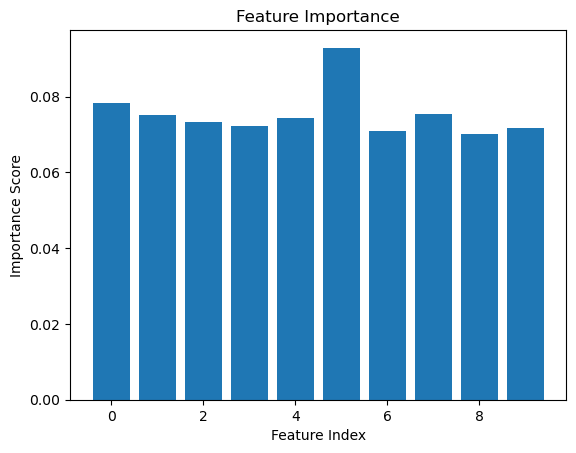

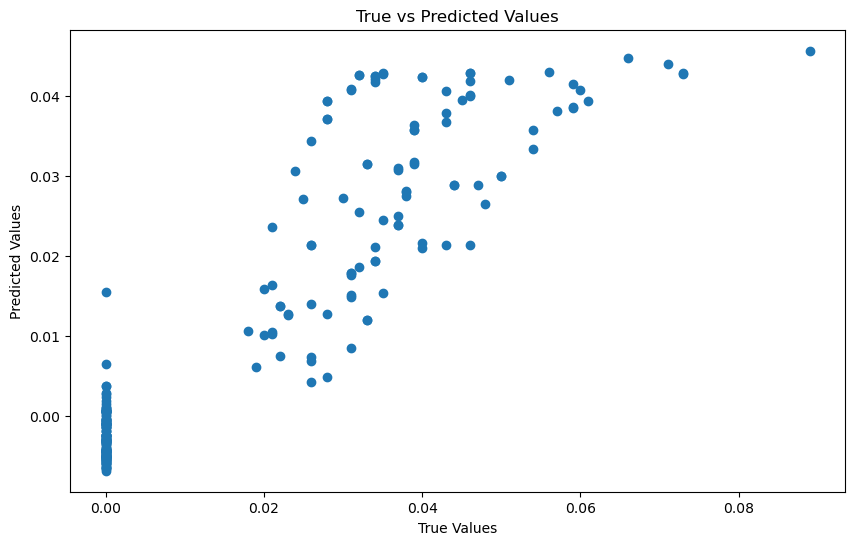

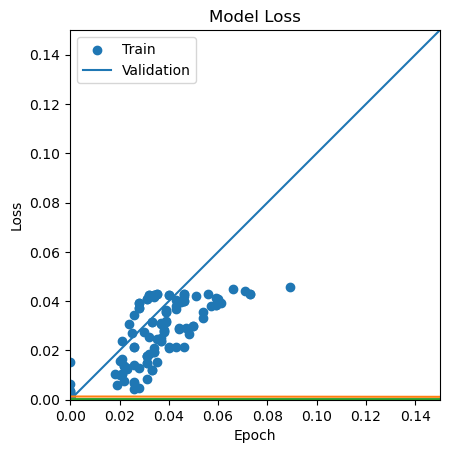

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 39ms/step - loss: 0.0016 - val_loss: 8.5992e-05 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 2s 32ms/step - loss: 5.7490e-04 - val_loss: 4.9115e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 2s 32ms/step - loss: 4.8946e-04 - val_loss: 2.3508e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 2s 32ms/step - loss: 4.3329e-04 - val_loss: 2.6696e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 2s 34ms/step - loss: 4.0829e-04 - val_loss: 1.7011e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 2s 33ms/step - loss: 3.8865e-04 - val_loss: 1.2941e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 2s 33ms/step - loss: 3.6304e-04 - val_loss: 1.3412e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 2s 33ms/step - loss: 3.5641e-04 - val_loss: 2.2508e-04 - lr: 0.0010
Epoch 9/200
59/59 [=================

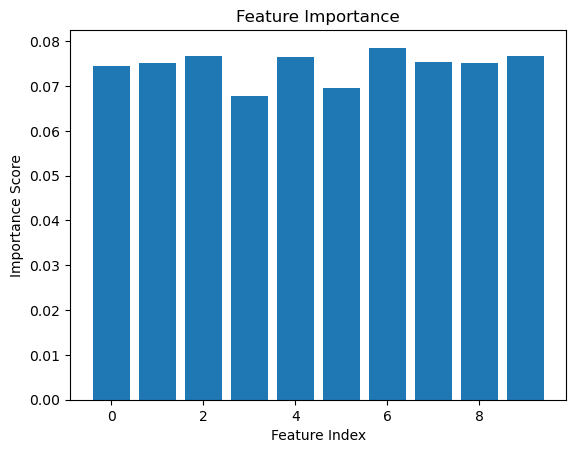

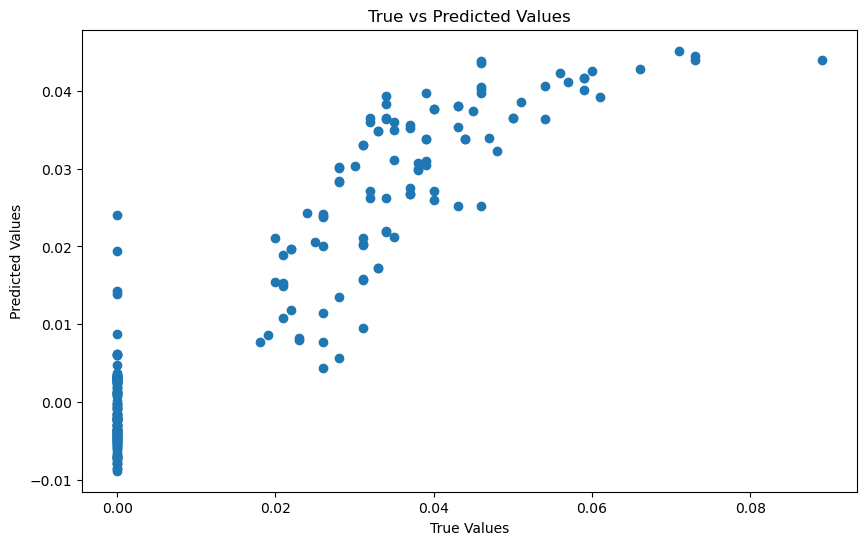

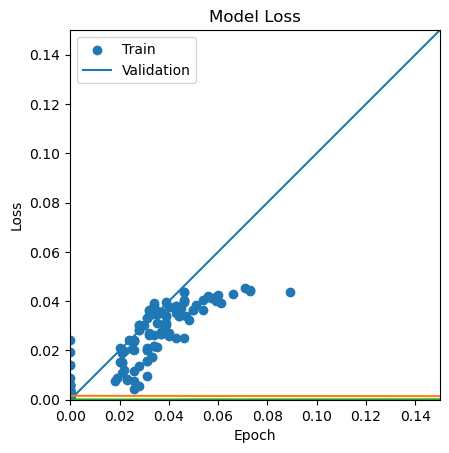

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 40ms/step - loss: 0.0017 - val_loss: 4.3921e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 2s 33ms/step - loss: 6.2897e-04 - val_loss: 1.6135e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 2s 32ms/step - loss: 5.3927e-04 - val_loss: 2.6219e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 2s 34ms/step - loss: 5.0658e-04 - val_loss: 1.5931e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 3s 46ms/step - loss: 4.4750e-04 - val_loss: 8.8596e-05 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 2s 39ms/step - loss: 4.3855e-04 - val_loss: 2.1926e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 4s 64ms/step - loss: 4.0288e-04 - val_loss: 1.3625e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 2s 29ms/step - loss: 3.8125e-04 - val_loss: 2.0556e-04 - lr: 0.0010
Epoch 9/200
59/59 [=================

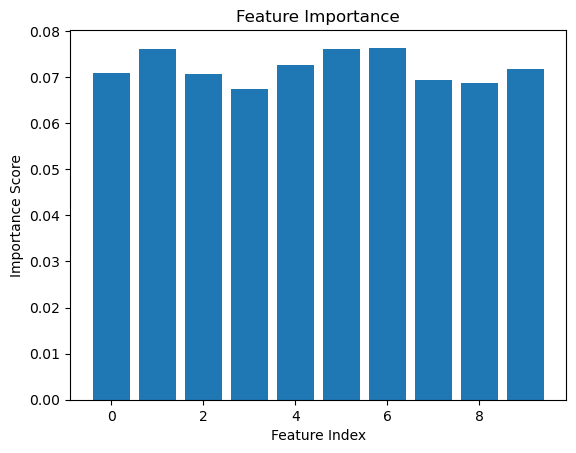

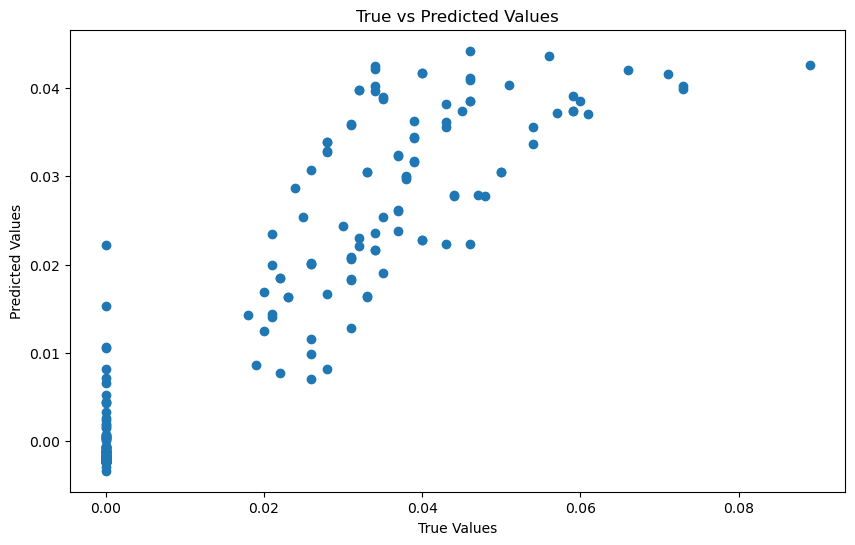

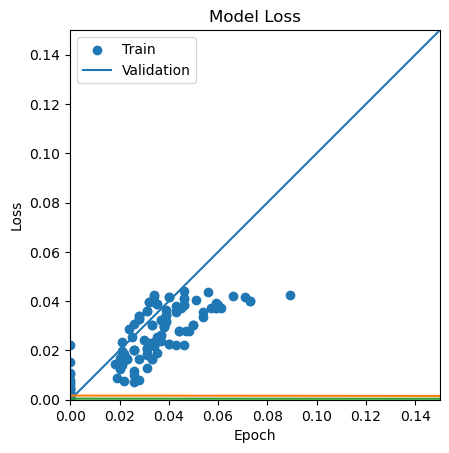

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 40ms/step - loss: 0.0027 - val_loss: 1.6567e-04 - lr: 0.0010
Epoch 2/200
59/59 [==============================] - 5s 83ms/step - loss: 7.6483e-04 - val_loss: 2.8918e-04 - lr: 0.0010
Epoch 3/200
59/59 [==============================] - 3s 53ms/step - loss: 6.7054e-04 - val_loss: 1.4854e-04 - lr: 0.0010
Epoch 4/200
59/59 [==============================] - 2s 39ms/step - loss: 5.6560e-04 - val_loss: 1.8565e-04 - lr: 0.0010
Epoch 5/200
59/59 [==============================] - 2s 35ms/step - loss: 5.1956e-04 - val_loss: 2.9404e-04 - lr: 0.0010
Epoch 6/200
59/59 [==============================] - 2s 35ms/step - loss: 4.7471e-04 - val_loss: 2.0307e-04 - lr: 0.0010
Epoch 7/200
59/59 [==============================] - 2s 36ms/step - loss: 4.4907e-04 - val_loss: 1.0416e-04 - lr: 0.0010
Epoch 8/200
59/59 [==============================] - 2s 35ms/step - loss: 4.3652e-04 - val_loss: 2.8511e-04 - lr: 0.0010
Epoch 9/200
59/59 [=================

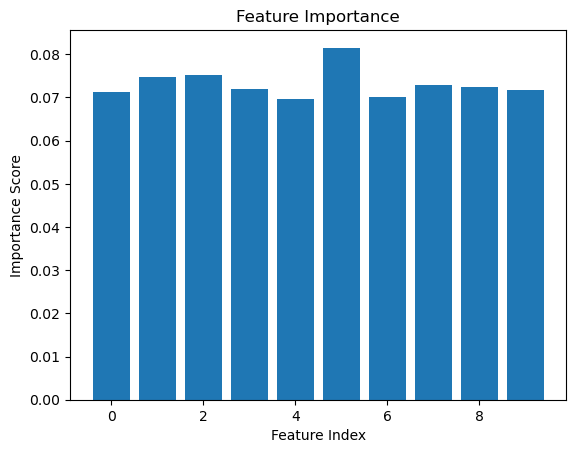

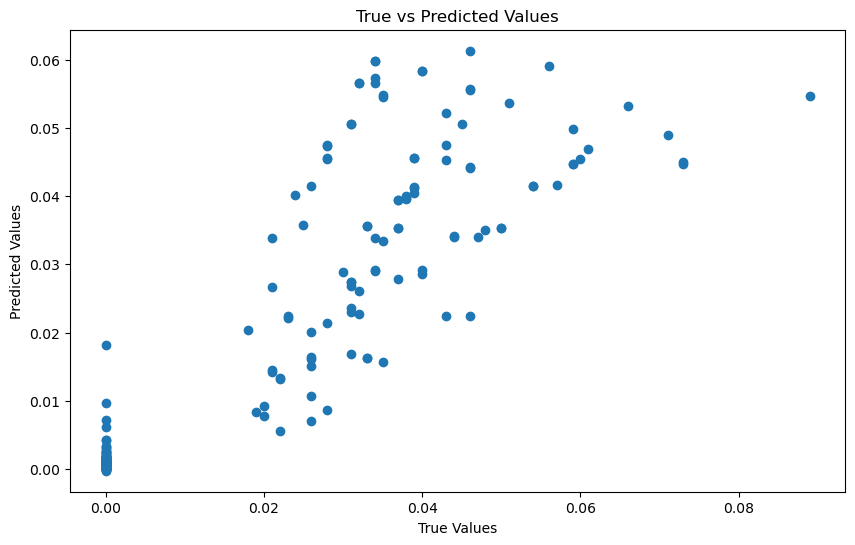

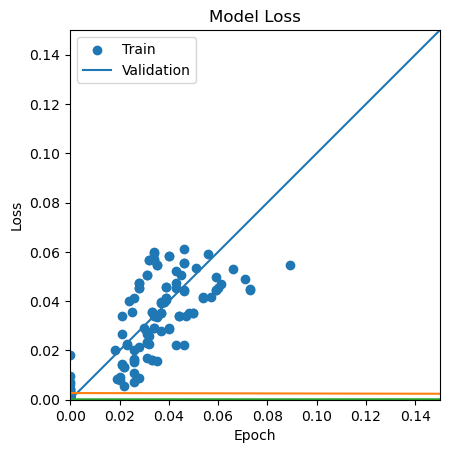

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 47ms/step - loss: 0.0034 - val_loss: 4.7651e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 34ms/step - loss: 5.7502e-04 - val_loss: 1.8411e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 34ms/step - loss: 5.1678e-04 - val_loss: 2.0192e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 32ms/step - loss: 4.8206e-04 - val_loss: 2.7168e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 33ms/step - loss: 4.0022e-04 - val_loss: 1.5315e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 34ms/step - loss: 4.0275e-04 - val_loss: 1.9670e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 38ms/step - loss: 3.7009e-04 - val_loss: 1.2517e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 33ms/step - loss: 3.2714e-04 - val_loss: 2.1678e-04 - lr: 0.0010
Epoch 9/200
30/30 [=================

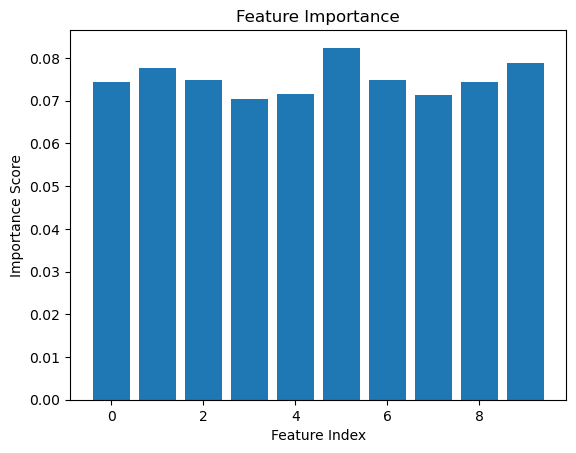

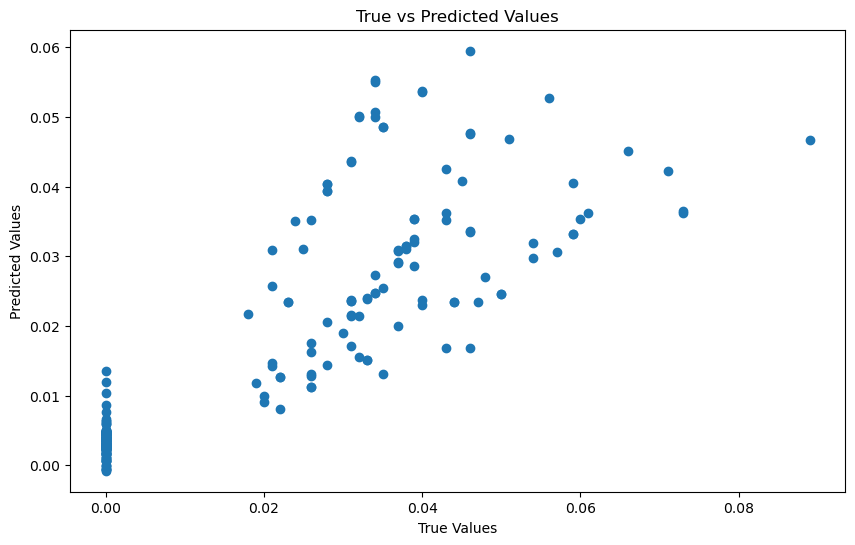

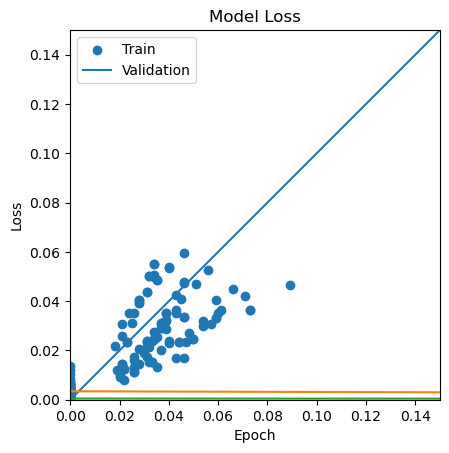

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 49ms/step - loss: 0.0016 - val_loss: 2.4360e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 38ms/step - loss: 6.9969e-04 - val_loss: 1.6128e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 34ms/step - loss: 5.7146e-04 - val_loss: 1.1341e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 34ms/step - loss: 5.0693e-04 - val_loss: 2.5049e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 35ms/step - loss: 4.4210e-04 - val_loss: 1.1908e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 37ms/step - loss: 4.5248e-04 - val_loss: 1.2531e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 34ms/step - loss: 4.1374e-04 - val_loss: 1.5778e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 35ms/step - loss: 3.7413e-04 - val_loss: 1.9660e-04 - lr: 0.0010
Epoch 9/200
30/30 [=================

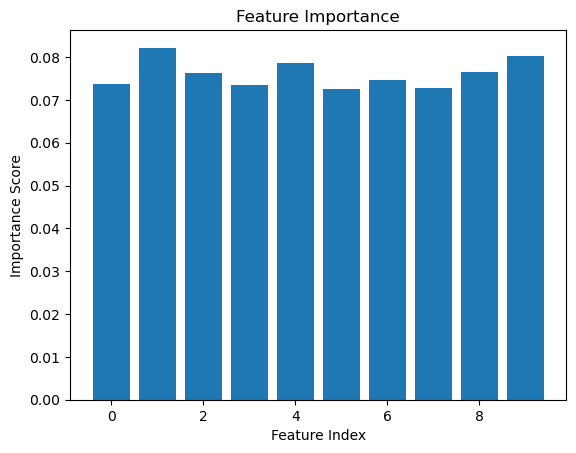

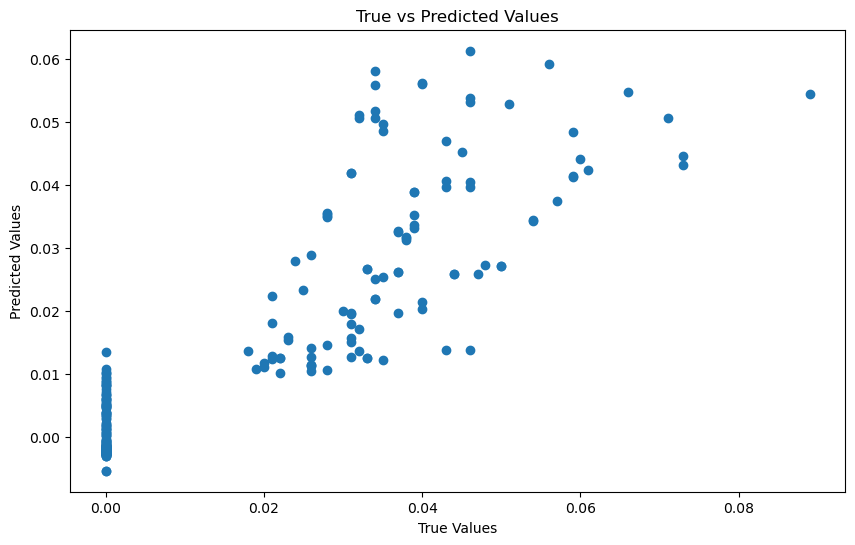

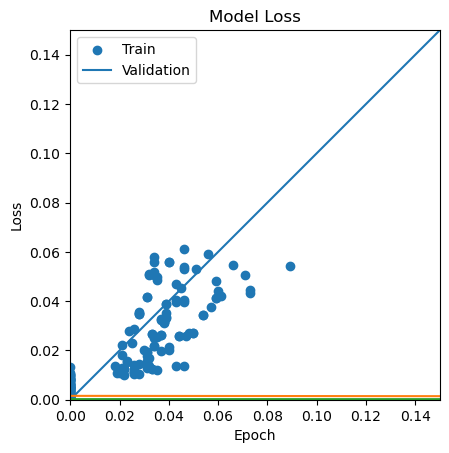

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 47ms/step - loss: 0.0016 - val_loss: 2.1239e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 35ms/step - loss: 7.0244e-04 - val_loss: 1.0264e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 33ms/step - loss: 5.9497e-04 - val_loss: 2.1751e-04 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 36ms/step - loss: 5.3308e-04 - val_loss: 1.6165e-04 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 35ms/step - loss: 4.9064e-04 - val_loss: 3.0044e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 35ms/step - loss: 5.0638e-04 - val_loss: 1.0332e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 35ms/step - loss: 4.2107e-04 - val_loss: 1.4200e-04 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 37ms/step - loss: 4.2460e-04 - val_loss: 2.3625e-04 - lr: 0.0010
Epoch 9/200
30/30 [=================

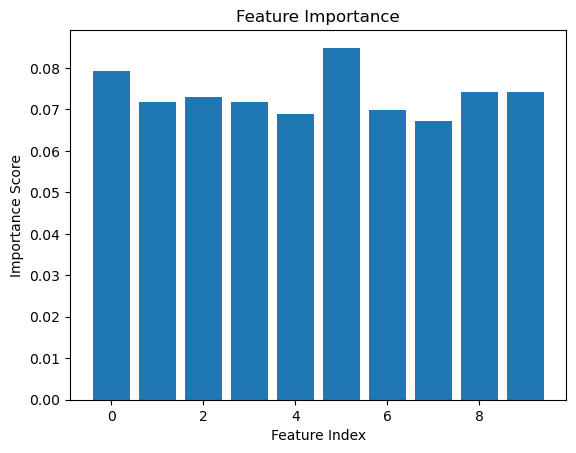

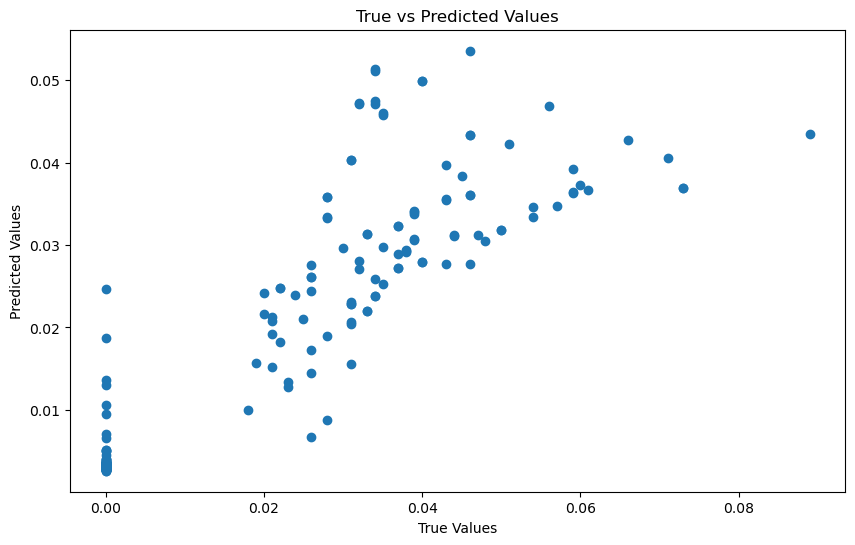

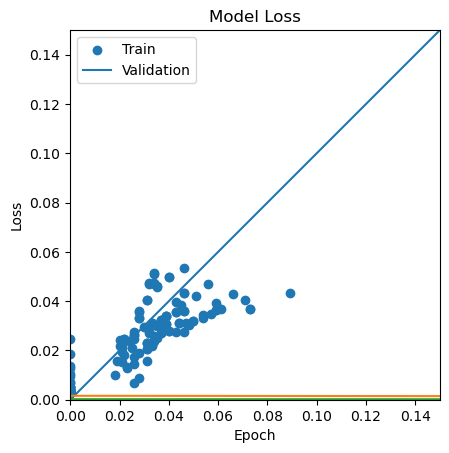

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 49ms/step - loss: 0.0024 - val_loss: 3.3180e-04 - lr: 0.0010
Epoch 2/200
30/30 [==============================] - 1s 37ms/step - loss: 8.6974e-04 - val_loss: 1.8369e-04 - lr: 0.0010
Epoch 3/200
30/30 [==============================] - 1s 36ms/step - loss: 7.1210e-04 - val_loss: 8.0275e-05 - lr: 0.0010
Epoch 4/200
30/30 [==============================] - 1s 36ms/step - loss: 5.5474e-04 - val_loss: 8.7966e-05 - lr: 0.0010
Epoch 5/200
30/30 [==============================] - 1s 34ms/step - loss: 5.1750e-04 - val_loss: 1.5884e-04 - lr: 0.0010
Epoch 6/200
30/30 [==============================] - 1s 34ms/step - loss: 4.8149e-04 - val_loss: 1.6674e-04 - lr: 0.0010
Epoch 7/200
30/30 [==============================] - 1s 36ms/step - loss: 4.6657e-04 - val_loss: 8.5838e-05 - lr: 0.0010
Epoch 8/200
30/30 [==============================] - 1s 35ms/step - loss: 4.5565e-04 - val_loss: 9.8083e-05 - lr: 0.0010
Epoch 9/200
30/30 [=================

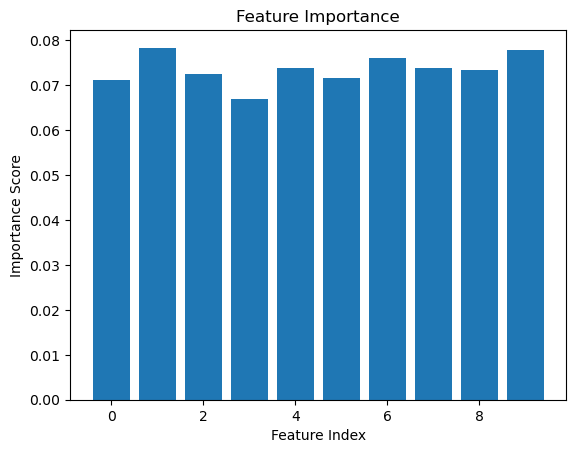

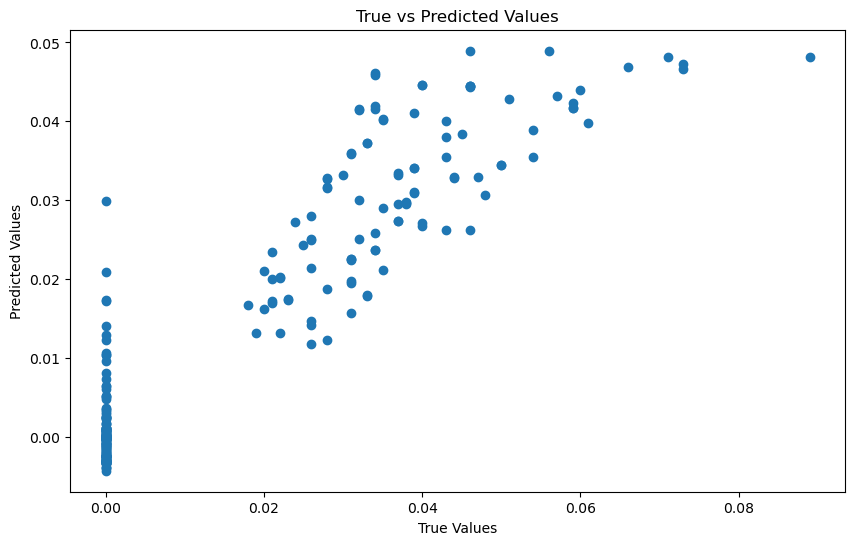

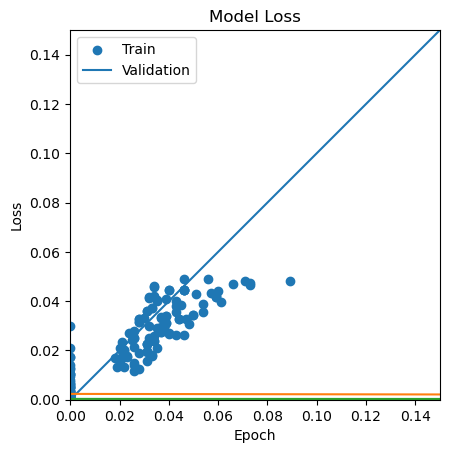

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 33ms/step - loss: 1.3477 - val_loss: 5.0196e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 4s 31ms/step - loss: 0.0010 - val_loss: 0.0039 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 4s 31ms/step - loss: 7.2911e-04 - val_loss: 1.8589e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 4s 30ms/step - loss: 5.7425e-04 - val_loss: 7.6749e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 4s 31ms/step - loss: 5.8001e-04 - val_loss: 1.0425e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 4s 30ms/step - loss: 4.9689e-04 - val_loss: 1.4382e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 4s 31ms/step - loss: 4.5519e-04 - val_loss: 6.1734e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 4s 31ms/step - loss: 4.8278e-04 - val_loss: 1.9627e-04 - lr: 0.0100
Epoch 9/200
118/118 [=======

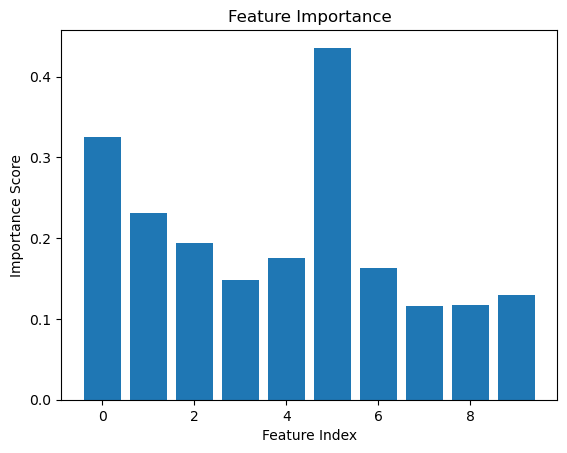

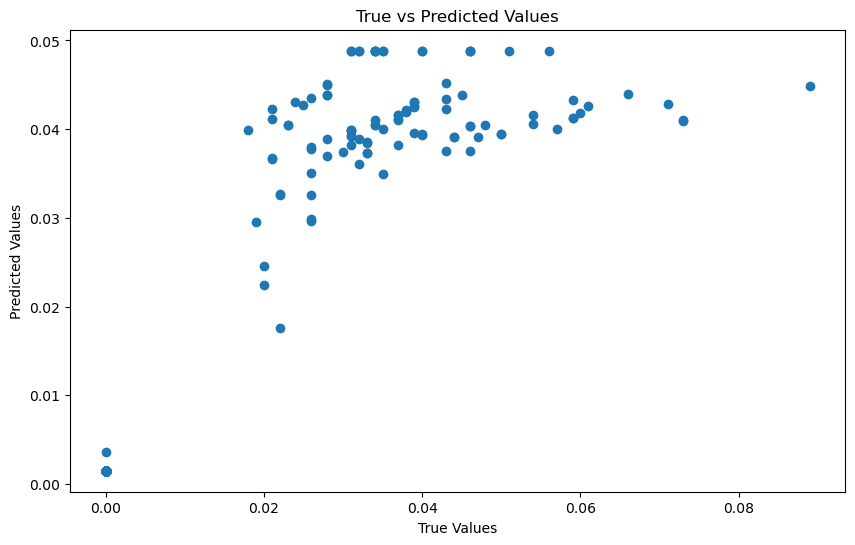

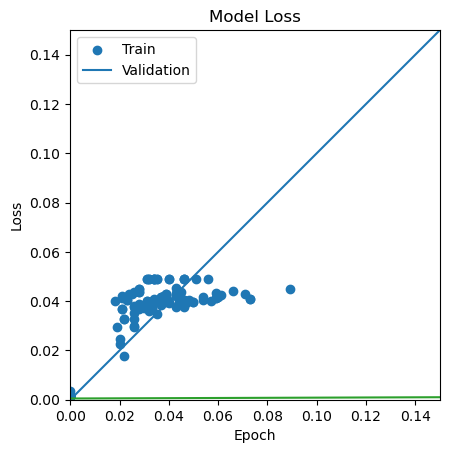

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 38ms/step - loss: 1.3322 - val_loss: 2.8539e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 4s 36ms/step - loss: 9.7686e-04 - val_loss: 8.1477e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 4s 34ms/step - loss: 8.3426e-04 - val_loss: 1.9255e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 4s 32ms/step - loss: 6.2957e-04 - val_loss: 1.1371e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 4s 33ms/step - loss: 6.1763e-04 - val_loss: 4.7585e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 4s 30ms/step - loss: 5.7265e-04 - val_loss: 4.3317e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 6s 48ms/step - loss: 6.0681e-04 - val_loss: 0.0014 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 5s 42ms/step - loss: 0.0013 - val_loss: 2.4183e-04 - lr: 0.0100
Epoch 9/200
118/118 [=======

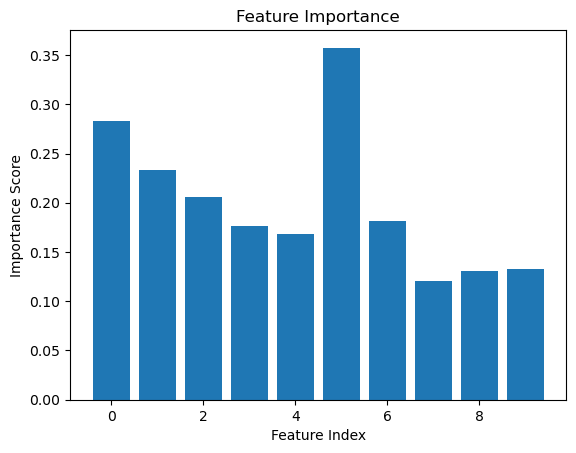

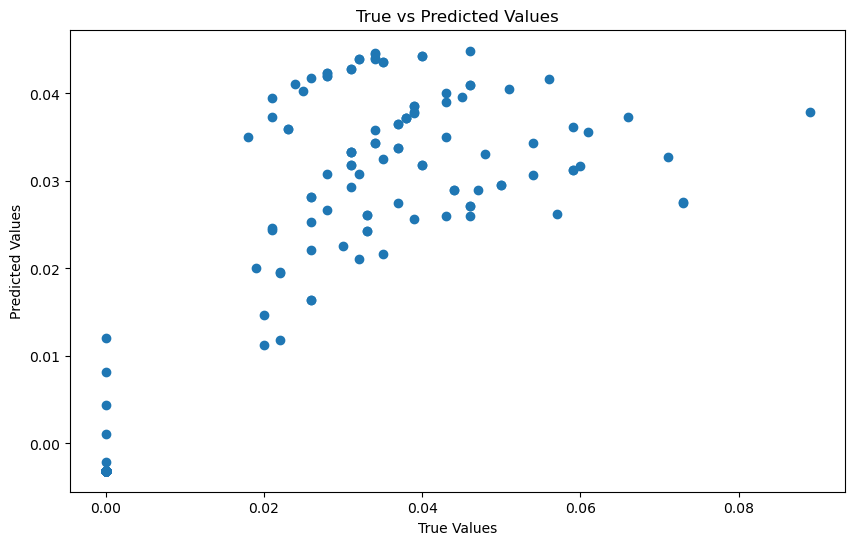

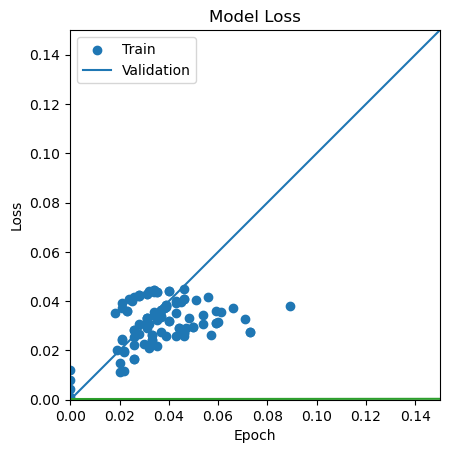

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 5s 31ms/step - loss: 0.6344 - val_loss: 7.6627e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 6s 49ms/step - loss: 9.7688e-04 - val_loss: 1.3334e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 4s 31ms/step - loss: 9.2534e-04 - val_loss: 1.2199e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 4s 31ms/step - loss: 6.8733e-04 - val_loss: 3.8617e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 4s 34ms/step - loss: 6.1430e-04 - val_loss: 1.6569e-04 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 2s 19ms/step - loss: 6.2752e-04 - val_loss: 2.9729e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 3s 24ms/step - loss: 6.6357e-04 - val_loss: 4.6343e-04 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 5s 45ms/step - loss: 6.1324e-04 - val_loss: 2.2137e-04 - lr: 0.0100
Epoch 9/200
118/118 

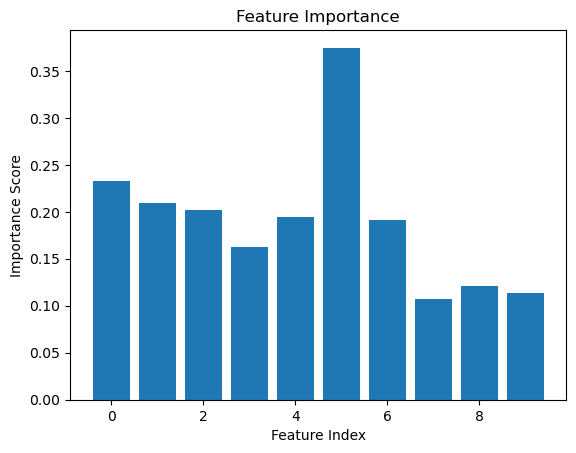

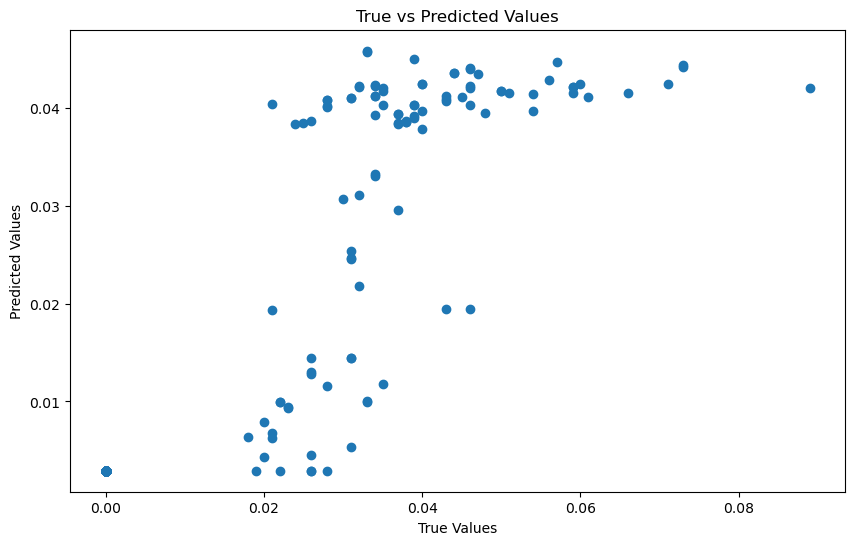

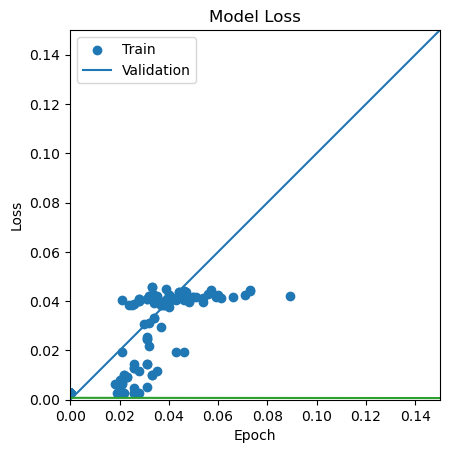

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 37ms/step - loss: 0.3929 - val_loss: 5.8239e-04 - lr: 0.0100
Epoch 2/200
118/118 [==============================] - 4s 33ms/step - loss: 0.0016 - val_loss: 3.7449e-04 - lr: 0.0100
Epoch 3/200
118/118 [==============================] - 4s 34ms/step - loss: 9.9999e-04 - val_loss: 2.3071e-04 - lr: 0.0100
Epoch 4/200
118/118 [==============================] - 4s 35ms/step - loss: 6.9390e-04 - val_loss: 6.5446e-04 - lr: 0.0100
Epoch 5/200
118/118 [==============================] - 4s 33ms/step - loss: 7.2139e-04 - val_loss: 8.1462e-05 - lr: 0.0100
Epoch 6/200
118/118 [==============================] - 4s 34ms/step - loss: 6.9636e-04 - val_loss: 2.3250e-04 - lr: 0.0100
Epoch 7/200
118/118 [==============================] - 4s 34ms/step - loss: 5.9584e-04 - val_loss: 0.0010 - lr: 0.0100
Epoch 8/200
118/118 [==============================] - 4s 34ms/step - loss: 6.4832e-04 - val_loss: 3.7527e-04 - lr: 0.0100
Epoch 9/200
118/118 [=======

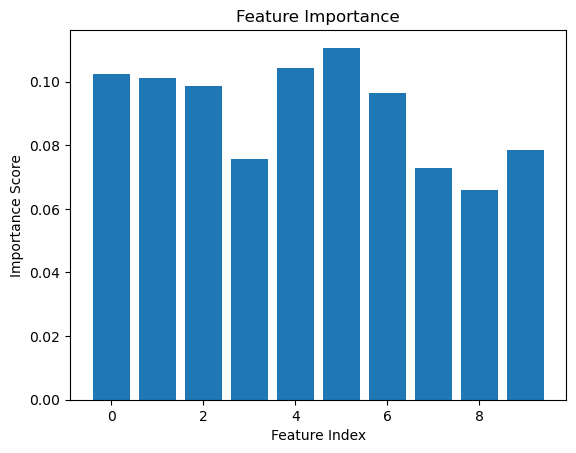

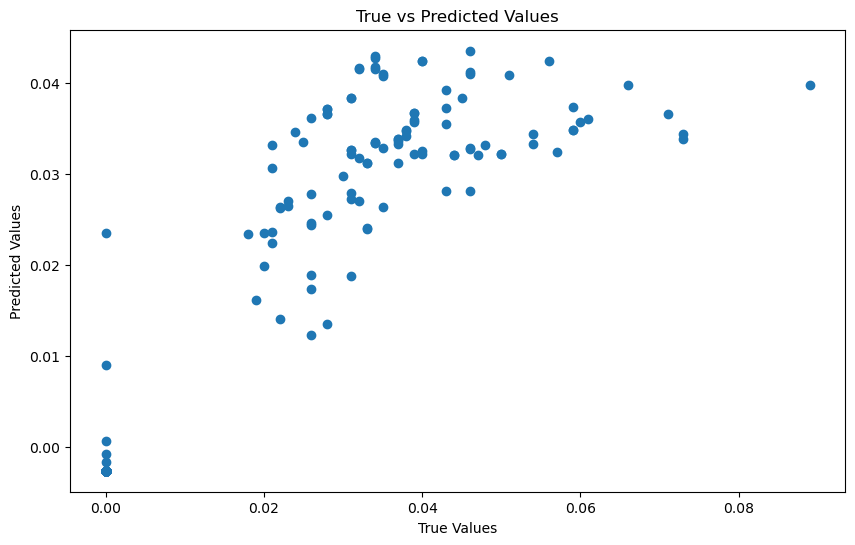

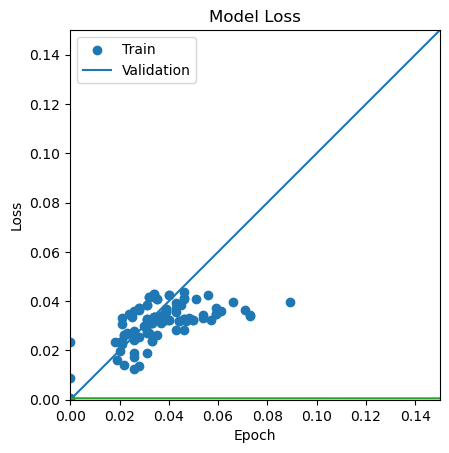

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 40ms/step - loss: 5.5804 - val_loss: 4.1315e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 2s 31ms/step - loss: 6.5942e-04 - val_loss: 4.4350e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 2s 32ms/step - loss: 7.3930e-04 - val_loss: 4.1870e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 2s 33ms/step - loss: 8.0848e-04 - val_loss: 1.9975e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 2s 34ms/step - loss: 7.8281e-04 - val_loss: 1.4824e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 2s 32ms/step - loss: 6.7040e-04 - val_loss: 1.3975e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 2s 33ms/step - loss: 5.4050e-04 - val_loss: 1.7634e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 2s 33ms/step - loss: 6.1937e-04 - val_loss: 4.4163e-04 - lr: 0.0100
Epoch 9/200
59/59 [=================

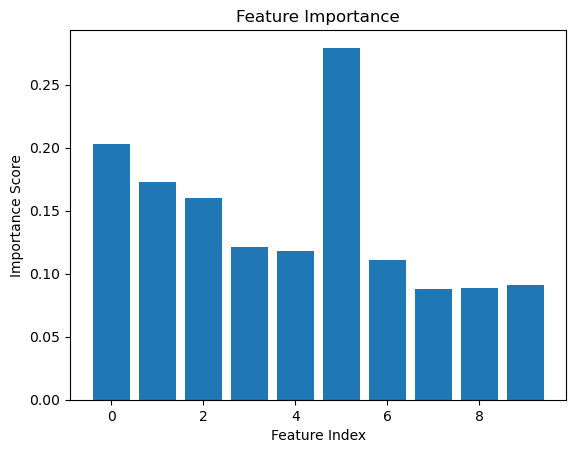

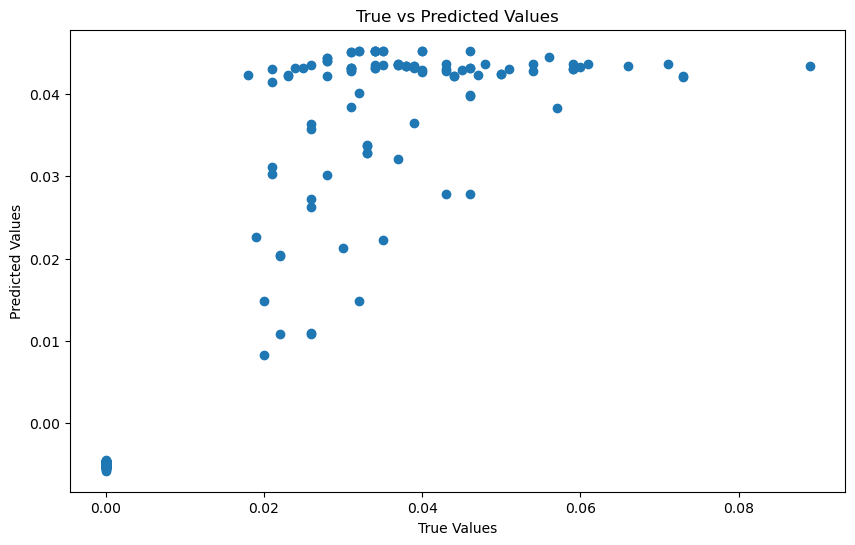

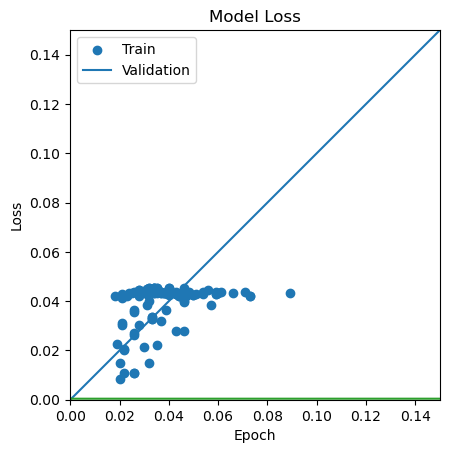

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 41ms/step - loss: 2.5161 - val_loss: 6.2411e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 2s 34ms/step - loss: 8.5598e-04 - val_loss: 1.2325e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 2s 35ms/step - loss: 7.8341e-04 - val_loss: 5.5719e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 2s 35ms/step - loss: 9.0486e-04 - val_loss: 2.4943e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 2s 33ms/step - loss: 7.0281e-04 - val_loss: 3.2982e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 2s 35ms/step - loss: 6.0682e-04 - val_loss: 6.8070e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 2s 34ms/step - loss: 5.6355e-04 - val_loss: 4.5845e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 2s 34ms/step - loss: 5.5805e-04 - val_loss: 9.7453e-05 - lr: 0.0100
Epoch 9/200
59/59 [=================

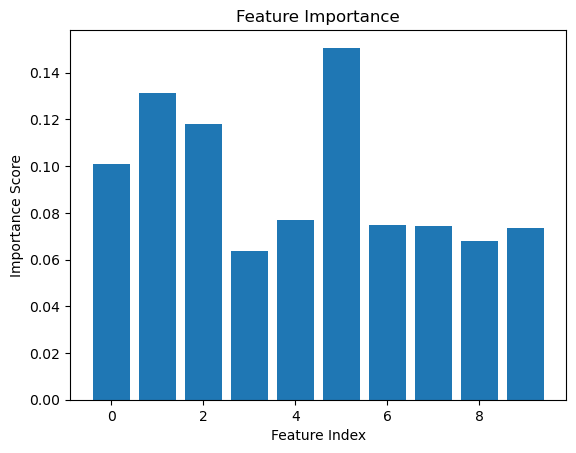

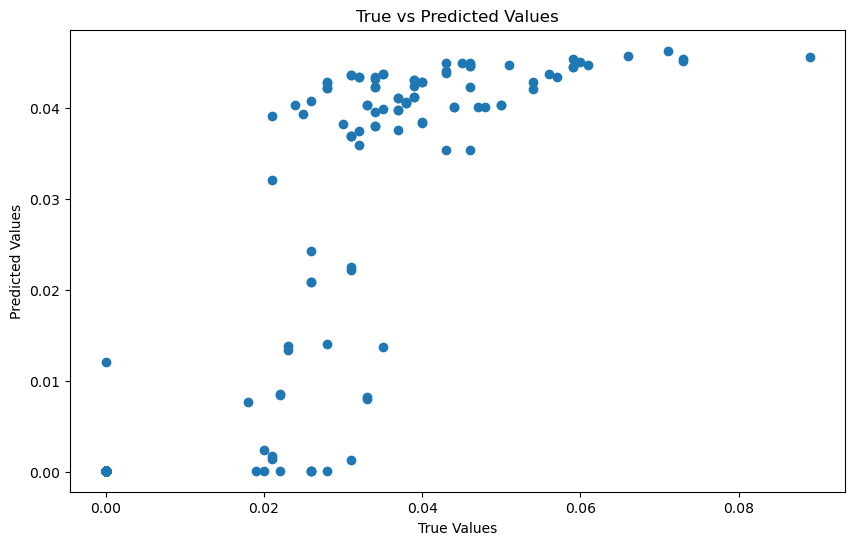

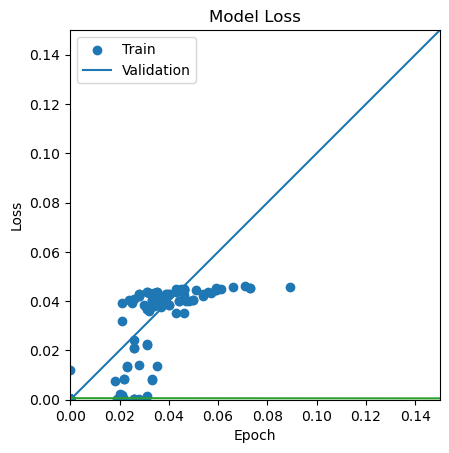

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 5s 42ms/step - loss: 0.5133 - val_loss: 5.1947e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 2s 33ms/step - loss: 9.8898e-04 - val_loss: 2.5212e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 2s 34ms/step - loss: 8.3760e-04 - val_loss: 2.1173e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 2s 36ms/step - loss: 8.8550e-04 - val_loss: 4.6292e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 2s 34ms/step - loss: 7.3171e-04 - val_loss: 7.0973e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 2s 34ms/step - loss: 6.3193e-04 - val_loss: 1.9340e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 2s 36ms/step - loss: 5.8869e-04 - val_loss: 3.2798e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 2s 34ms/step - loss: 5.3967e-04 - val_loss: 1.5285e-04 - lr: 0.0100
Epoch 9/200
59/59 [=================

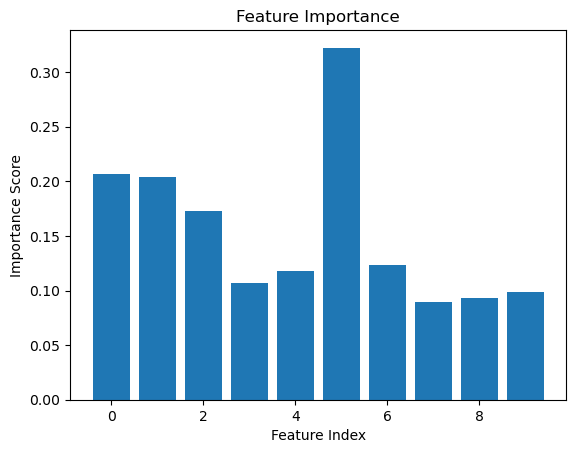

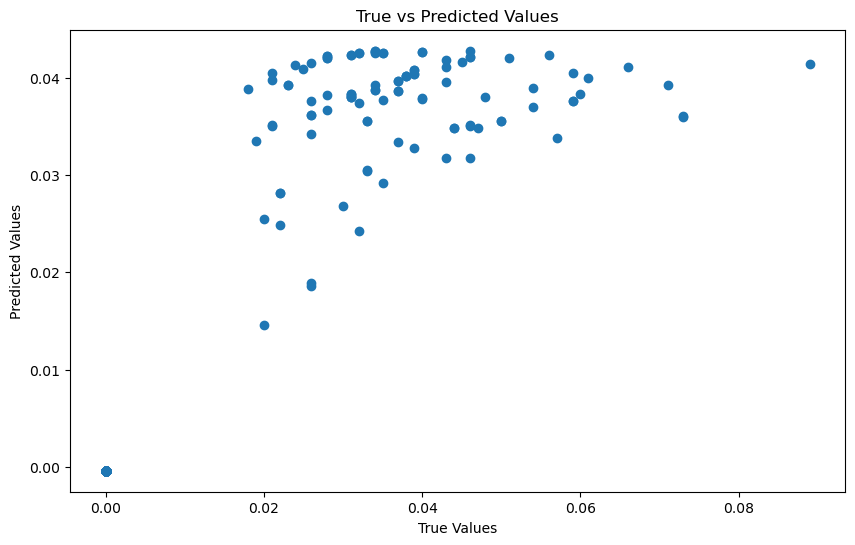

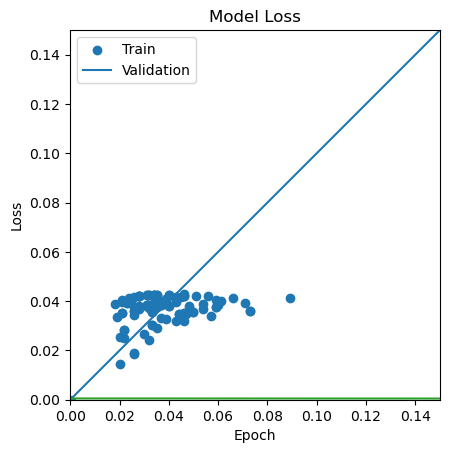

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 36ms/step - loss: 0.3781 - val_loss: 1.4183e-04 - lr: 0.0100
Epoch 2/200
59/59 [==============================] - 2s 29ms/step - loss: 0.0012 - val_loss: 3.9477e-04 - lr: 0.0100
Epoch 3/200
59/59 [==============================] - 2s 28ms/step - loss: 0.0012 - val_loss: 3.2961e-04 - lr: 0.0100
Epoch 4/200
59/59 [==============================] - 2s 36ms/step - loss: 0.0011 - val_loss: 4.6759e-04 - lr: 0.0100
Epoch 5/200
59/59 [==============================] - 2s 33ms/step - loss: 7.1957e-04 - val_loss: 2.9856e-04 - lr: 0.0100
Epoch 6/200
59/59 [==============================] - 2s 33ms/step - loss: 6.7584e-04 - val_loss: 1.3601e-04 - lr: 0.0100
Epoch 7/200
59/59 [==============================] - 2s 32ms/step - loss: 7.8293e-04 - val_loss: 3.1738e-04 - lr: 0.0100
Epoch 8/200
59/59 [==============================] - 2s 30ms/step - loss: 6.1738e-04 - val_loss: 1.0648e-04 - lr: 0.0100
Epoch 9/200
59/59 [=============================

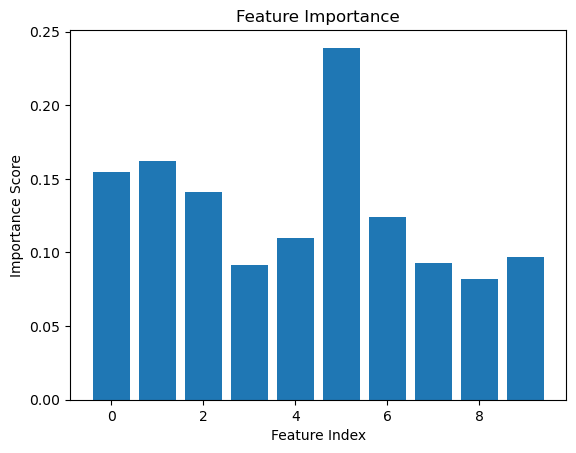

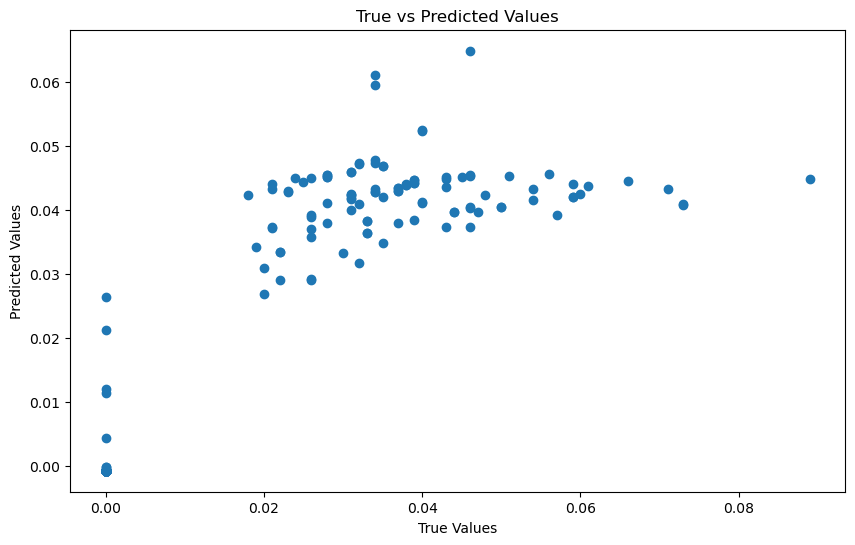

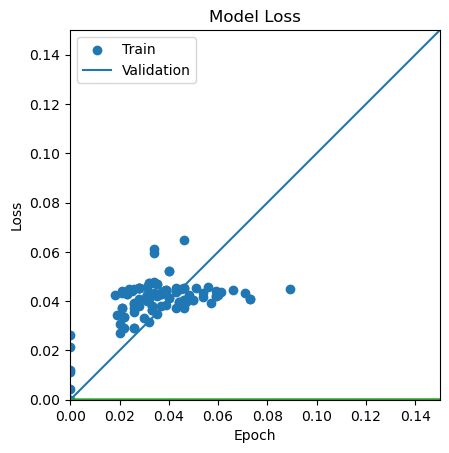

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 48ms/step - loss: 59.4317 - val_loss: 0.0060 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 33ms/step - loss: 0.0021 - val_loss: 0.0013 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 34ms/step - loss: 0.0015 - val_loss: 2.9951e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 32ms/step - loss: 0.0011 - val_loss: 3.7060e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 35ms/step - loss: 9.5703e-04 - val_loss: 3.7086e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 35ms/step - loss: 0.0010 - val_loss: 1.2872e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 35ms/step - loss: 8.3266e-04 - val_loss: 2.2833e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 36ms/step - loss: 6.8673e-04 - val_loss: 2.4179e-04 - lr: 0.0100
Epoch 9/200
30/30 [==============================] - 1s 33m

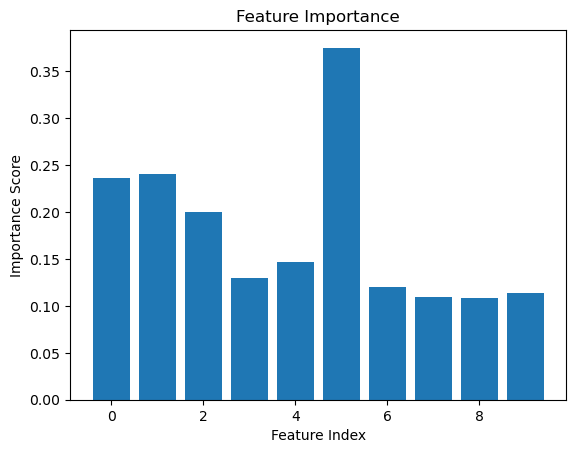

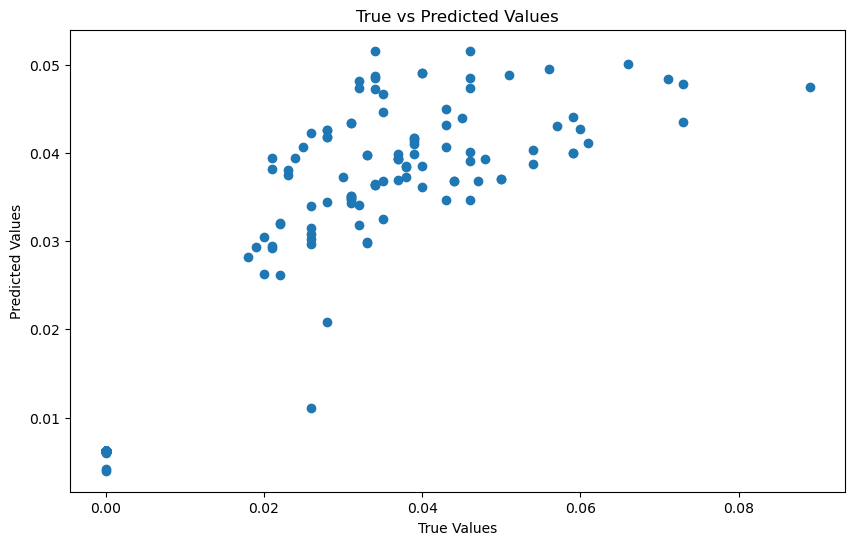

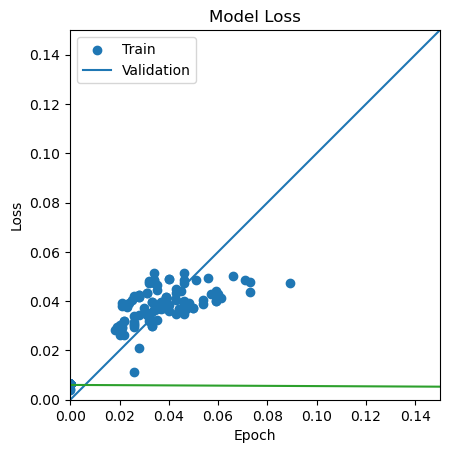

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 48ms/step - loss: 0.5786 - val_loss: 2.2446e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 34ms/step - loss: 6.5240e-04 - val_loss: 3.4296e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 33ms/step - loss: 5.9945e-04 - val_loss: 1.7228e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 36ms/step - loss: 6.8358e-04 - val_loss: 7.8110e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 35ms/step - loss: 6.6347e-04 - val_loss: 1.6066e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 34ms/step - loss: 6.3094e-04 - val_loss: 0.0011 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 33ms/step - loss: 6.4317e-04 - val_loss: 5.0336e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 35ms/step - loss: 5.9560e-04 - val_loss: 4.5278e-04 - lr: 0.0100
Epoch 9/200
30/30 [=====================

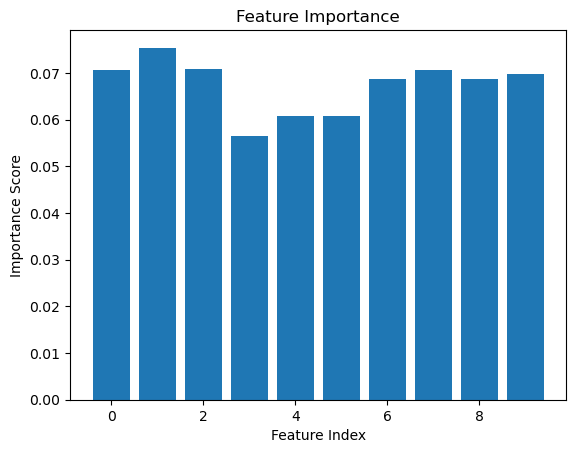

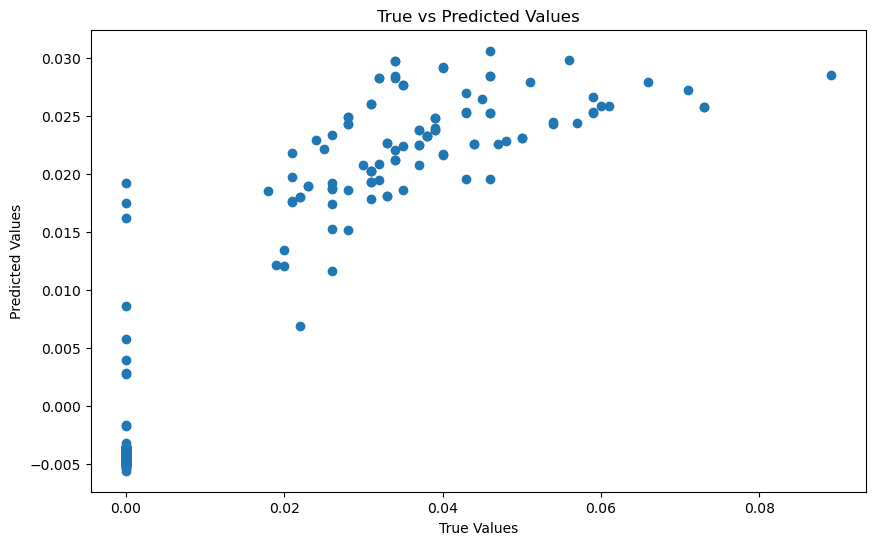

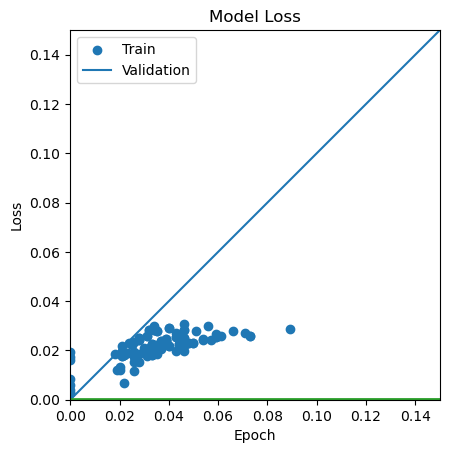

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 49ms/step - loss: 4.7672 - val_loss: 2.3618e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 35ms/step - loss: 8.5432e-04 - val_loss: 2.0397e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 36ms/step - loss: 7.7662e-04 - val_loss: 2.3223e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 36ms/step - loss: 7.3278e-04 - val_loss: 2.0079e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 33ms/step - loss: 7.5206e-04 - val_loss: 3.2434e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 33ms/step - loss: 7.3056e-04 - val_loss: 2.1357e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 35ms/step - loss: 8.0051e-04 - val_loss: 1.8375e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 38ms/step - loss: 5.8140e-04 - val_loss: 2.6053e-04 - lr: 0.0100
Epoch 9/200
30/30 [=================

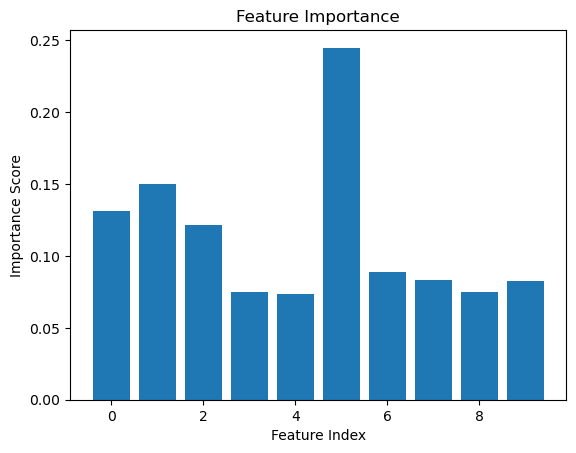

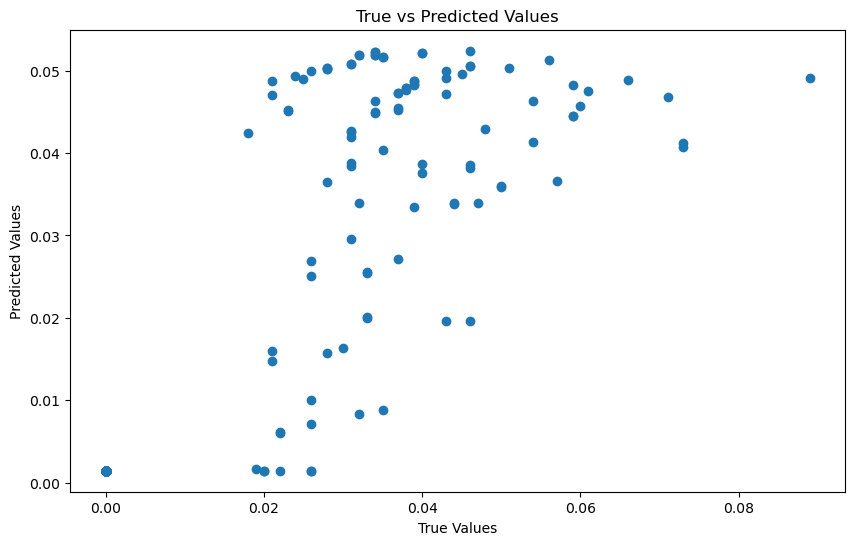

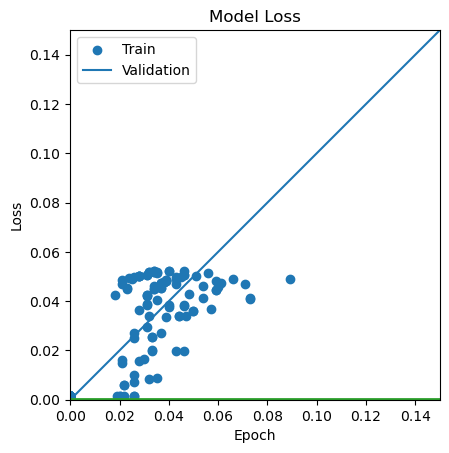

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 47ms/step - loss: 0.0438 - val_loss: 1.7786e-04 - lr: 0.0100
Epoch 2/200
30/30 [==============================] - 1s 37ms/step - loss: 8.9106e-04 - val_loss: 2.0981e-04 - lr: 0.0100
Epoch 3/200
30/30 [==============================] - 1s 34ms/step - loss: 0.0010 - val_loss: 1.7261e-04 - lr: 0.0100
Epoch 4/200
30/30 [==============================] - 1s 34ms/step - loss: 7.8806e-04 - val_loss: 3.8670e-04 - lr: 0.0100
Epoch 5/200
30/30 [==============================] - 1s 35ms/step - loss: 8.1337e-04 - val_loss: 2.5234e-04 - lr: 0.0100
Epoch 6/200
30/30 [==============================] - 1s 35ms/step - loss: 7.3738e-04 - val_loss: 5.1127e-04 - lr: 0.0100
Epoch 7/200
30/30 [==============================] - 1s 35ms/step - loss: 6.1346e-04 - val_loss: 4.5010e-04 - lr: 0.0100
Epoch 8/200
30/30 [==============================] - 1s 34ms/step - loss: 7.1855e-04 - val_loss: 2.1768e-04 - lr: 0.0100
Epoch 9/200
30/30 [=====================

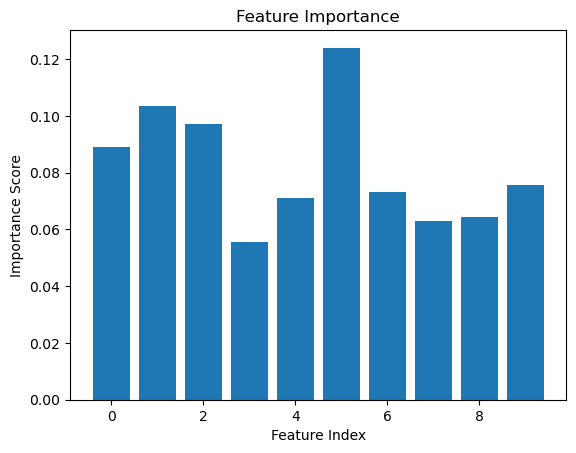

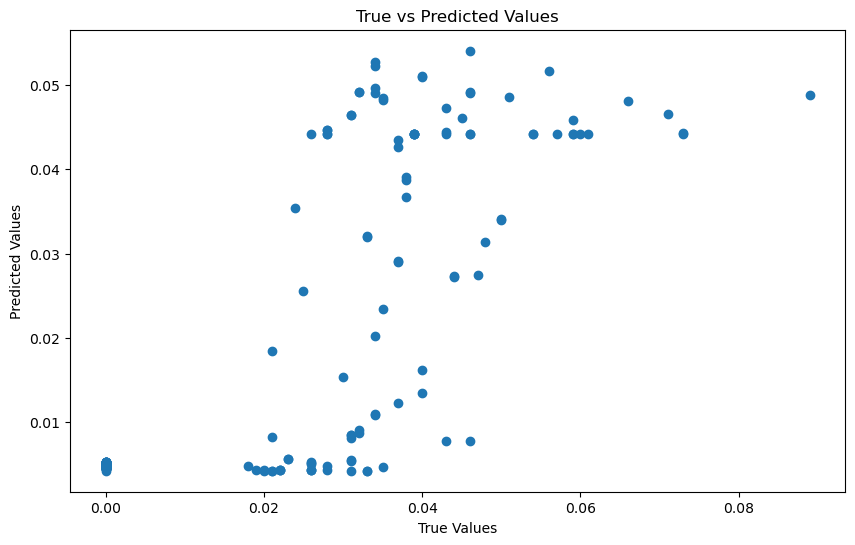

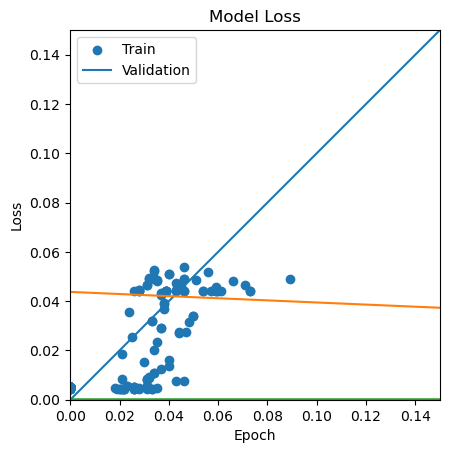

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 6s 33ms/step - loss: 49343598592.0000 - val_loss: 6.6365e-04 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 4s 32ms/step - loss: 0.0016 - val_loss: 4.5673e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 4s 31ms/step - loss: 14.0836 - val_loss: 4.1933e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 4s 31ms/step - loss: 0.0033 - val_loss: 0.0012 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 4s 32ms/step - loss: 0.0035 - val_loss: 0.0012 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 4s 31ms/step - loss: 0.0034 - val_loss: 0.0062 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 4s 31ms/step - loss: 0.0036 - val_loss: 0.0158 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 4s 31ms/step - loss: 0.0036 - val_loss: 0.0013 - lr: 0.1000
Epoch 9/200
118/118 [==============================] - 4s

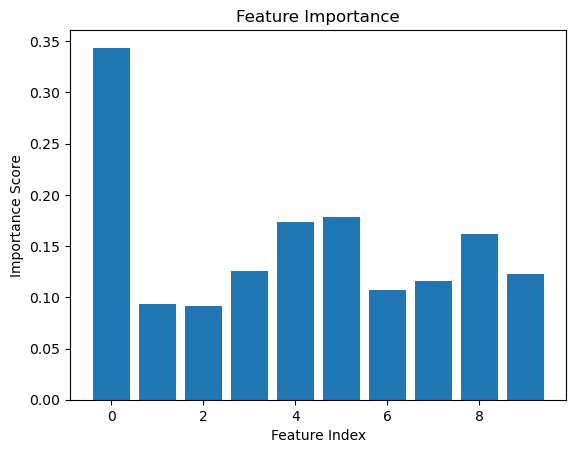

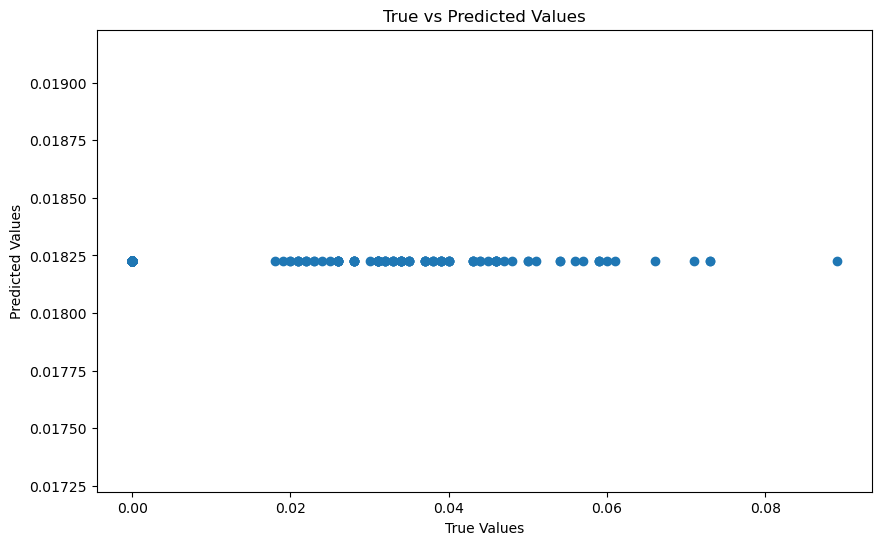

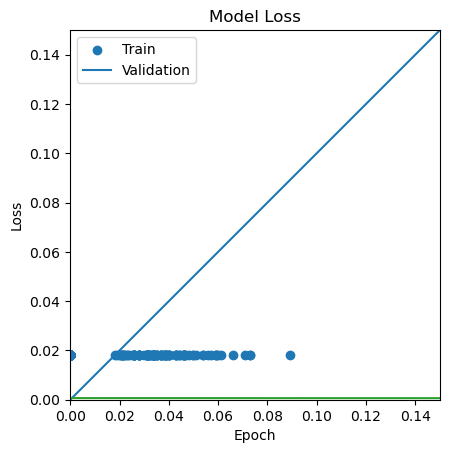

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 10s 59ms/step - loss: 20932112384.0000 - val_loss: 4.2606e-04 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 3s 26ms/step - loss: 0.0186 - val_loss: 5.0576e-04 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 10s 82ms/step - loss: 0.0066 - val_loss: 4.6371e-04 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 9s 76ms/step - loss: 0.0043 - val_loss: 0.0012 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 3s 28ms/step - loss: 0.0036 - val_loss: 0.0014 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 3s 26ms/step - loss: 0.0036 - val_loss: 0.0075 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 4s 30ms/step - loss: 0.0036 - val_loss: 0.0158 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 3s 29ms/step - loss: 0.0036 - val_loss: 0.0013 - lr: 0.1000
Epoch 9/200
118/118 [==============================] - 6

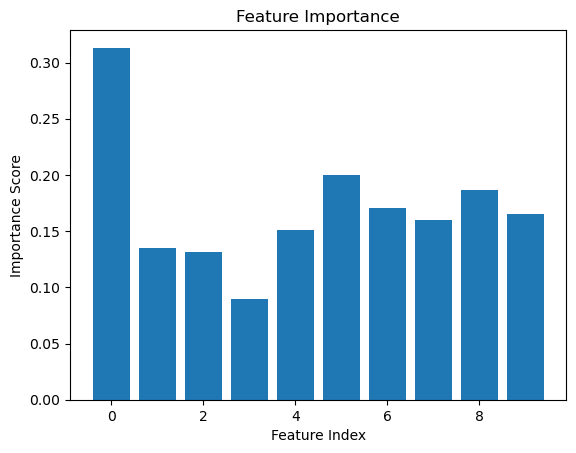

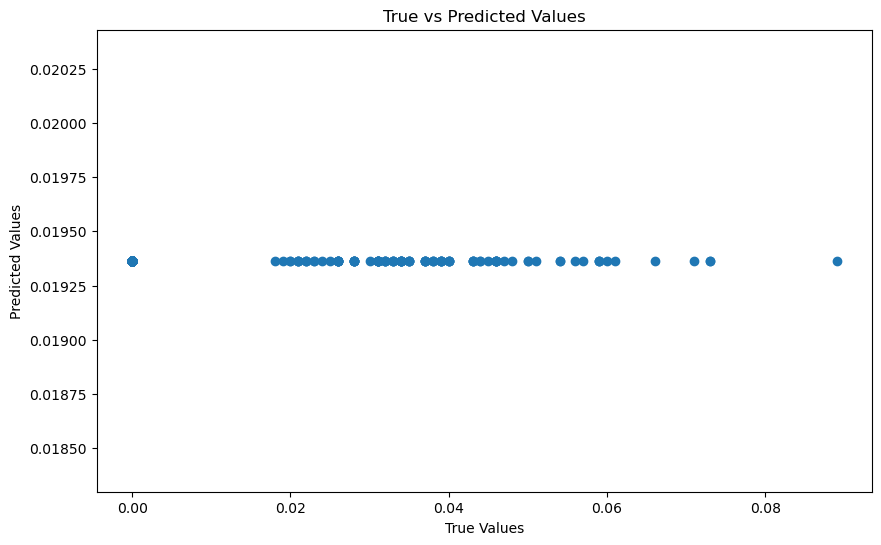

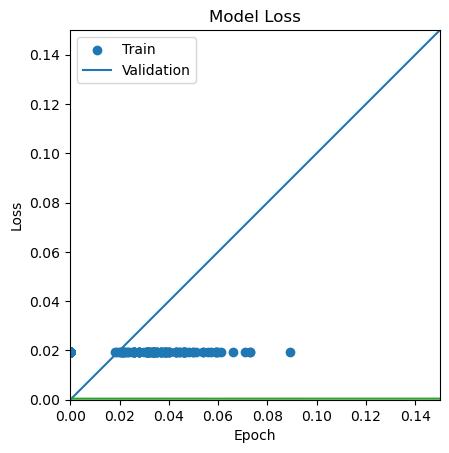

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 4s 22ms/step - loss: 5979835392.0000 - val_loss: 4.2745 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 2s 20ms/step - loss: 52.7528 - val_loss: 0.0012 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 2s 19ms/step - loss: 178.0706 - val_loss: 0.0204 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 2s 19ms/step - loss: 0.1193 - val_loss: 0.4522 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 2s 19ms/step - loss: 0.0499 - val_loss: 5.8566e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 2s 19ms/step - loss: 0.0034 - val_loss: 0.0051 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 2s 19ms/step - loss: 0.0038 - val_loss: 4.6357e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 2s 19ms/step - loss: 0.0138 - val_loss: 0.0047 - lr: 0.1000
Epoch 9/200
118/118 [==============================] - 2s 19

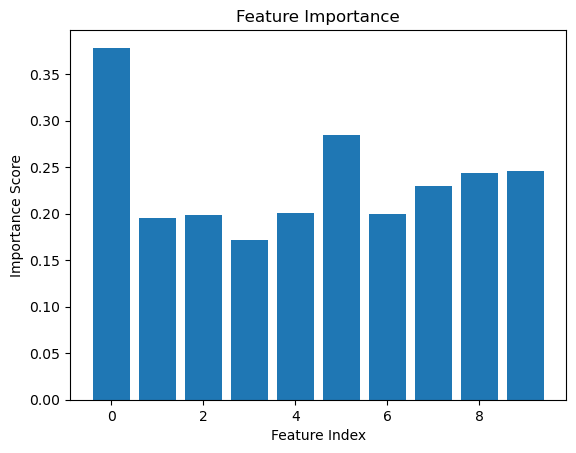

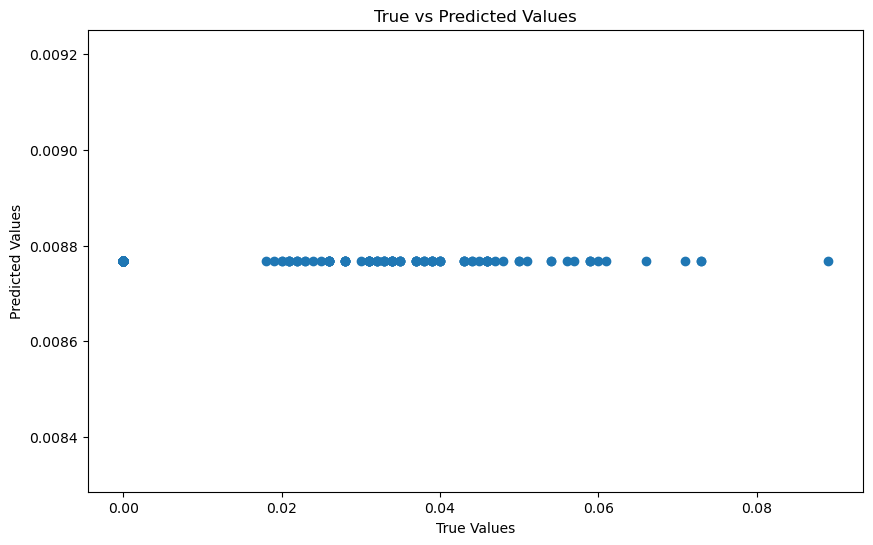

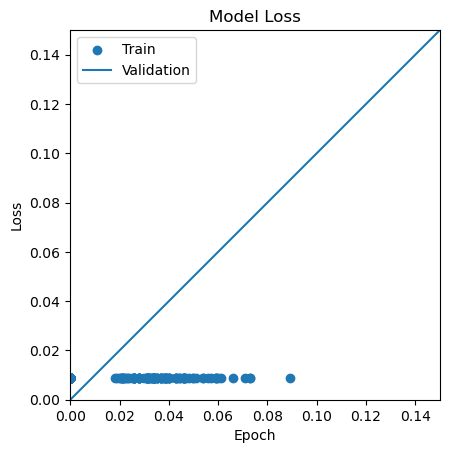

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
118/118 [==============================] - 4s 21ms/step - loss: 147688304.0000 - val_loss: 0.0106 - lr: 0.1000
Epoch 2/200
118/118 [==============================] - 2s 19ms/step - loss: 30990.7773 - val_loss: 0.5488 - lr: 0.1000
Epoch 3/200
118/118 [==============================] - 2s 19ms/step - loss: 374.2522 - val_loss: 0.0064 - lr: 0.1000
Epoch 4/200
118/118 [==============================] - 2s 19ms/step - loss: 1102.1154 - val_loss: 0.0565 - lr: 0.1000
Epoch 5/200
118/118 [==============================] - 2s 19ms/step - loss: 156.5356 - val_loss: 8.7210e-04 - lr: 0.1000
Epoch 6/200
118/118 [==============================] - 2s 19ms/step - loss: 171.7828 - val_loss: 0.0105 - lr: 0.1000
Epoch 7/200
118/118 [==============================] - 2s 19ms/step - loss: 1027.6603 - val_loss: 5.8681e-04 - lr: 0.1000
Epoch 8/200
118/118 [==============================] - 2s 19ms/step - loss: 0.0059 - val_loss: 0.0017 - lr: 0.1000
Epoch 9/200
118/118 [===========================

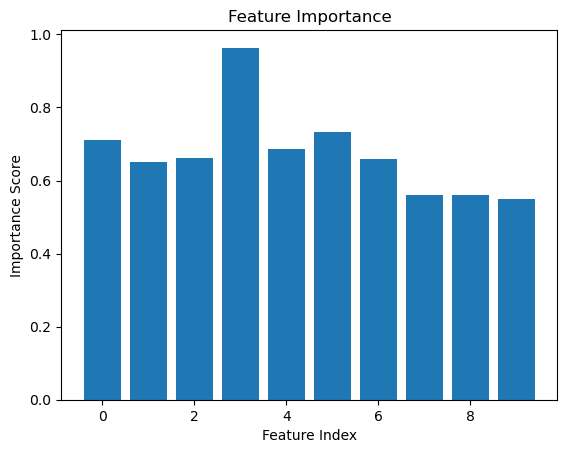

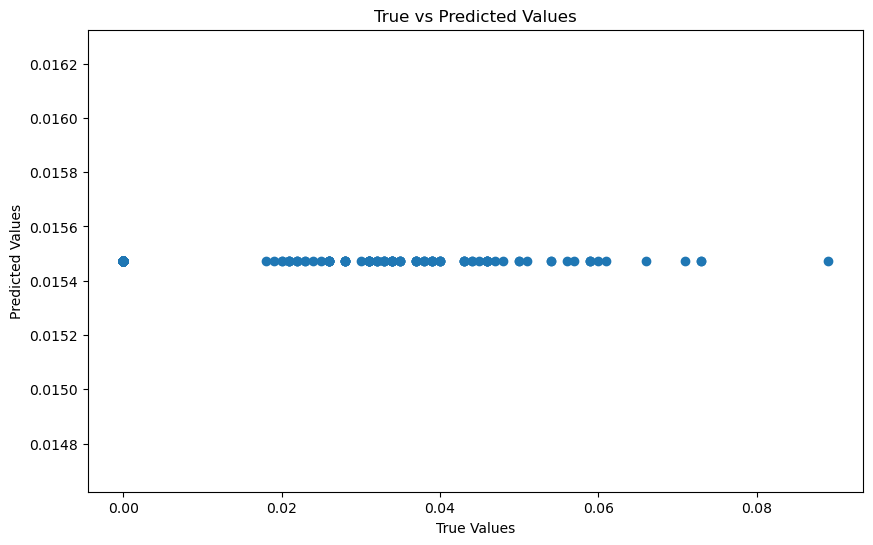

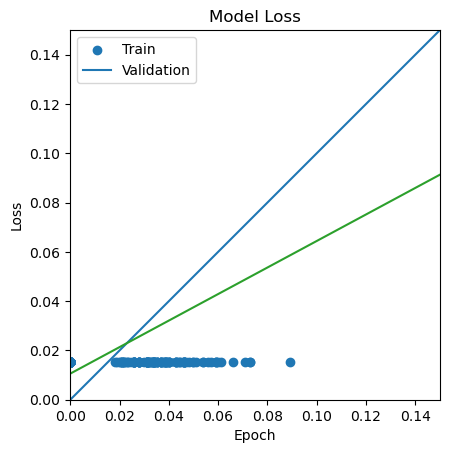

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 22ms/step - loss: 23553609728.0000 - val_loss: 14.8329 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 18ms/step - loss: 72.8156 - val_loss: 54.1075 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 18ms/step - loss: 36.3845 - val_loss: 33.7663 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 1s 17ms/step - loss: 28.0905 - val_loss: 44.1932 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 1s 19ms/step - loss: 3.0856 - val_loss: 6.2044e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0592 - val_loss: 0.0480 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0458 - val_loss: 0.0631 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 1s 18ms/step - loss: 0.0361 - val_loss: 0.0026 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 1s 18ms/step - loss: 0

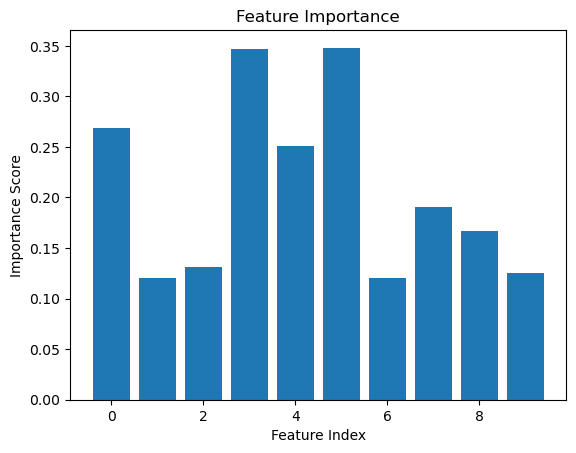

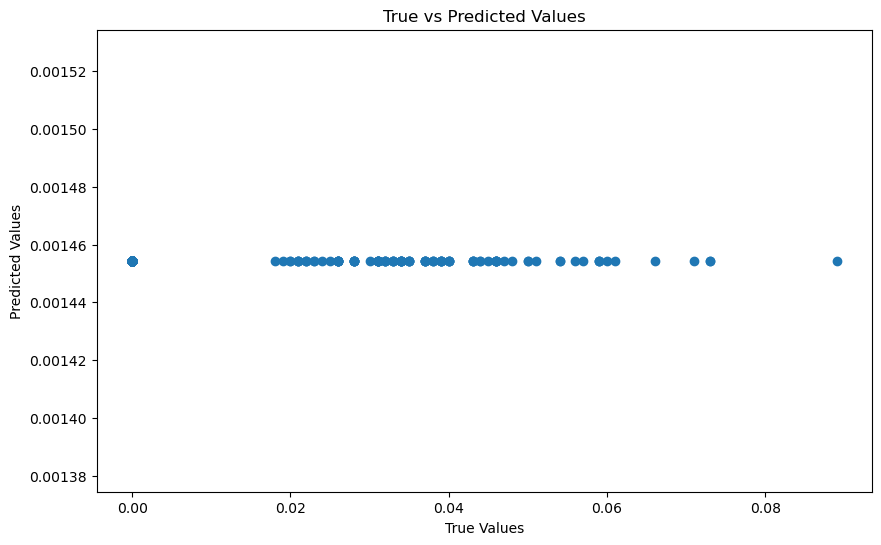

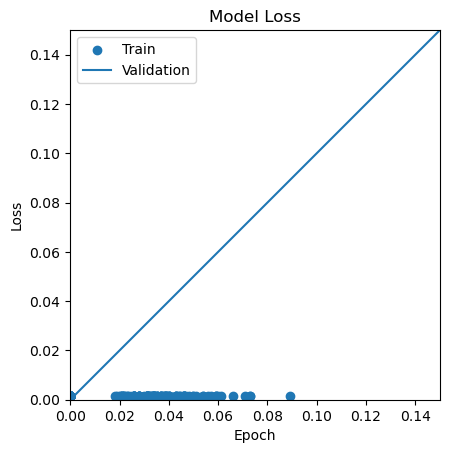

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 3s 24ms/step - loss: 3332279040.0000 - val_loss: 0.0011 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 19ms/step - loss: 3619.0918 - val_loss: 0.0011 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 19ms/step - loss: 30.7576 - val_loss: 6.5840e-04 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 1s 19ms/step - loss: 0.4617 - val_loss: 0.0029 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 1s 19ms/step - loss: 10.7473 - val_loss: 5.5980e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 1s 19ms/step - loss: 0.6608 - val_loss: 0.0065 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 20ms/step - loss: 69.1186 - val_loss: 0.0136 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 1s 19ms/step - loss: 11.4647 - val_loss: 0.0130 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 1s 19ms/step - loss

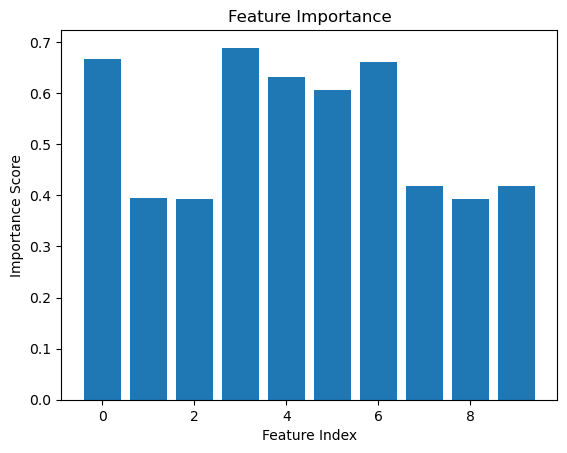

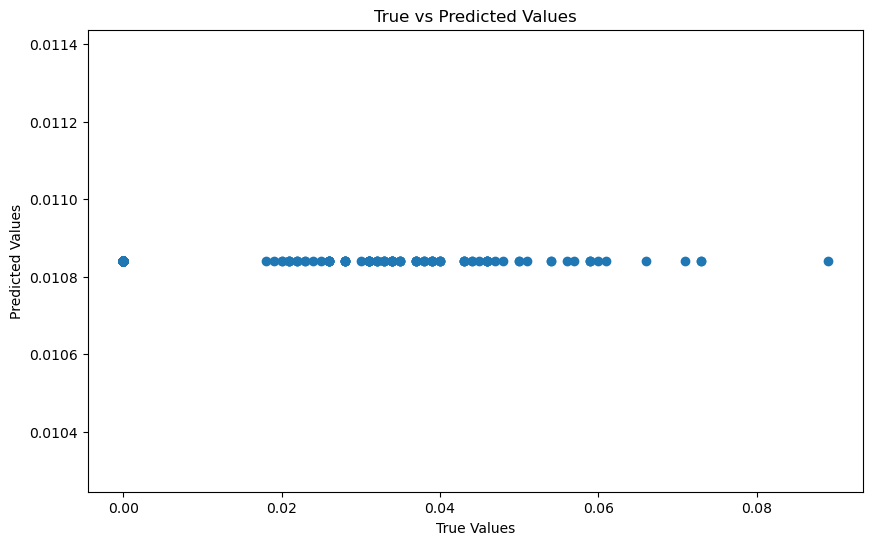

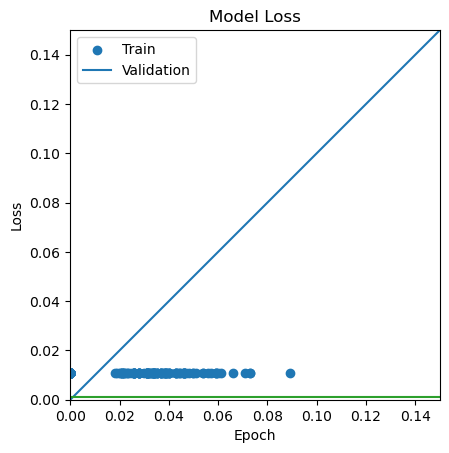

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 5s 53ms/step - loss: 252529456.0000 - val_loss: 0.0034 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 25ms/step - loss: 71.8311 - val_loss: 0.5728 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 22ms/step - loss: 21.2896 - val_loss: 0.0043 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 1s 22ms/step - loss: 0.3473 - val_loss: 0.0087 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 2s 28ms/step - loss: 0.2997 - val_loss: 0.0131 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 2s 32ms/step - loss: 0.4427 - val_loss: 4.9435e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 1s 22ms/step - loss: 2.1531 - val_loss: 8.3027e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 2s 33ms/step - loss: 10.7287 - val_loss: 4.4122e-04 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 1s 19ms/step - loss:

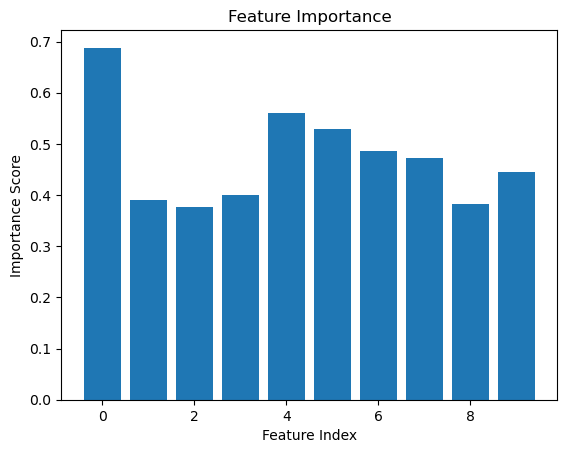

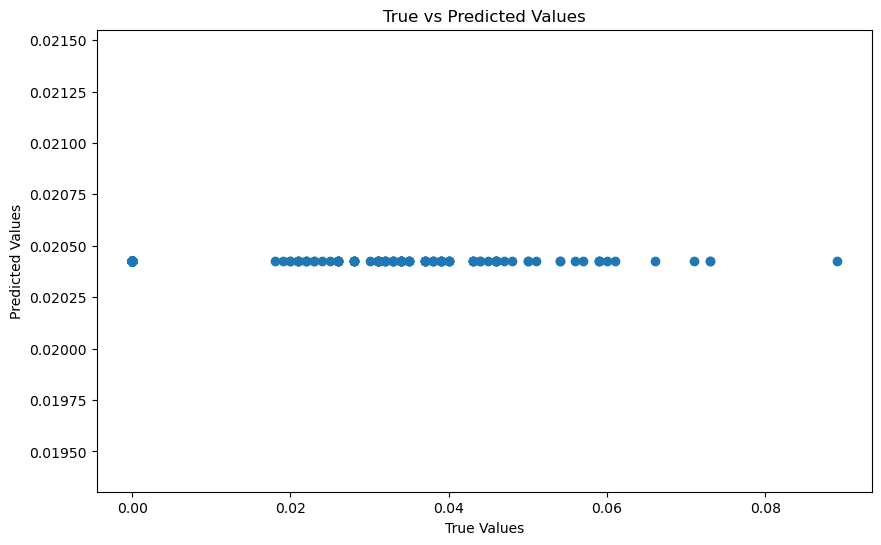

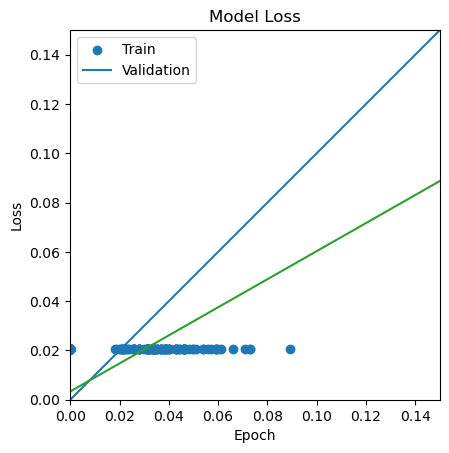

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
59/59 [==============================] - 4s 34ms/step - loss: 965014656.0000 - val_loss: 0.3417 - lr: 0.1000
Epoch 2/200
59/59 [==============================] - 1s 24ms/step - loss: 1179.8549 - val_loss: 0.0043 - lr: 0.1000
Epoch 3/200
59/59 [==============================] - 1s 19ms/step - loss: 165.0061 - val_loss: 0.0060 - lr: 0.1000
Epoch 4/200
59/59 [==============================] - 3s 52ms/step - loss: 35.7247 - val_loss: 7.7002e-04 - lr: 0.1000
Epoch 5/200
59/59 [==============================] - 3s 49ms/step - loss: 0.4454 - val_loss: 4.4278e-04 - lr: 0.1000
Epoch 6/200
59/59 [==============================] - 2s 31ms/step - loss: 5.2772 - val_loss: 5.4671e-04 - lr: 0.1000
Epoch 7/200
59/59 [==============================] - 3s 44ms/step - loss: 0.0222 - val_loss: 6.3968e-04 - lr: 0.1000
Epoch 8/200
59/59 [==============================] - 2s 40ms/step - loss: 0.0777 - val_loss: 0.0030 - lr: 0.1000
Epoch 9/200
59/59 [==============================] - 1s 21ms/step 

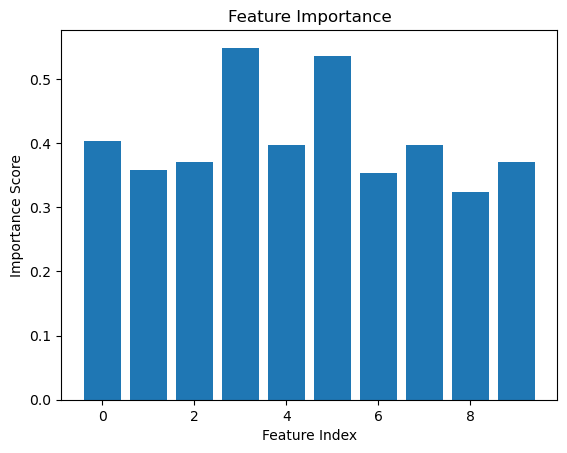

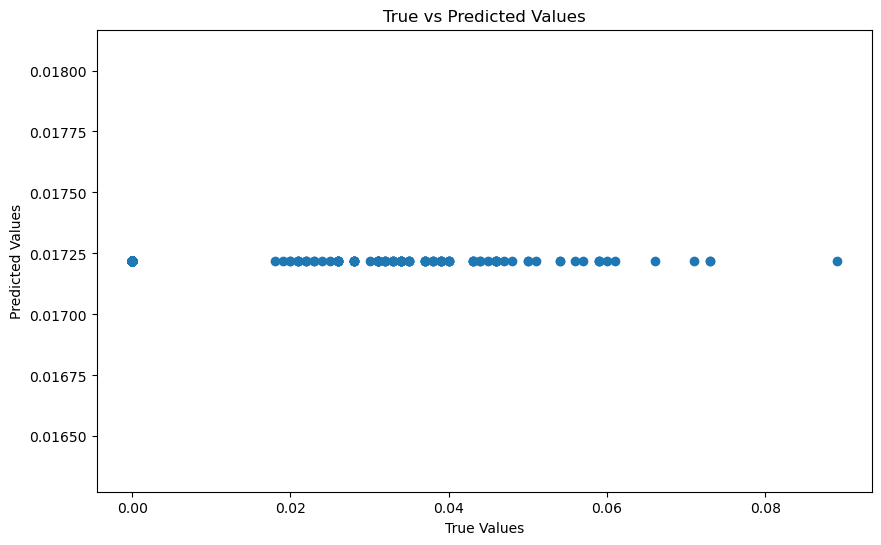

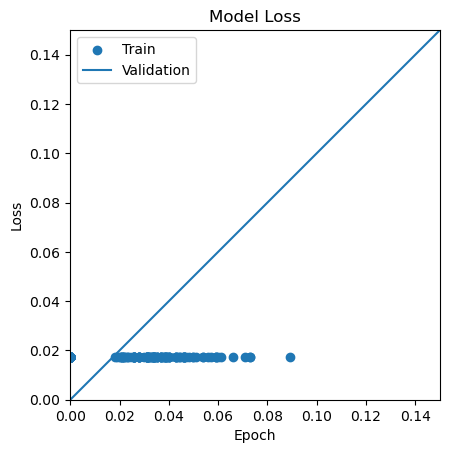

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 50ms/step - loss: 55042486272.0000 - val_loss: 0.0886 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 38ms/step - loss: 0.0215 - val_loss: 3.4554e-04 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 36ms/step - loss: 0.0016 - val_loss: 6.6651e-04 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 38ms/step - loss: 0.0015 - val_loss: 6.6548e-04 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 37ms/step - loss: 0.0106 - val_loss: 6.5846e-04 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 36ms/step - loss: 0.0016 - val_loss: 6.2642e-04 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 39ms/step - loss: 0.0015 - val_loss: 5.1701e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 37ms/step - loss: 0.0013 - val_loss: 4.1633e-04 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 50

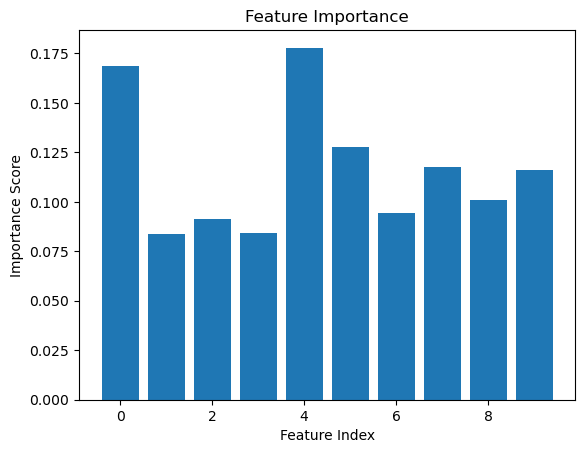

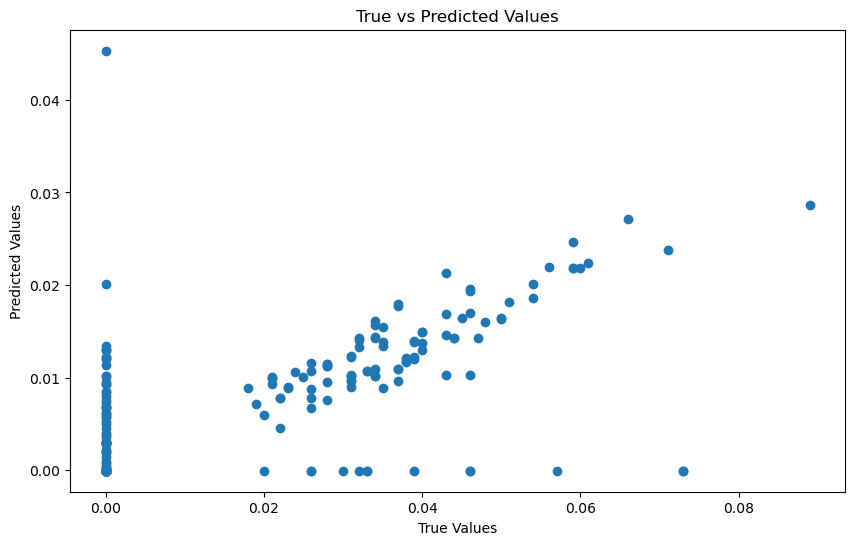

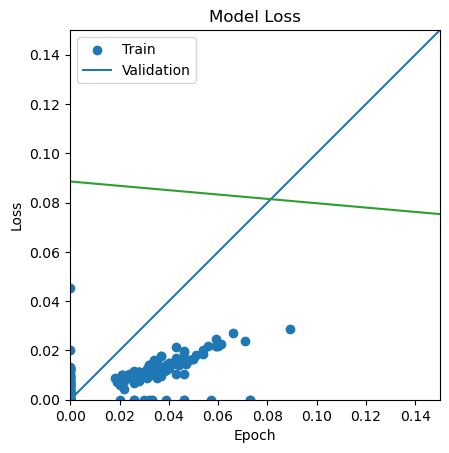

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 47ms/step - loss: 1228892544.0000 - val_loss: 109.3987 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 2s 65ms/step - loss: 929.6877 - val_loss: 8.4662 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 2s 53ms/step - loss: 122.0556 - val_loss: 4.5357e-04 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 48ms/step - loss: 20.5365 - val_loss: 4.9368e-04 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 37ms/step - loss: 71.9955 - val_loss: 4.2462e-04 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 38ms/step - loss: 6.7802 - val_loss: 8.8017e-04 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 34ms/step - loss: 21.2628 - val_loss: 0.0204 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 35ms/step - loss: 6.7363 - val_loss: 0.0047 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 35ms/s

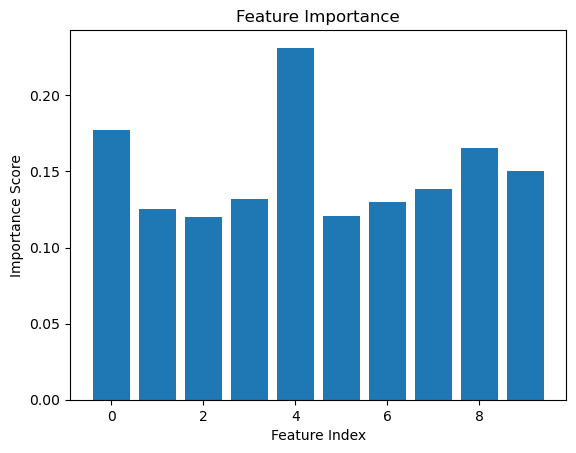

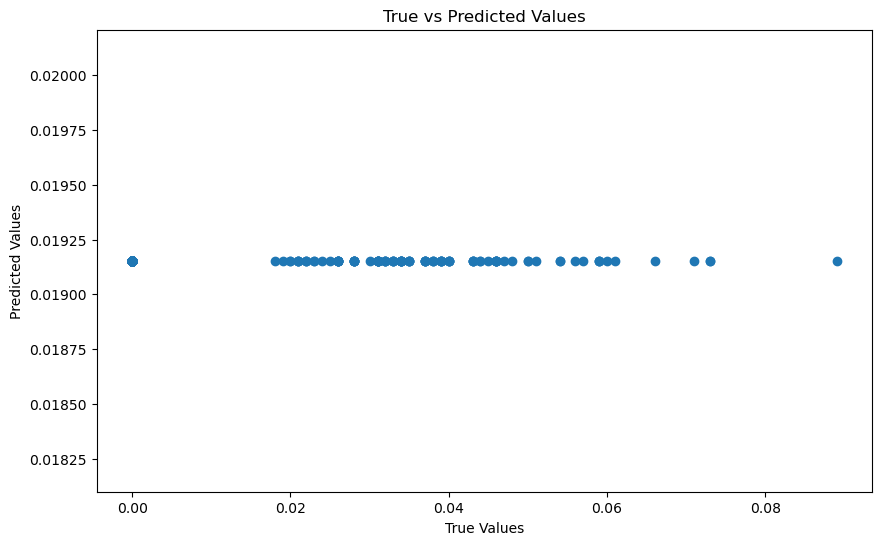

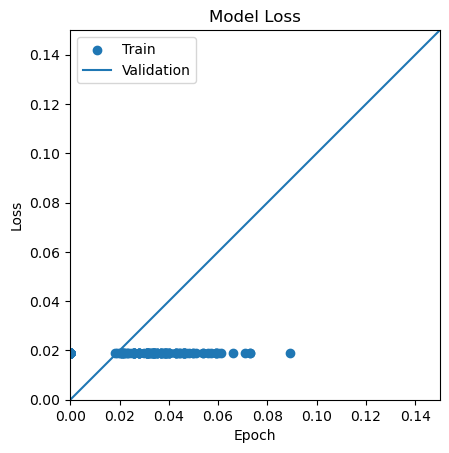

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 3s 49ms/step - loss: 2799027712.0000 - val_loss: 4.1616 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 34ms/step - loss: 127.5376 - val_loss: 0.3614 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 35ms/step - loss: 76.6553 - val_loss: 0.0767 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 35ms/step - loss: 22.3908 - val_loss: 0.1225 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 36ms/step - loss: 18.2531 - val_loss: 0.0475 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 35ms/step - loss: 33.7222 - val_loss: 0.0043 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 35ms/step - loss: 0.6703 - val_loss: 0.0017 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 36ms/step - loss: 0.1464 - val_loss: 0.0352 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 35ms/step - loss: 65.7684

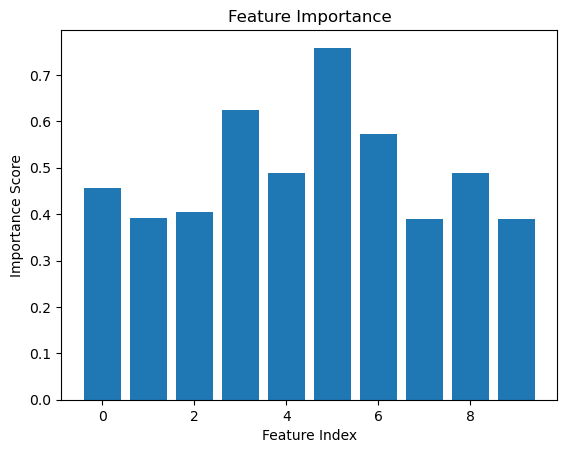

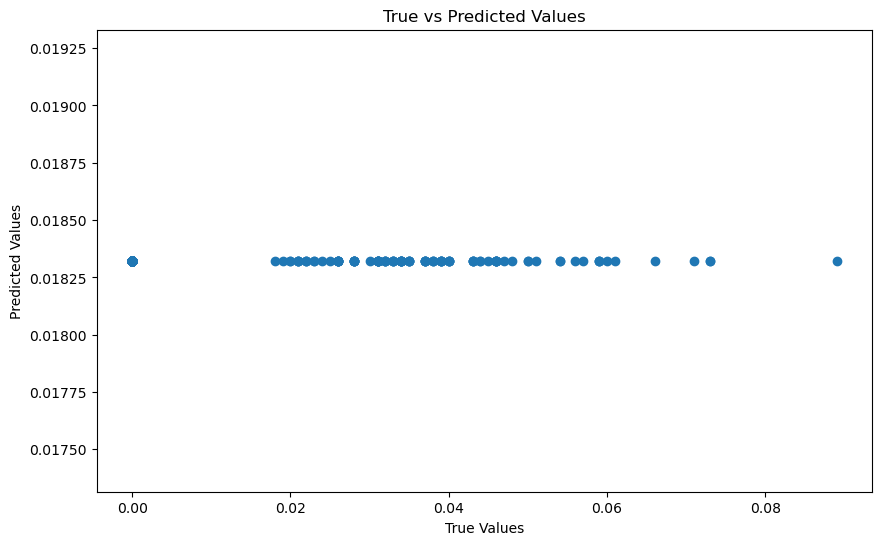

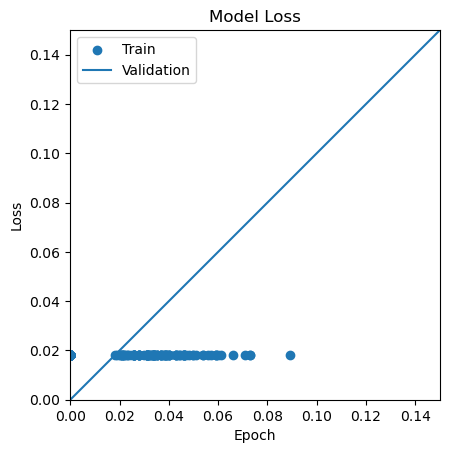

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


Epoch 1/200
30/30 [==============================] - 4s 56ms/step - loss: 116815760.0000 - val_loss: 83.2196 - lr: 0.1000
Epoch 2/200
30/30 [==============================] - 1s 41ms/step - loss: 105.3656 - val_loss: 50.4050 - lr: 0.1000
Epoch 3/200
30/30 [==============================] - 1s 39ms/step - loss: 50.5052 - val_loss: 0.3297 - lr: 0.1000
Epoch 4/200
30/30 [==============================] - 1s 41ms/step - loss: 40.9085 - val_loss: 0.2328 - lr: 0.1000
Epoch 5/200
30/30 [==============================] - 1s 42ms/step - loss: 5.1638 - val_loss: 0.0538 - lr: 0.1000
Epoch 6/200
30/30 [==============================] - 1s 42ms/step - loss: 0.9292 - val_loss: 0.0012 - lr: 0.1000
Epoch 7/200
30/30 [==============================] - 1s 42ms/step - loss: 0.1469 - val_loss: 6.2705e-04 - lr: 0.1000
Epoch 8/200
30/30 [==============================] - 1s 40ms/step - loss: 0.4778 - val_loss: 0.0072 - lr: 0.1000
Epoch 9/200
30/30 [==============================] - 1s 35ms/step - loss: 0.06

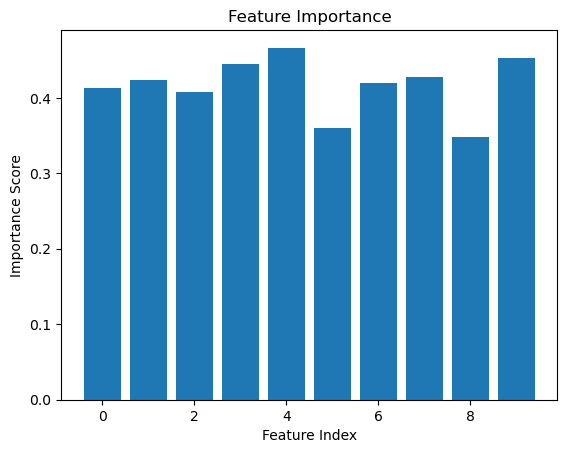

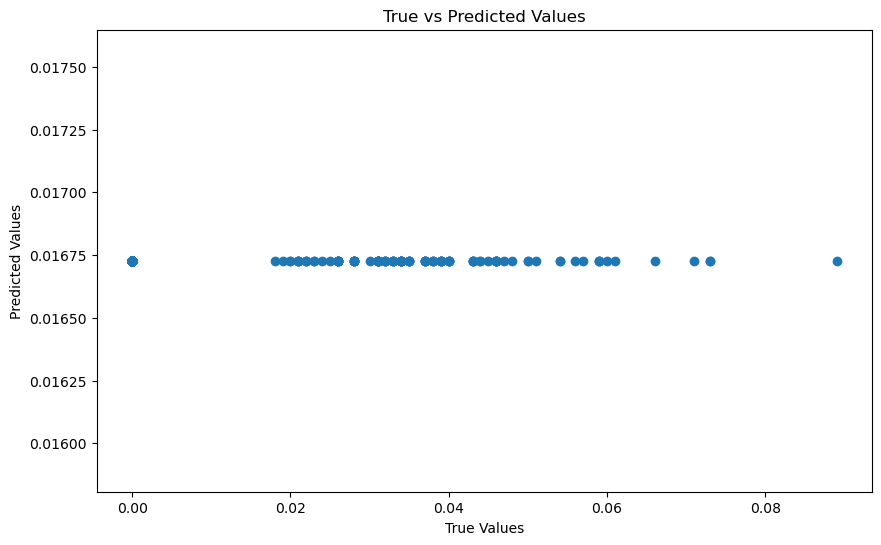

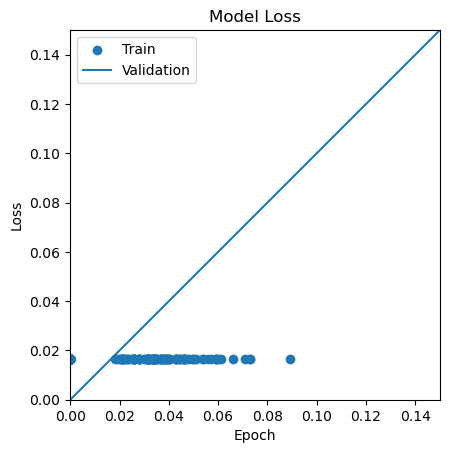

C:\Users\Gaurang\AppData\Local\Temp\ipykernel_10720\4175231185.py:164: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experiment_df = experiment_df.append(experiment_results, ignore_index=True)


In [54]:
#best_model = r'C:\Users\Gaurang\Desktop\AEROSOL EXPERIMENT\model_133_Nadam_5.760583735536784e-05.h5'

import itertools

optimizers = ['Nadam', 'Adam', 'SGD', 'rms']
learning_rates = [0.0001,0.001, 0.01, 0.1]
batch_sizes = [16,32, 64]
drop_outs = [0,0.2,0.3,0.4]

experiment_counter = 1

for optimizer in optimizers:
    for learning_rate in learning_rates:
        for batch_size in batch_sizes:
            for drop_out in drop_outs:
                    experiment_name = f'Experiment-{experiment_counter}'
                    experiment_result = run_experiment(experiment_name, X_train_scaled, y_train, X_val_scaled, y_val, X_test_scaled, y_test,
                                                  batch_size=batch_size, dropout_rate=drop_out, optimizer=optimizer,
                                                   learning_rate=learning_rate, lr_scheduler=lr_scheduler,best_model_weights=None)
                    experiment_counter += 1

In [64]:
experiment_result.head(30)

,Experiment Name,Optimizer,Learning Rate,Batch Size,Dropout Rate,MSE,RMSE,R2 Score (Training Set),R2 Score (Test Set),Adjusted R2 Score (Test Set),MAE
0,Experiment-82,Adam,0.0100,64,0.2,0.000043,0.006522,0.861724,0.900097,0.895753,0.003444
1,Experiment-83,Adam,0.0100,64,0.3,0.000046,0.006800,0.707196,0.891390,0.886668,0.003469
2,Experiment-25,Nadam,0.0100,16,0.0,0.000049,0.006971,0.693163,0.885858,0.880895,0.004931
3,Experiment-73,Adam,0.0100,16,0.0,0.000052,0.007216,0.753365,0.877679,0.872361,0.003817
4,Experiment-77,Adam,0.0100,32,0.0,0.000053,0.007281,0.808580,0.875480,0.870066,0.005232
5,Experiment-84,Adam,0.0100,64,0.4,0.000055,0.007388,0.706956,0.871786,0.866211,0.004144
6,Experiment-11,Nadam,0.0001,64,0.3,0.000056,0.007499,0.586268,0.867923,0.862180,0.005438
7,Experiment-15,Nadam,0.0010,16,0.3,0.000057,0.007573,0.706050,0.865295,0.859438,0.004240
8,Experiment-63,Adam,0.0010,16,0.3,0.000057,0.007575,0.697056,0.865233,0.859374,0.005064
9,Experiment-26,Nadam,0.0100,16,0.2,0.000061,0.007826,0.655622,0.856125,0.849870,0.005359


In [2]:
import tensorflow as tf

model = tf.keras.models.load_model('Experiment-82_Adam_4.253185397828929e-05.h5')
model_2 = tf.keras.models.load_model('Experiment-83_Adam_4.623869608622044e-05.h5')
model_3 = tf.keras.models.load_model('Experiment-77_Adam_5.3011957788839936e-05.h5')
model_4 = tf.keras.models.load_model('model_Final_1_Adam_4.171014006715268e-05.h5')
model_5 = tf.keras.models.load_model('Experiment-25_Nadam_4.859383261646144e-05.h5')

In [3]:
from sklearn.preprocessing import StandardScaler

import numpy as np

def predict_line(  input_features,scaler, model):
  
    

    # Create a numpy array from the user input

    
   

    # Scale the input features using the scaler
    scaled_features = scaler.transform(input_features)

    # Make predictions using the loaded model
    predictions = model.predict(scaled_features)
    predictions = np.clip(predictions , 0 , np.inf)
    # Inverse transform the predictions to get the original scale
 

    # Extract the predicted line
    line = predictions[0][0]
    #line = scaler.inverse_transform([[line]])[0][0]

    return line

import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")



In [4]:
#df_subset = test_df[50:101]  # Select rows 50 to 100 (inclusive)
#df_subset.head(50)
train_df

NameError: name 'train_df' is not defined

# Line prediction without Pressure actual vs Predicted

In [28]:
import pandas as pd
# tungsten parameters experiment 

input_features = np.array([[10,1020,1000,69.5,30.0,1, 30,650,29,2.4]])

# Create a DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Line'])

# Predict line using model 1
line = predict_line(input_features=input_features, scaler=scaler, model=model)
results_df = results_df.append({'Model': 'Model 1', 'Line': line}, ignore_index=True)

# Predict line using model 2
line2 = predict_line(input_features=input_features, scaler=scaler, model=model_2)
results_df = results_df.append({'Model': 'Model 2', 'Line': line2}, ignore_index=True)

# Predict line using model 3
line_3 = predict_line(input_features=input_features, scaler=scaler, model=model_3)
results_df = results_df.append({'Model': 'Model 3', 'Line': line_3}, ignore_index=True)

# Predict line using model 4
line_4 = predict_line(input_features=input_features, scaler=scaler, model=model_4)
results_df = results_df.append({'Model': 'Model 4', 'Line': line_4}, ignore_index=True)

# Predict line using model 5
line_5 = predict_line(input_features=input_features, scaler=scaler, model=model_5)
results_df = results_df.append({'Model': 'Model 5', 'Line': line_5}, ignore_index=True)

# Calculate final line based on average prediction
final_line = (line + line_3 +  line_4 +line2 + line_5) / 5
results_df = results_df.append({'Model': 'Final Avg Model', 'Line': final_line}, ignore_index=True)

# Use the results DataFrame as desired
results_df


1/1 [==============================] - 0s 24ms/step


,Model,Line
0,Model 1,0.044118
1,Model 2,0.046146
2,Model 3,0.019147
3,Model 4,0.018836
4,Model 5,0.050061
5,Final Avg Model,0.035662


In [165]:
# Model 4 is performing very good go with model 4 to train different models and train using them 

Individual Model Performance:
Model: xgboost
MSE: 0.00027284216725186365
R2: 0.35550140423495646
MAE: 0.007008461940646579
MAPE: 2859762486021.2617

Model: extra_trees
MSE: 0.00047694294078343873
R2: -0.12661858205818421
MAE: 0.006900207109484992
MAPE: 2303674781000.6597

Model: random_forest
MSE: 0.00015099674579440223
R2: 0.6433205629108315
MAE: 0.0073173017873834085
MAPE: 1458617889086.0122

Model: decision_tree
MSE: 0.0014906357615894039
R2: -2.521129687606837
MAE: 0.009768211920529802
MAPE: 0.2724321096390612

Model: cat_boost
MSE: 0.00012556103170109094
R2: 0.7034039517086028
MAE: 0.006235077008485527
MAPE: 4482846316907.786

Feature Importance:
Model: xgboost
Feature Importance: [0.03710317 0.02548446 0.07431209 0.00851235 0.01660044 0.7015194
 0.02364862 0.08945236 0.02336704 0.        ]

Model: extra_trees
Feature Importance: [0.09787326 0.22329315 0.26544457 0.02343085 0.01935058 0.278045
 0.00224708 0.0680745  0.00517276 0.01706824]

Model: random_forest
Feature Importance: 

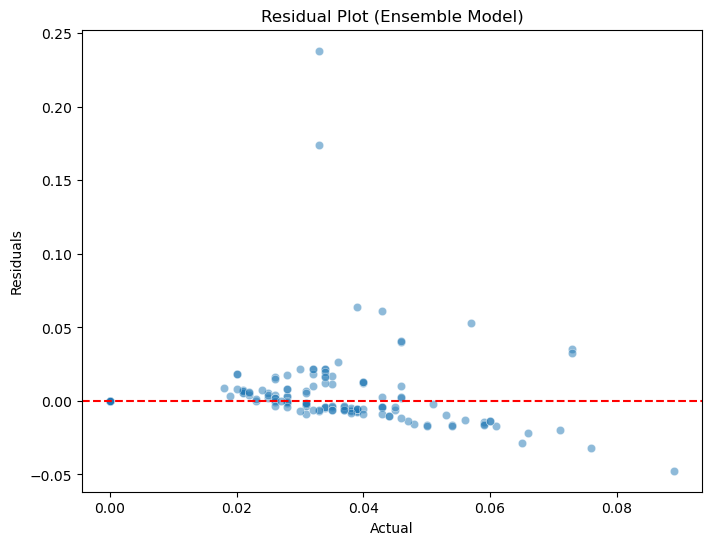

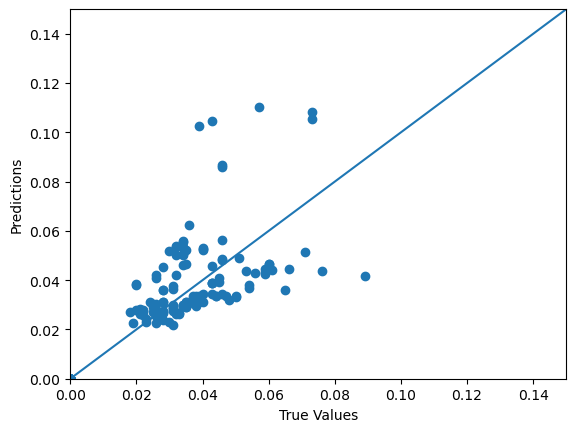

In [182]:
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
import catboost as cb
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define your X_train_scaled, X_test_scaled, y_train, and y_test

# Train and evaluate each individual model
model_scores = {}
feature_importance = {}

decision_tree = DecisionTreeRegressor()
extra_trees = ExtraTreesRegressor(n_estimators=100, max_depth=10, random_state=42)
random_forest = RandomForestRegressor(bootstrap=True, max_features=0.5,
                                      min_samples_leaf=20, min_samples_split=14, n_estimators=100)

xgboost = xgb.XGBRegressor(n_estimators=100, max_depth=3, random_state=42)
cat_boost = cb.CatBoostRegressor(n_estimators=100, max_depth=3, silent=True, random_state=42)

models = {
    'xgboost': xgboost,
    'extra_trees': extra_trees,
    'random_forest': random_forest,
    'decision_tree': decision_tree,
    'cat_boost': cat_boost
}

for model_name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    mse = metrics.mean_squared_error(y_test, y_pred)
    r2 = metrics.r2_score(y_test, y_pred)
    mae = metrics.mean_absolute_error(y_test, y_pred)
    mape = metrics.mean_absolute_percentage_error(y_test, y_pred)

    model_scores[model_name] = {'MSE': mse, 'R2': r2, 'MAE': mae, 'MAPE': mape}

    if hasattr(model, 'feature_importances_'):
        feature_importance[model_name] = model.feature_importances_

# Print the performance of each individual model
print("Individual Model Performance:")
for model_name, scores in model_scores.items():
    print(f"Model: {model_name}")
    print(f"MSE: {scores['MSE']}")
    print(f"R2: {scores['R2']}")
    print(f"MAE: {scores['MAE']}")
    print(f"MAPE: {scores['MAPE']}")
    print()

# Print the feature importance of each individual model
print("Feature Importance:")
for model_name, importance in feature_importance.items():
    print(f"Model: {model_name}")
    print(f"Feature Importance: {importance}")
    print()

# Train the ensemble model on the training data
ensemble = RandomForestRegressor()  # Define your ensemble model here
ensemble.fit(X_train_scaled, y_train)

# Evaluate the ensemble model
y_pred_ensemble = ensemble.predict(X_test_scaled)
mse_ensemble = metrics.mean_squared_error(y_test, y_pred_ensemble)
r2_ensemble = metrics.r2_score(y_test, y_pred_ensemble)
mae_ensemble = metrics.mean_absolute_error(y_test, y_pred_ensemble)
mape_ensemble = metrics.mean_absolute_percentage_error(y_test, y_pred_ensemble)

# Print the performance of the ensemble model
print("Ensemble Model Performance:")
print(f"MSE: {mse_ensemble}")
print(f"R2: {r2_ensemble}")
print(f"MAE: {mae_ensemble}")
print(f"MAPE: {mape_ensemble}")

# Calculate the adjusted R-squared error
num_features = X_test_scaled.shape[1]
adj_r2_ensemble = 1 - (1 - r2_ensemble) * (len(y_test) - 1) / (len(y_test) - num_features - 1)
print(f"Adjusted R-squared Score: {adj_r2_ensemble}")

# Plot the residuals
residuals_ensemble = y_pred_ensemble - y_test
plt.figure(figsize=(8, 6))
sns.scatterplot(y_test, residuals_ensemble, alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('Actual')
plt.ylabel('Residuals')
plt.title('Residual Plot (Ensemble Model)')
plt.show()

# Plot the predicted values against the actual values for the ensemble model
plt.scatter(y_test, y_pred_ensemble)
plt.xlabel('True Values')
plt.ylabel('Predictions')
lims = [0, 0.150]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

# Create a dataframe for the actual and predicted values for the ensemble model
results_df_ensemble = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_ensemble})


Model: LinearRegression
Train Score: 0.5714349675535617
Test Score: 0.5643605397924942
Mean Squared Error (MSE): 0.00018442369811893182
R-squared (R2) Score: 0.5643605397924942
Explained Variance Score (EVS): 0.6874862475555643
Max Error: 0.03944658222963161

Model: Ridge
Train Score: 0.5718881339528462
Test Score: 0.6010421793220728
Mean Squared Error (MSE): 0.00016889488534359658
R-squared (R2) Score: 0.6010421793220728
Explained Variance Score (EVS): 0.6812837528545497
Max Error: 0.038376062508765824

Model: KNeighborsRegressor
Train Score: 0.8794936012902965
Test Score: 0.7994132781080292
Mean Squared Error (MSE): 8.491642384105959e-05
R-squared (R2) Score: 0.7994132781080292
Explained Variance Score (EVS): 0.8235918510905893
Max Error: 0.052399999999999995

Model: DecisionTreeRegressor
Train Score: 0.9997291002887705
Test Score: -2.420487320488408
Mean Squared Error (MSE): 0.001448029801324503
R-squared (R2) Score: -2.420487320488408
Explained Variance Score (EVS): -2.388288027656

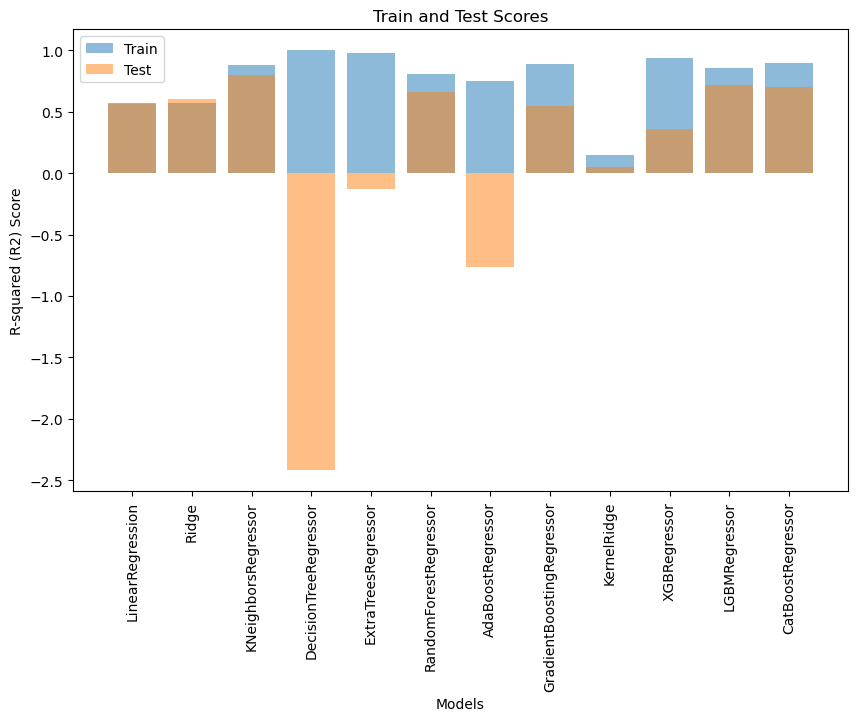

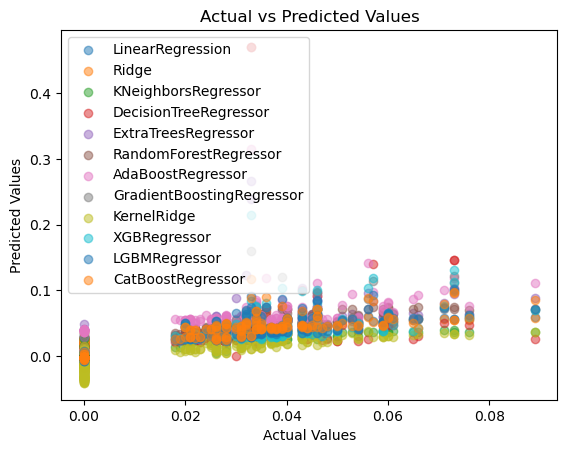

In [177]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, max_error
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.isotonic import IsotonicRegression
from sklearn.kernel_ridge import KernelRidge
import xgboost as xgb
import lightgbm as lgb
import catboost as cb




# Create the individual regressor models with hyperparameters
models = [
    LinearRegression(),
    Ridge(),
    KNeighborsRegressor(),
    DecisionTreeRegressor(),
    ExtraTreesRegressor(n_estimators=100, max_depth=10, random_state=42),
    RandomForestRegressor(bootstrap=True, max_features=0.5,
                                          min_samples_leaf=20, min_samples_split=14, n_estimators=100),
    AdaBoostRegressor(n_estimators=100, random_state=42),
    GradientBoostingRegressor(n_estimators=100, max_depth=3, random_state=42),
    KernelRidge(),
    xgb.XGBRegressor(n_estimators=100, max_depth=3, random_state=42),
    lgb.LGBMRegressor(n_estimators=100, max_depth=3, random_state=42),
    cb.CatBoostRegressor(n_estimators=100, max_depth=3, silent=True, random_state=42)
]

# Fit the models and make predictions
model_names = []
train_scores = []
test_scores = []
model_predictions = []

for model in models:
    model.fit(X_train_scaled, y_train)
    model_name = type(model).__name__
    model_names.append(model_name)
    train_score = model.score(X_train_scaled, y_train)
    train_scores.append(train_score)
    model_predictions.append(model.predict(X_test_scaled))

    # Calculate the evaluation metrics on the test set
    mse = mean_squared_error(y_test, model_predictions[-1])
    r2 = r2_score(y_test, model_predictions[-1])
    evs = explained_variance_score(y_test, model_predictions[-1])
    max_err = max_error(y_test, model_predictions[-1])
    test_score = r2

    print(f"Model: {model_name}")
    print(f"Train Score: {train_score}")
    print(f"Test Score: {test_score}")
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"R-squared (R2) Score: {r2}")
    print(f"Explained Variance Score (EVS): {evs}")
    print(f"Max Error: {max_err}")
    print()

    # Append the test score
    test_scores.append(test_score)

# Plot the train and test scores
plt.figure(figsize=(10, 6))
plt.bar(model_names, train_scores, alpha=0.5, label='Train')
plt.bar(model_names, test_scores, alpha=0.5, label='Test')
plt.xlabel('Models')
plt.ylabel('R-squared (R2) Score')
plt.title('Train and Test Scores')
plt.xticks(rotation=90)
plt.legend()
plt.show()

# Plot the predicted values against the actual values for each model
for model_name, y_pred in zip(model_names, model_predictions):
    plt.scatter(y_test, y_pred, alpha=0.5, label=model_name)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()


# Neural Network 















